# Modeling

In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from IPython import display
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV, RepeatedKFold
from sklearn.metrics import r2_score, mean_squared_error as mse, mean_absolute_error as mae, SCORERS
from sklearn.dummy import DummyRegressor
from catboost import Pool, CatBoostRegressor, cv
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from hyperopt import fmin, tpe, hp, Trials
from sklearn.inspection import permutation_importance

In [2]:
#load dataframe OHE
#parse datetime column
df_ohe = pd.read_csv('ohe_data.csv', parse_dates=['date'])
df_ohe.drop(columns='Unnamed: 0', inplace=True)
df_ohe.set_index('date', inplace=True)

In [3]:
df_ohe.head()

,Avg_Temp(F),Conf_Cases,day_of_week,day_of_year,Year,Month,Day,new_case_percent_pop*,state_id_CT,state_id_MA,state_id_ME,state_id_VT
date,,,,,,,,,,,,
2020-03-01,26.42,1.0,6,61,2020,3,1,0.014225,0,1,0,0
2020-03-02,36.50,1.0,0,62,2020,3,2,0.014225,0,1,0,0
2020-03-03,55.94,1.0,1,63,2020,3,3,0.014225,0,1,0,0
2020-03-04,46.94,2.0,2,64,2020,3,4,0.028450,0,1,0,0
2020-03-05,42.98,8.0,3,65,2020,3,5,0.113799,0,1,0,0


## Train-test split

Before training any models on the data, let's do a train-test split to keep training and testing data consistent and separated.

In [4]:
len(df_ohe)

2224

In [5]:
bins = np.linspace(0, 2224, 200)

In [6]:
# Create features
X, y = df_ohe.drop(columns=['Conf_Cases', 'new_case_percent_pop*']), df_ohe['new_case_percent_pop*']

In [7]:
y_binned = np.digitize(y, bins)

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y_binned, random_state=42)

## Using the mean as a baseline prediction model

Previously, we determined the R2 score of using the mean to predict COVID19 cases for each individual state. Let's do the same thing now that we have all the states in one DataFrame, so that we will have a baseline "dummy" model to compare our future optimized models to. 

In [9]:
dummy_mean = DummyRegressor()
# "Train" dummy regressor
dummy_mean.fit(X_train, y_train)
# Get R2 score
score_dummy = dummy_mean.score(X_test, y_test)
print("The R2 score of using the mean to predict COVID19 cases in our states is:", score_dummy)

The R2 score of using the mean to predict COVID19 cases in our states is: -0.0008611149015183006


Let's store the evaluation metric values for the dummy regressor so we can compare them with our future models. 

In [10]:
dummy_pred = dummy_mean.predict(X_test)
dummy_r2 = r2_score(y_test, dummy_pred)
dummy_mse = mse(y_test, dummy_pred)
dummy_rmse = np.sqrt(mse(y_test, dummy_pred))

## Tuning the top performing models for ensemble model

In the pre-processing step, we determined (with the help of Pycaret) that our top performing models were **CatBoost Regressor**, **Random Forest Regressor**, and **Extra Trees Regressor**. Let's now fine tune the hyperparameters of each of these models, using Coarse to Fine hyperparameter tuning, as well as Bayesian Optimization (where applicable), in preparation for feeding them into the pipeline of the Voting Regressor. 

### 1. Random Forest Regressor
With a few exceptions, a RandomForestClassifier has all the hyperparameters of a DecisionTreeClassifier (to control how trees are grown), plus all the hyperparameters of a BaggingClassifier to control the ensemble itself. I'll explore a couple different ways to determine optimal hyperparameters and will choose those that produce the best R2 and MSE for the final ensemble model (a VotingRegressor).

First, let's run a basic hyperparameter grid search and check the resulting R2, MSE, and RMSE. Then we'll put these values in a DataFrame with the those obtained from the dummy regressor (above) and compare the results of each set of hyperparameters determined throughout the course of the Coarse to Fine hyperparameter tuning process.

In [11]:
# Define parameters to search for GridSearchCV
basic_param_grid = {'n_estimators': [100, 300, 500, 900, 1200],
              'max_depth': [3, 5, 20, 50, 100],
              }
# Instantiate RandomForestRegressor
basic_rf = RandomForestRegressor(random_state=42)
cv_rf = GridSearchCV(basic_rf, basic_param_grid, cv = 5)
cv_rf_fit = cv_rf.fit(X_train, y_train)

In [12]:
print('The optimal max_depth for the RandomForestRegressor is: {}'.format(cv_rf_fit.best_params_['max_depth']))
print('The optimal n_estimators for the RandomForestRegressor is: {}'.format(cv_rf_fit.best_params_['n_estimators']))

The optimal max_depth for the RandomForestRegressor is: 50
The optimal n_estimators for the RandomForestRegressor is: 300


In [13]:
# Instantiate RFR with optimal hyperparameters
basic_rf = RandomForestRegressor(max_depth = 50, n_estimators = 300, random_state=42)
basic_rf.fit(X_train, y_train)
basic_rf_pred = basic_rf.predict(X_test)

In [14]:
# Calculate evaluation metrics on basic_rf
basic_rf_r2 = r2_score(y_test, basic_rf_pred)
basic_rf_mse = mse(y_test, basic_rf_pred)
basic_rf_rmse = np.sqrt(basic_rf_mse)

In [15]:
# Create RF results dataframe
rf_results = pd.DataFrame({'Model':['dummy_reg', 'basic_rf'], 'R2': [dummy_r2, basic_rf_r2], 'MSE':[dummy_mse, basic_rf_mse], 'RMSE':[dummy_rmse, basic_rf_rmse]})

In [16]:
rf_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_rf,0.849384,42.810904,6.543004


***

#### Using RandomSearchCV to find optimal hyperparameter values
Now let's perform RandomizedSearchCV across a broader range of hyperparameters (and values) to get an idea of where to focus a grid search of a more comprehensive range of hyperparamters than those evaluated in the basic grid search above.

In [17]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(20, 120, num = 11)]
max_depth.append(None)
#max_depth.append(9)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4, 10]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [18]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, n_jobs=-1, random_state=42)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   53.2s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  2.5min finished


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [20, 30, 40, 50, 60, 70,
                                                      80, 90, 100, 110, 120,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4, 10],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000]},
                   random_state=42, verbose=2)

In [19]:
rf_random.best_params_

{'n_estimators': 900,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 90,
 'bootstrap': True}

In [20]:
# Instantiate RFR with optimal hyperparameters
rf2 = RandomForestRegressor(n_estimators= 900,
                             min_samples_split= 2,
                             min_samples_leaf= 2,
                             max_features= 'auto',
                             max_depth= 90,
                             bootstrap= True, 
                             random_state=42)
rf2.fit(X_train, y_train)
rf_pred2 = rf2.predict(X_test)

In [21]:
# Determine R2, MSE, RMSE 
rf_random_r2 = r2_score(y_test, rf_pred2)
rf_random_mse = mse(y_test, rf_pred2)
rf_random_rmse = np.sqrt(mse(y_test, rf_pred2))

In [22]:
# Add results to rf_results df
rf_results.loc[len(rf_results)]= ['rf_randomCV', 
                                 r2_score(y_test, rf_pred2),
                                 mse(y_test, rf_pred2),
                                 np.sqrt(mse(y_test, rf_pred2))]

In [23]:
rf_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_rf,0.849384,42.810904,6.543004
2,rf_randomCV,0.849289,42.838057,6.545079


***

### Using GridSearchCV to find the optimal hyperparameter values
We can now use the insights we gained from the above random search to perform a grid search across a broader range of hyperparameters (with more focused values).

In [24]:
# Create the parameter grid based on the results of random search 
GS_param_grid = {
    'bootstrap': [True],
    'max_depth': [70, 80, 90, 100, 110],
    'max_features': ['auto'],
    'min_samples_leaf': [1, 2, 3],
    'min_samples_split': [2, 3],
    'n_estimators': [700, 800, 900, 1000, 1100]
}

In [25]:
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = GS_param_grid, 
                          cv = 5, n_jobs = -1, verbose = 2)

In [26]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  3.7min
A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 750 out of 750 | elapsed:  7.7min finished


GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True],
                         'max_depth': [70, 80, 90, 100, 110],
                         'max_features': ['auto'],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3],
                         'n_estimators': [700, 800, 900, 1000, 1100]},
             verbose=2)

In [27]:
grid_search.best_params_

{'bootstrap': True,
 'max_depth': 100,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 900}

In [28]:
# Instantiate RFR with optimal hyperparameters
rf3 = RandomForestRegressor(n_estimators= 900,
                             min_samples_split= 2,
                             min_samples_leaf= 2,
                             max_features= 'auto',
                             max_depth= 100,
                             bootstrap= True)
rf3.fit(X_train, y_train)
rf_pred3 = rf3.predict(X_test)

In [29]:
# Determine R2 score
print('The R2 score for the RandomForestRegressor with GSCV tuning is {}'.format(r2_score(y_test, rf_pred3)))

The R2 score for the RandomForestRegressor with GSCV tuning is 0.8473524335657938


In [30]:
print('The MSE of the RandomForestRegressor with GSCV tuning is {}'.format(mse(y_test, rf_pred3)))

The MSE of the RandomForestRegressor with GSCV tuning is 43.388414232240734


In [31]:
# Add the results to rf_results
rf_results.loc[len(rf_results)]= ['rf_gridCV', 
                                 r2_score(y_test, rf_pred3),
                                 mse(y_test, rf_pred3),
                                 np.sqrt(mse(y_test, rf_pred3))]

In [32]:
rf_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_rf,0.849384,42.810904,6.543004
2,rf_randomCV,0.849289,42.838057,6.545079
3,rf_gridCV,0.847352,43.388414,6.586988


### Bayesian Optimization with hyperopt
Lastly, we'll try a different method of determining the best hyperparameter values: Bayesian Optimization. We'll use the hyperopt package across a narrower range of hyperparameters for the sake of time.

In [ ]:
#pip install hyperopt

In [33]:
trials = Trials()

In [34]:
space = {
    "n_estimators": hp.choice("n_estimators", [400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400]),
    "max_depth": hp.quniform("max_depth", 30, 120, 10),
}

n_estimators-> start from 50 until 1500, 10
max_depth-> start from 5 until 150 or 200 append None
If better hp, experiment with hp for rf and et

In [35]:
# define objective function

def hyperparameter_tuning(params):
    rf_reg = RandomForestRegressor(**params,n_jobs=-1)
    r2 = cross_val_score(rf_reg, X_train, y_train ,scoring="r2").mean()
    return -r2

Replace R2 with **RMSE**, MSE, MAPE, MAE

In [36]:
best = fmin(
    fn=hyperparameter_tuning,
    space = space, 
    algo=tpe.suggest, 
    max_evals=100, 
    trials=trials
)

print("Best: {}".format(best))

100%|██████████| 100/100 [09:18<00:00,  5.59s/trial, best loss: -0.8282755349842889]
Best: {'max_depth': 30.0, 'n_estimators': 6}


In [37]:
# Instantiate RFR with optimal hyperparameters
rf4 = RandomForestRegressor(n_estimators= 1000,
                             max_depth= 30)
                             
rf4.fit(X_train, y_train)
rf_pred4 = rf4.predict(X_test)

In [38]:
# Add results to rf_results
rf_results.loc[len(rf_results)]= ['rf_bayes_hyperopt', 
                                 r2_score(y_test, rf_pred4),
                                 mse(y_test, rf_pred4),
                                 np.sqrt(mse(y_test, rf_pred4))]

In [39]:
rf_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_rf,0.849384,42.810904,6.543004
2,rf_randomCV,0.849289,42.838057,6.545079
3,rf_gridCV,0.847352,43.388414,6.586988
4,rf_bayes_hyperopt,0.847340,43.391921,6.587254


$\star$ All of our Random Forest Regressors performed remarkably similarly. However, it looks like the optimal hyperparameters chosen by our original basic grid search and our random search performed the best, both in terms of the R2 and mean squared error. Because we tested a wider range of hyperparameters in the random search, we'll use those hyperparameters (as defined in `rf_randomCV`) in our final Voting Regressor ensemble.

***

## 2. Extra Trees Regressor
Now let's determine some optimal hyperparameters for the second estimator in our Voting Regressor: an Extra Trees Regressor. We'll repeat the same process we used for our Random Forest Regressor above, using Coarse to Fine hyperparameter tuning, as well as experimenting with Bayesian Optimization. We'll put the results of each of these searches in a DataFrame for easy comparison, and select the best set of hyperparameters. 

### Using basic hyperparameter tuning only

In [41]:
# Define parameters to search for GridSearchCV
param_grid = {'n_estimators': [100, 300, 500, 900, 1200],
              'max_depth': [3, 5, 20, 50, 100],
              }
# Instantiate ExtraTreesRegressor
et = ExtraTreesRegressor(random_state=42)
cv_et = GridSearchCV(et, param_grid, cv = 5)
cv_et_fit = cv_et.fit(X_train, y_train)

#Print the best parameter
print(cv_et_fit.best_params_)

{'max_depth': 50, 'n_estimators': 1200}


In [42]:
print('The optimal max_depth for the ExtraTreesRegressor is: {}'.format(cv_et_fit.best_params_['max_depth']))
print('The optimal n_estimators for the ExtraTreesRegressor is: {}'.format(cv_et_fit.best_params_['n_estimators']))

The optimal max_depth for the ExtraTreesRegressor is: 50
The optimal n_estimators for the ExtraTreesRegressor is: 1200


In [43]:
# Instantiate ETR with optimal hyperparameters
et_basic = RandomForestRegressor(max_depth = 50, n_estimators = 1200)
et_basic.fit(X_train, y_train)
et_basic_pred = et_basic.predict(X_test)

In [44]:
# Determine R2 score
print('The R2 score for the basic Extra Trees Regressor is {}'.format(r2_score(y_test, et_basic_pred)))

The R2 score for the basic Extra Trees Regressor is 0.8473331238458898


In [45]:
print('The MSE of the basic ExtraTreesRegressor is {}'.format(mse(y_test, et_basic_pred)))

The MSE of the basic ExtraTreesRegressor is 43.39390281057498


In [46]:
# Calculate results
basic_et_r2 = r2_score(y_test, et_basic_pred)
basic_et_mse = mse(y_test, et_basic_pred)
basic_et_rmse = np.sqrt(mse(y_test, et_basic_pred))

In [47]:
# Create ET DataFrame with dummy regressor results
et_results = pd.DataFrame({'Model':['dummy_reg', 'basic_et'], 'R2': [dummy_r2, basic_et_r2], 'MSE':[dummy_mse, basic_et_mse], 'RMSE':[dummy_rmse, basic_et_rmse]})

In [48]:
et_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_et,0.847333,43.393903,6.587405


***

### Using RandomSearchCV to find optimal hyperparameter values

In [49]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(30, 140, num = 12)]
max_depth.append(None)
#max_depth.append(9)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4, 10]
# Method of selecting samples for training each tree
bootstrap = [True]

# Create the random grid
random_grid_et = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_features': ['auto', 'sqrt'], 'max_depth': [20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4, 10], 'bootstrap': [True, False]}


In [50]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
et = ExtraTreesRegressor(random_state=42)
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
et2 = RandomizedSearchCV(estimator = et, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
et2.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   26.2s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   58.7s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  1.4min finished


RandomizedSearchCV(cv=5, estimator=ExtraTreesRegressor(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [20, 30, 40, 50, 60, 70,
                                                      80, 90, 100, 110, 120,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4, 10],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000]},
                   random_state=42, verbose=2)

In [51]:
et2.best_params_

{'n_estimators': 300,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 120,
 'bootstrap': True}

In [52]:
# Instantiate RFR with optimal hyperparameters
et_random = ExtraTreesRegressor(n_estimators= 300,
                             min_samples_split= 2,
                             min_samples_leaf= 1,
                             max_features= 'auto',
                             max_depth= 120,
                             bootstrap= True)
et_random.fit(X_train, y_train)
et_random_pred = et_random.predict(X_test)

In [53]:
# Determine R2 score
print('The R2 score for the ExtraTreesRegressor with RSCV tuning is {}'.format(r2_score(y_test, et_random_pred)))

The R2 score for the ExtraTreesRegressor with RSCV tuning is 0.8559848654654969


In [54]:
print('The MSE of the ExtraTreesRegressor with RSCV tuning is {}'.format(mse(y_test, et_random_pred)))

The MSE of the ExtraTreesRegressor with RSCV tuning is 40.934739143634836


In [55]:
# Add results
et_results.loc[len(et_results)]= ['et_randomCV', 
                                 r2_score(y_test, et_random_pred),
                                 mse(y_test, et_random_pred),
                                 np.sqrt(mse(y_test, et_random_pred))]

In [56]:
et_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_et,0.847333,43.393903,6.587405
2,et_randomCV,0.855985,40.934739,6.398026


#### Using GridSearchCV to find the optimal hyperparamter values

In [57]:
# Create the parameter grid based on the results of random search 
GS_param_grid_et = {
    'bootstrap': [True],
    'max_depth': np.linspace(40, 150, 12),
    'max_features': ['auto'],
    'min_samples_leaf': [2, 3],
    'min_samples_split': [2, 3, 4],
    'n_estimators': [300, 500, 800, 1000, 1200, 1600]
}

In [58]:
# Create a base model
et = ExtraTreesRegressor()
# Instantiate the grid search model
et3 = GridSearchCV(estimator = et, param_grid = GS_param_grid_et, 
                          cv = 5, n_jobs = -1, verbose = 2)

In [59]:
# Fit the grid search to the data
et3.fit(X_train, y_train)

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   51.0s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  2.0min
A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 2160 out of 2160 | elapsed: 12.4min finished


GridSearchCV(cv=5, estimator=ExtraTreesRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True],
                         'max_depth': array([ 40.,  50.,  60.,  70.,  80.,  90., 100., 110., 120., 130., 140.,
       150.]),
                         'max_features': ['auto'], 'min_samples_leaf': [2, 3],
                         'min_samples_split': [2, 3, 4],
                         'n_estimators': [300, 500, 800, 1000, 1200, 1600]},
             verbose=2)

In [60]:
et3.best_params_

{'bootstrap': True,
 'max_depth': 90.0,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 4,
 'n_estimators': 800}

In [61]:
# Instantiate RFR with optimal hyperparameters
et_grid = ExtraTreesRegressor(n_estimators= 800,
                             min_samples_split= 4,
                             min_samples_leaf= 2,
                             max_features= 'auto',
                             max_depth= 90,
                             bootstrap= True)
et_grid.fit(X_train, y_train)
et_grid_pred = et_grid.predict(X_test)

In [62]:
# Determine R2 score
print('The R2 score for the Extra Trees Regressor with GSCV is {}'.format(r2_score(y_test, et_grid_pred)))

The R2 score for the Extra Trees Regressor with GSCV is 0.8541234899874153


In [63]:
print('The MSE of the ExtraTreesRegressor with GSCV is {}'.format(mse(y_test, et_grid_pred)))

The MSE of the ExtraTreesRegressor with GSCV is 41.463814923690286


In [64]:
# Add results
et_results.loc[len(et_results)]= ['et_gridCV', 
                                 r2_score(y_test, et_grid_pred),
                                 mse(y_test, et_grid_pred),
                                 np.sqrt(mse(y_test, et_grid_pred))]

In [65]:
et_results 

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_et,0.847333,43.393903,6.587405
2,et_randomCV,0.855985,40.934739,6.398026
3,et_gridCV,0.854123,41.463815,6.439240


### Bayestian Optimization with hyperopt

In [66]:
trials_et = Trials()

n_estimators-> 50 until 1500, 10
max_depth-> 5, 150 or 200, 10
if hp improves greatly, run similar hp grids on rf and et gridsearch and random search

In [67]:
space_et = {
    "n_estimators": hp.choice("n_estimators", [400, 500, 600, 700, 800, 900, 1000, 1100, 1200]),
    "max_depth": hp.quniform("max_depth", 30, 120, 10),
}

n_estimators-> start from 50 until 1500, 10
max_depth-> start from 5 until 150 or 200 append None
If better hp, experiment with hp for rf and et

In [68]:
best_et = fmin(
    fn=hyperparameter_tuning,
    space = space_et, 
    algo=tpe.suggest, 
    max_evals=100, 
    trials=trials_et
)

print("Best: {}".format(best))

100%|██████████| 100/100 [07:37<00:00,  4.58s/trial, best loss: -0.8294426572126005]
Best: {'max_depth': 30.0, 'n_estimators': 6}


In [69]:
# Instantiate RFR with optimal hyperparameters
et4 = ExtraTreesRegressor(n_estimators= 1000,
                             max_depth= 30)
                             
et4.fit(X_train, y_train)
et_pred4 = et4.predict(X_test)

In [70]:
# Add results
et_results.loc[len(rf_results)]= ['et_bayes_hyperopt', 
                                 r2_score(y_test, et_pred4),
                                 mse(y_test, et_pred4),
                                 np.sqrt(mse(y_test, et_pred4))]

In [71]:
et_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_et,0.847333,43.393903,6.587405
2,et_randomCV,0.855985,40.934739,6.398026
3,et_gridCV,0.854123,41.463815,6.439240
5,et_bayes_hyperopt,0.853407,41.667360,6.455026


For the Extra Trees Regressor, it seems that the hyperparameters suggested by RandomizedSearchCV (stored in `et_randomCV`) produced the best R2, MSE, and RMSE, so we'll use those hyperparameters for our final Voting Regressor.

## 3. CatBoost Regressor

Now for the third, and final, estimator in our ensemble method, a CatBoost Regressor. First we'll run the regressor without using the Pool function, and then we'll run it with the Pool function (each time testing a range of hyperparameters) to determine whether the model performs better with or without the Pool function. Then, we'll perform Coarse to Fine hyperparameter tuning, using random search and then grid search, just as with the above models. 

### Without Pool

In [72]:
cat_features_names = ['Month', 'day_of_week', 'state_id_MA', 'state_id_CT', 'state_id_VT', 'state_id_ME'] # here we specify names of categorical features
cat_features = [X.columns.get_loc(col) for col in cat_features_names]
print(cat_features)

[4, 1, 7, 6, 9, 8]


In [73]:
params = {'loss_function':'RMSE',
          'eval_metric':'R2',
          'cat_features': cat_features,
          'verbose': 200,
          'early_stopping_rounds': 200,
          'random_seed': 42
         }
cbc_1 = CatBoostRegressor(**params)
cbc_1.fit(X_train, y_train,
          eval_set=(X_test, y_test),
          use_best_model=True,
          plot=True
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.051377
0:	learn: 0.0585582	test: 0.0538505	best: 0.0538505 (0)	total: 54.2ms	remaining: 54.2s
200:	learn: 0.8833692	test: 0.8078675	best: 0.8080908 (195)	total: 526ms	remaining: 2.09s
400:	learn: 0.9300152	test: 0.8238552	best: 0.8238552 (400)	total: 1.01s	remaining: 1.51s
600:	learn: 0.9510158	test: 0.8328266	best: 0.8328266 (600)	total: 1.53s	remaining: 1.01s
800:	learn: 0.9616362	test: 0.8389936	best: 0.8390228 (799)	total: 1.99s	remaining: 494ms
999:	learn: 0.9687560	test: 0.8398203	best: 0.8399659 (995)	total: 2.44s	remaining: 0us

bestTest = 0.8399658723
bestIteration = 995

Shrink model to first 996 iterations.


In [80]:
#display.Image("cat_boost_wo_pool.png")

In [81]:
pred_cbc1= cbc_1.predict(X_test)

In [82]:
r2_cbc1 = r2_score(y_test, pred_cbc1)
rmse_cbc1 = np.sqrt(mse(y_test, pred_cbc1))
mse_cbc1 = mse(y_test, pred_cbc1)

In [83]:
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse_cbc1))
print('MSE: {:.2f}'.format(mse_cbc1))
print('R2: {:.2f}'.format(r2_cbc1))

Testing performance
RMSE: 6.74
MSE: 45.49
R2: 0.84


### With Pool

In [84]:
train_dataset = Pool(X_train, y_train) 
test_dataset = Pool(X_test, y_test)

In [85]:
model_cbc2 = CatBoostRegressor(loss_function='RMSE', random_seed=42)

In [86]:
grid = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

In [87]:
model_cbc2.grid_search(grid, train_dataset)

0:	learn: 22.4931127	test: 21.5900708	best: 21.5900708 (0)	total: 1.26ms	remaining: 125ms
1:	learn: 22.1350946	test: 21.1984924	best: 21.1984924 (1)	total: 2.88ms	remaining: 141ms
2:	learn: 21.7857372	test: 20.8655757	best: 20.8655757 (2)	total: 4.61ms	remaining: 149ms
3:	learn: 21.4098002	test: 20.4461545	best: 20.4461545 (3)	total: 6.07ms	remaining: 146ms
4:	learn: 21.0396488	test: 20.0694328	best: 20.0694328 (4)	total: 7.57ms	remaining: 144ms
5:	learn: 20.7141893	test: 19.7640495	best: 19.7640495 (5)	total: 8.69ms	remaining: 136ms
6:	learn: 20.3798576	test: 19.4069260	best: 19.4069260 (6)	total: 9.99ms	remaining: 133ms
7:	learn: 20.0637578	test: 19.0674017	best: 19.0674017 (7)	total: 11.1ms	remaining: 128ms
8:	learn: 19.7503829	test: 18.7429287	best: 18.7429287 (8)	total: 12.3ms	remaining: 124ms
9:	learn: 19.4769032	test: 18.5138365	best: 18.5138365 (9)	total: 13.3ms	remaining: 120ms
10:	learn: 19.2291680	test: 18.2758318	best: 18.2758318 (10)	total: 14.3ms	remaining: 116ms
11:	lear

47:	learn: 10.5307766	test: 10.0198502	best: 10.0198502 (47)	total: 19.2ms	remaining: 20.7ms
48:	learn: 10.4961255	test: 9.9961169	best: 9.9961169 (48)	total: 19.9ms	remaining: 20.7ms
49:	learn: 10.4500349	test: 9.9400782	best: 9.9400782 (49)	total: 20.3ms	remaining: 20.3ms
50:	learn: 10.4070573	test: 9.9007148	best: 9.9007148 (50)	total: 20.9ms	remaining: 20ms
51:	learn: 10.3404188	test: 9.8761120	best: 9.8761120 (51)	total: 21.7ms	remaining: 20ms
52:	learn: 10.3084084	test: 9.8525132	best: 9.8525132 (52)	total: 22.9ms	remaining: 20.3ms
53:	learn: 10.2751618	test: 9.8170196	best: 9.8170196 (53)	total: 23.9ms	remaining: 20.3ms
54:	learn: 10.2499332	test: 9.7851165	best: 9.7851165 (54)	total: 24.9ms	remaining: 20.3ms
55:	learn: 10.2267181	test: 9.7697926	best: 9.7697926 (55)	total: 25.8ms	remaining: 20.3ms
56:	learn: 10.1465584	test: 9.7078079	best: 9.7078079 (56)	total: 26.8ms	remaining: 20.2ms
57:	learn: 10.1063589	test: 9.6414080	best: 9.6414080 (57)	total: 27.7ms	remaining: 20.1ms
5

82:	learn: 12.2123520	test: 11.5347529	best: 11.5347529 (82)	total: 31.5ms	remaining: 6.44ms
83:	learn: 12.1885892	test: 11.5196026	best: 11.5196026 (83)	total: 32.1ms	remaining: 6.12ms
84:	learn: 12.1597444	test: 11.4943741	best: 11.4943741 (84)	total: 32.7ms	remaining: 5.78ms
85:	learn: 12.1215123	test: 11.4727561	best: 11.4727561 (85)	total: 33.5ms	remaining: 5.46ms
86:	learn: 12.0941930	test: 11.4469966	best: 11.4469966 (86)	total: 34.6ms	remaining: 5.18ms
87:	learn: 12.0646630	test: 11.4165263	best: 11.4165263 (87)	total: 35.6ms	remaining: 4.85ms
88:	learn: 12.0307139	test: 11.3769234	best: 11.3769234 (88)	total: 36.6ms	remaining: 4.52ms
89:	learn: 12.0038108	test: 11.3611212	best: 11.3611212 (89)	total: 37.5ms	remaining: 4.16ms
90:	learn: 11.9682348	test: 11.3259125	best: 11.3259125 (90)	total: 38.3ms	remaining: 3.79ms
91:	learn: 11.9403170	test: 11.3139310	best: 11.3139310 (91)	total: 39ms	remaining: 3.39ms
92:	learn: 11.9077653	test: 11.2642918	best: 11.2642918 (92)	total: 39.8

137:	learn: 8.1059706	test: 8.2881745	best: 8.2881745 (137)	total: 57.6ms	remaining: 5.01ms
138:	learn: 8.0912350	test: 8.2895996	best: 8.2881745 (137)	total: 58.4ms	remaining: 4.62ms
139:	learn: 8.0780496	test: 8.2735286	best: 8.2735286 (139)	total: 59ms	remaining: 4.21ms
140:	learn: 8.0667456	test: 8.2619574	best: 8.2619574 (140)	total: 59.6ms	remaining: 3.81ms
141:	learn: 8.0545787	test: 8.2600113	best: 8.2600113 (141)	total: 60.2ms	remaining: 3.39ms
142:	learn: 8.0396944	test: 8.2533553	best: 8.2533553 (142)	total: 61.1ms	remaining: 2.99ms
143:	learn: 8.0301417	test: 8.2409279	best: 8.2409279 (143)	total: 61.9ms	remaining: 2.58ms
144:	learn: 8.0186891	test: 8.2425457	best: 8.2409279 (143)	total: 62.8ms	remaining: 2.16ms
145:	learn: 7.9978235	test: 8.2197880	best: 8.2197880 (145)	total: 63.6ms	remaining: 1.74ms
146:	learn: 7.9873296	test: 8.2110932	best: 8.2110932 (146)	total: 64.3ms	remaining: 1.31ms
147:	learn: 7.9748401	test: 8.2171200	best: 8.2110932 (146)	total: 65.2ms	remainin

59:	learn: 13.0987575	test: 12.3125491	best: 12.3125491 (59)	total: 26.6ms	remaining: 39.9ms
60:	learn: 13.0548737	test: 12.2969361	best: 12.2969361 (60)	total: 27.6ms	remaining: 40.3ms
61:	learn: 12.9967286	test: 12.2351383	best: 12.2351383 (61)	total: 28.8ms	remaining: 40.9ms
62:	learn: 12.9369711	test: 12.1613589	best: 12.1613589 (62)	total: 29.9ms	remaining: 41.3ms
63:	learn: 12.8883033	test: 12.1171662	best: 12.1171662 (63)	total: 30.7ms	remaining: 41.2ms
64:	learn: 12.8479166	test: 12.0866931	best: 12.0866931 (64)	total: 31.4ms	remaining: 41ms
65:	learn: 12.8025720	test: 12.0495523	best: 12.0495523 (65)	total: 31.8ms	remaining: 40.5ms
66:	learn: 12.7565676	test: 11.9805893	best: 11.9805893 (66)	total: 32.2ms	remaining: 40ms
67:	learn: 12.7095701	test: 11.9294556	best: 11.9294556 (67)	total: 32.6ms	remaining: 39.3ms
68:	learn: 12.6713024	test: 11.8651112	best: 11.8651112 (68)	total: 33ms	remaining: 38.7ms
69:	learn: 12.6387186	test: 11.8367930	best: 11.8367930 (69)	total: 33.4ms	r

20:	learn: 12.7239322	test: 11.9019359	best: 11.9019359 (20)	total: 8.7ms	remaining: 53.5ms
21:	learn: 12.6221761	test: 11.8390326	best: 11.8390326 (21)	total: 9.3ms	remaining: 54.1ms
22:	learn: 12.4547411	test: 11.6652256	best: 11.6652256 (22)	total: 10.1ms	remaining: 55.6ms
23:	learn: 12.3419122	test: 11.5582300	best: 11.5582300 (23)	total: 10.7ms	remaining: 55.9ms
24:	learn: 12.2580889	test: 11.5086139	best: 11.5086139 (24)	total: 11.7ms	remaining: 58.4ms
25:	learn: 12.1477387	test: 11.3828629	best: 11.3828629 (25)	total: 12.6ms	remaining: 59.9ms
26:	learn: 12.0751820	test: 11.3197515	best: 11.3197515 (26)	total: 13.4ms	remaining: 61.2ms
27:	learn: 12.0134426	test: 11.2269321	best: 11.2269321 (27)	total: 14.3ms	remaining: 62.3ms
28:	learn: 11.9196859	test: 11.1778574	best: 11.1778574 (28)	total: 15ms	remaining: 62.6ms
29:	learn: 11.8487333	test: 11.1565752	best: 11.1565752 (29)	total: 15.8ms	remaining: 63.1ms
30:	learn: 11.7549064	test: 11.0696324	best: 11.0696324 (30)	total: 16.7ms

68:	learn: 9.6472071	test: 9.3007447	best: 9.3007447 (68)	total: 27ms	remaining: 51.2ms
69:	learn: 9.6158227	test: 9.2755688	best: 9.2755688 (69)	total: 27.6ms	remaining: 51.2ms
70:	learn: 9.5676500	test: 9.2793612	best: 9.2755688 (69)	total: 28.1ms	remaining: 51ms
71:	learn: 9.5306822	test: 9.2661470	best: 9.2661470 (71)	total: 28.8ms	remaining: 51.2ms
72:	learn: 9.5027886	test: 9.2533090	best: 9.2533090 (72)	total: 29.7ms	remaining: 51.7ms
73:	learn: 9.4670988	test: 9.2355421	best: 9.2355421 (73)	total: 30.5ms	remaining: 51.9ms
74:	learn: 9.4418863	test: 9.2299198	best: 9.2299198 (74)	total: 31.2ms	remaining: 52.1ms
75:	learn: 9.4147401	test: 9.2105280	best: 9.2105280 (75)	total: 32.9ms	remaining: 53.6ms
76:	learn: 9.3820156	test: 9.2188366	best: 9.2105280 (75)	total: 33.7ms	remaining: 53.9ms
77:	learn: 9.3593302	test: 9.2063855	best: 9.2063855 (77)	total: 34.5ms	remaining: 54ms
78:	learn: 9.3410312	test: 9.2037864	best: 9.2037864 (78)	total: 35.2ms	remaining: 53.9ms
79:	learn: 9.313

127:	learn: 10.9653042	test: 10.4608054	best: 10.4608054 (127)	total: 68.1ms	remaining: 38.3ms
128:	learn: 10.9481121	test: 10.4420639	best: 10.4420639 (128)	total: 68.8ms	remaining: 37.9ms
129:	learn: 10.9324404	test: 10.4202158	best: 10.4202158 (129)	total: 69.3ms	remaining: 37.3ms
130:	learn: 10.9131201	test: 10.3915543	best: 10.3915543 (130)	total: 70ms	remaining: 36.9ms
131:	learn: 10.8966928	test: 10.3765813	best: 10.3765813 (131)	total: 70.9ms	remaining: 36.5ms
132:	learn: 10.8809524	test: 10.3576421	best: 10.3576421 (132)	total: 71.7ms	remaining: 36.1ms
133:	learn: 10.8591320	test: 10.3549231	best: 10.3549231 (133)	total: 72.6ms	remaining: 35.8ms
134:	learn: 10.8454699	test: 10.3426808	best: 10.3426808 (134)	total: 73.5ms	remaining: 35.4ms
135:	learn: 10.8293632	test: 10.3359324	best: 10.3359324 (135)	total: 74.2ms	remaining: 34.9ms
136:	learn: 10.8113581	test: 10.3211179	best: 10.3211179 (136)	total: 75.1ms	remaining: 34.5ms
137:	learn: 10.7978813	test: 10.3101989	best: 10.310

148:	learn: 10.6672991	test: 10.1695601	best: 10.1695601 (148)	total: 58.2ms	remaining: 19.9ms
149:	learn: 10.6526923	test: 10.1545201	best: 10.1545201 (149)	total: 58.9ms	remaining: 19.6ms
150:	learn: 10.6361374	test: 10.1385316	best: 10.1385316 (150)	total: 59.5ms	remaining: 19.3ms
151:	learn: 10.6227712	test: 10.1333894	best: 10.1333894 (151)	total: 60.3ms	remaining: 19.1ms
152:	learn: 10.6078566	test: 10.1231408	best: 10.1231408 (152)	total: 61.2ms	remaining: 18.8ms
153:	learn: 10.5932301	test: 10.1065034	best: 10.1065034 (153)	total: 62.1ms	remaining: 18.6ms
154:	learn: 10.5804627	test: 10.1079601	best: 10.1065034 (153)	total: 63ms	remaining: 18.3ms
155:	learn: 10.5649802	test: 10.0831641	best: 10.0831641 (155)	total: 63.7ms	remaining: 18ms
156:	learn: 10.5528312	test: 10.0705006	best: 10.0705006 (156)	total: 64.7ms	remaining: 17.7ms
157:	learn: 10.5383755	test: 10.0565655	best: 10.0565655 (157)	total: 65.5ms	remaining: 17.4ms
158:	learn: 10.5247543	test: 10.0434707	best: 10.04347

158:	learn: 10.6351131	test: 10.1471966	best: 10.1471966 (158)	total: 61.6ms	remaining: 15.9ms
159:	learn: 10.6223627	test: 10.1481022	best: 10.1471966 (158)	total: 62.3ms	remaining: 15.6ms
160:	learn: 10.6075527	test: 10.1255430	best: 10.1255430 (160)	total: 63ms	remaining: 15.3ms
161:	learn: 10.5914139	test: 10.1122685	best: 10.1122685 (161)	total: 63.6ms	remaining: 14.9ms
162:	learn: 10.5746264	test: 10.1085911	best: 10.1085911 (162)	total: 64.2ms	remaining: 14.6ms
163:	learn: 10.5632370	test: 10.0940019	best: 10.0940019 (163)	total: 65.1ms	remaining: 14.3ms
164:	learn: 10.5515896	test: 10.0957040	best: 10.0940019 (163)	total: 66ms	remaining: 14ms
165:	learn: 10.5376478	test: 10.0838563	best: 10.0838563 (165)	total: 66.9ms	remaining: 13.7ms
166:	learn: 10.5244587	test: 10.0727268	best: 10.0727268 (166)	total: 67.8ms	remaining: 13.4ms
167:	learn: 10.5156553	test: 10.0622043	best: 10.0622043 (167)	total: 68.6ms	remaining: 13.1ms
168:	learn: 10.4927334	test: 10.0340226	best: 10.0340226

14:	learn: 11.6776859	test: 10.8427826	best: 10.8427826 (14)	total: 8.72ms	remaining: 49.4ms
15:	learn: 11.4118983	test: 10.5924982	best: 10.5924982 (15)	total: 9.49ms	remaining: 49.8ms
16:	learn: 11.1157611	test: 10.3278571	best: 10.3278571 (16)	total: 10.5ms	remaining: 51.4ms
17:	learn: 10.9053997	test: 10.1731933	best: 10.1731933 (17)	total: 12.1ms	remaining: 55.1ms
18:	learn: 10.6490779	test: 9.9054926	best: 9.9054926 (18)	total: 13.3ms	remaining: 56.9ms
19:	learn: 10.4158087	test: 9.7009286	best: 9.7009286 (19)	total: 14.8ms	remaining: 59.1ms
20:	learn: 10.2332869	test: 9.5425645	best: 9.5425645 (20)	total: 16.2ms	remaining: 60.9ms
21:	learn: 10.0927081	test: 9.4210390	best: 9.4210390 (21)	total: 17.4ms	remaining: 61.7ms
22:	learn: 9.9275687	test: 9.3172184	best: 9.3172184 (22)	total: 18.5ms	remaining: 62ms
23:	learn: 9.7707521	test: 9.2872466	best: 9.2872466 (23)	total: 19.7ms	remaining: 62.5ms
24:	learn: 9.6311936	test: 9.1729626	best: 9.1729626 (24)	total: 20.8ms	remaining: 62.

9:	learn: 19.0584235	test: 18.1145341	best: 18.1145341 (9)	total: 5.95ms	remaining: 53.5ms
10:	learn: 18.7444619	test: 17.7894061	best: 17.7894061 (10)	total: 6.97ms	remaining: 56.4ms
11:	learn: 18.4425863	test: 17.4818107	best: 17.4818107 (11)	total: 7.93ms	remaining: 58.1ms
12:	learn: 18.1562786	test: 17.1861853	best: 17.1861853 (12)	total: 9.51ms	remaining: 63.7ms
13:	learn: 17.8860716	test: 16.9434904	best: 16.9434904 (13)	total: 11.5ms	remaining: 70.8ms
14:	learn: 17.5748123	test: 16.6324401	best: 16.6324401 (14)	total: 12.8ms	remaining: 72.4ms
15:	learn: 17.3053663	test: 16.3844983	best: 16.3844983 (15)	total: 14.1ms	remaining: 74.2ms
16:	learn: 17.0253877	test: 16.1016255	best: 16.1016255 (16)	total: 15.4ms	remaining: 75ms
17:	learn: 16.7751657	test: 15.8679849	best: 15.8679849 (17)	total: 16.7ms	remaining: 76.2ms
18:	learn: 16.5109042	test: 15.5972853	best: 15.5972853 (18)	total: 17.9ms	remaining: 76.4ms
19:	learn: 16.2633072	test: 15.3390448	best: 15.3390448 (19)	total: 19.4ms

5:	learn: 16.3824600	test: 15.4233347	best: 15.4233347 (5)	total: 3.74ms	remaining: 58.6ms
6:	learn: 15.7139189	test: 14.7105663	best: 14.7105663 (6)	total: 4.48ms	remaining: 59.6ms
7:	learn: 15.0593120	test: 14.0530840	best: 14.0530840 (7)	total: 5.4ms	remaining: 62.1ms
8:	learn: 14.4275431	test: 13.4105310	best: 13.4105310 (8)	total: 6.86ms	remaining: 69.3ms
9:	learn: 13.9080785	test: 12.9926525	best: 12.9926525 (9)	total: 8.15ms	remaining: 73.4ms
10:	learn: 13.4810020	test: 12.5841278	best: 12.5841278 (10)	total: 9.34ms	remaining: 75.6ms
11:	learn: 13.0581952	test: 12.2082399	best: 12.2082399 (11)	total: 10.5ms	remaining: 77ms
12:	learn: 12.6448786	test: 11.7510268	best: 11.7510268 (12)	total: 11.7ms	remaining: 78ms
13:	learn: 12.2594820	test: 11.3805818	best: 11.3805818 (13)	total: 12.9ms	remaining: 79.2ms
14:	learn: 11.9137571	test: 11.0455660	best: 11.0455660 (14)	total: 14.1ms	remaining: 79.7ms
15:	learn: 11.5889405	test: 10.7137678	best: 10.7137678 (15)	total: 15.6ms	remaining:

55:	learn: 7.5444431	test: 7.7745111	best: 7.7745111 (55)	total: 30.4ms	remaining: 51.1ms
56:	learn: 7.5202740	test: 7.7687645	best: 7.7687645 (56)	total: 31.4ms	remaining: 51.3ms
57:	learn: 7.4732383	test: 7.7203818	best: 7.7203818 (57)	total: 32.8ms	remaining: 52ms
58:	learn: 7.4284481	test: 7.6897193	best: 7.6897193 (58)	total: 34.1ms	remaining: 52.6ms
59:	learn: 7.3995002	test: 7.6878327	best: 7.6878327 (59)	total: 35.4ms	remaining: 53.2ms
60:	learn: 7.3639700	test: 7.6628409	best: 7.6628409 (60)	total: 36.6ms	remaining: 53.3ms
61:	learn: 7.3185785	test: 7.6317204	best: 7.6317204 (61)	total: 37.8ms	remaining: 53.6ms
62:	learn: 7.2726308	test: 7.6172833	best: 7.6172833 (62)	total: 38.9ms	remaining: 53.7ms
63:	learn: 7.2340895	test: 7.5897757	best: 7.5897757 (63)	total: 40.2ms	remaining: 54ms
64:	learn: 7.1923136	test: 7.5645267	best: 7.5645267 (64)	total: 41.5ms	remaining: 54.3ms
65:	learn: 7.1662162	test: 7.5402804	best: 7.5402804 (65)	total: 42.8ms	remaining: 54.5ms
66:	learn: 7.1

55:	learn: 7.5637183	test: 7.8443395	best: 7.8443395 (55)	total: 30.8ms	remaining: 51.6ms
56:	learn: 7.5427215	test: 7.8376795	best: 7.8376795 (56)	total: 31.6ms	remaining: 51.5ms
57:	learn: 7.5167720	test: 7.8063528	best: 7.8063528 (57)	total: 32.7ms	remaining: 51.8ms
58:	learn: 7.4804139	test: 7.8063189	best: 7.8063189 (58)	total: 33.8ms	remaining: 52.1ms
59:	learn: 7.4510185	test: 7.7740092	best: 7.7740092 (59)	total: 34.9ms	remaining: 52.4ms
60:	learn: 7.3973996	test: 7.7398258	best: 7.7398258 (60)	total: 36.2ms	remaining: 52.8ms
61:	learn: 7.3718333	test: 7.7435737	best: 7.7398258 (60)	total: 37.3ms	remaining: 53ms
62:	learn: 7.3222903	test: 7.7275825	best: 7.7275825 (62)	total: 38.3ms	remaining: 52.9ms
63:	learn: 7.2775543	test: 7.7015110	best: 7.7015110 (63)	total: 39.3ms	remaining: 52.8ms
64:	learn: 7.2394861	test: 7.6689826	best: 7.6689826 (64)	total: 40.4ms	remaining: 52.9ms
65:	learn: 7.2092843	test: 7.6664520	best: 7.6664520 (65)	total: 41.7ms	remaining: 53.1ms
66:	learn: 7

56:	learn: 7.6221913	test: 7.8511248	best: 7.8511248 (56)	total: 31.4ms	remaining: 51.2ms
57:	learn: 7.5934078	test: 7.8276518	best: 7.8276518 (57)	total: 35.1ms	remaining: 55.7ms
58:	learn: 7.5680625	test: 7.7949098	best: 7.7949098 (58)	total: 36.5ms	remaining: 56.4ms
59:	learn: 7.5241691	test: 7.7612791	best: 7.7612791 (59)	total: 37.9ms	remaining: 56.8ms
60:	learn: 7.4753193	test: 7.7325148	best: 7.7325148 (60)	total: 39.1ms	remaining: 57ms
61:	learn: 7.4451371	test: 7.7260309	best: 7.7260309 (61)	total: 40.5ms	remaining: 57.5ms
62:	learn: 7.4102372	test: 7.6838230	best: 7.6838230 (62)	total: 41.6ms	remaining: 57.5ms
63:	learn: 7.3795875	test: 7.6651715	best: 7.6651715 (63)	total: 42.9ms	remaining: 57.7ms
64:	learn: 7.3533125	test: 7.6443919	best: 7.6443919 (64)	total: 44.2ms	remaining: 57.8ms
65:	learn: 7.3273565	test: 7.6473811	best: 7.6443919 (64)	total: 45.5ms	remaining: 57.9ms
66:	learn: 7.2974717	test: 7.6288536	best: 7.6288536 (66)	total: 46.7ms	remaining: 57.8ms
67:	learn: 7

54:	learn: 7.8490062	test: 7.8731897	best: 7.8731897 (54)	total: 29.8ms	remaining: 51.5ms
55:	learn: 7.8148589	test: 7.8535778	best: 7.8535778 (55)	total: 30.8ms	remaining: 51.7ms
56:	learn: 7.7701745	test: 7.8331834	best: 7.8331834 (56)	total: 31.7ms	remaining: 51.7ms
57:	learn: 7.7454005	test: 7.8048797	best: 7.8048797 (57)	total: 32.9ms	remaining: 52.2ms
58:	learn: 7.7135390	test: 7.8079762	best: 7.8048797 (57)	total: 34.2ms	remaining: 52.7ms
59:	learn: 7.6762009	test: 7.7779074	best: 7.7779074 (59)	total: 35.4ms	remaining: 53.1ms
60:	learn: 7.6215186	test: 7.7591559	best: 7.7591559 (60)	total: 36.6ms	remaining: 53.4ms
61:	learn: 7.5930841	test: 7.7420360	best: 7.7420360 (61)	total: 37.7ms	remaining: 53.6ms
62:	learn: 7.5604079	test: 7.7282994	best: 7.7282994 (62)	total: 39ms	remaining: 53.8ms
63:	learn: 7.5360234	test: 7.6942634	best: 7.6942634 (63)	total: 40.2ms	remaining: 54.1ms
64:	learn: 7.5168158	test: 7.6868004	best: 7.6868004 (64)	total: 41.3ms	remaining: 54ms
65:	learn: 7.4

5:	learn: 16.1061640	test: 15.1664195	best: 15.1664195 (5)	total: 3.89ms	remaining: 126ms
6:	learn: 15.4019984	test: 14.4203390	best: 14.4203390 (6)	total: 4.83ms	remaining: 133ms
7:	learn: 14.7221578	test: 13.7374596	best: 13.7374596 (7)	total: 5.93ms	remaining: 142ms
8:	learn: 14.1070352	test: 13.1101012	best: 13.1101012 (8)	total: 7.22ms	remaining: 153ms
9:	learn: 13.4800560	test: 12.4993110	best: 12.4993110 (9)	total: 8.43ms	remaining: 160ms
10:	learn: 13.0566455	test: 12.0916770	best: 12.0916770 (10)	total: 9.72ms	remaining: 167ms
11:	learn: 12.6288006	test: 11.7199778	best: 11.7199778 (11)	total: 11.1ms	remaining: 175ms
12:	learn: 12.2609405	test: 11.3511951	best: 11.3511951 (12)	total: 12.3ms	remaining: 176ms
13:	learn: 11.9062979	test: 10.9887542	best: 10.9887542 (13)	total: 13.4ms	remaining: 178ms
14:	learn: 11.6776859	test: 10.8427826	best: 10.8427826 (14)	total: 14.6ms	remaining: 180ms
15:	learn: 11.4118983	test: 10.5924982	best: 10.5924982 (15)	total: 15.8ms	remaining: 182m

108:	learn: 8.8243008	test: 8.5676905	best: 8.5676905 (108)	total: 59.9ms	remaining: 50ms
109:	learn: 8.8059909	test: 8.5622238	best: 8.5622238 (109)	total: 60.9ms	remaining: 49.8ms
110:	learn: 8.7900493	test: 8.5488143	best: 8.5488143 (110)	total: 62.1ms	remaining: 49.8ms
111:	learn: 8.7588630	test: 8.5266172	best: 8.5266172 (111)	total: 63.5ms	remaining: 49.9ms
112:	learn: 8.7306890	test: 8.5127835	best: 8.5127835 (112)	total: 64.8ms	remaining: 49.9ms
113:	learn: 8.7075165	test: 8.5031419	best: 8.5031419 (113)	total: 65.9ms	remaining: 49.7ms
114:	learn: 8.6802260	test: 8.4895305	best: 8.4895305 (114)	total: 67.2ms	remaining: 49.7ms
115:	learn: 8.6501888	test: 8.4840025	best: 8.4840025 (115)	total: 68.5ms	remaining: 49.6ms
116:	learn: 8.6375392	test: 8.4769857	best: 8.4769857 (116)	total: 70ms	remaining: 49.6ms
117:	learn: 8.6087770	test: 8.4523020	best: 8.4523020 (117)	total: 71ms	remaining: 49.4ms
118:	learn: 8.5915335	test: 8.4492287	best: 8.4492287 (118)	total: 72.3ms	remaining: 4

9:	learn: 19.0584235	test: 18.1145341	best: 18.1145341 (9)	total: 5.99ms	remaining: 114ms
10:	learn: 18.7444619	test: 17.7894061	best: 17.7894061 (10)	total: 6.74ms	remaining: 116ms
11:	learn: 18.4425863	test: 17.4818107	best: 17.4818107 (11)	total: 7.7ms	remaining: 121ms
12:	learn: 18.1562786	test: 17.1861853	best: 17.1861853 (12)	total: 9.13ms	remaining: 131ms
13:	learn: 17.8860716	test: 16.9434904	best: 16.9434904 (13)	total: 10.3ms	remaining: 137ms
14:	learn: 17.5748123	test: 16.6324401	best: 16.6324401 (14)	total: 11.4ms	remaining: 141ms
15:	learn: 17.3053663	test: 16.3844983	best: 16.3844983 (15)	total: 12.6ms	remaining: 145ms
16:	learn: 17.0253877	test: 16.1016255	best: 16.1016255 (16)	total: 14ms	remaining: 151ms
17:	learn: 16.7751657	test: 15.8679849	best: 15.8679849 (17)	total: 15.4ms	remaining: 156ms
18:	learn: 16.5109042	test: 15.5972853	best: 15.5972853 (18)	total: 16.6ms	remaining: 158ms
19:	learn: 16.2633072	test: 15.3390448	best: 15.3390448 (19)	total: 17.7ms	remaining:

112:	learn: 6.1278854	test: 7.0693176	best: 7.0693176 (112)	total: 60.5ms	remaining: 46.6ms
113:	learn: 6.1103314	test: 7.0553753	best: 7.0553753 (113)	total: 61.4ms	remaining: 46.3ms
114:	learn: 6.0841038	test: 7.0371104	best: 7.0371104 (114)	total: 62.1ms	remaining: 45.9ms
115:	learn: 6.0686069	test: 7.0343902	best: 7.0343902 (115)	total: 63.2ms	remaining: 45.7ms
116:	learn: 6.0561370	test: 7.0238663	best: 7.0238663 (116)	total: 64.4ms	remaining: 45.7ms
117:	learn: 6.0360877	test: 7.0153311	best: 7.0153311 (117)	total: 65.6ms	remaining: 45.6ms
118:	learn: 6.0231620	test: 7.0184609	best: 7.0153311 (117)	total: 66.8ms	remaining: 45.4ms
119:	learn: 6.0172874	test: 7.0132374	best: 7.0132374 (119)	total: 67.9ms	remaining: 45.2ms
120:	learn: 6.0010679	test: 7.0040566	best: 7.0040566 (120)	total: 69ms	remaining: 45ms
121:	learn: 5.9883813	test: 7.0047813	best: 7.0040566 (120)	total: 70ms	remaining: 44.8ms
122:	learn: 5.9761209	test: 7.0084190	best: 7.0040566 (120)	total: 71.2ms	remaining: 4

11:	learn: 13.0581952	test: 12.2082399	best: 12.2082399 (11)	total: 6.92ms	remaining: 108ms
12:	learn: 12.6448786	test: 11.7510268	best: 11.7510268 (12)	total: 7.75ms	remaining: 112ms
13:	learn: 12.2594820	test: 11.3805818	best: 11.3805818 (13)	total: 8.6ms	remaining: 114ms
14:	learn: 11.9137571	test: 11.0455660	best: 11.0455660 (14)	total: 10.1ms	remaining: 125ms
15:	learn: 11.5889405	test: 10.7137678	best: 10.7137678 (15)	total: 11.3ms	remaining: 129ms
16:	learn: 11.3690095	test: 10.5240225	best: 10.5240225 (16)	total: 12.5ms	remaining: 134ms
17:	learn: 11.1408287	test: 10.3516318	best: 10.3516318 (17)	total: 13.7ms	remaining: 139ms
18:	learn: 10.8705510	test: 10.0645610	best: 10.0645610 (18)	total: 14.8ms	remaining: 141ms
19:	learn: 10.6852564	test: 9.8977827	best: 9.8977827 (19)	total: 16ms	remaining: 144ms
20:	learn: 10.5044410	test: 9.7414778	best: 9.7414778 (20)	total: 17ms	remaining: 145ms
21:	learn: 10.3769113	test: 9.6279506	best: 9.6279506 (21)	total: 18.3ms	remaining: 148ms

77:	learn: 8.5200067	test: 8.4362723	best: 8.4362723 (77)	total: 62.4ms	remaining: 17.6ms
78:	learn: 8.4800576	test: 8.4128718	best: 8.4128718 (78)	total: 63.6ms	remaining: 16.9ms
79:	learn: 8.4403185	test: 8.3818154	best: 8.3818154 (79)	total: 65.1ms	remaining: 16.3ms
80:	learn: 8.3921176	test: 8.3470154	best: 8.3470154 (80)	total: 66.9ms	remaining: 15.7ms
81:	learn: 8.3368858	test: 8.3104252	best: 8.3104252 (81)	total: 68.5ms	remaining: 15ms
82:	learn: 8.3077766	test: 8.2982799	best: 8.2982799 (82)	total: 70.2ms	remaining: 14.4ms
83:	learn: 8.2657482	test: 8.2732129	best: 8.2732129 (83)	total: 71.6ms	remaining: 13.6ms
84:	learn: 8.2250351	test: 8.2498970	best: 8.2498970 (84)	total: 73.2ms	remaining: 12.9ms
85:	learn: 8.1839777	test: 8.2293005	best: 8.2293005 (85)	total: 74.7ms	remaining: 12.2ms
86:	learn: 8.1309955	test: 8.1962951	best: 8.1962951 (86)	total: 76.4ms	remaining: 11.4ms
87:	learn: 8.0912715	test: 8.1730063	best: 8.1730063 (87)	total: 78ms	remaining: 10.6ms
88:	learn: 8.0

85:	learn: 8.3342253	test: 8.3243421	best: 8.3243421 (85)	total: 69.3ms	remaining: 11.3ms
86:	learn: 8.2782627	test: 8.2808737	best: 8.2808737 (86)	total: 70.6ms	remaining: 10.5ms
87:	learn: 8.2389651	test: 8.2500145	best: 8.2500145 (87)	total: 72.3ms	remaining: 9.86ms
88:	learn: 8.2045008	test: 8.2257914	best: 8.2257914 (88)	total: 73.9ms	remaining: 9.14ms
89:	learn: 8.1610106	test: 8.1881372	best: 8.1881372 (89)	total: 75.7ms	remaining: 8.41ms
90:	learn: 8.1259742	test: 8.1699439	best: 8.1699439 (90)	total: 77.1ms	remaining: 7.62ms
91:	learn: 8.0769286	test: 8.1366363	best: 8.1366363 (91)	total: 78.8ms	remaining: 6.85ms
92:	learn: 8.0484342	test: 8.1202384	best: 8.1202384 (92)	total: 80.4ms	remaining: 6.05ms
93:	learn: 8.0155393	test: 8.0992268	best: 8.0992268 (93)	total: 81.7ms	remaining: 5.21ms
94:	learn: 7.9747353	test: 8.0782952	best: 8.0782952 (94)	total: 83.2ms	remaining: 4.38ms
95:	learn: 7.9341249	test: 8.0528267	best: 8.0528267 (95)	total: 84.8ms	remaining: 3.53ms
96:	learn:

95:	learn: 8.0139782	test: 8.0497839	best: 8.0497839 (95)	total: 77.6ms	remaining: 3.23ms
96:	learn: 7.9800107	test: 8.0361269	best: 8.0361269 (96)	total: 78.6ms	remaining: 2.43ms
97:	learn: 7.9437841	test: 8.0164184	best: 8.0164184 (97)	total: 80ms	remaining: 1.63ms
98:	learn: 7.9040792	test: 7.9920395	best: 7.9920395 (98)	total: 81.6ms	remaining: 824us
99:	learn: 7.8663385	test: 7.9647316	best: 7.9647316 (99)	total: 83.5ms	remaining: 0us

bestTest = 7.964731627
bestIteration = 99

52:	loss: 7.9647316	best: 6.5278269 (41)	total: 4.82s	remaining: 3.91s
0:	learn: 21.1708228	test: 20.2826078	best: 20.2826078 (0)	total: 2.6ms	remaining: 258ms
1:	learn: 19.8480994	test: 18.9792035	best: 18.9792035 (1)	total: 4.14ms	remaining: 203ms
2:	learn: 18.6693441	test: 17.8514059	best: 17.8514059 (2)	total: 5.85ms	remaining: 189ms
3:	learn: 17.5642255	test: 16.7781198	best: 16.7781198 (3)	total: 7.44ms	remaining: 179ms
4:	learn: 16.6039513	test: 15.8724422	best: 15.8724422 (4)	total: 8.96ms	remaining

98:	learn: 8.0961518	test: 8.1546600	best: 8.1546600 (98)	total: 84.2ms	remaining: 850us
99:	learn: 8.0658822	test: 8.1324735	best: 8.1324735 (99)	total: 85.4ms	remaining: 0us

bestTest = 8.132473506
bestIteration = 99

54:	loss: 8.1324735	best: 6.5278269 (41)	total: 5.02s	remaining: 3.74s
0:	learn: 21.2579801	test: 20.3637363	best: 20.3637363 (0)	total: 1.61ms	remaining: 160ms
1:	learn: 19.9908952	test: 19.0674422	best: 19.0674422 (1)	total: 3.37ms	remaining: 165ms
2:	learn: 18.7440509	test: 17.8638743	best: 17.8638743 (2)	total: 5.03ms	remaining: 163ms
3:	learn: 17.6921210	test: 16.8403562	best: 16.8403562 (3)	total: 6.52ms	remaining: 156ms
4:	learn: 16.7778397	test: 15.9487654	best: 15.9487654 (4)	total: 7.91ms	remaining: 150ms
5:	learn: 15.8322093	test: 14.9158774	best: 14.9158774 (5)	total: 9.53ms	remaining: 149ms
6:	learn: 15.0333403	test: 14.1129081	best: 14.1129081 (6)	total: 11.2ms	remaining: 149ms
7:	learn: 14.3554135	test: 13.3944631	best: 13.3944631 (7)	total: 12.6ms	remain

101:	learn: 7.5903776	test: 7.8281472	best: 7.8281472 (101)	total: 86.8ms	remaining: 40.8ms
102:	learn: 7.5601941	test: 7.8185414	best: 7.8185414 (102)	total: 88.1ms	remaining: 40.2ms
103:	learn: 7.5287273	test: 7.8152019	best: 7.8152019 (103)	total: 89.1ms	remaining: 39.4ms
104:	learn: 7.4953419	test: 7.7931190	best: 7.7931190 (104)	total: 90.7ms	remaining: 38.9ms
105:	learn: 7.4655000	test: 7.7675884	best: 7.7675884 (105)	total: 92.2ms	remaining: 38.3ms
106:	learn: 7.4327682	test: 7.7456298	best: 7.7456298 (106)	total: 93.8ms	remaining: 37.7ms
107:	learn: 7.3960844	test: 7.7272911	best: 7.7272911 (107)	total: 95.3ms	remaining: 37.1ms
108:	learn: 7.3644171	test: 7.6995175	best: 7.6995175 (108)	total: 96.7ms	remaining: 36.4ms
109:	learn: 7.3415199	test: 7.6871262	best: 7.6871262 (109)	total: 98.5ms	remaining: 35.8ms
110:	learn: 7.3099059	test: 7.6675548	best: 7.6675548 (110)	total: 100ms	remaining: 35.2ms
111:	learn: 7.2796731	test: 7.6491046	best: 7.6491046 (111)	total: 102ms	remainin

6:	learn: 19.8092044	test: 18.9597106	best: 18.9597106 (6)	total: 6.13ms	remaining: 125ms
7:	learn: 19.4161422	test: 18.5491281	best: 18.5491281 (7)	total: 7.91ms	remaining: 140ms
8:	learn: 19.0390857	test: 18.1594993	best: 18.1594993 (8)	total: 9.59ms	remaining: 150ms
9:	learn: 18.6989000	test: 17.8191184	best: 17.8191184 (9)	total: 11.4ms	remaining: 159ms
10:	learn: 18.3608472	test: 17.4888431	best: 17.4888431 (10)	total: 12.8ms	remaining: 162ms
11:	learn: 18.0102874	test: 17.1410640	best: 17.1410640 (11)	total: 14.3ms	remaining: 165ms
12:	learn: 17.6577125	test: 16.7710270	best: 16.7710270 (12)	total: 15.9ms	remaining: 168ms
13:	learn: 17.3202198	test: 16.4300478	best: 16.4300478 (13)	total: 17.4ms	remaining: 169ms
14:	learn: 17.0118053	test: 16.1348788	best: 16.1348788 (14)	total: 19ms	remaining: 171ms
15:	learn: 16.7274746	test: 15.8518504	best: 15.8518504 (15)	total: 20.5ms	remaining: 172ms
16:	learn: 16.4208730	test: 15.5538047	best: 15.5538047 (16)	total: 22.1ms	remaining: 173m

59:	learn: 6.1000476	test: 7.1047101	best: 7.1047101 (59)	total: 52.8ms	remaining: 79.2ms
60:	learn: 6.0560200	test: 7.0848476	best: 7.0848476 (60)	total: 54ms	remaining: 78.8ms
61:	learn: 6.0354578	test: 7.0657579	best: 7.0657579 (61)	total: 55.5ms	remaining: 78.8ms
62:	learn: 5.9837574	test: 7.0440441	best: 7.0440441 (62)	total: 57.2ms	remaining: 79ms
63:	learn: 5.9470736	test: 7.0331352	best: 7.0331352 (63)	total: 58.9ms	remaining: 79.1ms
64:	learn: 5.9111034	test: 7.0213728	best: 7.0213728 (64)	total: 60.6ms	remaining: 79.2ms
65:	learn: 5.8729345	test: 7.0070897	best: 7.0070897 (65)	total: 62.3ms	remaining: 79.3ms
66:	learn: 5.8307577	test: 6.9991124	best: 6.9991124 (66)	total: 64ms	remaining: 79.2ms
67:	learn: 5.7972594	test: 6.9820062	best: 6.9820062 (67)	total: 65.6ms	remaining: 79.1ms
68:	learn: 5.7740459	test: 6.9697298	best: 6.9697298 (68)	total: 67.2ms	remaining: 78.9ms
69:	learn: 5.7271232	test: 6.9280093	best: 6.9280093 (69)	total: 69ms	remaining: 78.8ms
70:	learn: 5.70508

121:	learn: 7.2420471	test: 7.5507297	best: 7.5507297 (121)	total: 98.2ms	remaining: 22.5ms
122:	learn: 7.2132878	test: 7.5301881	best: 7.5301881 (122)	total: 99.6ms	remaining: 21.9ms
123:	learn: 7.1909588	test: 7.5152698	best: 7.5152698 (123)	total: 102ms	remaining: 21.3ms
124:	learn: 7.1680267	test: 7.4938451	best: 7.4938451 (124)	total: 103ms	remaining: 20.6ms
125:	learn: 7.1476921	test: 7.4785253	best: 7.4785253 (125)	total: 105ms	remaining: 20ms
126:	learn: 7.1201769	test: 7.4635897	best: 7.4635897 (126)	total: 106ms	remaining: 19.3ms
127:	learn: 7.0947041	test: 7.4497475	best: 7.4497475 (127)	total: 108ms	remaining: 18.6ms
128:	learn: 7.0736002	test: 7.4431782	best: 7.4431782 (128)	total: 109ms	remaining: 17.8ms
129:	learn: 7.0544339	test: 7.4354132	best: 7.4354132 (129)	total: 111ms	remaining: 17.1ms
130:	learn: 7.0331547	test: 7.4274725	best: 7.4274725 (130)	total: 113ms	remaining: 16.3ms
131:	learn: 7.0150044	test: 7.4177803	best: 7.4177803 (131)	total: 114ms	remaining: 15.6ms

31:	learn: 13.3920409	test: 12.5810597	best: 12.5810597 (31)	total: 25.5ms	remaining: 94.2ms
32:	learn: 13.2233737	test: 12.4253838	best: 12.4253838 (32)	total: 27ms	remaining: 95.6ms
33:	learn: 13.0613173	test: 12.2633380	best: 12.2633380 (33)	total: 28.8ms	remaining: 98.1ms
34:	learn: 12.8764226	test: 12.0818599	best: 12.0818599 (34)	total: 30.4ms	remaining: 99.8ms
35:	learn: 12.7047222	test: 11.9001623	best: 11.9001623 (35)	total: 32ms	remaining: 101ms
36:	learn: 12.5640123	test: 11.7624612	best: 11.7624612 (36)	total: 33.5ms	remaining: 102ms
37:	learn: 12.4287702	test: 11.6302119	best: 11.6302119 (37)	total: 34.8ms	remaining: 103ms
38:	learn: 12.3001422	test: 11.5141929	best: 11.5141929 (38)	total: 36.6ms	remaining: 104ms
39:	learn: 12.1645061	test: 11.3960043	best: 11.3960043 (39)	total: 38.4ms	remaining: 106ms
40:	learn: 12.0186685	test: 11.2600973	best: 11.2600973 (40)	total: 40.1ms	remaining: 107ms
41:	learn: 11.8807738	test: 11.1308792	best: 11.1308792 (41)	total: 41.9ms	remai

94:	learn: 5.4395153	test: 6.6770839	best: 6.6745669 (90)	total: 75.4ms	remaining: 43.7ms
95:	learn: 5.4250158	test: 6.6724235	best: 6.6724235 (95)	total: 76.5ms	remaining: 43ms
96:	learn: 5.4081232	test: 6.6665553	best: 6.6665553 (96)	total: 78ms	remaining: 42.6ms
97:	learn: 5.3929779	test: 6.6660528	best: 6.6660528 (97)	total: 79.9ms	remaining: 42.4ms
98:	learn: 5.3738181	test: 6.6645898	best: 6.6645898 (98)	total: 81.7ms	remaining: 42.1ms
99:	learn: 5.3606518	test: 6.6699346	best: 6.6645898 (98)	total: 83.2ms	remaining: 41.6ms
100:	learn: 5.3311987	test: 6.6642316	best: 6.6642316 (100)	total: 84.8ms	remaining: 41.1ms
101:	learn: 5.3002162	test: 6.6464616	best: 6.6464616 (101)	total: 86.5ms	remaining: 40.7ms
102:	learn: 5.2778826	test: 6.6479488	best: 6.6464616 (101)	total: 88ms	remaining: 40.2ms
103:	learn: 5.2615580	test: 6.6384595	best: 6.6384595 (103)	total: 89.7ms	remaining: 39.7ms
104:	learn: 5.2398466	test: 6.6356200	best: 6.6356200 (104)	total: 91.4ms	remaining: 39.2ms
105:	l

151:	learn: 6.4959267	test: 7.1687710	best: 7.1687710 (151)	total: 123ms	remaining: 38.8ms
152:	learn: 6.4839404	test: 7.1646239	best: 7.1646239 (152)	total: 124ms	remaining: 38.2ms
153:	learn: 6.4682735	test: 7.1575156	best: 7.1575156 (153)	total: 125ms	remaining: 37.5ms
154:	learn: 6.4557239	test: 7.1446369	best: 7.1446369 (154)	total: 127ms	remaining: 36.9ms
155:	learn: 6.4390513	test: 7.1326833	best: 7.1326833 (155)	total: 129ms	remaining: 36.3ms
156:	learn: 6.4147315	test: 7.1063979	best: 7.1063979 (156)	total: 130ms	remaining: 35.6ms
157:	learn: 6.4027638	test: 7.1025886	best: 7.1025886 (157)	total: 132ms	remaining: 35ms
158:	learn: 6.3843501	test: 7.1004158	best: 7.1004158 (158)	total: 133ms	remaining: 34.3ms
159:	learn: 6.3774643	test: 7.0925823	best: 7.0925823 (159)	total: 135ms	remaining: 33.7ms
160:	learn: 6.3636415	test: 7.0808747	best: 7.0808747 (160)	total: 137ms	remaining: 33.1ms
161:	learn: 6.3452464	test: 7.0614780	best: 7.0614780 (161)	total: 138ms	remaining: 32.4ms
1

163:	learn: 3.6750344	test: 6.5230245	best: 6.5192101 (160)	total: 131ms	remaining: 28.8ms
164:	learn: 3.6637276	test: 6.5206339	best: 6.5192101 (160)	total: 133ms	remaining: 28.1ms
165:	learn: 3.6554604	test: 6.5258978	best: 6.5192101 (160)	total: 135ms	remaining: 27.5ms
166:	learn: 3.6486292	test: 6.5309712	best: 6.5192101 (160)	total: 136ms	remaining: 27ms
167:	learn: 3.6392154	test: 6.5441619	best: 6.5192101 (160)	total: 138ms	remaining: 26.3ms
168:	learn: 3.6219044	test: 6.5648967	best: 6.5192101 (160)	total: 140ms	remaining: 25.6ms
169:	learn: 3.6109588	test: 6.5668618	best: 6.5192101 (160)	total: 141ms	remaining: 24.9ms
170:	learn: 3.5989182	test: 6.5623812	best: 6.5192101 (160)	total: 143ms	remaining: 24.3ms
171:	learn: 3.5919035	test: 6.5606591	best: 6.5192101 (160)	total: 145ms	remaining: 23.6ms
172:	learn: 3.5817215	test: 6.5564494	best: 6.5192101 (160)	total: 146ms	remaining: 22.9ms
173:	learn: 3.5760971	test: 6.5637295	best: 6.5192101 (160)	total: 148ms	remaining: 22.1ms
1

175:	learn: 6.2188726	test: 7.0577654	best: 7.0577654 (175)	total: 141ms	remaining: 19.2ms
176:	learn: 6.2088145	test: 7.0449849	best: 7.0449849 (176)	total: 142ms	remaining: 18.5ms
177:	learn: 6.2003703	test: 7.0444353	best: 7.0444353 (177)	total: 144ms	remaining: 17.7ms
178:	learn: 6.1903249	test: 7.0380170	best: 7.0380170 (178)	total: 145ms	remaining: 17ms
179:	learn: 6.1739507	test: 7.0352219	best: 7.0352219 (179)	total: 147ms	remaining: 16.3ms
180:	learn: 6.1610777	test: 7.0259984	best: 7.0259984 (180)	total: 148ms	remaining: 15.6ms
181:	learn: 6.1471036	test: 7.0154895	best: 7.0154895 (181)	total: 150ms	remaining: 14.8ms
182:	learn: 6.1329972	test: 7.0070646	best: 7.0070646 (182)	total: 152ms	remaining: 14.1ms
183:	learn: 6.1230119	test: 7.0052269	best: 7.0052269 (183)	total: 154ms	remaining: 13.4ms
184:	learn: 6.1113801	test: 6.9999175	best: 6.9999175 (184)	total: 155ms	remaining: 12.6ms
185:	learn: 6.1026129	test: 7.0015199	best: 6.9999175 (184)	total: 157ms	remaining: 11.8ms
1

92:	learn: 5.0499253	test: 6.6383273	best: 6.6328742 (90)	total: 76.4ms	remaining: 87.9ms
93:	learn: 5.0275689	test: 6.6298815	best: 6.6298815 (93)	total: 78ms	remaining: 87.9ms
94:	learn: 4.9957894	test: 6.6185332	best: 6.6185332 (94)	total: 79.5ms	remaining: 87.9ms
95:	learn: 4.9479265	test: 6.5794752	best: 6.5794752 (95)	total: 81.2ms	remaining: 88ms
96:	learn: 4.9316581	test: 6.5728031	best: 6.5728031 (96)	total: 82.7ms	remaining: 87.8ms
97:	learn: 4.9033759	test: 6.5572018	best: 6.5572018 (97)	total: 84.4ms	remaining: 87.8ms
98:	learn: 4.8723253	test: 6.5361830	best: 6.5361830 (98)	total: 85.9ms	remaining: 87.6ms
99:	learn: 4.8574546	test: 6.5406554	best: 6.5361830 (98)	total: 87.5ms	remaining: 87.5ms
100:	learn: 4.8284501	test: 6.5320356	best: 6.5320356 (100)	total: 89.2ms	remaining: 87.4ms
101:	learn: 4.8082832	test: 6.5315003	best: 6.5315003 (101)	total: 90.7ms	remaining: 87.1ms
102:	learn: 4.7882532	test: 6.5422561	best: 6.5315003 (101)	total: 92.5ms	remaining: 87.1ms
103:	lea

98:	learn: 7.9040792	test: 7.9920395	best: 7.9920395 (98)	total: 81.4ms	remaining: 83ms
99:	learn: 7.8663385	test: 7.9647316	best: 7.9647316 (99)	total: 82.8ms	remaining: 82.8ms
100:	learn: 7.8254984	test: 7.9319554	best: 7.9319554 (100)	total: 84.2ms	remaining: 82.5ms
101:	learn: 7.7973545	test: 7.9138658	best: 7.9138658 (101)	total: 85.8ms	remaining: 82.5ms
102:	learn: 7.7681330	test: 7.8996425	best: 7.8996425 (102)	total: 87.4ms	remaining: 82.4ms
103:	learn: 7.7236427	test: 7.8806466	best: 7.8806466 (103)	total: 88.9ms	remaining: 82.1ms
104:	learn: 7.6886532	test: 7.8502888	best: 7.8502888 (104)	total: 90.4ms	remaining: 81.8ms
105:	learn: 7.6654836	test: 7.8359121	best: 7.8359121 (105)	total: 92ms	remaining: 81.5ms
106:	learn: 7.6423101	test: 7.8203510	best: 7.8203510 (106)	total: 93.4ms	remaining: 81.2ms
107:	learn: 7.6146718	test: 7.8023903	best: 7.8023903 (107)	total: 95ms	remaining: 81ms
108:	learn: 7.5795956	test: 7.7744225	best: 7.7744225 (108)	total: 96.8ms	remaining: 80.8ms


105:	learn: 4.8997736	test: 6.6267888	best: 6.6199393 (101)	total: 87ms	remaining: 77.1ms
106:	learn: 4.8849625	test: 6.6215742	best: 6.6199393 (101)	total: 88.3ms	remaining: 76.8ms
107:	learn: 4.8603827	test: 6.6079512	best: 6.6079512 (107)	total: 89.7ms	remaining: 76.4ms
108:	learn: 4.8389293	test: 6.6075702	best: 6.6075702 (108)	total: 91.5ms	remaining: 76.4ms
109:	learn: 4.8207217	test: 6.6011071	best: 6.6011071 (109)	total: 93.3ms	remaining: 76.3ms
110:	learn: 4.8035628	test: 6.6011616	best: 6.6011071 (109)	total: 94.8ms	remaining: 76ms
111:	learn: 4.7819182	test: 6.5756645	best: 6.5756645 (111)	total: 96.3ms	remaining: 75.7ms
112:	learn: 4.7647854	test: 6.5795627	best: 6.5756645 (111)	total: 97.8ms	remaining: 75.3ms
113:	learn: 4.7519962	test: 6.5843487	best: 6.5756645 (111)	total: 99.4ms	remaining: 75ms
114:	learn: 4.7384064	test: 6.5675497	best: 6.5675497 (114)	total: 101ms	remaining: 74.6ms
115:	learn: 4.7286308	test: 6.5614720	best: 6.5614720 (115)	total: 103ms	remaining: 74.

99:	learn: 8.0658822	test: 8.1324735	best: 8.1324735 (99)	total: 81.6ms	remaining: 81.6ms
100:	learn: 8.0380124	test: 8.1094012	best: 8.1094012 (100)	total: 82.7ms	remaining: 81.1ms
101:	learn: 8.0186296	test: 8.0923447	best: 8.0923447 (101)	total: 84.2ms	remaining: 80.9ms
102:	learn: 7.9934311	test: 8.0805668	best: 8.0805668 (102)	total: 85.9ms	remaining: 80.9ms
103:	learn: 7.9645088	test: 8.0638820	best: 8.0638820 (103)	total: 87.4ms	remaining: 80.7ms
104:	learn: 7.9285018	test: 8.0344934	best: 8.0344934 (104)	total: 89.2ms	remaining: 80.7ms
105:	learn: 7.9025688	test: 8.0149059	best: 8.0149059 (105)	total: 90.8ms	remaining: 80.6ms
106:	learn: 7.8713747	test: 7.9914376	best: 7.9914376 (106)	total: 92.5ms	remaining: 80.4ms
107:	learn: 7.8354777	test: 7.9723942	best: 7.9723942 (107)	total: 93.9ms	remaining: 80ms
108:	learn: 7.7991281	test: 7.9419357	best: 7.9419357 (108)	total: 95.7ms	remaining: 79.9ms
109:	learn: 7.7760370	test: 7.9307517	best: 7.9307517 (109)	total: 97.1ms	remaining:

106:	learn: 5.2135979	test: 6.6339584	best: 6.6339584 (106)	total: 88.8ms	remaining: 77.2ms
107:	learn: 5.1985052	test: 6.6353292	best: 6.6339584 (106)	total: 89.9ms	remaining: 76.5ms
108:	learn: 5.1801966	test: 6.6268910	best: 6.6268910 (108)	total: 91ms	remaining: 76ms
109:	learn: 5.1666520	test: 6.6233439	best: 6.6233439 (109)	total: 92.6ms	remaining: 75.7ms
110:	learn: 5.1432603	test: 6.6185623	best: 6.6185623 (110)	total: 94.1ms	remaining: 75.5ms
111:	learn: 5.1309603	test: 6.6058702	best: 6.6058702 (111)	total: 95.8ms	remaining: 75.3ms
112:	learn: 5.0968452	test: 6.5814639	best: 6.5814639 (112)	total: 97.4ms	remaining: 75ms
113:	learn: 5.0777035	test: 6.5850722	best: 6.5814639 (112)	total: 99.1ms	remaining: 74.7ms
114:	learn: 5.0500736	test: 6.5569176	best: 6.5569176 (114)	total: 101ms	remaining: 74.5ms
115:	learn: 5.0317103	test: 6.5460543	best: 6.5460543 (115)	total: 102ms	remaining: 74.2ms
116:	learn: 5.0171381	test: 6.5301457	best: 6.5301457 (116)	total: 104ms	remaining: 73.8

69:	learn: 8.0870048	test: 8.3557109	best: 8.3557109 (69)	total: 95.5ms	remaining: 40.9ms
70:	learn: 8.0323880	test: 8.3118508	best: 8.3118508 (70)	total: 98.1ms	remaining: 40.1ms
71:	learn: 7.9944067	test: 8.2820974	best: 8.2820974 (71)	total: 99.4ms	remaining: 38.7ms
72:	learn: 7.9432445	test: 8.2489901	best: 8.2489901 (72)	total: 101ms	remaining: 37.5ms
73:	learn: 7.8686120	test: 8.1944980	best: 8.1944980 (73)	total: 104ms	remaining: 36.5ms
74:	learn: 7.8199731	test: 8.1613672	best: 8.1613672 (74)	total: 106ms	remaining: 35.5ms
75:	learn: 7.7609658	test: 8.1326998	best: 8.1326998 (75)	total: 109ms	remaining: 34.3ms
76:	learn: 7.6999739	test: 8.0882484	best: 8.0882484 (76)	total: 111ms	remaining: 33.2ms
77:	learn: 7.6422424	test: 8.0570039	best: 8.0570039 (77)	total: 113ms	remaining: 32ms
78:	learn: 7.6024434	test: 8.0302726	best: 8.0302726 (78)	total: 116ms	remaining: 30.7ms
79:	learn: 7.5443927	test: 7.9942572	best: 7.9942572 (79)	total: 118ms	remaining: 29.5ms
80:	learn: 7.4884380

95:	learn: 3.4634025	test: 6.3171914	best: 6.3171914 (95)	total: 134ms	remaining: 5.57ms
96:	learn: 3.4403730	test: 6.3166995	best: 6.3166995 (96)	total: 136ms	remaining: 4.19ms
97:	learn: 3.4197998	test: 6.3173133	best: 6.3166995 (96)	total: 138ms	remaining: 2.81ms
98:	learn: 3.3974608	test: 6.3086872	best: 6.3086872 (98)	total: 140ms	remaining: 1.42ms
99:	learn: 3.3567678	test: 6.3114043	best: 6.3086872 (98)	total: 142ms	remaining: 0us

bestTest = 6.308687158
bestIteration = 98

73:	loss: 6.3086872	best: 6.3086872 (73)	total: 8.24s	remaining: 2.45s
0:	learn: 22.3773347	test: 21.4902464	best: 21.4902464 (0)	total: 2.36ms	remaining: 234ms
1:	learn: 21.8899093	test: 21.0268146	best: 21.0268146 (1)	total: 4.82ms	remaining: 236ms
2:	learn: 21.4289229	test: 20.6058812	best: 20.6058812 (2)	total: 7.83ms	remaining: 253ms
3:	learn: 20.9823880	test: 20.1544701	best: 20.1544701 (3)	total: 9.91ms	remaining: 238ms
4:	learn: 20.5446408	test: 19.7428452	best: 19.7428452 (4)	total: 15ms	remaining: 2

21:	learn: 7.9855746	test: 8.2662815	best: 8.2662815 (21)	total: 32.6ms	remaining: 116ms
22:	learn: 7.8016671	test: 8.1720972	best: 8.1720972 (22)	total: 34.8ms	remaining: 116ms
23:	learn: 7.6475481	test: 8.0311207	best: 8.0311207 (23)	total: 37ms	remaining: 117ms
24:	learn: 7.5043700	test: 7.9478665	best: 7.9478665 (24)	total: 39.2ms	remaining: 118ms
25:	learn: 7.2930957	test: 7.8404326	best: 7.8404326 (25)	total: 41.5ms	remaining: 118ms
26:	learn: 7.1710935	test: 7.8076151	best: 7.8076151 (26)	total: 43.7ms	remaining: 118ms
27:	learn: 6.9984912	test: 7.6791650	best: 7.6791650 (27)	total: 45.9ms	remaining: 118ms
28:	learn: 6.8753356	test: 7.5792798	best: 7.5792798 (28)	total: 48.5ms	remaining: 119ms
29:	learn: 6.7652197	test: 7.5447427	best: 7.5447427 (29)	total: 51.3ms	remaining: 120ms
30:	learn: 6.6754706	test: 7.5227660	best: 7.5227660 (30)	total: 53.3ms	remaining: 119ms
31:	learn: 6.5652971	test: 7.4511616	best: 7.4511616 (31)	total: 54.7ms	remaining: 116ms
32:	learn: 6.4875638	te

50:	learn: 9.8547608	test: 9.6241745	best: 9.6241745 (50)	total: 71.9ms	remaining: 69ms
51:	learn: 9.7522845	test: 9.5390944	best: 9.5390944 (51)	total: 74.7ms	remaining: 68.9ms
52:	learn: 9.6565685	test: 9.4702128	best: 9.4702128 (52)	total: 76.8ms	remaining: 68.1ms
53:	learn: 9.5641635	test: 9.3899524	best: 9.3899524 (53)	total: 79.2ms	remaining: 67.4ms
54:	learn: 9.4743638	test: 9.3184717	best: 9.3184717 (54)	total: 81.6ms	remaining: 66.8ms
55:	learn: 9.3912562	test: 9.2606180	best: 9.2606180 (55)	total: 84.1ms	remaining: 66.1ms
56:	learn: 9.2981148	test: 9.2153525	best: 9.2153525 (56)	total: 86.4ms	remaining: 65.1ms
57:	learn: 9.2186463	test: 9.1444606	best: 9.1444606 (57)	total: 88.5ms	remaining: 64.1ms
58:	learn: 9.1309135	test: 9.0674530	best: 9.0674530 (58)	total: 90.9ms	remaining: 63.2ms
59:	learn: 9.0487890	test: 8.9991825	best: 8.9991825 (59)	total: 92.9ms	remaining: 62ms
60:	learn: 8.9807341	test: 8.9453480	best: 8.9453480 (60)	total: 93.9ms	remaining: 60.1ms
61:	learn: 8.8

79:	learn: 4.2415396	test: 6.3681043	best: 6.3681043 (79)	total: 110ms	remaining: 27.5ms
80:	learn: 4.2037551	test: 6.3604222	best: 6.3604222 (80)	total: 112ms	remaining: 26.4ms
81:	learn: 4.1655821	test: 6.3857724	best: 6.3604222 (80)	total: 115ms	remaining: 25.2ms
82:	learn: 4.1273650	test: 6.3820275	best: 6.3604222 (80)	total: 117ms	remaining: 24ms
83:	learn: 4.0908353	test: 6.3612517	best: 6.3604222 (80)	total: 119ms	remaining: 22.8ms
84:	learn: 4.0510078	test: 6.3623124	best: 6.3604222 (80)	total: 122ms	remaining: 21.6ms
85:	learn: 4.0280755	test: 6.3623860	best: 6.3604222 (80)	total: 125ms	remaining: 20.3ms
86:	learn: 4.0041443	test: 6.3477255	best: 6.3477255 (86)	total: 127ms	remaining: 19ms
87:	learn: 3.9721438	test: 6.3531484	best: 6.3477255 (86)	total: 130ms	remaining: 17.7ms
88:	learn: 3.9480586	test: 6.3518989	best: 6.3477255 (86)	total: 131ms	remaining: 16.2ms
89:	learn: 3.9256653	test: 6.3412566	best: 6.3412566 (89)	total: 133ms	remaining: 14.8ms
90:	learn: 3.9041973	test

5:	learn: 15.7971734	test: 15.2290893	best: 15.2290893 (5)	total: 8.6ms	remaining: 135ms
6:	learn: 14.9120359	test: 14.3470164	best: 14.3470164 (6)	total: 10.9ms	remaining: 145ms
7:	learn: 14.0984892	test: 13.5857025	best: 13.5857025 (7)	total: 13.2ms	remaining: 152ms
8:	learn: 13.4036153	test: 12.8876617	best: 12.8876617 (8)	total: 15.4ms	remaining: 155ms
9:	learn: 12.7938643	test: 12.3253695	best: 12.3253695 (9)	total: 17.7ms	remaining: 159ms
10:	learn: 12.2058407	test: 11.7420823	best: 11.7420823 (10)	total: 19.8ms	remaining: 160ms
11:	learn: 11.7817182	test: 11.3753920	best: 11.3753920 (11)	total: 22ms	remaining: 161ms
12:	learn: 11.2302138	test: 10.8815420	best: 10.8815420 (12)	total: 24.2ms	remaining: 162ms
13:	learn: 10.8261028	test: 10.5605758	best: 10.5605758 (13)	total: 26.7ms	remaining: 164ms
14:	learn: 10.4315123	test: 10.2113769	best: 10.2113769 (14)	total: 28.7ms	remaining: 163ms
15:	learn: 10.0649150	test: 9.8530217	best: 9.8530217 (15)	total: 30.3ms	remaining: 159ms
16:

29:	learn: 12.7198354	test: 12.1777209	best: 12.1777209 (29)	total: 39.8ms	remaining: 159ms
30:	learn: 12.5264799	test: 11.9976728	best: 11.9976728 (30)	total: 42.3ms	remaining: 162ms
31:	learn: 12.3583171	test: 11.8404391	best: 11.8404391 (31)	total: 44.4ms	remaining: 164ms
32:	learn: 12.1775306	test: 11.6668557	best: 11.6668557 (32)	total: 46.8ms	remaining: 166ms
33:	learn: 11.9855436	test: 11.5270746	best: 11.5270746 (33)	total: 49.4ms	remaining: 168ms
34:	learn: 11.8356868	test: 11.3835866	best: 11.3835866 (34)	total: 51.7ms	remaining: 170ms
35:	learn: 11.6770381	test: 11.2454302	best: 11.2454302 (35)	total: 54.2ms	remaining: 172ms
36:	learn: 11.5092229	test: 11.0888815	best: 11.0888815 (36)	total: 56.7ms	remaining: 173ms
37:	learn: 11.3587715	test: 10.9680819	best: 10.9680819 (37)	total: 59.8ms	remaining: 176ms
38:	learn: 11.1911312	test: 10.8156926	best: 10.8156926 (38)	total: 62ms	remaining: 177ms
39:	learn: 11.0453958	test: 10.6814476	best: 10.6814476 (39)	total: 63.9ms	remaini

6:	learn: 14.0753526	test: 13.5142119	best: 13.5142119 (6)	total: 12.1ms	remaining: 248ms
7:	learn: 13.2739147	test: 12.7282976	best: 12.7282976 (7)	total: 14.4ms	remaining: 255ms
8:	learn: 12.5559804	test: 12.0560536	best: 12.0560536 (8)	total: 16.9ms	remaining: 265ms
9:	learn: 11.8524551	test: 11.4098648	best: 11.4098648 (9)	total: 19.3ms	remaining: 270ms
10:	learn: 11.3684235	test: 10.9690625	best: 10.9690625 (10)	total: 21.6ms	remaining: 273ms
11:	learn: 10.8478525	test: 10.4866002	best: 10.4866002 (11)	total: 24ms	remaining: 276ms
12:	learn: 10.3978657	test: 10.1194920	best: 10.1194920 (12)	total: 26.4ms	remaining: 278ms
13:	learn: 10.0007938	test: 9.8293653	best: 9.8293653 (13)	total: 28.6ms	remaining: 278ms
14:	learn: 9.5819353	test: 9.4927416	best: 9.4927416 (14)	total: 31.2ms	remaining: 281ms
15:	learn: 9.2610639	test: 9.2032583	best: 9.2032583 (15)	total: 32.8ms	remaining: 275ms
16:	learn: 8.9018946	test: 8.8897257	best: 8.8897257 (16)	total: 34.2ms	remaining: 268ms
17:	learn

137:	learn: 2.7009050	test: 6.2727109	best: 6.2543556 (112)	total: 200ms	remaining: 17.4ms
138:	learn: 2.6835104	test: 6.2772909	best: 6.2543556 (112)	total: 202ms	remaining: 16ms
139:	learn: 2.6788014	test: 6.2741073	best: 6.2543556 (112)	total: 204ms	remaining: 14.6ms
140:	learn: 2.6668947	test: 6.2733645	best: 6.2543556 (112)	total: 207ms	remaining: 13.2ms
141:	learn: 2.6498417	test: 6.2893568	best: 6.2543556 (112)	total: 209ms	remaining: 11.8ms
142:	learn: 2.6416488	test: 6.2849762	best: 6.2543556 (112)	total: 211ms	remaining: 10.3ms
143:	learn: 2.6306245	test: 6.2876454	best: 6.2543556 (112)	total: 214ms	remaining: 8.91ms
144:	learn: 2.6150276	test: 6.2852902	best: 6.2543556 (112)	total: 216ms	remaining: 7.46ms
145:	learn: 2.5897648	test: 6.2897516	best: 6.2543556 (112)	total: 219ms	remaining: 6ms
146:	learn: 2.5812138	test: 6.2894830	best: 6.2543556 (112)	total: 221ms	remaining: 4.51ms
147:	learn: 2.5765665	test: 6.2888003	best: 6.2543556 (112)	total: 223ms	remaining: 3.01ms
148:

121:	learn: 6.0470937	test: 7.0581151	best: 7.0581151 (121)	total: 161ms	remaining: 37ms
122:	learn: 6.0279070	test: 7.0487237	best: 7.0487237 (122)	total: 164ms	remaining: 35.9ms
123:	learn: 6.0011408	test: 7.0463178	best: 7.0463178 (123)	total: 166ms	remaining: 34.8ms
124:	learn: 5.9843569	test: 7.0312486	best: 7.0312486 (124)	total: 168ms	remaining: 33.6ms
125:	learn: 5.9564686	test: 7.0218103	best: 7.0218103 (125)	total: 171ms	remaining: 32.5ms
126:	learn: 5.9361113	test: 7.0146036	best: 7.0146036 (126)	total: 173ms	remaining: 31.3ms
127:	learn: 5.9186351	test: 7.0141714	best: 7.0141714 (127)	total: 175ms	remaining: 30.1ms
128:	learn: 5.8905706	test: 6.9982879	best: 6.9982879 (128)	total: 177ms	remaining: 28.9ms
129:	learn: 5.8672638	test: 6.9960921	best: 6.9960921 (129)	total: 180ms	remaining: 27.6ms
130:	learn: 5.8503191	test: 6.9847769	best: 6.9847769 (130)	total: 182ms	remaining: 26.4ms
131:	learn: 5.8307989	test: 6.9807853	best: 6.9807853 (131)	total: 183ms	remaining: 25ms
132

98:	learn: 3.6046548	test: 6.1696142	best: 6.1696142 (98)	total: 136ms	remaining: 70.2ms
99:	learn: 3.5887261	test: 6.1688279	best: 6.1688279 (99)	total: 139ms	remaining: 69.3ms
100:	learn: 3.5671413	test: 6.1659966	best: 6.1659966 (100)	total: 141ms	remaining: 68.4ms
101:	learn: 3.5478361	test: 6.1605154	best: 6.1605154 (101)	total: 143ms	remaining: 67.5ms
102:	learn: 3.5296308	test: 6.1625252	best: 6.1605154 (101)	total: 146ms	remaining: 66.5ms
103:	learn: 3.5006604	test: 6.1621181	best: 6.1605154 (101)	total: 148ms	remaining: 65.6ms
104:	learn: 3.4839064	test: 6.1350890	best: 6.1350890 (104)	total: 151ms	remaining: 64.6ms
105:	learn: 3.4712462	test: 6.1308298	best: 6.1308298 (105)	total: 153ms	remaining: 63.5ms
106:	learn: 3.4528439	test: 6.1333001	best: 6.1308298 (105)	total: 156ms	remaining: 62.6ms
107:	learn: 3.4193006	test: 6.1347821	best: 6.1308298 (105)	total: 157ms	remaining: 61.2ms
108:	learn: 3.3887608	test: 6.1371834	best: 6.1308298 (105)	total: 159ms	remaining: 59.8ms
109

72:	learn: 8.1670546	test: 8.3205377	best: 8.3205377 (72)	total: 103ms	remaining: 109ms
73:	learn: 8.1168190	test: 8.2884248	best: 8.2884248 (73)	total: 105ms	remaining: 108ms
74:	learn: 8.0734345	test: 8.2619588	best: 8.2619588 (74)	total: 107ms	remaining: 107ms
75:	learn: 8.0110181	test: 8.2241291	best: 8.2241291 (75)	total: 110ms	remaining: 107ms
76:	learn: 7.9633304	test: 8.1946771	best: 8.1946771 (76)	total: 112ms	remaining: 106ms
77:	learn: 7.9134885	test: 8.1664497	best: 8.1664497 (77)	total: 114ms	remaining: 106ms
78:	learn: 7.8522697	test: 8.1301475	best: 8.1301475 (78)	total: 117ms	remaining: 105ms
79:	learn: 7.7990218	test: 8.0966832	best: 8.0966832 (79)	total: 119ms	remaining: 104ms
80:	learn: 7.7405725	test: 8.0483207	best: 8.0483207 (80)	total: 122ms	remaining: 104ms
81:	learn: 7.6859590	test: 8.0008032	best: 8.0008032 (81)	total: 125ms	remaining: 104ms
82:	learn: 7.6480914	test: 7.9826142	best: 7.9826142 (82)	total: 127ms	remaining: 102ms
83:	learn: 7.5989408	test: 7.951

51:	learn: 5.3911412	test: 6.8246217	best: 6.8246217 (51)	total: 67.8ms	remaining: 128ms
52:	learn: 5.3194056	test: 6.7532879	best: 6.7532879 (52)	total: 70.4ms	remaining: 129ms
53:	learn: 5.2707005	test: 6.7205883	best: 6.7205883 (53)	total: 72.6ms	remaining: 129ms
54:	learn: 5.2367141	test: 6.7056853	best: 6.7056853 (54)	total: 74.9ms	remaining: 129ms
55:	learn: 5.1965715	test: 6.6845413	best: 6.6845413 (55)	total: 77.3ms	remaining: 130ms
56:	learn: 5.1544130	test: 6.6823003	best: 6.6823003 (56)	total: 79.6ms	remaining: 130ms
57:	learn: 5.1029736	test: 6.6699414	best: 6.6699414 (57)	total: 82.5ms	remaining: 131ms
58:	learn: 5.0683858	test: 6.6628840	best: 6.6628840 (58)	total: 85ms	remaining: 131ms
59:	learn: 5.0080835	test: 6.6198455	best: 6.6198455 (59)	total: 87.7ms	remaining: 132ms
60:	learn: 4.9599401	test: 6.5737352	best: 6.5737352 (60)	total: 89.5ms	remaining: 131ms
61:	learn: 4.9214419	test: 6.5394626	best: 6.5394626 (61)	total: 91.1ms	remaining: 129ms
62:	learn: 4.8898095	te

28:	learn: 13.5366202	test: 12.9376207	best: 12.9376207 (28)	total: 42.2ms	remaining: 176ms
29:	learn: 13.3235539	test: 12.7205351	best: 12.7205351 (29)	total: 44.3ms	remaining: 177ms
30:	learn: 13.1184841	test: 12.5228738	best: 12.5228738 (30)	total: 46.4ms	remaining: 178ms
31:	learn: 12.9158350	test: 12.3252662	best: 12.3252662 (31)	total: 48.9ms	remaining: 180ms
32:	learn: 12.7482173	test: 12.1791263	best: 12.1791263 (32)	total: 51.7ms	remaining: 183ms
33:	learn: 12.5871672	test: 12.0389913	best: 12.0389913 (33)	total: 54.6ms	remaining: 186ms
34:	learn: 12.4053243	test: 11.8759854	best: 11.8759854 (34)	total: 57.4ms	remaining: 188ms
35:	learn: 12.2419737	test: 11.7316821	best: 11.7316821 (35)	total: 60.6ms	remaining: 192ms
36:	learn: 12.0761957	test: 11.5783936	best: 11.5783936 (36)	total: 63.3ms	remaining: 193ms
37:	learn: 11.9292021	test: 11.4538449	best: 11.4538449 (37)	total: 65.6ms	remaining: 193ms
38:	learn: 11.7788298	test: 11.3052088	best: 11.3052088 (38)	total: 68ms	remaini

2:	learn: 18.9190681	test: 18.2978473	best: 18.2978473 (2)	total: 5.45ms	remaining: 267ms
3:	learn: 17.8132418	test: 17.1284347	best: 17.1284347 (3)	total: 7.45ms	remaining: 272ms
4:	learn: 16.7559538	test: 16.0805024	best: 16.0805024 (4)	total: 9.76ms	remaining: 283ms
5:	learn: 15.7971734	test: 15.2290893	best: 15.2290893 (5)	total: 11.7ms	remaining: 280ms
6:	learn: 14.9120359	test: 14.3470164	best: 14.3470164 (6)	total: 13.9ms	remaining: 283ms
7:	learn: 14.0984892	test: 13.5857025	best: 13.5857025 (7)	total: 16.3ms	remaining: 290ms
8:	learn: 13.4036153	test: 12.8876617	best: 12.8876617 (8)	total: 19ms	remaining: 297ms
9:	learn: 12.7938643	test: 12.3253695	best: 12.3253695 (9)	total: 21.6ms	remaining: 303ms
10:	learn: 12.2058407	test: 11.7420823	best: 11.7420823 (10)	total: 24.2ms	remaining: 305ms
11:	learn: 11.7817182	test: 11.3753920	best: 11.3753920 (11)	total: 26.3ms	remaining: 302ms
12:	learn: 11.2302138	test: 10.8815420	best: 10.8815420 (12)	total: 28.2ms	remaining: 297ms
13:	le

131:	learn: 3.8420980	test: 6.3165431	best: 6.3038269 (128)	total: 194ms	remaining: 26.5ms
132:	learn: 3.8258168	test: 6.3152066	best: 6.3038269 (128)	total: 197ms	remaining: 25.2ms
133:	learn: 3.8147355	test: 6.3149978	best: 6.3038269 (128)	total: 199ms	remaining: 23.8ms
134:	learn: 3.7993235	test: 6.3160664	best: 6.3038269 (128)	total: 202ms	remaining: 22.4ms
135:	learn: 3.7839488	test: 6.3040874	best: 6.3038269 (128)	total: 204ms	remaining: 21ms
136:	learn: 3.7738660	test: 6.2933312	best: 6.2933312 (136)	total: 207ms	remaining: 19.6ms
137:	learn: 3.7567220	test: 6.2918224	best: 6.2918224 (137)	total: 209ms	remaining: 18.2ms
138:	learn: 3.7427219	test: 6.2750927	best: 6.2750927 (138)	total: 211ms	remaining: 16.7ms
139:	learn: 3.7259558	test: 6.2799158	best: 6.2750927 (138)	total: 214ms	remaining: 15.3ms
140:	learn: 3.7125653	test: 6.2911874	best: 6.2750927 (138)	total: 215ms	remaining: 13.7ms
141:	learn: 3.7057135	test: 6.2906272	best: 6.2750927 (138)	total: 217ms	remaining: 12.2ms
1

111:	learn: 6.2461862	test: 7.1877431	best: 7.1877431 (111)	total: 152ms	remaining: 119ms
112:	learn: 6.2172309	test: 7.1785886	best: 7.1785886 (112)	total: 154ms	remaining: 119ms
113:	learn: 6.2042610	test: 7.1660595	best: 7.1660595 (113)	total: 156ms	remaining: 117ms
114:	learn: 6.1807069	test: 7.1611209	best: 7.1611209 (114)	total: 158ms	remaining: 117ms
115:	learn: 6.1530507	test: 7.1449353	best: 7.1449353 (115)	total: 160ms	remaining: 116ms
116:	learn: 6.1339792	test: 7.1374495	best: 7.1374495 (116)	total: 163ms	remaining: 115ms
117:	learn: 6.1121265	test: 7.1353606	best: 7.1353606 (117)	total: 165ms	remaining: 115ms
118:	learn: 6.0792995	test: 7.1191495	best: 7.1191495 (118)	total: 167ms	remaining: 114ms
119:	learn: 6.0532277	test: 7.1155657	best: 7.1155657 (119)	total: 170ms	remaining: 113ms
120:	learn: 6.0292113	test: 7.1056107	best: 7.1056107 (120)	total: 172ms	remaining: 112ms
121:	learn: 5.9962759	test: 7.0900859	best: 7.0900859 (121)	total: 174ms	remaining: 111ms
122:	learn

37:	learn: 5.8685352	test: 7.1328583	best: 7.1328583 (37)	total: 51.7ms	remaining: 220ms
38:	learn: 5.8077855	test: 7.1052519	best: 7.1052519 (38)	total: 54.3ms	remaining: 224ms
39:	learn: 5.7183640	test: 7.0528034	best: 7.0528034 (39)	total: 56.6ms	remaining: 226ms
40:	learn: 5.6550257	test: 7.0403236	best: 7.0403236 (40)	total: 59.2ms	remaining: 229ms
41:	learn: 5.6036480	test: 7.0202708	best: 7.0202708 (41)	total: 61.3ms	remaining: 231ms
42:	learn: 5.5557323	test: 6.9880016	best: 6.9880016 (42)	total: 63.7ms	remaining: 233ms
43:	learn: 5.4571299	test: 6.9262891	best: 6.9262891 (43)	total: 66.2ms	remaining: 235ms
44:	learn: 5.4077104	test: 6.9269368	best: 6.9262891 (43)	total: 68.5ms	remaining: 236ms
45:	learn: 5.3523154	test: 6.9093117	best: 6.9093117 (45)	total: 71ms	remaining: 238ms
46:	learn: 5.3060365	test: 6.8916937	best: 6.8916937 (46)	total: 72.7ms	remaining: 237ms
47:	learn: 5.2466816	test: 6.8537746	best: 6.8537746 (47)	total: 74.2ms	remaining: 235ms
48:	learn: 5.1777053	te

167:	learn: 2.3378892	test: 6.2919932	best: 6.2543556 (112)	total: 239ms	remaining: 45.6ms
168:	learn: 2.3239357	test: 6.2956513	best: 6.2543556 (112)	total: 241ms	remaining: 44.3ms
169:	learn: 2.3153663	test: 6.2967782	best: 6.2543556 (112)	total: 244ms	remaining: 43ms
170:	learn: 2.3091383	test: 6.2979291	best: 6.2543556 (112)	total: 247ms	remaining: 41.8ms
171:	learn: 2.3026610	test: 6.2953322	best: 6.2543556 (112)	total: 249ms	remaining: 40.5ms
172:	learn: 2.2903909	test: 6.2955493	best: 6.2543556 (112)	total: 251ms	remaining: 39.2ms
173:	learn: 2.2742361	test: 6.3002701	best: 6.2543556 (112)	total: 253ms	remaining: 37.9ms
174:	learn: 2.2616464	test: 6.2961080	best: 6.2543556 (112)	total: 256ms	remaining: 36.5ms
175:	learn: 2.2507936	test: 6.2920131	best: 6.2543556 (112)	total: 258ms	remaining: 35.2ms
176:	learn: 2.2412040	test: 6.2843828	best: 6.2543556 (112)	total: 260ms	remaining: 33.8ms
177:	learn: 2.2202891	test: 6.2811161	best: 6.2543556 (112)	total: 262ms	remaining: 32.4ms
1

92:	learn: 6.9884381	test: 7.5920433	best: 7.5920433 (92)	total: 131ms	remaining: 151ms
93:	learn: 6.9565049	test: 7.5794591	best: 7.5794591 (93)	total: 134ms	remaining: 151ms
94:	learn: 6.9178182	test: 7.5692219	best: 7.5692219 (94)	total: 136ms	remaining: 151ms
95:	learn: 6.8791339	test: 7.5391209	best: 7.5391209 (95)	total: 139ms	remaining: 150ms
96:	learn: 6.8413103	test: 7.5247740	best: 7.5247740 (96)	total: 141ms	remaining: 150ms
97:	learn: 6.8074005	test: 7.5003224	best: 7.5003224 (97)	total: 143ms	remaining: 149ms
98:	learn: 6.7638694	test: 7.4728266	best: 7.4728266 (98)	total: 146ms	remaining: 149ms
99:	learn: 6.7309575	test: 7.4624633	best: 7.4624633 (99)	total: 149ms	remaining: 149ms
100:	learn: 6.6892359	test: 7.4257338	best: 7.4257338 (100)	total: 151ms	remaining: 148ms
101:	learn: 6.6485633	test: 7.3995246	best: 7.3995246 (101)	total: 154ms	remaining: 148ms
102:	learn: 6.6032015	test: 7.3502344	best: 7.3502344 (102)	total: 155ms	remaining: 146ms
103:	learn: 6.5709985	test

17:	learn: 8.8786548	test: 8.8980837	best: 8.8980837 (17)	total: 27.5ms	remaining: 278ms
18:	learn: 8.6114267	test: 8.7173338	best: 8.7173338 (18)	total: 29.8ms	remaining: 284ms
19:	learn: 8.3958303	test: 8.5826725	best: 8.5826725 (19)	total: 32.3ms	remaining: 291ms
20:	learn: 8.1274141	test: 8.3849296	best: 8.3849296 (20)	total: 35.2ms	remaining: 300ms
21:	learn: 7.9855746	test: 8.2662815	best: 8.2662815 (21)	total: 37.2ms	remaining: 301ms
22:	learn: 7.8016671	test: 8.1720972	best: 8.1720972 (22)	total: 39.4ms	remaining: 303ms
23:	learn: 7.6475481	test: 8.0311207	best: 8.0311207 (23)	total: 41.8ms	remaining: 306ms
24:	learn: 7.5043700	test: 7.9478665	best: 7.9478665 (24)	total: 44ms	remaining: 308ms
25:	learn: 7.2930957	test: 7.8404326	best: 7.8404326 (25)	total: 46.6ms	remaining: 312ms
26:	learn: 7.1710935	test: 7.8076151	best: 7.8076151 (26)	total: 48.3ms	remaining: 310ms
27:	learn: 6.9984912	test: 7.6791650	best: 7.6791650 (27)	total: 49.9ms	remaining: 306ms
28:	learn: 6.8753356	te

145:	learn: 2.7728653	test: 6.1435155	best: 6.1261168 (110)	total: 216ms	remaining: 79.8ms
146:	learn: 2.7625363	test: 6.1474880	best: 6.1261168 (110)	total: 218ms	remaining: 78.7ms
147:	learn: 2.7539372	test: 6.1488490	best: 6.1261168 (110)	total: 220ms	remaining: 77.4ms
148:	learn: 2.7280845	test: 6.1474259	best: 6.1261168 (110)	total: 223ms	remaining: 76.2ms
149:	learn: 2.7149996	test: 6.1485583	best: 6.1261168 (110)	total: 225ms	remaining: 75ms
150:	learn: 2.7036746	test: 6.1571380	best: 6.1261168 (110)	total: 227ms	remaining: 73.8ms
151:	learn: 2.6919044	test: 6.1594054	best: 6.1261168 (110)	total: 230ms	remaining: 72.5ms
152:	learn: 2.6835865	test: 6.1605400	best: 6.1261168 (110)	total: 232ms	remaining: 71.4ms
153:	learn: 2.6699179	test: 6.1603404	best: 6.1261168 (110)	total: 236ms	remaining: 70.3ms
154:	learn: 2.6573392	test: 6.1560879	best: 6.1261168 (110)	total: 237ms	remaining: 68.9ms
155:	learn: 2.6482231	test: 6.1568594	best: 6.1261168 (110)	total: 239ms	remaining: 67.4ms
1

72:	learn: 8.1670546	test: 8.3205377	best: 8.3205377 (72)	total: 99.6ms	remaining: 173ms
73:	learn: 8.1168190	test: 8.2884248	best: 8.2884248 (73)	total: 102ms	remaining: 173ms
74:	learn: 8.0734345	test: 8.2619588	best: 8.2619588 (74)	total: 105ms	remaining: 174ms
75:	learn: 8.0110181	test: 8.2241291	best: 8.2241291 (75)	total: 107ms	remaining: 174ms
76:	learn: 7.9633304	test: 8.1946771	best: 8.1946771 (76)	total: 109ms	remaining: 175ms
77:	learn: 7.9134885	test: 8.1664497	best: 8.1664497 (77)	total: 112ms	remaining: 175ms
78:	learn: 7.8522697	test: 8.1301475	best: 8.1301475 (78)	total: 114ms	remaining: 175ms
79:	learn: 7.7990218	test: 8.0966832	best: 8.0966832 (79)	total: 117ms	remaining: 175ms
80:	learn: 7.7405725	test: 8.0483207	best: 8.0483207 (80)	total: 119ms	remaining: 175ms
81:	learn: 7.6859590	test: 8.0008032	best: 8.0008032 (81)	total: 121ms	remaining: 175ms
82:	learn: 7.6480914	test: 7.9826142	best: 7.9826142 (82)	total: 123ms	remaining: 173ms
83:	learn: 7.5989408	test: 7.95

0:	learn: 21.1783772	test: 20.3244401	best: 20.3244401 (0)	total: 4.77ms	remaining: 949ms
1:	learn: 19.7697942	test: 19.0110536	best: 19.0110536 (1)	total: 7.49ms	remaining: 741ms
2:	learn: 18.4962114	test: 17.8558202	best: 17.8558202 (2)	total: 9.9ms	remaining: 650ms
3:	learn: 17.3741094	test: 16.7304000	best: 16.7304000 (3)	total: 12.2ms	remaining: 596ms
4:	learn: 16.3852855	test: 15.7672880	best: 15.7672880 (4)	total: 14.4ms	remaining: 561ms
5:	learn: 15.5282362	test: 14.9801660	best: 14.9801660 (5)	total: 16.7ms	remaining: 539ms
6:	learn: 14.5632299	test: 14.1058055	best: 14.1058055 (6)	total: 19.2ms	remaining: 529ms
7:	learn: 13.7326603	test: 13.2971250	best: 13.2971250 (7)	total: 21.2ms	remaining: 510ms
8:	learn: 12.9808372	test: 12.6070373	best: 12.6070373 (8)	total: 22.7ms	remaining: 481ms
9:	learn: 12.2780967	test: 11.9092203	best: 11.9092203 (9)	total: 24ms	remaining: 456ms
10:	learn: 11.7907418	test: 11.4108203	best: 11.4108203 (10)	total: 25ms	remaining: 429ms
11:	learn: 11

129:	learn: 3.1821780	test: 6.2667855	best: 6.2667855 (129)	total: 193ms	remaining: 104ms
130:	learn: 3.1554887	test: 6.2614856	best: 6.2614856 (130)	total: 195ms	remaining: 103ms
131:	learn: 3.1298833	test: 6.2497273	best: 6.2497273 (131)	total: 198ms	remaining: 102ms
132:	learn: 3.1124034	test: 6.2517571	best: 6.2497273 (131)	total: 200ms	remaining: 101ms
133:	learn: 3.1032151	test: 6.2477351	best: 6.2477351 (133)	total: 202ms	remaining: 99.7ms
134:	learn: 3.0859694	test: 6.2401560	best: 6.2401560 (134)	total: 205ms	remaining: 98.5ms
135:	learn: 3.0704878	test: 6.2391443	best: 6.2391443 (135)	total: 207ms	remaining: 97.4ms
136:	learn: 3.0454207	test: 6.2433982	best: 6.2391443 (135)	total: 209ms	remaining: 96.3ms
137:	learn: 3.0344984	test: 6.2466452	best: 6.2391443 (135)	total: 212ms	remaining: 95.2ms
138:	learn: 3.0119756	test: 6.2354898	best: 6.2354898 (138)	total: 214ms	remaining: 93.9ms
139:	learn: 3.0040618	test: 6.2350491	best: 6.2350491 (139)	total: 215ms	remaining: 92.3ms
140

51:	learn: 10.1910048	test: 9.8959970	best: 9.8959970 (51)	total: 72.9ms	remaining: 208ms
52:	learn: 10.0933468	test: 9.8187913	best: 9.8187913 (52)	total: 75.3ms	remaining: 209ms
53:	learn: 9.9843123	test: 9.7203416	best: 9.7203416 (53)	total: 77.8ms	remaining: 210ms
54:	learn: 9.8874098	test: 9.6490519	best: 9.6490519 (54)	total: 80.3ms	remaining: 212ms
55:	learn: 9.8059246	test: 9.5858914	best: 9.5858914 (55)	total: 82.5ms	remaining: 212ms
56:	learn: 9.7182540	test: 9.5399531	best: 9.5399531 (56)	total: 84.9ms	remaining: 213ms
57:	learn: 9.6336418	test: 9.4616091	best: 9.4616091 (57)	total: 87.7ms	remaining: 215ms
58:	learn: 9.5340618	test: 9.3771583	best: 9.3771583 (58)	total: 90.1ms	remaining: 215ms
59:	learn: 9.4441466	test: 9.2997928	best: 9.2997928 (59)	total: 92.4ms	remaining: 216ms
60:	learn: 9.3689581	test: 9.2381071	best: 9.2381071 (60)	total: 93.5ms	remaining: 213ms
61:	learn: 9.2754667	test: 9.1650343	best: 9.1650343 (61)	total: 95.1ms	remaining: 212ms
62:	learn: 9.194031

179:	learn: 5.7089049	test: 6.8146072	best: 6.8146072 (179)	total: 261ms	remaining: 29ms
180:	learn: 5.6987836	test: 6.8131049	best: 6.8131049 (180)	total: 263ms	remaining: 27.6ms
181:	learn: 5.6845820	test: 6.8141708	best: 6.8131049 (180)	total: 266ms	remaining: 26.3ms
182:	learn: 5.6726344	test: 6.8081893	best: 6.8081893 (182)	total: 268ms	remaining: 24.9ms
183:	learn: 5.6557318	test: 6.7908516	best: 6.7908516 (183)	total: 271ms	remaining: 23.5ms
184:	learn: 5.6463171	test: 6.7891972	best: 6.7891972 (184)	total: 273ms	remaining: 22.1ms
185:	learn: 5.6325664	test: 6.7870421	best: 6.7870421 (185)	total: 275ms	remaining: 20.7ms
186:	learn: 5.6216192	test: 6.7824533	best: 6.7824533 (186)	total: 277ms	remaining: 19.3ms
187:	learn: 5.6117286	test: 6.7786186	best: 6.7786186 (187)	total: 281ms	remaining: 17.9ms
188:	learn: 5.5973161	test: 6.7679114	best: 6.7679114 (188)	total: 283ms	remaining: 16.5ms
189:	learn: 5.5854235	test: 6.7640984	best: 6.7640984 (189)	total: 285ms	remaining: 15ms
190

109:	learn: 4.2127076	test: 6.3684338	best: 6.3684338 (109)	total: 147ms	remaining: 120ms
110:	learn: 4.1834671	test: 6.3712270	best: 6.3684338 (109)	total: 149ms	remaining: 120ms
111:	learn: 4.1657105	test: 6.3664964	best: 6.3664964 (111)	total: 152ms	remaining: 119ms
112:	learn: 4.1415095	test: 6.3705898	best: 6.3664964 (111)	total: 154ms	remaining: 118ms
113:	learn: 4.1243967	test: 6.3738478	best: 6.3664964 (111)	total: 156ms	remaining: 118ms
114:	learn: 4.1058054	test: 6.3717068	best: 6.3664964 (111)	total: 158ms	remaining: 117ms
115:	learn: 4.0905590	test: 6.3727107	best: 6.3664964 (111)	total: 161ms	remaining: 117ms
116:	learn: 4.0710137	test: 6.3610224	best: 6.3610224 (116)	total: 163ms	remaining: 116ms
117:	learn: 4.0605806	test: 6.3607093	best: 6.3607093 (117)	total: 166ms	remaining: 115ms
118:	learn: 4.0515973	test: 6.3647013	best: 6.3607093 (117)	total: 167ms	remaining: 114ms
119:	learn: 4.0363892	test: 6.3576361	best: 6.3576361 (119)	total: 169ms	remaining: 113ms
120:	learn

0:	learn: 21.1365272	test: 21.1331367	best: 21.1331367 (0)
1:	learn: 19.6018757	test: 19.6336345	best: 19.6336345 (1)
2:	learn: 18.2511449	test: 18.3116974	best: 18.3116974 (2)
3:	learn: 17.0713118	test: 17.1764865	best: 17.1764865 (3)
4:	learn: 15.9336267	test: 16.0917074	best: 16.0917074 (4)
5:	learn: 14.9296454	test: 15.1783508	best: 15.1783508 (5)
6:	learn: 13.9872246	test: 14.2608299	best: 14.2608299 (6)
7:	learn: 13.3021475	test: 13.6076328	best: 13.6076328 (7)
8:	learn: 12.5963890	test: 12.9812372	best: 12.9812372 (8)
9:	learn: 11.9878759	test: 12.3991789	best: 12.3991789 (9)
10:	learn: 11.4326335	test: 11.8674962	best: 11.8674962 (10)
11:	learn: 10.9215345	test: 11.4350475	best: 11.4350475 (11)
12:	learn: 10.4242928	test: 10.9690550	best: 10.9690550 (12)
13:	learn: 10.0289772	test: 10.6313630	best: 10.6313630 (13)
14:	learn: 9.6488161	test: 10.3084279	best: 10.3084279 (14)
15:	learn: 9.2909102	test: 10.0305451	best: 10.0305451 (15)
16:	learn: 8.9708725	test: 9.7429510	best: 9.7

{'params': {'depth': 8,
  'iterations': 150,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [88]:
pred_cbc2 = model_cbc2.predict(X_test)
rmse_cbc2 = (np.sqrt(mse(y_test, pred_cbc2)))
r2_cbc2 = r2_score(y_test, pred_cbc2)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse_cbc2))
print('R2: {:.2f}'.format(r2_cbc2))

Testing performance
RMSE: 6.49
R2: 0.85


In [89]:
model_cbc2_params = {'depth': 8,
  'iterations': 150,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5}

In [90]:
print(model_cbc2_params)

{'depth': 8, 'iterations': 150, 'learning_rate': 0.1, 'l2_leaf_reg': 0.5}


It looks like the model performed slightly better when using the Pool function on the training and testing sets, so we'll use the Pool function when conducting Coarse to Fine hyperparameter tuning. We'll use five-fold cross-validation as we did with the previous two estimators.  

### RandomizedSearch with cross-validation

In [91]:
cbc_random = CatBoostRegressor(loss_function='RMSE', random_seed=42)

In [92]:
grid_random = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

In [93]:
cbc_random.randomized_search(grid_random, train_dataset, cv=5)

0:	learn: 22.4940773	test: 21.5909731	best: 21.5909731 (0)	total: 1.5ms	remaining: 224ms
1:	learn: 22.1367171	test: 21.2002480	best: 21.2002480 (1)	total: 2.92ms	remaining: 217ms
2:	learn: 21.7879107	test: 20.8678033	best: 20.8678033 (2)	total: 4.78ms	remaining: 234ms
3:	learn: 21.4130648	test: 20.4496296	best: 20.4496296 (3)	total: 6.1ms	remaining: 223ms
4:	learn: 21.0437020	test: 20.0736512	best: 20.0736512 (4)	total: 7.33ms	remaining: 213ms
5:	learn: 20.7187577	test: 19.7686615	best: 19.7686615 (5)	total: 8.46ms	remaining: 203ms
6:	learn: 20.3849291	test: 19.4121097	best: 19.4121097 (6)	total: 9.47ms	remaining: 194ms
7:	learn: 20.0694045	test: 19.0732893	best: 19.0732893 (7)	total: 10.5ms	remaining: 187ms
8:	learn: 19.7567440	test: 18.7495704	best: 18.7495704 (8)	total: 11.5ms	remaining: 181ms
9:	learn: 19.4843580	test: 18.5209988	best: 18.5209988 (9)	total: 12.9ms	remaining: 181ms
10:	learn: 19.2366954	test: 18.2830576	best: 18.2830576 (10)	total: 13.8ms	remaining: 175ms
11:	learn:

49:	learn: 11.6080291	test: 10.8839087	best: 10.8839087 (49)	total: 28.6ms	remaining: 28.6ms
50:	learn: 11.5309752	test: 10.8088752	best: 10.8088752 (50)	total: 29.5ms	remaining: 28.4ms
51:	learn: 11.4399989	test: 10.7319286	best: 10.7319286 (51)	total: 30.5ms	remaining: 28.1ms
52:	learn: 11.3553074	test: 10.6739983	best: 10.6739983 (52)	total: 31.9ms	remaining: 28.3ms
53:	learn: 11.2817980	test: 10.6073868	best: 10.6073868 (53)	total: 33.2ms	remaining: 28.3ms
54:	learn: 11.2136995	test: 10.5435319	best: 10.5435319 (54)	total: 34.5ms	remaining: 28.2ms
55:	learn: 11.1435641	test: 10.4810841	best: 10.4810841 (55)	total: 35.7ms	remaining: 28.1ms
56:	learn: 11.0783602	test: 10.4195002	best: 10.4195002 (56)	total: 36.9ms	remaining: 27.9ms
57:	learn: 11.0046440	test: 10.3573055	best: 10.3573055 (57)	total: 38ms	remaining: 27.5ms
58:	learn: 10.9357751	test: 10.2751031	best: 10.2751031 (58)	total: 39.6ms	remaining: 27.5ms
59:	learn: 10.8603319	test: 10.2143419	best: 10.2143419 (59)	total: 40.9

94:	learn: 6.5432593	test: 7.3233977	best: 7.3233977 (94)	total: 51.6ms	remaining: 29.9ms
95:	learn: 6.4940345	test: 7.2466332	best: 7.2466332 (95)	total: 52.4ms	remaining: 29.5ms
96:	learn: 6.4733389	test: 7.2377895	best: 7.2377895 (96)	total: 53.6ms	remaining: 29.3ms
97:	learn: 6.4572246	test: 7.2514016	best: 7.2377895 (96)	total: 54.9ms	remaining: 29.1ms
98:	learn: 6.4220105	test: 7.2254620	best: 7.2254620 (98)	total: 56.3ms	remaining: 29ms
99:	learn: 6.4052678	test: 7.2264178	best: 7.2254620 (98)	total: 57.6ms	remaining: 28.8ms
100:	learn: 6.3858485	test: 7.2037919	best: 7.2037919 (100)	total: 59.6ms	remaining: 28.9ms
101:	learn: 6.3636661	test: 7.1946846	best: 7.1946846 (101)	total: 60.7ms	remaining: 28.6ms
102:	learn: 6.3399447	test: 7.1973355	best: 7.1946846 (101)	total: 61.7ms	remaining: 28.2ms
103:	learn: 6.3200953	test: 7.1908795	best: 7.1908795 (103)	total: 62.9ms	remaining: 27.8ms
104:	learn: 6.3057937	test: 7.1936594	best: 7.1908795 (103)	total: 64.2ms	remaining: 27.5ms
10

165:	learn: 4.3702604	test: 6.3632714	best: 6.3577509 (159)	total: 139ms	remaining: 28.4ms
166:	learn: 4.3552440	test: 6.3566379	best: 6.3566379 (166)	total: 140ms	remaining: 27.7ms
167:	learn: 4.3429048	test: 6.3637420	best: 6.3566379 (166)	total: 141ms	remaining: 26.9ms
168:	learn: 4.3366583	test: 6.3619714	best: 6.3566379 (166)	total: 142ms	remaining: 26.1ms
169:	learn: 4.3301775	test: 6.3566301	best: 6.3566301 (169)	total: 144ms	remaining: 25.4ms
170:	learn: 4.3114761	test: 6.3471894	best: 6.3471894 (170)	total: 146ms	remaining: 24.7ms
171:	learn: 4.3037706	test: 6.3443578	best: 6.3443578 (171)	total: 148ms	remaining: 24ms
172:	learn: 4.2956663	test: 6.3448822	best: 6.3443578 (171)	total: 149ms	remaining: 23.3ms
173:	learn: 4.2875054	test: 6.3399173	best: 6.3399173 (173)	total: 151ms	remaining: 22.5ms
174:	learn: 4.2793622	test: 6.3429575	best: 6.3399173 (173)	total: 152ms	remaining: 21.8ms
175:	learn: 4.2710164	test: 6.3411424	best: 6.3399173 (173)	total: 154ms	remaining: 21ms
176

0:	learn: 21.1783772	test: 20.3244401	best: 20.3244401 (0)	total: 1.74ms	remaining: 172ms
1:	learn: 19.7697942	test: 19.0110536	best: 19.0110536 (1)	total: 3.88ms	remaining: 190ms
2:	learn: 18.4962114	test: 17.8558202	best: 17.8558202 (2)	total: 6.16ms	remaining: 199ms
3:	learn: 17.3741094	test: 16.7304000	best: 16.7304000 (3)	total: 8.63ms	remaining: 207ms
4:	learn: 16.3852855	test: 15.7672880	best: 15.7672880 (4)	total: 10.9ms	remaining: 207ms
5:	learn: 15.5282362	test: 14.9801660	best: 14.9801660 (5)	total: 13.1ms	remaining: 204ms
6:	learn: 14.5632299	test: 14.1058055	best: 14.1058055 (6)	total: 15.5ms	remaining: 206ms
7:	learn: 13.7326603	test: 13.2971250	best: 13.2971250 (7)	total: 18ms	remaining: 207ms
8:	learn: 12.9808372	test: 12.6070373	best: 12.6070373 (8)	total: 20.3ms	remaining: 205ms
9:	learn: 12.2780967	test: 11.9092203	best: 11.9092203 (9)	total: 22ms	remaining: 198ms
10:	learn: 11.7907418	test: 11.4108203	best: 11.4108203 (10)	total: 23.2ms	remaining: 188ms
11:	learn: 1

28:	learn: 13.5366202	test: 12.9376207	best: 12.9376207 (28)	total: 39.8ms	remaining: 97.4ms
29:	learn: 13.3235539	test: 12.7205351	best: 12.7205351 (29)	total: 42.2ms	remaining: 98.4ms
30:	learn: 13.1184841	test: 12.5228738	best: 12.5228738 (30)	total: 44.7ms	remaining: 99.5ms
31:	learn: 12.9158350	test: 12.3252662	best: 12.3252662 (31)	total: 47ms	remaining: 99.9ms
32:	learn: 12.7482173	test: 12.1791263	best: 12.1791263 (32)	total: 49.1ms	remaining: 99.7ms
33:	learn: 12.5871672	test: 12.0389913	best: 12.0389913 (33)	total: 51.6ms	remaining: 100ms
34:	learn: 12.4053243	test: 11.8759854	best: 11.8759854 (34)	total: 54.1ms	remaining: 100ms
35:	learn: 12.2419737	test: 11.7316821	best: 11.7316821 (35)	total: 57.3ms	remaining: 102ms
36:	learn: 12.0761957	test: 11.5783936	best: 11.5783936 (36)	total: 58.9ms	remaining: 100ms
37:	learn: 11.9292021	test: 11.4538449	best: 11.4538449 (37)	total: 60.8ms	remaining: 99.2ms
38:	learn: 11.7788298	test: 11.3052088	best: 11.3052088 (38)	total: 62.2ms	r

48:	learn: 9.8678758	test: 9.6872565	best: 9.6872565 (48)	total: 68.5ms	remaining: 211ms
49:	learn: 9.7528601	test: 9.5835872	best: 9.5835872 (49)	total: 70.9ms	remaining: 213ms
50:	learn: 9.6240484	test: 9.4794713	best: 9.4794713 (50)	total: 73.3ms	remaining: 214ms
51:	learn: 9.5120239	test: 9.4019725	best: 9.4019725 (51)	total: 75.6ms	remaining: 215ms
52:	learn: 9.4147402	test: 9.3103896	best: 9.3103896 (52)	total: 78.2ms	remaining: 217ms
53:	learn: 9.2971520	test: 9.2035226	best: 9.2035226 (53)	total: 80.5ms	remaining: 218ms
54:	learn: 9.2232315	test: 9.1460931	best: 9.1460931 (54)	total: 82.9ms	remaining: 219ms
55:	learn: 9.1826243	test: 9.1207325	best: 9.1207325 (55)	total: 84.3ms	remaining: 217ms
56:	learn: 9.0653711	test: 9.0410056	best: 9.0410056 (56)	total: 86.4ms	remaining: 217ms
57:	learn: 8.9752155	test: 8.9621198	best: 8.9621198 (57)	total: 88ms	remaining: 216ms
58:	learn: 8.8902193	test: 8.8990462	best: 8.8990462 (58)	total: 89.5ms	remaining: 214ms
59:	learn: 8.8103965	te

0:	learn: 21.1383770	test: 21.1298943	best: 21.1298943 (0)
1:	learn: 19.6166592	test: 19.6390935	best: 19.6390935 (1)
2:	learn: 18.2905522	test: 18.3247480	best: 18.3247480 (2)
3:	learn: 17.0976385	test: 17.1575661	best: 17.1575661 (3)
4:	learn: 15.9477459	test: 16.0525874	best: 16.0525874 (4)
5:	learn: 14.9601612	test: 15.1021040	best: 15.1021040 (5)
6:	learn: 14.0729180	test: 14.2632978	best: 14.2632978 (6)
7:	learn: 13.2555505	test: 13.4587292	best: 13.4587292 (7)
8:	learn: 12.5680569	test: 12.8052039	best: 12.8052039 (8)
9:	learn: 11.9232600	test: 12.1940033	best: 12.1940033 (9)
10:	learn: 11.3686162	test: 11.7119890	best: 11.7119890 (10)
11:	learn: 10.8427853	test: 11.2510067	best: 11.2510067 (11)
12:	learn: 10.3696938	test: 10.8055117	best: 10.8055117 (12)
13:	learn: 9.9448038	test: 10.4552806	best: 10.4552806 (13)
14:	learn: 9.5591108	test: 10.0904095	best: 10.0904095 (14)
15:	learn: 9.2256303	test: 9.7852964	best: 9.7852964 (15)
16:	learn: 8.9454447	test: 9.5305993	best: 9.5305

{'params': {'depth': 8,
  'iterations': 100,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [94]:
pred_cbc_random = cbc_random.predict(X_test)
rmse_cbc_random = (np.sqrt(mse(y_test, pred_cbc_random)))
r2_cbc_random = r2_score(y_test, pred_cbc_random)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse_cbc_random))
print('R2: {:.2f}'.format(r2_cbc_random))

Testing performance
RMSE: 6.49
R2: 0.85


In [95]:
randomized_cbc_params = {'depth': 8,
  'iterations': 100,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5},

In [96]:
print(randomized_cbc_params)

({'depth': 8, 'iterations': 100, 'learning_rate': 0.1, 'l2_leaf_reg': 0.5},)


### GridSearch with cross-validation

In [97]:
cbc_grid = CatBoostRegressor(loss_function='RMSE', random_seed=42)

In [98]:
grid_cv = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

verbose

In [99]:
cbc_grid.grid_search(grid_cv, train_dataset, cv=5)

0:	learn: 22.4931127	test: 21.5900708	best: 21.5900708 (0)	total: 5.21ms	remaining: 516ms
1:	learn: 22.1350946	test: 21.1984924	best: 21.1984924 (1)	total: 6.52ms	remaining: 319ms
2:	learn: 21.7857372	test: 20.8655757	best: 20.8655757 (2)	total: 7.75ms	remaining: 251ms
3:	learn: 21.4098002	test: 20.4461545	best: 20.4461545 (3)	total: 9.11ms	remaining: 219ms
4:	learn: 21.0396488	test: 20.0694328	best: 20.0694328 (4)	total: 10.3ms	remaining: 196ms
5:	learn: 20.7141893	test: 19.7640495	best: 19.7640495 (5)	total: 11.4ms	remaining: 178ms
6:	learn: 20.3798576	test: 19.4069260	best: 19.4069260 (6)	total: 12.4ms	remaining: 165ms
7:	learn: 20.0637578	test: 19.0674017	best: 19.0674017 (7)	total: 13.5ms	remaining: 156ms
8:	learn: 19.7503829	test: 18.7429287	best: 18.7429287 (8)	total: 14.5ms	remaining: 146ms
9:	learn: 19.4769032	test: 18.5138365	best: 18.5138365 (9)	total: 15.8ms	remaining: 142ms
10:	learn: 19.2291680	test: 18.2758318	best: 18.2758318 (10)	total: 16.9ms	remaining: 137ms
11:	lear

68:	learn: 9.7254324	test: 9.3575256	best: 9.3575256 (68)	total: 27.3ms	remaining: 12.3ms
69:	learn: 9.6991360	test: 9.3350732	best: 9.3350732 (69)	total: 27.8ms	remaining: 11.9ms
70:	learn: 9.6535885	test: 9.3288509	best: 9.3288509 (70)	total: 28.6ms	remaining: 11.7ms
71:	learn: 9.6020910	test: 9.2721428	best: 9.2721428 (71)	total: 29.4ms	remaining: 11.4ms
72:	learn: 9.5591980	test: 9.2597550	best: 9.2597550 (72)	total: 30.4ms	remaining: 11.2ms
73:	learn: 9.5146376	test: 9.2367256	best: 9.2367256 (73)	total: 31.3ms	remaining: 11ms
74:	learn: 9.4786444	test: 9.2432545	best: 9.2367256 (73)	total: 32.1ms	remaining: 10.7ms
75:	learn: 9.4538716	test: 9.2192029	best: 9.2192029 (75)	total: 33ms	remaining: 10.4ms
76:	learn: 9.4291537	test: 9.1953435	best: 9.1953435 (76)	total: 33.9ms	remaining: 10.1ms
77:	learn: 9.4023897	test: 9.1666408	best: 9.1666408 (77)	total: 35.2ms	remaining: 9.92ms
78:	learn: 9.3881560	test: 9.1759143	best: 9.1666408 (77)	total: 36ms	remaining: 9.56ms
79:	learn: 9.368

85:	learn: 12.1215123	test: 11.4727561	best: 11.4727561 (85)	total: 39.1ms	remaining: 6.37ms
86:	learn: 12.0941930	test: 11.4469966	best: 11.4469966 (86)	total: 40.3ms	remaining: 6.02ms
87:	learn: 12.0646630	test: 11.4165263	best: 11.4165263 (87)	total: 41ms	remaining: 5.59ms
88:	learn: 12.0307139	test: 11.3769234	best: 11.3769234 (88)	total: 41.9ms	remaining: 5.18ms
89:	learn: 12.0038108	test: 11.3611212	best: 11.3611212 (89)	total: 42.7ms	remaining: 4.74ms
90:	learn: 11.9682348	test: 11.3259125	best: 11.3259125 (90)	total: 43.1ms	remaining: 4.26ms
91:	learn: 11.9403170	test: 11.3139310	best: 11.3139310 (91)	total: 43.5ms	remaining: 3.78ms
92:	learn: 11.9077653	test: 11.2642918	best: 11.2642918 (92)	total: 43.9ms	remaining: 3.3ms
93:	learn: 11.8892068	test: 11.2571392	best: 11.2571392 (93)	total: 44.3ms	remaining: 2.83ms
94:	learn: 11.8632856	test: 11.2308309	best: 11.2308309 (94)	total: 44.7ms	remaining: 2.35ms
95:	learn: 11.8285135	test: 11.1864124	best: 11.1864124 (95)	total: 45ms	

53:	learn: 10.2325547	test: 9.8217431	best: 9.8217431 (53)	total: 28.3ms	remaining: 50.3ms
54:	learn: 10.2089318	test: 9.7923165	best: 9.7923165 (54)	total: 29ms	remaining: 50.2ms
55:	learn: 10.1849707	test: 9.7671544	best: 9.7671544 (55)	total: 29.9ms	remaining: 50.2ms
56:	learn: 10.1168249	test: 9.6957490	best: 9.6957490 (56)	total: 31ms	remaining: 50.5ms
57:	learn: 10.0802456	test: 9.6354147	best: 9.6354147 (57)	total: 31.5ms	remaining: 50ms
58:	learn: 10.0406161	test: 9.5858976	best: 9.5858976 (58)	total: 31.9ms	remaining: 49.3ms
59:	learn: 9.9974135	test: 9.5625899	best: 9.5625899 (59)	total: 32.3ms	remaining: 48.5ms
60:	learn: 9.9399624	test: 9.5477927	best: 9.5477927 (60)	total: 32.7ms	remaining: 47.7ms
61:	learn: 9.8814068	test: 9.4949835	best: 9.4949835 (61)	total: 33.1ms	remaining: 47ms
62:	learn: 9.8562353	test: 9.4789108	best: 9.4789108 (62)	total: 33.5ms	remaining: 46.3ms
63:	learn: 9.8296429	test: 9.4754453	best: 9.4754453 (63)	total: 33.9ms	remaining: 45.6ms
64:	learn: 9

60:	learn: 9.9961503	test: 9.5895656	best: 9.5895656 (60)	total: 33.3ms	remaining: 48.5ms
61:	learn: 9.9327490	test: 9.5320458	best: 9.5320458 (61)	total: 34.2ms	remaining: 48.6ms
62:	learn: 9.9033462	test: 9.5040938	best: 9.5040938 (62)	total: 34.9ms	remaining: 48.2ms
63:	learn: 9.8804294	test: 9.5021909	best: 9.5021909 (63)	total: 35.9ms	remaining: 48.3ms
64:	learn: 9.8537240	test: 9.4874684	best: 9.4874684 (64)	total: 36.4ms	remaining: 47.7ms
65:	learn: 9.8350543	test: 9.4766149	best: 9.4766149 (65)	total: 36.8ms	remaining: 46.9ms
66:	learn: 9.8053229	test: 9.4287223	best: 9.4287223 (66)	total: 37.2ms	remaining: 46.1ms
67:	learn: 9.7554320	test: 9.3785069	best: 9.3785069 (67)	total: 37.6ms	remaining: 45.3ms
68:	learn: 9.7254324	test: 9.3575256	best: 9.3575256 (68)	total: 38ms	remaining: 44.5ms
69:	learn: 9.6991360	test: 9.3350732	best: 9.3350732 (69)	total: 38.3ms	remaining: 43.8ms
70:	learn: 9.6535885	test: 9.3288509	best: 9.3288509 (70)	total: 38.7ms	remaining: 43.1ms
71:	learn: 9

101:	learn: 8.8473482	test: 8.7322403	best: 8.7322403 (101)	total: 47.7ms	remaining: 22.4ms
102:	learn: 8.8282356	test: 8.7149718	best: 8.7149718 (102)	total: 48.4ms	remaining: 22.1ms
103:	learn: 8.8168007	test: 8.7139797	best: 8.7139797 (103)	total: 48.9ms	remaining: 21.6ms
104:	learn: 8.7955151	test: 8.7224089	best: 8.7139797 (103)	total: 49.5ms	remaining: 21.2ms
105:	learn: 8.7694593	test: 8.6875022	best: 8.6875022 (105)	total: 50.4ms	remaining: 20.9ms
106:	learn: 8.7330707	test: 8.6475261	best: 8.6475261 (106)	total: 51.4ms	remaining: 20.6ms
107:	learn: 8.7151083	test: 8.6230936	best: 8.6230936 (107)	total: 52ms	remaining: 20.2ms
108:	learn: 8.6846058	test: 8.6005562	best: 8.6005562 (108)	total: 52.4ms	remaining: 19.7ms
109:	learn: 8.6633139	test: 8.5960824	best: 8.5960824 (109)	total: 52.8ms	remaining: 19.2ms
110:	learn: 8.6308561	test: 8.5795761	best: 8.5795761 (110)	total: 53.2ms	remaining: 18.7ms
111:	learn: 8.6155625	test: 8.5511043	best: 8.5511043 (111)	total: 53.5ms	remainin

26:	learn: 15.9455563	test: 14.9851623	best: 14.9851623 (26)	total: 11.2ms	remaining: 71.8ms
27:	learn: 15.8154535	test: 14.8531234	best: 14.8531234 (27)	total: 11.9ms	remaining: 73.3ms
28:	learn: 15.6778822	test: 14.7378125	best: 14.7378125 (28)	total: 12.5ms	remaining: 73.6ms
29:	learn: 15.5523342	test: 14.6281008	best: 14.6281008 (29)	total: 13ms	remaining: 73.7ms
30:	learn: 15.4205219	test: 14.5088896	best: 14.5088896 (30)	total: 13.9ms	remaining: 76ms
31:	learn: 15.2932439	test: 14.3980781	best: 14.3980781 (31)	total: 14.9ms	remaining: 78.2ms
32:	learn: 15.1698115	test: 14.2735508	best: 14.2735508 (32)	total: 15.7ms	remaining: 79.6ms
33:	learn: 15.0647231	test: 14.1810054	best: 14.1810054 (33)	total: 16.7ms	remaining: 81.6ms
34:	learn: 14.9583539	test: 14.0851488	best: 14.0851488 (34)	total: 17.6ms	remaining: 82.8ms
35:	learn: 14.8520520	test: 13.9779929	best: 13.9779929 (35)	total: 18.3ms	remaining: 83.5ms
36:	learn: 14.7437868	test: 13.8692321	best: 13.8692321 (36)	total: 19.1ms

25:	learn: 12.0880808	test: 11.3562928	best: 11.3562928 (25)	total: 24.2ms	remaining: 162ms
26:	learn: 11.9534915	test: 11.2191106	best: 11.2191106 (26)	total: 25.2ms	remaining: 161ms
27:	learn: 11.8823023	test: 11.1110564	best: 11.1110564 (27)	total: 26.1ms	remaining: 160ms
28:	learn: 11.7697498	test: 11.0518460	best: 11.0518460 (28)	total: 27.2ms	remaining: 161ms
29:	learn: 11.6825073	test: 11.0035305	best: 11.0035305 (29)	total: 27.8ms	remaining: 157ms
30:	learn: 11.5636477	test: 10.8808505	best: 10.8808505 (30)	total: 28.2ms	remaining: 154ms
31:	learn: 11.4906519	test: 10.8447040	best: 10.8447040 (31)	total: 28.7ms	remaining: 151ms
32:	learn: 11.4024319	test: 10.7189370	best: 10.7189370 (32)	total: 29.1ms	remaining: 147ms
33:	learn: 11.3474514	test: 10.6881784	best: 10.6881784 (33)	total: 29.5ms	remaining: 144ms
34:	learn: 11.2799474	test: 10.6271841	best: 10.6271841 (34)	total: 29.8ms	remaining: 141ms
35:	learn: 11.1869957	test: 10.5979409	best: 10.5979409 (35)	total: 30.3ms	remai

167:	learn: 10.3625590	test: 9.9152473	best: 9.9152473 (167)	total: 82.3ms	remaining: 15.7ms
168:	learn: 10.3398640	test: 9.8878273	best: 9.8878273 (168)	total: 83.1ms	remaining: 15.2ms
169:	learn: 10.3201855	test: 9.8714063	best: 9.8714063 (169)	total: 84.1ms	remaining: 14.8ms
170:	learn: 10.3054216	test: 9.8634678	best: 9.8634678 (170)	total: 84.9ms	remaining: 14.4ms
171:	learn: 10.2925298	test: 9.8529077	best: 9.8529077 (171)	total: 85.6ms	remaining: 13.9ms
172:	learn: 10.2796852	test: 9.8456114	best: 9.8456114 (172)	total: 86.4ms	remaining: 13.5ms
173:	learn: 10.2659735	test: 9.8225865	best: 9.8225865 (173)	total: 87.3ms	remaining: 13ms
174:	learn: 10.2577902	test: 9.8200620	best: 9.8200620 (174)	total: 88.4ms	remaining: 12.6ms
175:	learn: 10.2448252	test: 9.8030098	best: 9.8030098 (175)	total: 89.3ms	remaining: 12.2ms
176:	learn: 10.2356427	test: 9.7978755	best: 9.7978755 (176)	total: 90.4ms	remaining: 11.7ms
177:	learn: 10.2259908	test: 9.7952446	best: 9.7952446 (177)	total: 91.3

164:	learn: 10.4355788	test: 9.9704507	best: 9.9704507 (164)	total: 62.5ms	remaining: 13.3ms
165:	learn: 10.4207666	test: 9.9579213	best: 9.9579213 (165)	total: 63.3ms	remaining: 13ms
166:	learn: 10.4067897	test: 9.9461856	best: 9.9461856 (166)	total: 63.7ms	remaining: 12.6ms
167:	learn: 10.3989343	test: 9.9451357	best: 9.9451357 (167)	total: 64.1ms	remaining: 12.2ms
168:	learn: 10.3776427	test: 9.9193467	best: 9.9193467 (168)	total: 64.7ms	remaining: 11.9ms
169:	learn: 10.3661162	test: 9.9062253	best: 9.9062253 (169)	total: 65.5ms	remaining: 11.6ms
170:	learn: 10.3513233	test: 9.8983670	best: 9.8983670 (170)	total: 66.4ms	remaining: 11.3ms
171:	learn: 10.3383837	test: 9.8876402	best: 9.8876402 (171)	total: 67.3ms	remaining: 11ms
172:	learn: 10.3266898	test: 9.8763380	best: 9.8763380 (172)	total: 68ms	remaining: 10.6ms
173:	learn: 10.3143481	test: 9.8571520	best: 9.8571520 (173)	total: 69ms	remaining: 10.3ms
174:	learn: 10.3061218	test: 9.8547510	best: 9.8547510 (174)	total: 70ms	remai

165:	learn: 10.5376478	test: 10.0838563	best: 10.0838563 (165)	total: 66.9ms	remaining: 13.7ms
166:	learn: 10.5244587	test: 10.0727268	best: 10.0727268 (166)	total: 67.8ms	remaining: 13.4ms
167:	learn: 10.5156553	test: 10.0622043	best: 10.0622043 (167)	total: 68.5ms	remaining: 13ms
168:	learn: 10.4927334	test: 10.0340226	best: 10.0340226 (168)	total: 69.5ms	remaining: 12.8ms
169:	learn: 10.4807250	test: 10.0203174	best: 10.0203174 (169)	total: 70.4ms	remaining: 12.4ms
170:	learn: 10.4657172	test: 10.0124193	best: 10.0124193 (170)	total: 71.5ms	remaining: 12.1ms
171:	learn: 10.4530669	test: 9.9994093	best: 9.9994093 (171)	total: 72.2ms	remaining: 11.8ms
172:	learn: 10.4394917	test: 9.9915985	best: 9.9915985 (172)	total: 73.1ms	remaining: 11.4ms
173:	learn: 10.4268666	test: 9.9703753	best: 9.9703753 (173)	total: 73.8ms	remaining: 11ms
174:	learn: 10.4188240	test: 9.9679860	best: 9.9679860 (174)	total: 74.8ms	remaining: 10.7ms
175:	learn: 10.4061182	test: 9.9515182	best: 9.9515182 (175)	t

2:	learn: 18.8790445	test: 17.9322198	best: 17.9322198 (2)	total: 2.46ms	remaining: 79.6ms
3:	learn: 17.8335002	test: 16.9028840	best: 16.9028840 (3)	total: 3.31ms	remaining: 79.5ms
4:	learn: 16.9108624	test: 15.9745510	best: 15.9745510 (4)	total: 4.62ms	remaining: 87.9ms
5:	learn: 16.1061640	test: 15.1664195	best: 15.1664195 (5)	total: 5.61ms	remaining: 87.8ms
6:	learn: 15.4019984	test: 14.4203390	best: 14.4203390 (6)	total: 6.17ms	remaining: 82ms
7:	learn: 14.7221578	test: 13.7374596	best: 13.7374596 (7)	total: 6.78ms	remaining: 78ms
8:	learn: 14.1070352	test: 13.1101012	best: 13.1101012 (8)	total: 8.04ms	remaining: 81.3ms
9:	learn: 13.4800560	test: 12.4993110	best: 12.4993110 (9)	total: 9.24ms	remaining: 83.2ms
10:	learn: 13.0566455	test: 12.0916770	best: 12.0916770 (10)	total: 10.5ms	remaining: 84.8ms
11:	learn: 12.6288006	test: 11.7199778	best: 11.7199778 (11)	total: 12ms	remaining: 87.7ms
12:	learn: 12.2609405	test: 11.3511951	best: 11.3511951 (12)	total: 13.2ms	remaining: 88.2ms

82:	learn: 6.7142759	test: 7.3959237	best: 7.3959237 (82)	total: 45ms	remaining: 9.23ms
83:	learn: 6.7011871	test: 7.3915493	best: 7.3915493 (83)	total: 45.9ms	remaining: 8.75ms
84:	learn: 6.6835219	test: 7.3670576	best: 7.3670576 (84)	total: 47.1ms	remaining: 8.31ms
85:	learn: 6.6414087	test: 7.3466241	best: 7.3466241 (85)	total: 48.3ms	remaining: 7.87ms
86:	learn: 6.6079828	test: 7.3262844	best: 7.3262844 (86)	total: 49.5ms	remaining: 7.39ms
87:	learn: 6.5831602	test: 7.3038765	best: 7.3038765 (87)	total: 50.8ms	remaining: 6.93ms
88:	learn: 6.5551019	test: 7.2834863	best: 7.2834863 (88)	total: 52ms	remaining: 6.43ms
89:	learn: 6.5383280	test: 7.2690116	best: 7.2690116 (89)	total: 53ms	remaining: 5.89ms
90:	learn: 6.5131864	test: 7.2537410	best: 7.2537410 (90)	total: 54.2ms	remaining: 5.36ms
91:	learn: 6.4913425	test: 7.2535615	best: 7.2535615 (91)	total: 55.4ms	remaining: 4.82ms
92:	learn: 6.4649749	test: 7.2567599	best: 7.2535615 (91)	total: 56.4ms	remaining: 4.24ms
93:	learn: 6.440

83:	learn: 9.8304891	test: 9.3216031	best: 9.3216031 (83)	total: 45ms	remaining: 8.57ms
84:	learn: 9.7936290	test: 9.3011947	best: 9.3011947 (84)	total: 46.1ms	remaining: 8.14ms
85:	learn: 9.7497710	test: 9.2634040	best: 9.2634040 (85)	total: 46.9ms	remaining: 7.64ms
86:	learn: 9.7033895	test: 9.2243008	best: 9.2243008 (86)	total: 48.3ms	remaining: 7.22ms
87:	learn: 9.6706423	test: 9.1959187	best: 9.1959187 (87)	total: 49.5ms	remaining: 6.75ms
88:	learn: 9.6399775	test: 9.1737028	best: 9.1737028 (88)	total: 50.7ms	remaining: 6.27ms
89:	learn: 9.6017910	test: 9.1514869	best: 9.1514869 (89)	total: 52.2ms	remaining: 5.8ms
90:	learn: 9.5653666	test: 9.1216563	best: 9.1216563 (90)	total: 53.3ms	remaining: 5.27ms
91:	learn: 9.5272764	test: 9.1011322	best: 9.1011322 (91)	total: 54.5ms	remaining: 4.74ms
92:	learn: 9.4928043	test: 9.0748432	best: 9.0748432 (92)	total: 55.8ms	remaining: 4.2ms
93:	learn: 9.4526013	test: 9.0381628	best: 9.0381628 (93)	total: 57ms	remaining: 3.64ms
94:	learn: 9.423

36:	learn: 8.5243189	test: 8.3754861	best: 8.3754861 (36)	total: 19.5ms	remaining: 59.7ms
37:	learn: 8.4548836	test: 8.3384278	best: 8.3384278 (37)	total: 20.5ms	remaining: 60.3ms
38:	learn: 8.3944990	test: 8.3119340	best: 8.3119340 (38)	total: 21.1ms	remaining: 60.1ms
39:	learn: 8.3621749	test: 8.2760534	best: 8.2760534 (39)	total: 21.9ms	remaining: 60.3ms
40:	learn: 8.3084709	test: 8.2282352	best: 8.2282352 (40)	total: 23.3ms	remaining: 62ms
41:	learn: 8.2319721	test: 8.1760592	best: 8.1760592 (41)	total: 24.6ms	remaining: 63.2ms
42:	learn: 8.1678865	test: 8.1861261	best: 8.1760592 (41)	total: 25.7ms	remaining: 64ms
43:	learn: 8.1011921	test: 8.1467760	best: 8.1467760 (43)	total: 26.9ms	remaining: 64.8ms
44:	learn: 8.0302028	test: 8.1050424	best: 8.1050424 (44)	total: 28.2ms	remaining: 65.7ms
45:	learn: 7.9809050	test: 8.0751002	best: 8.0751002 (45)	total: 29.3ms	remaining: 66.3ms
46:	learn: 7.9242106	test: 8.0358658	best: 8.0358658 (46)	total: 30.3ms	remaining: 66.4ms
47:	learn: 7.8

39:	learn: 8.3147082	test: 8.2852274	best: 8.2852274 (39)	total: 21.2ms	remaining: 58.4ms
40:	learn: 8.2740941	test: 8.2525143	best: 8.2525143 (40)	total: 22.3ms	remaining: 59.2ms
41:	learn: 8.2385026	test: 8.2543105	best: 8.2525143 (40)	total: 23ms	remaining: 59.2ms
42:	learn: 8.1738054	test: 8.2354793	best: 8.2354793 (42)	total: 24.1ms	remaining: 59.9ms
43:	learn: 8.1060356	test: 8.1764722	best: 8.1764722 (43)	total: 25.4ms	remaining: 61.2ms
44:	learn: 8.0445088	test: 8.1652236	best: 8.1652236 (44)	total: 26.8ms	remaining: 62.6ms
45:	learn: 7.9909468	test: 8.1317764	best: 8.1317764 (45)	total: 28.2ms	remaining: 63.8ms
46:	learn: 7.9567318	test: 8.1116953	best: 8.1116953 (46)	total: 29.5ms	remaining: 64.6ms
47:	learn: 7.9195184	test: 8.0767472	best: 8.0767472 (47)	total: 30.6ms	remaining: 65.1ms
48:	learn: 7.8862483	test: 8.0571694	best: 8.0571694 (48)	total: 31.8ms	remaining: 65.6ms
49:	learn: 7.8155728	test: 8.0268743	best: 8.0268743 (49)	total: 32.9ms	remaining: 65.7ms
50:	learn: 7

30:	learn: 8.9918831	test: 8.6872747	best: 8.6872747 (30)	total: 18.3ms	remaining: 70.2ms
31:	learn: 8.9054194	test: 8.6291123	best: 8.6291123 (31)	total: 19ms	remaining: 70.2ms
32:	learn: 8.8396301	test: 8.6243436	best: 8.6243436 (32)	total: 19.8ms	remaining: 70.3ms
33:	learn: 8.7683943	test: 8.5337202	best: 8.5337202 (33)	total: 21.3ms	remaining: 72.5ms
34:	learn: 8.7018971	test: 8.4633701	best: 8.4633701 (34)	total: 23ms	remaining: 75.6ms
35:	learn: 8.6055980	test: 8.3904009	best: 8.3904009 (35)	total: 24.2ms	remaining: 76.7ms
36:	learn: 8.5302840	test: 8.3652135	best: 8.3652135 (36)	total: 25.5ms	remaining: 77.9ms
37:	learn: 8.4666491	test: 8.3290239	best: 8.3290239 (37)	total: 26.5ms	remaining: 78.1ms
38:	learn: 8.4082580	test: 8.3026381	best: 8.3026381 (38)	total: 27.7ms	remaining: 79ms
39:	learn: 8.3855307	test: 8.2770628	best: 8.2770628 (39)	total: 29ms	remaining: 79.8ms
40:	learn: 8.3405413	test: 8.2706276	best: 8.2706276 (40)	total: 30.3ms	remaining: 80.4ms
41:	learn: 8.28828

13:	learn: 12.2594820	test: 11.3805818	best: 11.3805818 (13)	total: 9.12ms	remaining: 88.6ms
14:	learn: 11.9137571	test: 11.0455660	best: 11.0455660 (14)	total: 10.1ms	remaining: 91.1ms
15:	learn: 11.5889405	test: 10.7137678	best: 10.7137678 (15)	total: 11.3ms	remaining: 94.7ms
16:	learn: 11.3690095	test: 10.5240225	best: 10.5240225 (16)	total: 12.5ms	remaining: 97.9ms
17:	learn: 11.1408287	test: 10.3516318	best: 10.3516318 (17)	total: 13.7ms	remaining: 101ms
18:	learn: 10.8705510	test: 10.0645610	best: 10.0645610 (18)	total: 15.1ms	remaining: 104ms
19:	learn: 10.6852564	test: 9.8977827	best: 9.8977827 (19)	total: 16.7ms	remaining: 108ms
20:	learn: 10.5044410	test: 9.7414778	best: 9.7414778 (20)	total: 17.9ms	remaining: 110ms
21:	learn: 10.3769113	test: 9.6279506	best: 9.6279506 (21)	total: 19.2ms	remaining: 112ms
22:	learn: 10.2079032	test: 9.5016756	best: 9.5016756 (22)	total: 20.4ms	remaining: 113ms
23:	learn: 10.0483912	test: 9.4000854	best: 9.4000854 (23)	total: 21.8ms	remaining: 

147:	learn: 7.9551238	test: 8.0339867	best: 8.0339867 (147)	total: 90ms	remaining: 31.6ms
148:	learn: 7.9439804	test: 8.0244769	best: 8.0244769 (148)	total: 91.6ms	remaining: 31.3ms
149:	learn: 7.9295904	test: 8.0074716	best: 8.0074716 (149)	total: 92.6ms	remaining: 30.9ms
150:	learn: 7.9132537	test: 8.0009974	best: 8.0009974 (150)	total: 93.2ms	remaining: 30.2ms
151:	learn: 7.8939058	test: 7.9997251	best: 7.9997251 (151)	total: 93.8ms	remaining: 29.6ms
152:	learn: 7.8798611	test: 7.9874724	best: 7.9874724 (152)	total: 94.3ms	remaining: 29ms
153:	learn: 7.8674255	test: 7.9739664	best: 7.9739664 (153)	total: 94.9ms	remaining: 28.3ms
154:	learn: 7.8529214	test: 7.9678040	best: 7.9678040 (154)	total: 95.5ms	remaining: 27.7ms
155:	learn: 7.8382162	test: 7.9717744	best: 7.9678040 (154)	total: 96.8ms	remaining: 27.3ms
156:	learn: 7.8226639	test: 7.9610074	best: 7.9610074 (156)	total: 97.3ms	remaining: 26.7ms
157:	learn: 7.8067421	test: 7.9457973	best: 7.9457973 (157)	total: 97.9ms	remaining:

194:	learn: 4.9910052	test: 6.5346185	best: 6.5278269 (190)	total: 128ms	remaining: 3.29ms
195:	learn: 4.9851341	test: 6.5343202	best: 6.5278269 (190)	total: 129ms	remaining: 2.64ms
196:	learn: 4.9751717	test: 6.5343671	best: 6.5278269 (190)	total: 130ms	remaining: 1.98ms
197:	learn: 4.9681019	test: 6.5315284	best: 6.5278269 (190)	total: 131ms	remaining: 1.32ms
198:	learn: 4.9609573	test: 6.5316368	best: 6.5278269 (190)	total: 132ms	remaining: 662us
199:	learn: 4.9534390	test: 6.5285767	best: 6.5278269 (190)	total: 133ms	remaining: 0us

bestTest = 6.527826863
bestIteration = 190

41:	loss: 6.5278269	best: 6.5278269 (41)	total: 3.82s	remaining: 4.91s
0:	learn: 22.4306227	test: 21.5491274	best: 21.5491274 (0)	total: 661us	remaining: 132ms
1:	learn: 21.9882490	test: 21.0939788	best: 21.0939788 (1)	total: 1.2ms	remaining: 119ms
2:	learn: 21.6020030	test: 20.6817123	best: 20.6817123 (2)	total: 1.73ms	remaining: 113ms
3:	learn: 21.1994987	test: 20.2787433	best: 20.2787433 (3)	total: 2.27ms	r

87:	learn: 6.5831602	test: 7.3038765	best: 7.3038765 (87)	total: 49.7ms	remaining: 63.3ms
88:	learn: 6.5551019	test: 7.2834863	best: 7.2834863 (88)	total: 50.5ms	remaining: 63ms
89:	learn: 6.5383280	test: 7.2690116	best: 7.2690116 (89)	total: 51.7ms	remaining: 63.2ms
90:	learn: 6.5131864	test: 7.2537410	best: 7.2537410 (90)	total: 53.1ms	remaining: 63.6ms
91:	learn: 6.4913425	test: 7.2535615	best: 7.2535615 (91)	total: 54.4ms	remaining: 63.8ms
92:	learn: 6.4649749	test: 7.2567599	best: 7.2535615 (91)	total: 55.6ms	remaining: 64ms
93:	learn: 6.4403993	test: 7.2485885	best: 7.2485885 (93)	total: 57.1ms	remaining: 64.4ms
94:	learn: 6.4068781	test: 7.2241694	best: 7.2241694 (94)	total: 58.3ms	remaining: 64.5ms
95:	learn: 6.3628091	test: 7.1538393	best: 7.1538393 (95)	total: 59.5ms	remaining: 64.5ms
96:	learn: 6.3397259	test: 7.1577980	best: 7.1538393 (95)	total: 60.7ms	remaining: 64.5ms
97:	learn: 6.3165533	test: 7.1401633	best: 7.1401633 (97)	total: 61.8ms	remaining: 64.4ms
98:	learn: 6.3

181:	learn: 7.6392060	test: 7.8355135	best: 7.8355135 (181)	total: 99.9ms	remaining: 9.88ms
182:	learn: 7.6235286	test: 7.8231286	best: 7.8231286 (182)	total: 101ms	remaining: 9.36ms
183:	learn: 7.6130590	test: 7.8119229	best: 7.8119229 (183)	total: 101ms	remaining: 8.82ms
184:	learn: 7.6044815	test: 7.8113129	best: 7.8113129 (184)	total: 103ms	remaining: 8.32ms
185:	learn: 7.5919732	test: 7.8078841	best: 7.8078841 (185)	total: 104ms	remaining: 7.82ms
186:	learn: 7.5820030	test: 7.7967738	best: 7.7967738 (186)	total: 105ms	remaining: 7.3ms
187:	learn: 7.5711703	test: 7.7915209	best: 7.7915209 (187)	total: 106ms	remaining: 6.78ms
188:	learn: 7.5610646	test: 7.7840632	best: 7.7840632 (188)	total: 108ms	remaining: 6.27ms
189:	learn: 7.5511948	test: 7.7802503	best: 7.7802503 (189)	total: 109ms	remaining: 5.73ms
190:	learn: 7.5437214	test: 7.7735604	best: 7.7735604 (190)	total: 110ms	remaining: 5.18ms
191:	learn: 7.5299042	test: 7.7699361	best: 7.7699361 (191)	total: 111ms	remaining: 4.63ms

66:	learn: 10.6147845	test: 9.9811646	best: 9.9811646 (66)	total: 40.6ms	remaining: 80.5ms
67:	learn: 10.5621980	test: 9.9394079	best: 9.9394079 (67)	total: 41.6ms	remaining: 80.8ms
68:	learn: 10.5044900	test: 9.8779576	best: 9.8779576 (68)	total: 42.5ms	remaining: 80.7ms
69:	learn: 10.4472229	test: 9.8287376	best: 9.8287376 (69)	total: 43.8ms	remaining: 81.3ms
70:	learn: 10.4026130	test: 9.7938311	best: 9.7938311 (70)	total: 44.4ms	remaining: 80.7ms
71:	learn: 10.3552141	test: 9.7553790	best: 9.7553790 (71)	total: 45ms	remaining: 79.9ms
72:	learn: 10.3024053	test: 9.7138842	best: 9.7138842 (72)	total: 45.5ms	remaining: 79.2ms
73:	learn: 10.2566335	test: 9.6754133	best: 9.6754133 (73)	total: 46.1ms	remaining: 78.4ms
74:	learn: 10.2112286	test: 9.6413755	best: 9.6413755 (74)	total: 46.6ms	remaining: 77.6ms
75:	learn: 10.1704875	test: 9.6020601	best: 9.6020601 (75)	total: 47.7ms	remaining: 77.9ms
76:	learn: 10.1192457	test: 9.5616745	best: 9.5616745 (76)	total: 48.3ms	remaining: 77.1ms
7

144:	learn: 5.9416772	test: 6.8393684	best: 6.8393684 (144)	total: 85.2ms	remaining: 32.3ms
145:	learn: 5.9199988	test: 6.8113216	best: 6.8113216 (145)	total: 86.3ms	remaining: 31.9ms
146:	learn: 5.9079141	test: 6.8021556	best: 6.8021556 (146)	total: 87.2ms	remaining: 31.4ms
147:	learn: 5.9033212	test: 6.8054988	best: 6.8021556 (146)	total: 88.2ms	remaining: 31ms
148:	learn: 5.8952600	test: 6.8064756	best: 6.8021556 (146)	total: 89.2ms	remaining: 30.5ms
149:	learn: 5.8790127	test: 6.7914269	best: 6.7914269 (149)	total: 89.8ms	remaining: 29.9ms
150:	learn: 5.8633421	test: 6.7892835	best: 6.7892835 (150)	total: 90.4ms	remaining: 29.3ms
151:	learn: 5.8475398	test: 6.7795566	best: 6.7795566 (151)	total: 90.9ms	remaining: 28.7ms
152:	learn: 5.8328935	test: 6.7862884	best: 6.7795566 (151)	total: 91.5ms	remaining: 28.1ms
153:	learn: 5.8213541	test: 6.7940074	best: 6.7795566 (151)	total: 92.1ms	remaining: 27.5ms
154:	learn: 5.8115821	test: 6.7948333	best: 6.7795566 (151)	total: 92.6ms	remainin

66:	learn: 5.7427745	test: 7.0519593	best: 7.0519593 (66)	total: 55.3ms	remaining: 27.2ms
67:	learn: 5.7032968	test: 7.0460415	best: 7.0460415 (67)	total: 56.4ms	remaining: 26.5ms
68:	learn: 5.6776320	test: 7.0434735	best: 7.0434735 (68)	total: 58.3ms	remaining: 26.2ms
69:	learn: 5.6636051	test: 7.0281300	best: 7.0281300 (69)	total: 60.2ms	remaining: 25.8ms
70:	learn: 5.6379588	test: 7.0326405	best: 7.0281300 (69)	total: 61.9ms	remaining: 25.3ms
71:	learn: 5.6030578	test: 7.0183209	best: 7.0183209 (71)	total: 63.8ms	remaining: 24.8ms
72:	learn: 5.5578521	test: 6.9888715	best: 6.9888715 (72)	total: 65.2ms	remaining: 24.1ms
73:	learn: 5.5273022	test: 6.9877063	best: 6.9877063 (73)	total: 66.9ms	remaining: 23.5ms
74:	learn: 5.5004068	test: 6.9646793	best: 6.9646793 (74)	total: 68.4ms	remaining: 22.8ms
75:	learn: 5.4620648	test: 6.9649470	best: 6.9646793 (74)	total: 70ms	remaining: 22.1ms
76:	learn: 5.4222493	test: 6.9562505	best: 6.9562505 (76)	total: 71.6ms	remaining: 21.4ms
77:	learn: 5

67:	learn: 5.7972594	test: 6.9820062	best: 6.9820062 (67)	total: 56.9ms	remaining: 26.8ms
68:	learn: 5.7740459	test: 6.9697298	best: 6.9697298 (68)	total: 58.3ms	remaining: 26.2ms
69:	learn: 5.7271232	test: 6.9280093	best: 6.9280093 (69)	total: 60.1ms	remaining: 25.8ms
70:	learn: 5.7050890	test: 6.9162223	best: 6.9162223 (70)	total: 61.8ms	remaining: 25.2ms
71:	learn: 5.6890249	test: 6.9136656	best: 6.9136656 (71)	total: 63.5ms	remaining: 24.7ms
72:	learn: 5.6524519	test: 6.9001031	best: 6.9001031 (72)	total: 65.3ms	remaining: 24.2ms
73:	learn: 5.6187043	test: 6.8875361	best: 6.8875361 (73)	total: 67ms	remaining: 23.5ms
74:	learn: 5.5999231	test: 6.8812805	best: 6.8812805 (74)	total: 68.6ms	remaining: 22.9ms
75:	learn: 5.5715487	test: 6.8773933	best: 6.8773933 (75)	total: 70.2ms	remaining: 22.2ms
76:	learn: 5.5354670	test: 6.8754878	best: 6.8754878 (76)	total: 71.8ms	remaining: 21.4ms
77:	learn: 5.5038277	test: 6.8647404	best: 6.8647404 (77)	total: 74.1ms	remaining: 20.9ms
78:	learn: 5

67:	learn: 5.9208253	test: 6.9055630	best: 6.9055630 (67)	total: 57.1ms	remaining: 26.9ms
68:	learn: 5.8951662	test: 6.9078129	best: 6.9055630 (67)	total: 58.3ms	remaining: 26.2ms
69:	learn: 5.8614616	test: 6.9118496	best: 6.9055630 (67)	total: 60ms	remaining: 25.7ms
70:	learn: 5.8293592	test: 6.8904141	best: 6.8904141 (70)	total: 61.6ms	remaining: 25.2ms
71:	learn: 5.7979174	test: 6.8854940	best: 6.8854940 (71)	total: 63.3ms	remaining: 24.6ms
72:	learn: 5.7626267	test: 6.8552559	best: 6.8552559 (72)	total: 64.9ms	remaining: 24ms
73:	learn: 5.7307866	test: 6.8416555	best: 6.8416555 (73)	total: 66.4ms	remaining: 23.3ms
74:	learn: 5.7089193	test: 6.8257313	best: 6.8257313 (74)	total: 68ms	remaining: 22.7ms
75:	learn: 5.6808423	test: 6.8223963	best: 6.8223963 (75)	total: 69.7ms	remaining: 22ms
76:	learn: 5.6356849	test: 6.8106288	best: 6.8106288 (76)	total: 71.3ms	remaining: 21.3ms
77:	learn: 5.6079756	test: 6.8025810	best: 6.8025810 (77)	total: 72.8ms	remaining: 20.5ms
78:	learn: 5.58343

72:	learn: 5.9735208	test: 6.8759243	best: 6.8759243 (72)	total: 58.6ms	remaining: 21.7ms
73:	learn: 5.9457229	test: 6.8709455	best: 6.8709455 (73)	total: 59.8ms	remaining: 21ms
74:	learn: 5.9294862	test: 6.8591725	best: 6.8591725 (74)	total: 61.4ms	remaining: 20.5ms
75:	learn: 5.9082171	test: 6.8487619	best: 6.8487619 (75)	total: 63.1ms	remaining: 19.9ms
76:	learn: 5.8714233	test: 6.8232034	best: 6.8232034 (76)	total: 64.7ms	remaining: 19.3ms
77:	learn: 5.8465018	test: 6.8268112	best: 6.8232034 (76)	total: 66.3ms	remaining: 18.7ms
78:	learn: 5.8298008	test: 6.8335515	best: 6.8232034 (76)	total: 67.9ms	remaining: 18.1ms
79:	learn: 5.8134267	test: 6.8114358	best: 6.8114358 (79)	total: 69.6ms	remaining: 17.4ms
80:	learn: 5.7824747	test: 6.7909419	best: 6.7909419 (80)	total: 71.4ms	remaining: 16.7ms
81:	learn: 5.7635826	test: 6.7758043	best: 6.7758043 (81)	total: 73.3ms	remaining: 16.1ms
82:	learn: 5.7428698	test: 6.7752685	best: 6.7752685 (82)	total: 75.1ms	remaining: 15.4ms
83:	learn: 5

29:	learn: 7.8929275	test: 8.1824129	best: 8.1824129 (29)	total: 24.2ms	remaining: 96.8ms
30:	learn: 7.8011509	test: 8.1420627	best: 8.1420627 (30)	total: 25.8ms	remaining: 98.9ms
31:	learn: 7.7208367	test: 8.0659722	best: 8.0659722 (31)	total: 27.4ms	remaining: 101ms
32:	learn: 7.6380263	test: 8.0172560	best: 8.0172560 (32)	total: 29.1ms	remaining: 103ms
33:	learn: 7.5753726	test: 7.9541219	best: 7.9541219 (33)	total: 30.7ms	remaining: 105ms
34:	learn: 7.4708226	test: 7.9632937	best: 7.9541219 (33)	total: 32.4ms	remaining: 106ms
35:	learn: 7.3679266	test: 7.9057502	best: 7.9057502 (35)	total: 33.9ms	remaining: 107ms
36:	learn: 7.2943899	test: 7.8846837	best: 7.8846837 (36)	total: 35.6ms	remaining: 109ms
37:	learn: 7.2404406	test: 7.8804179	best: 7.8804179 (37)	total: 37.3ms	remaining: 110ms
38:	learn: 7.1371146	test: 7.8238709	best: 7.8238709 (38)	total: 39ms	remaining: 111ms
39:	learn: 7.0508184	test: 7.7756512	best: 7.7756512 (39)	total: 41ms	remaining: 113ms
40:	learn: 6.9910870	te

85:	learn: 8.3342253	test: 8.3243421	best: 8.3243421 (85)	total: 71ms	remaining: 52.8ms
86:	learn: 8.2782627	test: 8.2808737	best: 8.2808737 (86)	total: 72.1ms	remaining: 52.2ms
87:	learn: 8.2389651	test: 8.2500145	best: 8.2500145 (87)	total: 73.9ms	remaining: 52.1ms
88:	learn: 8.2045008	test: 8.2257914	best: 8.2257914 (88)	total: 75.6ms	remaining: 51.8ms
89:	learn: 8.1610106	test: 8.1881372	best: 8.1881372 (89)	total: 77ms	remaining: 51.3ms
90:	learn: 8.1259742	test: 8.1699439	best: 8.1699439 (90)	total: 78.4ms	remaining: 50.9ms
91:	learn: 8.0769286	test: 8.1366363	best: 8.1366363 (91)	total: 80.1ms	remaining: 50.5ms
92:	learn: 8.0484342	test: 8.1202384	best: 8.1202384 (92)	total: 81.6ms	remaining: 50ms
93:	learn: 8.0155393	test: 8.0992268	best: 8.0992268 (93)	total: 83.3ms	remaining: 49.6ms
94:	learn: 7.9747353	test: 8.0782952	best: 8.0782952 (94)	total: 84.8ms	remaining: 49.1ms
95:	learn: 7.9341249	test: 8.0528267	best: 8.0528267 (95)	total: 86.2ms	remaining: 48.5ms
96:	learn: 7.896

143:	learn: 4.0896945	test: 6.4023974	best: 6.3997267 (140)	total: 118ms	remaining: 4.92ms
144:	learn: 4.0761465	test: 6.3921998	best: 6.3921998 (144)	total: 119ms	remaining: 4.11ms
145:	learn: 4.0665107	test: 6.3915059	best: 6.3915059 (145)	total: 121ms	remaining: 3.31ms
146:	learn: 4.0457905	test: 6.3926063	best: 6.3915059 (145)	total: 123ms	remaining: 2.51ms
147:	learn: 4.0339066	test: 6.3801322	best: 6.3801322 (147)	total: 124ms	remaining: 1.68ms
148:	learn: 4.0057671	test: 6.3635974	best: 6.3635974 (148)	total: 126ms	remaining: 846us
149:	learn: 3.9938009	test: 6.3649938	best: 6.3635974 (148)	total: 128ms	remaining: 0us

bestTest = 6.363597355
bestIteration = 148

59:	loss: 6.3635974	best: 6.3635974 (59)	total: 6.03s	remaining: 3.62s
0:	learn: 22.3858999	test: 21.4898313	best: 21.4898313 (0)	total: 1.75ms	remaining: 260ms
1:	learn: 21.9522353	test: 21.0623879	best: 21.0623879 (1)	total: 3.47ms	remaining: 257ms
2:	learn: 21.4848272	test: 20.6107890	best: 20.6107890 (2)	total: 4.96m

47:	learn: 6.7569891	test: 7.4181998	best: 7.4181998 (47)	total: 40ms	remaining: 85ms
48:	learn: 6.6956176	test: 7.3536382	best: 7.3536382 (48)	total: 41.7ms	remaining: 85.9ms
49:	learn: 6.6306920	test: 7.2580763	best: 7.2580763 (49)	total: 43.4ms	remaining: 86.8ms
50:	learn: 6.5814203	test: 7.2344190	best: 7.2344190 (50)	total: 45ms	remaining: 87.4ms
51:	learn: 6.5284699	test: 7.2048790	best: 7.2048790 (51)	total: 46.8ms	remaining: 88.2ms
52:	learn: 6.4939460	test: 7.1950868	best: 7.1950868 (52)	total: 48.5ms	remaining: 88.7ms
53:	learn: 6.4575560	test: 7.1751026	best: 7.1751026 (53)	total: 50.1ms	remaining: 89ms
54:	learn: 6.4144933	test: 7.1645843	best: 7.1645843 (54)	total: 51.5ms	remaining: 88.9ms
55:	learn: 6.3786610	test: 7.1574956	best: 7.1574956 (55)	total: 53.2ms	remaining: 89.3ms
56:	learn: 6.3403325	test: 7.1514596	best: 7.1514596 (56)	total: 54.7ms	remaining: 89.3ms
57:	learn: 6.3049243	test: 7.1354705	best: 7.1354705 (57)	total: 56.3ms	remaining: 89.3ms
58:	learn: 6.28205

106:	learn: 7.8713747	test: 7.9914376	best: 7.9914376 (106)	total: 86.4ms	remaining: 34.7ms
107:	learn: 7.8354777	test: 7.9723942	best: 7.9723942 (107)	total: 87.7ms	remaining: 34.1ms
108:	learn: 7.7991281	test: 7.9419357	best: 7.9419357 (108)	total: 88.9ms	remaining: 33.4ms
109:	learn: 7.7760370	test: 7.9307517	best: 7.9307517 (109)	total: 90.5ms	remaining: 32.9ms
110:	learn: 7.7509264	test: 7.9144432	best: 7.9144432 (110)	total: 92.3ms	remaining: 32.4ms
111:	learn: 7.7304957	test: 7.9060266	best: 7.9060266 (111)	total: 93.9ms	remaining: 31.9ms
112:	learn: 7.7025818	test: 7.8877947	best: 7.8877947 (112)	total: 95.3ms	remaining: 31.2ms
113:	learn: 7.6825051	test: 7.8803712	best: 7.8803712 (113)	total: 96.8ms	remaining: 30.6ms
114:	learn: 7.6565108	test: 7.8648212	best: 7.8648212 (114)	total: 98.5ms	remaining: 30ms
115:	learn: 7.6342782	test: 7.8534387	best: 7.8534387 (115)	total: 100ms	remaining: 29.3ms
116:	learn: 7.6176977	test: 7.8455856	best: 7.8455856 (116)	total: 102ms	remaining:

10:	learn: 18.3057198	test: 17.4163245	best: 17.4163245 (10)	total: 9.23ms	remaining: 159ms
11:	learn: 17.9598853	test: 17.0815349	best: 17.0815349 (11)	total: 10.4ms	remaining: 162ms
12:	learn: 17.6341563	test: 16.7518083	best: 16.7518083 (12)	total: 12ms	remaining: 173ms
13:	learn: 17.2790138	test: 16.3970922	best: 16.3970922 (13)	total: 13.8ms	remaining: 183ms
14:	learn: 16.9530003	test: 16.0440383	best: 16.0440383 (14)	total: 15.4ms	remaining: 189ms
15:	learn: 16.6695285	test: 15.7619232	best: 15.7619232 (15)	total: 16.9ms	remaining: 195ms
16:	learn: 16.3474288	test: 15.4235939	best: 15.4235939 (16)	total: 18.6ms	remaining: 200ms
17:	learn: 16.0492436	test: 15.1386547	best: 15.1386547 (17)	total: 20.2ms	remaining: 205ms
18:	learn: 15.7595960	test: 14.8493047	best: 14.8493047 (18)	total: 22ms	remaining: 209ms
19:	learn: 15.4964165	test: 14.6061874	best: 14.6061874 (19)	total: 23.6ms	remaining: 212ms
20:	learn: 15.2228148	test: 14.3224472	best: 14.3224472 (20)	total: 25.2ms	remaining

17:	learn: 9.6539448	test: 9.3824616	best: 9.3824616 (17)	total: 15ms	remaining: 152ms
18:	learn: 9.4631333	test: 9.2453881	best: 9.2453881 (18)	total: 16.1ms	remaining: 154ms
19:	learn: 9.2793587	test: 9.1331014	best: 9.1331014 (19)	total: 17.6ms	remaining: 159ms
20:	learn: 9.0568369	test: 8.9647929	best: 8.9647929 (20)	total: 19.2ms	remaining: 163ms
21:	learn: 8.8786451	test: 8.8250379	best: 8.8250379 (21)	total: 21ms	remaining: 170ms
22:	learn: 8.7368953	test: 8.7467195	best: 8.7467195 (22)	total: 22.8ms	remaining: 176ms
23:	learn: 8.5568887	test: 8.6620981	best: 8.6620981 (23)	total: 24.9ms	remaining: 182ms
24:	learn: 8.4247806	test: 8.5325250	best: 8.5325250 (24)	total: 26.8ms	remaining: 188ms
25:	learn: 8.2901131	test: 8.4305576	best: 8.4305576 (25)	total: 29ms	remaining: 194ms
26:	learn: 8.1542114	test: 8.3397703	best: 8.3397703 (26)	total: 30.5ms	remaining: 196ms
27:	learn: 8.0430814	test: 8.2465169	best: 8.2465169 (27)	total: 32.5ms	remaining: 199ms
28:	learn: 7.9561024	test: 

21:	learn: 15.0763217	test: 14.2227355	best: 14.2227355 (21)	total: 17.9ms	remaining: 145ms
22:	learn: 14.8600727	test: 14.0054743	best: 14.0054743 (22)	total: 19ms	remaining: 146ms
23:	learn: 14.6211005	test: 13.7837926	best: 13.7837926 (23)	total: 20.9ms	remaining: 153ms
24:	learn: 14.3868898	test: 13.5619811	best: 13.5619811 (24)	total: 22.5ms	remaining: 158ms
25:	learn: 14.1446525	test: 13.3302517	best: 13.3302517 (25)	total: 24.2ms	remaining: 162ms
26:	learn: 13.9316891	test: 13.1188419	best: 13.1188419 (26)	total: 26.1ms	remaining: 167ms
27:	learn: 13.7211650	test: 12.9193812	best: 12.9193812 (27)	total: 27.6ms	remaining: 170ms
28:	learn: 13.5131079	test: 12.7105302	best: 12.7105302 (28)	total: 29.2ms	remaining: 172ms
29:	learn: 13.3257529	test: 12.5140269	best: 12.5140269 (29)	total: 30.9ms	remaining: 175ms
30:	learn: 13.1732178	test: 12.3639754	best: 12.3639754 (30)	total: 32.5ms	remaining: 177ms
31:	learn: 12.9846677	test: 12.1850561	best: 12.1850561 (31)	total: 34.1ms	remaini

31:	learn: 7.7357373	test: 7.9580488	best: 7.9580488 (31)	total: 25.7ms	remaining: 135ms
32:	learn: 7.6199375	test: 7.9038141	best: 7.9038141 (32)	total: 27ms	remaining: 136ms
33:	learn: 7.5444097	test: 7.8544244	best: 7.8544244 (33)	total: 28.7ms	remaining: 140ms
34:	learn: 7.4419210	test: 7.8230526	best: 7.8230526 (34)	total: 30.3ms	remaining: 143ms
35:	learn: 7.3613364	test: 7.7707918	best: 7.7707918 (35)	total: 31.8ms	remaining: 145ms
36:	learn: 7.3124114	test: 7.7617649	best: 7.7617649 (36)	total: 33.5ms	remaining: 148ms
37:	learn: 7.2298687	test: 7.7112915	best: 7.7112915 (37)	total: 35.2ms	remaining: 150ms
38:	learn: 7.1361932	test: 7.6527770	best: 7.6527770 (38)	total: 36.9ms	remaining: 152ms
39:	learn: 7.0594439	test: 7.6154166	best: 7.6154166 (39)	total: 38.2ms	remaining: 153ms
40:	learn: 7.0060966	test: 7.6116277	best: 7.6116277 (40)	total: 40ms	remaining: 155ms
41:	learn: 6.9405798	test: 7.5913129	best: 7.5913129 (41)	total: 41.5ms	remaining: 156ms
42:	learn: 6.8721360	test

39:	learn: 11.7881655	test: 11.0504516	best: 11.0504516 (39)	total: 32ms	remaining: 128ms
40:	learn: 11.6571635	test: 10.9370692	best: 10.9370692 (40)	total: 33.2ms	remaining: 129ms
41:	learn: 11.5291411	test: 10.8229508	best: 10.8229508 (41)	total: 34.7ms	remaining: 130ms
42:	learn: 11.4173631	test: 10.7228193	best: 10.7228193 (42)	total: 36.3ms	remaining: 133ms
43:	learn: 11.3092599	test: 10.6292489	best: 10.6292489 (43)	total: 38ms	remaining: 135ms
44:	learn: 11.2150891	test: 10.5469856	best: 10.5469856 (44)	total: 39.7ms	remaining: 137ms
45:	learn: 11.1123464	test: 10.4627853	best: 10.4627853 (45)	total: 41.4ms	remaining: 139ms
46:	learn: 10.9999059	test: 10.3612054	best: 10.3612054 (46)	total: 43ms	remaining: 140ms
47:	learn: 10.8978475	test: 10.2906275	best: 10.2906275 (47)	total: 44.6ms	remaining: 141ms
48:	learn: 10.7818222	test: 10.1970885	best: 10.1970885 (48)	total: 46.2ms	remaining: 142ms
49:	learn: 10.6975626	test: 10.1197719	best: 10.1197719 (49)	total: 48ms	remaining: 14

30:	learn: 7.9307236	test: 8.0802729	best: 8.0802729 (30)	total: 37.2ms	remaining: 203ms
31:	learn: 7.8422933	test: 8.0348029	best: 8.0348029 (31)	total: 39ms	remaining: 205ms
32:	learn: 7.7776332	test: 7.9804759	best: 7.9804759 (32)	total: 40.7ms	remaining: 206ms
33:	learn: 7.6702687	test: 7.9207375	best: 7.9207375 (33)	total: 42.8ms	remaining: 209ms
34:	learn: 7.5994186	test: 7.8858110	best: 7.8858110 (34)	total: 44.5ms	remaining: 210ms
35:	learn: 7.5095806	test: 7.8255243	best: 7.8255243 (35)	total: 46.6ms	remaining: 212ms
36:	learn: 7.4690874	test: 7.8350660	best: 7.8255243 (35)	total: 48.6ms	remaining: 214ms
37:	learn: 7.4200672	test: 7.8327692	best: 7.8255243 (35)	total: 50.4ms	remaining: 215ms
38:	learn: 7.3097857	test: 7.7657412	best: 7.7657412 (38)	total: 52.4ms	remaining: 216ms
39:	learn: 7.2320482	test: 7.7063104	best: 7.7063104 (39)	total: 54.3ms	remaining: 217ms
40:	learn: 7.1790437	test: 7.6793133	best: 7.6793133 (40)	total: 56.2ms	remaining: 218ms
41:	learn: 7.0943029	te

23:	learn: 15.0210631	test: 14.1528735	best: 14.1528735 (23)	total: 20.6ms	remaining: 151ms
24:	learn: 14.7968647	test: 13.9366350	best: 13.9366350 (24)	total: 22ms	remaining: 154ms
25:	learn: 14.5550478	test: 13.7009849	best: 13.7009849 (25)	total: 23.7ms	remaining: 159ms
26:	learn: 14.3225156	test: 13.4709220	best: 13.4709220 (26)	total: 25.4ms	remaining: 163ms
27:	learn: 14.1235982	test: 13.2803740	best: 13.2803740 (27)	total: 27.1ms	remaining: 167ms
28:	learn: 13.9135372	test: 13.0682030	best: 13.0682030 (28)	total: 28.8ms	remaining: 170ms
29:	learn: 13.7451923	test: 12.9163889	best: 12.9163889 (29)	total: 30.3ms	remaining: 172ms
30:	learn: 13.5881818	test: 12.7742408	best: 12.7742408 (30)	total: 31.9ms	remaining: 174ms
31:	learn: 13.3920409	test: 12.5810597	best: 12.5810597 (31)	total: 33.3ms	remaining: 175ms
32:	learn: 13.2233737	test: 12.4253838	best: 12.4253838 (32)	total: 34.7ms	remaining: 176ms
33:	learn: 13.0613173	test: 12.2633380	best: 12.2633380 (33)	total: 36.3ms	remaini

33:	learn: 7.8197294	test: 7.8541975	best: 7.8541975 (33)	total: 27.6ms	remaining: 135ms
34:	learn: 7.7394052	test: 7.8111633	best: 7.8111633 (34)	total: 28.8ms	remaining: 136ms
35:	learn: 7.6832321	test: 7.8005326	best: 7.8005326 (35)	total: 30.1ms	remaining: 137ms
36:	learn: 7.6375259	test: 7.7873305	best: 7.7873305 (36)	total: 31.9ms	remaining: 141ms
37:	learn: 7.5586187	test: 7.7456009	best: 7.7456009 (37)	total: 33.5ms	remaining: 143ms
38:	learn: 7.4633341	test: 7.6850117	best: 7.6850117 (38)	total: 35ms	remaining: 145ms
39:	learn: 7.4041997	test: 7.6500601	best: 7.6500601 (39)	total: 36.5ms	remaining: 146ms
40:	learn: 7.3654418	test: 7.6449919	best: 7.6449919 (40)	total: 38ms	remaining: 147ms
41:	learn: 7.3186833	test: 7.6360921	best: 7.6360921 (41)	total: 39.6ms	remaining: 149ms
42:	learn: 7.2477307	test: 7.6064653	best: 7.6064653 (42)	total: 41.1ms	remaining: 150ms
43:	learn: 7.2065858	test: 7.5883188	best: 7.5883188 (43)	total: 42.6ms	remaining: 151ms
44:	learn: 7.1532384	test

28:	learn: 12.9209873	test: 12.3608069	best: 12.3608069 (28)	total: 37.7ms	remaining: 92.3ms
29:	learn: 12.7198354	test: 12.1777209	best: 12.1777209 (29)	total: 39.9ms	remaining: 93.1ms
30:	learn: 12.5264799	test: 11.9976728	best: 11.9976728 (30)	total: 42.3ms	remaining: 94ms
31:	learn: 12.3583171	test: 11.8404391	best: 11.8404391 (31)	total: 44.1ms	remaining: 93.7ms
32:	learn: 12.1775306	test: 11.6668557	best: 11.6668557 (32)	total: 46.3ms	remaining: 94ms
33:	learn: 11.9855436	test: 11.5270746	best: 11.5270746 (33)	total: 49.1ms	remaining: 95.3ms
34:	learn: 11.8356868	test: 11.3835866	best: 11.3835866 (34)	total: 51.3ms	remaining: 95.3ms
35:	learn: 11.6770381	test: 11.2454302	best: 11.2454302 (35)	total: 53.8ms	remaining: 95.6ms
36:	learn: 11.5092229	test: 11.0888815	best: 11.0888815 (36)	total: 55.8ms	remaining: 95.1ms
37:	learn: 11.3587715	test: 10.9680819	best: 10.9680819 (37)	total: 58.5ms	remaining: 95.4ms
38:	learn: 11.1911312	test: 10.8156926	best: 10.8156926 (38)	total: 60.8ms

53:	learn: 4.9254625	test: 6.7716941	best: 6.7716941 (53)	total: 75.3ms	remaining: 64.1ms
54:	learn: 4.8953376	test: 6.7659771	best: 6.7659771 (54)	total: 77.4ms	remaining: 63.3ms
55:	learn: 4.8443221	test: 6.7580707	best: 6.7580707 (55)	total: 79.7ms	remaining: 62.6ms
56:	learn: 4.7802457	test: 6.7289066	best: 6.7289066 (56)	total: 81.9ms	remaining: 61.8ms
57:	learn: 4.7464621	test: 6.7186438	best: 6.7186438 (57)	total: 84.1ms	remaining: 60.9ms
58:	learn: 4.6938127	test: 6.6691373	best: 6.6691373 (58)	total: 86.8ms	remaining: 60.3ms
59:	learn: 4.6694133	test: 6.6557992	best: 6.6557992 (59)	total: 89.2ms	remaining: 59.5ms
60:	learn: 4.6322622	test: 6.6401996	best: 6.6401996 (60)	total: 91.7ms	remaining: 58.6ms
61:	learn: 4.6019912	test: 6.6258994	best: 6.6258994 (61)	total: 94.4ms	remaining: 57.8ms
62:	learn: 4.5295923	test: 6.5770825	best: 6.5770825 (62)	total: 97.3ms	remaining: 57.2ms
63:	learn: 4.4778136	test: 6.5663304	best: 6.5663304 (63)	total: 99.4ms	remaining: 55.9ms
64:	learn:

82:	learn: 7.4447310	test: 7.8755827	best: 7.8755827 (82)	total: 110ms	remaining: 22.6ms
83:	learn: 7.3956653	test: 7.8423833	best: 7.8423833 (83)	total: 112ms	remaining: 21.4ms
84:	learn: 7.3287979	test: 7.7866794	best: 7.7866794 (84)	total: 115ms	remaining: 20.2ms
85:	learn: 7.3007894	test: 7.7681057	best: 7.7681057 (85)	total: 116ms	remaining: 18.9ms
86:	learn: 7.2387157	test: 7.7262257	best: 7.7262257 (86)	total: 119ms	remaining: 17.7ms
87:	learn: 7.1998239	test: 7.7049348	best: 7.7049348 (87)	total: 121ms	remaining: 16.5ms
88:	learn: 7.1580604	test: 7.6766379	best: 7.6766379 (88)	total: 124ms	remaining: 15.3ms
89:	learn: 7.1141076	test: 7.6627881	best: 7.6627881 (89)	total: 126ms	remaining: 14ms
90:	learn: 7.0727260	test: 7.6399614	best: 7.6399614 (90)	total: 129ms	remaining: 12.7ms
91:	learn: 7.0231221	test: 7.6098842	best: 7.6098842 (91)	total: 131ms	remaining: 11.4ms
92:	learn: 6.9884381	test: 7.5920433	best: 7.5920433 (92)	total: 133ms	remaining: 10ms
93:	learn: 6.9565049	test

6:	learn: 19.6824237	test: 18.8023546	best: 18.8023546 (6)	total: 9.21ms	remaining: 122ms
7:	learn: 19.2658960	test: 18.4096096	best: 18.4096096 (7)	total: 11.4ms	remaining: 131ms
8:	learn: 18.8516733	test: 18.0015873	best: 18.0015873 (8)	total: 14ms	remaining: 142ms
9:	learn: 18.4268010	test: 17.5872463	best: 17.5872463 (9)	total: 16.3ms	remaining: 147ms
10:	learn: 18.1009140	test: 17.2453424	best: 17.2453424 (10)	total: 18.2ms	remaining: 147ms
11:	learn: 17.7477229	test: 16.8995261	best: 16.8995261 (11)	total: 20.3ms	remaining: 149ms
12:	learn: 17.3835073	test: 16.5415812	best: 16.5415812 (12)	total: 22.2ms	remaining: 148ms
13:	learn: 17.0635680	test: 16.2115363	best: 16.2115363 (13)	total: 24.5ms	remaining: 151ms
14:	learn: 16.7566757	test: 15.9594264	best: 15.9594264 (14)	total: 27.1ms	remaining: 154ms
15:	learn: 16.4141886	test: 15.6458592	best: 15.6458592 (15)	total: 29.7ms	remaining: 156ms
16:	learn: 16.1120311	test: 15.3576440	best: 15.3576440 (16)	total: 32ms	remaining: 156ms


34:	learn: 6.4171062	test: 7.3360905	best: 7.3360905 (34)	total: 49.3ms	remaining: 91.5ms
35:	learn: 6.3233934	test: 7.3127752	best: 7.3127752 (35)	total: 51.7ms	remaining: 91.9ms
36:	learn: 6.2243846	test: 7.2462941	best: 7.2462941 (36)	total: 53.8ms	remaining: 91.6ms
37:	learn: 6.1319780	test: 7.1917979	best: 7.1917979 (37)	total: 56ms	remaining: 91.3ms
38:	learn: 6.1049293	test: 7.1707247	best: 7.1707247 (38)	total: 57.2ms	remaining: 89.5ms
39:	learn: 6.0175692	test: 7.1156462	best: 7.1156462 (39)	total: 60.3ms	remaining: 90.5ms
40:	learn: 5.9437044	test: 7.0862385	best: 7.0862385 (40)	total: 62.6ms	remaining: 90ms
41:	learn: 5.8647615	test: 7.0533595	best: 7.0533595 (41)	total: 64.7ms	remaining: 89.4ms
42:	learn: 5.8098440	test: 7.0100663	best: 7.0100663 (42)	total: 67.1ms	remaining: 88.9ms
43:	learn: 5.7529956	test: 6.9865010	best: 6.9865010 (43)	total: 70ms	remaining: 89.1ms
44:	learn: 5.6898816	test: 6.9780904	best: 6.9780904 (44)	total: 71.7ms	remaining: 87.6ms
45:	learn: 5.632

64:	learn: 9.0620114	test: 8.9861130	best: 8.9861130 (64)	total: 85ms	remaining: 45.8ms
65:	learn: 8.9906707	test: 8.9215619	best: 8.9215619 (65)	total: 87.2ms	remaining: 44.9ms
66:	learn: 8.9339530	test: 8.8826756	best: 8.8826756 (66)	total: 89.5ms	remaining: 44.1ms
67:	learn: 8.8710366	test: 8.8453510	best: 8.8453510 (67)	total: 91.9ms	remaining: 43.3ms
68:	learn: 8.8159347	test: 8.8010401	best: 8.8010401 (68)	total: 94.2ms	remaining: 42.3ms
69:	learn: 8.7503003	test: 8.7442828	best: 8.7442828 (69)	total: 96.7ms	remaining: 41.4ms
70:	learn: 8.6660411	test: 8.6847019	best: 8.6847019 (70)	total: 99.1ms	remaining: 40.5ms
71:	learn: 8.6276373	test: 8.6507970	best: 8.6507970 (71)	total: 101ms	remaining: 39.2ms
72:	learn: 8.5639641	test: 8.6068800	best: 8.6068800 (72)	total: 103ms	remaining: 38.1ms
73:	learn: 8.5204367	test: 8.5812086	best: 8.5812086 (73)	total: 106ms	remaining: 37.1ms
74:	learn: 8.4733987	test: 8.5481249	best: 8.5481249 (74)	total: 108ms	remaining: 35.9ms
75:	learn: 8.408

93:	learn: 4.5564660	test: 6.4189255	best: 6.4189255 (93)	total: 127ms	remaining: 8.1ms
94:	learn: 4.5314249	test: 6.4015191	best: 6.4015191 (94)	total: 129ms	remaining: 6.79ms
95:	learn: 4.5096323	test: 6.3983606	best: 6.3983606 (95)	total: 131ms	remaining: 5.47ms
96:	learn: 4.4918024	test: 6.3999039	best: 6.3983606 (95)	total: 134ms	remaining: 4.14ms
97:	learn: 4.4772672	test: 6.4076815	best: 6.3983606 (95)	total: 136ms	remaining: 2.77ms
98:	learn: 4.4446088	test: 6.3915164	best: 6.3915164 (98)	total: 139ms	remaining: 1.4ms
99:	learn: 4.4201209	test: 6.3842698	best: 6.3842698 (99)	total: 141ms	remaining: 0us

bestTest = 6.384269778
bestIteration = 99

79:	loss: 6.3842698	best: 6.1688279 (75)	total: 9.45s	remaining: 1.89s
0:	learn: 22.3700885	test: 21.4821432	best: 21.4821432 (0)	total: 5.12ms	remaining: 763ms
1:	learn: 21.8605488	test: 20.9884208	best: 20.9884208 (1)	total: 7.47ms	remaining: 553ms
2:	learn: 21.3907594	test: 20.5594080	best: 20.5594080 (2)	total: 8.92ms	remaining: 437

121:	learn: 5.9962759	test: 7.0900859	best: 7.0900859 (121)	total: 172ms	remaining: 39.6ms
122:	learn: 5.9739981	test: 7.0708577	best: 7.0708577 (122)	total: 175ms	remaining: 38.3ms
123:	learn: 5.9449085	test: 7.0565955	best: 7.0565955 (123)	total: 177ms	remaining: 37.1ms
124:	learn: 5.9190605	test: 7.0407152	best: 7.0407152 (124)	total: 179ms	remaining: 35.9ms
125:	learn: 5.8888607	test: 7.0052384	best: 7.0052384 (125)	total: 182ms	remaining: 34.6ms
126:	learn: 5.8725177	test: 7.0017762	best: 7.0017762 (126)	total: 184ms	remaining: 33.3ms
127:	learn: 5.8515665	test: 7.0031824	best: 7.0017762 (126)	total: 186ms	remaining: 32ms
128:	learn: 5.8271424	test: 6.9854269	best: 6.9854269 (128)	total: 189ms	remaining: 30.7ms
129:	learn: 5.8056778	test: 6.9716801	best: 6.9716801 (129)	total: 191ms	remaining: 29.5ms
130:	learn: 5.7773624	test: 6.9528035	best: 6.9528035 (130)	total: 194ms	remaining: 28.1ms
131:	learn: 5.7535970	test: 6.9348740	best: 6.9348740 (131)	total: 195ms	remaining: 26.6ms
1

100:	learn: 3.3351917	test: 6.2982905	best: 6.2982905 (100)	total: 139ms	remaining: 67.3ms
101:	learn: 3.3150705	test: 6.2833324	best: 6.2833324 (101)	total: 141ms	remaining: 66.4ms
102:	learn: 3.2873381	test: 6.2857974	best: 6.2833324 (101)	total: 144ms	remaining: 65.5ms
103:	learn: 3.2623896	test: 6.2905115	best: 6.2833324 (101)	total: 146ms	remaining: 64.4ms
104:	learn: 3.2436936	test: 6.2937602	best: 6.2833324 (101)	total: 148ms	remaining: 63.6ms
105:	learn: 3.2273728	test: 6.2849174	best: 6.2833324 (101)	total: 151ms	remaining: 62.6ms
106:	learn: 3.2040351	test: 6.2896819	best: 6.2833324 (101)	total: 153ms	remaining: 61.6ms
107:	learn: 3.1882450	test: 6.2943964	best: 6.2833324 (101)	total: 156ms	remaining: 60.6ms
108:	learn: 3.1626320	test: 6.2883883	best: 6.2833324 (101)	total: 159ms	remaining: 59.6ms
109:	learn: 3.1494477	test: 6.2878370	best: 6.2833324 (101)	total: 160ms	remaining: 58.3ms
110:	learn: 3.1373739	test: 6.2826472	best: 6.2826472 (110)	total: 162ms	remaining: 57ms
1

80:	learn: 7.5532205	test: 7.9565357	best: 7.9565357 (80)	total: 109ms	remaining: 92.7ms
81:	learn: 7.4981045	test: 7.9168121	best: 7.9168121 (81)	total: 111ms	remaining: 92.1ms
82:	learn: 7.4447310	test: 7.8755827	best: 7.8755827 (82)	total: 113ms	remaining: 91.6ms
83:	learn: 7.3956653	test: 7.8423833	best: 7.8423833 (83)	total: 116ms	remaining: 91.1ms
84:	learn: 7.3287979	test: 7.7866794	best: 7.7866794 (84)	total: 118ms	remaining: 90.3ms
85:	learn: 7.3007894	test: 7.7681057	best: 7.7681057 (85)	total: 120ms	remaining: 89.1ms
86:	learn: 7.2387157	test: 7.7262257	best: 7.7262257 (86)	total: 122ms	remaining: 88.5ms
87:	learn: 7.1998239	test: 7.7049348	best: 7.7049348 (87)	total: 124ms	remaining: 87.6ms
88:	learn: 7.1580604	test: 7.6766379	best: 7.6766379 (88)	total: 127ms	remaining: 86.8ms
89:	learn: 7.1141076	test: 7.6627881	best: 7.6627881 (89)	total: 129ms	remaining: 85.9ms
90:	learn: 7.0727260	test: 7.6399614	best: 7.6399614 (90)	total: 131ms	remaining: 85.1ms
91:	learn: 7.0231221	

52:	learn: 5.1246780	test: 6.6444770	best: 6.6444770 (52)	total: 75.9ms	remaining: 139ms
53:	learn: 5.0901712	test: 6.6391462	best: 6.6391462 (53)	total: 78.2ms	remaining: 139ms
54:	learn: 5.0262463	test: 6.5701326	best: 6.5701326 (54)	total: 80.5ms	remaining: 139ms
55:	learn: 5.0257919	test: 6.5699707	best: 6.5699707 (55)	total: 81.6ms	remaining: 137ms
56:	learn: 4.9553171	test: 6.5547076	best: 6.5547076 (56)	total: 84ms	remaining: 137ms
57:	learn: 4.9080534	test: 6.5375199	best: 6.5375199 (57)	total: 86.6ms	remaining: 137ms
58:	learn: 4.8676304	test: 6.5298680	best: 6.5298680 (58)	total: 88.9ms	remaining: 137ms
59:	learn: 4.8442890	test: 6.5083931	best: 6.5083931 (59)	total: 91.3ms	remaining: 137ms
60:	learn: 4.7970385	test: 6.4524487	best: 6.4524487 (60)	total: 93.5ms	remaining: 136ms
61:	learn: 4.7560655	test: 6.4306859	best: 6.4306859 (61)	total: 95.8ms	remaining: 136ms
62:	learn: 4.6940494	test: 6.4024746	best: 6.4024746 (62)	total: 98.2ms	remaining: 136ms
63:	learn: 4.6629098	te

28:	learn: 13.0771380	test: 12.4374362	best: 12.4374362 (28)	total: 40.5ms	remaining: 169ms
29:	learn: 12.8584972	test: 12.2278725	best: 12.2278725 (29)	total: 42.6ms	remaining: 170ms
30:	learn: 12.6570843	test: 12.0407435	best: 12.0407435 (30)	total: 45.1ms	remaining: 173ms
31:	learn: 12.4759088	test: 11.8774268	best: 11.8774268 (31)	total: 47.4ms	remaining: 175ms
32:	learn: 12.2942998	test: 11.7371045	best: 11.7371045 (32)	total: 49.8ms	remaining: 177ms
33:	learn: 12.1329133	test: 11.6045284	best: 11.6045284 (33)	total: 52.3ms	remaining: 178ms
34:	learn: 11.9439321	test: 11.4358916	best: 11.4358916 (34)	total: 54.7ms	remaining: 180ms
35:	learn: 11.7871598	test: 11.3009089	best: 11.3009089 (35)	total: 56.9ms	remaining: 180ms
36:	learn: 11.6257418	test: 11.1548053	best: 11.1548053 (36)	total: 59.4ms	remaining: 182ms
37:	learn: 11.4677174	test: 11.0192811	best: 11.0192811 (37)	total: 62.1ms	remaining: 183ms
38:	learn: 11.3187843	test: 10.8749705	best: 10.8749705 (38)	total: 64.1ms	remai

6:	learn: 14.5632299	test: 14.1058055	best: 14.1058055 (6)	total: 10.2ms	remaining: 208ms
7:	learn: 13.7326603	test: 13.2971250	best: 13.2971250 (7)	total: 12.5ms	remaining: 222ms
8:	learn: 12.9808372	test: 12.6070373	best: 12.6070373 (8)	total: 14.7ms	remaining: 231ms
9:	learn: 12.2780967	test: 11.9092203	best: 11.9092203 (9)	total: 16.8ms	remaining: 236ms
10:	learn: 11.7907418	test: 11.4108203	best: 11.4108203 (10)	total: 18.6ms	remaining: 235ms
11:	learn: 11.3650419	test: 11.0716715	best: 11.0716715 (11)	total: 23ms	remaining: 265ms
12:	learn: 10.9120891	test: 10.6560806	best: 10.6560806 (12)	total: 25.5ms	remaining: 268ms
13:	learn: 10.4716146	test: 10.2441859	best: 10.2441859 (13)	total: 27.9ms	remaining: 271ms
14:	learn: 9.9843410	test: 9.7929919	best: 9.7929919 (14)	total: 30.6ms	remaining: 276ms
15:	learn: 9.6398826	test: 9.5434579	best: 9.5434579 (15)	total: 32.9ms	remaining: 275ms
16:	learn: 9.3113828	test: 9.2803168	best: 9.2803168 (16)	total: 34.5ms	remaining: 270ms
17:	lea

136:	learn: 3.0454207	test: 6.2433982	best: 6.2391443 (135)	total: 199ms	remaining: 18.9ms
137:	learn: 3.0344984	test: 6.2466452	best: 6.2391443 (135)	total: 201ms	remaining: 17.5ms
138:	learn: 3.0119756	test: 6.2354898	best: 6.2354898 (138)	total: 203ms	remaining: 16.1ms
139:	learn: 3.0040618	test: 6.2350491	best: 6.2350491 (139)	total: 206ms	remaining: 14.7ms
140:	learn: 2.9923801	test: 6.2312253	best: 6.2312253 (140)	total: 208ms	remaining: 13.3ms
141:	learn: 2.9840282	test: 6.2342072	best: 6.2312253 (140)	total: 211ms	remaining: 11.9ms
142:	learn: 2.9681674	test: 6.2307046	best: 6.2307046 (142)	total: 213ms	remaining: 10.4ms
143:	learn: 2.9596812	test: 6.2312758	best: 6.2307046 (142)	total: 215ms	remaining: 8.96ms
144:	learn: 2.9487912	test: 6.2353936	best: 6.2307046 (142)	total: 217ms	remaining: 7.5ms
145:	learn: 2.9406901	test: 6.2385467	best: 6.2307046 (142)	total: 220ms	remaining: 6.03ms
146:	learn: 2.9230762	test: 6.2382568	best: 6.2307046 (142)	total: 222ms	remaining: 4.53ms


114:	learn: 6.8514255	test: 7.4195969	best: 7.4195969 (114)	total: 159ms	remaining: 48.2ms
115:	learn: 6.8134181	test: 7.3938653	best: 7.3938653 (115)	total: 161ms	remaining: 47.1ms
116:	learn: 6.7776779	test: 7.3712670	best: 7.3712670 (116)	total: 163ms	remaining: 46ms
117:	learn: 6.7510330	test: 7.3518712	best: 7.3518712 (117)	total: 166ms	remaining: 44.9ms
118:	learn: 6.7242696	test: 7.3317316	best: 7.3317316 (118)	total: 168ms	remaining: 43.8ms
119:	learn: 6.7013833	test: 7.3248219	best: 7.3248219 (119)	total: 170ms	remaining: 42.6ms
120:	learn: 6.6745710	test: 7.3031225	best: 7.3031225 (120)	total: 173ms	remaining: 41.4ms
121:	learn: 6.6585780	test: 7.2926977	best: 7.2926977 (121)	total: 175ms	remaining: 40.3ms
122:	learn: 6.6358888	test: 7.2847917	best: 7.2847917 (122)	total: 178ms	remaining: 39ms
123:	learn: 6.6117440	test: 7.2676118	best: 7.2676118 (123)	total: 180ms	remaining: 37.8ms
124:	learn: 6.5861639	test: 7.2554968	best: 7.2554968 (124)	total: 182ms	remaining: 36.4ms
125

90:	learn: 4.6196052	test: 6.4561870	best: 6.4561870 (90)	total: 127ms	remaining: 82.5ms
91:	learn: 4.5986263	test: 6.4430574	best: 6.4430574 (91)	total: 130ms	remaining: 81.9ms
92:	learn: 4.5790585	test: 6.4380389	best: 6.4380389 (92)	total: 132ms	remaining: 81ms
93:	learn: 4.5564660	test: 6.4189255	best: 6.4189255 (93)	total: 134ms	remaining: 80ms
94:	learn: 4.5314249	test: 6.4015191	best: 6.4015191 (94)	total: 137ms	remaining: 79.1ms
95:	learn: 4.5096323	test: 6.3983606	best: 6.3983606 (95)	total: 139ms	remaining: 78.2ms
96:	learn: 4.4918024	test: 6.3999039	best: 6.3983606 (95)	total: 141ms	remaining: 77.2ms
97:	learn: 4.4772672	test: 6.4076815	best: 6.3983606 (95)	total: 144ms	remaining: 76.2ms
98:	learn: 4.4446088	test: 6.3915164	best: 6.3915164 (98)	total: 146ms	remaining: 75.1ms
99:	learn: 4.4201209	test: 6.3842698	best: 6.3842698 (99)	total: 148ms	remaining: 74.2ms
100:	learn: 4.3893933	test: 6.3870530	best: 6.3842698 (99)	total: 150ms	remaining: 72.9ms
101:	learn: 4.3749891	te

66:	learn: 8.2584309	test: 8.4630041	best: 8.4630041 (66)	total: 93.2ms	remaining: 185ms
67:	learn: 8.2081571	test: 8.4356568	best: 8.4356568 (67)	total: 95.4ms	remaining: 185ms
68:	learn: 8.1586571	test: 8.4072152	best: 8.4072152 (68)	total: 97.7ms	remaining: 186ms
69:	learn: 8.0870048	test: 8.3557109	best: 8.3557109 (69)	total: 100ms	remaining: 186ms
70:	learn: 8.0323880	test: 8.3118508	best: 8.3118508 (70)	total: 102ms	remaining: 186ms
71:	learn: 7.9944067	test: 8.2820974	best: 8.2820974 (71)	total: 104ms	remaining: 184ms
72:	learn: 7.9432445	test: 8.2489901	best: 8.2489901 (72)	total: 106ms	remaining: 184ms
73:	learn: 7.8686120	test: 8.1944980	best: 8.1944980 (73)	total: 109ms	remaining: 185ms
74:	learn: 7.8199731	test: 8.1613672	best: 8.1613672 (74)	total: 111ms	remaining: 186ms
75:	learn: 7.7609658	test: 8.1326998	best: 8.1326998 (75)	total: 115ms	remaining: 187ms
76:	learn: 7.6999739	test: 8.0882484	best: 8.0882484 (76)	total: 116ms	remaining: 186ms
77:	learn: 7.6422424	test: 8.

196:	learn: 4.7362041	test: 6.5079403	best: 6.5075496 (195)	total: 280ms	remaining: 4.26ms
197:	learn: 4.7214970	test: 6.5023849	best: 6.5023849 (197)	total: 282ms	remaining: 2.85ms
198:	learn: 4.7082184	test: 6.4951566	best: 6.4951566 (198)	total: 285ms	remaining: 1.43ms
199:	learn: 4.6901293	test: 6.4895420	best: 6.4895420 (199)	total: 287ms	remaining: 0us

bestTest = 6.48954195
bestIteration = 199

88:	loss: 6.4895420	best: 6.1261168 (83)	total: 11.7s	remaining: 917ms
0:	learn: 21.1182043	test: 20.2584397	best: 20.2584397 (0)	total: 2.31ms	remaining: 459ms
1:	learn: 19.5582176	test: 18.7467567	best: 18.7467567 (1)	total: 4.78ms	remaining: 473ms
2:	learn: 18.2350193	test: 17.5489054	best: 17.5489054 (2)	total: 6.89ms	remaining: 452ms
3:	learn: 17.0033345	test: 16.3518862	best: 16.3518862 (3)	total: 9.84ms	remaining: 482ms
4:	learn: 16.1261618	test: 15.4757429	best: 15.4757429 (4)	total: 11.5ms	remaining: 448ms
5:	learn: 15.0911445	test: 14.4608405	best: 14.4608405 (5)	total: 13.6ms	r

124:	learn: 2.8792870	test: 6.2683133	best: 6.2543556 (112)	total: 179ms	remaining: 108ms
125:	learn: 2.8644727	test: 6.2660234	best: 6.2543556 (112)	total: 181ms	remaining: 107ms
126:	learn: 2.8521281	test: 6.2636477	best: 6.2543556 (112)	total: 184ms	remaining: 106ms
127:	learn: 2.8343542	test: 6.2585274	best: 6.2543556 (112)	total: 187ms	remaining: 105ms
128:	learn: 2.8213227	test: 6.2606507	best: 6.2543556 (112)	total: 189ms	remaining: 104ms
129:	learn: 2.8081702	test: 6.2610218	best: 6.2543556 (112)	total: 192ms	remaining: 103ms
130:	learn: 2.8014612	test: 6.2645391	best: 6.2543556 (112)	total: 194ms	remaining: 102ms
131:	learn: 2.7908631	test: 6.2692891	best: 6.2543556 (112)	total: 197ms	remaining: 101ms
132:	learn: 2.7810239	test: 6.2654712	best: 6.2543556 (112)	total: 199ms	remaining: 100ms
133:	learn: 2.7672702	test: 6.2712028	best: 6.2543556 (112)	total: 202ms	remaining: 99.5ms
134:	learn: 2.7521782	test: 6.2705441	best: 6.2543556 (112)	total: 204ms	remaining: 98ms
135:	learn

52:	learn: 9.5750243	test: 9.4478680	best: 9.4478680 (52)	total: 69.9ms	remaining: 194ms
53:	learn: 9.4757837	test: 9.3820556	best: 9.3820556 (53)	total: 72.3ms	remaining: 196ms
54:	learn: 9.3603641	test: 9.2862113	best: 9.2862113 (54)	total: 75ms	remaining: 198ms
55:	learn: 9.2613600	test: 9.2135327	best: 9.2135327 (55)	total: 78.1ms	remaining: 201ms
56:	learn: 9.1733038	test: 9.1316893	best: 9.1316893 (56)	total: 80.6ms	remaining: 202ms
57:	learn: 9.0941991	test: 9.0806723	best: 9.0806723 (57)	total: 82.9ms	remaining: 203ms
58:	learn: 9.0248950	test: 9.0284835	best: 9.0284835 (58)	total: 85.3ms	remaining: 204ms
59:	learn: 8.9345840	test: 8.9553238	best: 8.9553238 (59)	total: 87.7ms	remaining: 205ms
60:	learn: 8.8498775	test: 8.8857819	best: 8.8857819 (60)	total: 90.5ms	remaining: 206ms
61:	learn: 8.7846225	test: 8.8349390	best: 8.8349390 (61)	total: 91.7ms	remaining: 204ms
62:	learn: 8.6984181	test: 8.7773568	best: 8.7773568 (62)	total: 93.4ms	remaining: 203ms
63:	learn: 8.6161410	te

174:	learn: 5.0626969	test: 6.5647125	best: 6.5647125 (174)	total: 258ms	remaining: 36.8ms
175:	learn: 5.0574832	test: 6.5630812	best: 6.5630812 (175)	total: 259ms	remaining: 35.3ms
176:	learn: 5.0441919	test: 6.5644690	best: 6.5630812 (175)	total: 261ms	remaining: 34ms
177:	learn: 5.0282076	test: 6.5596957	best: 6.5596957 (177)	total: 263ms	remaining: 32.6ms
178:	learn: 5.0117185	test: 6.5531012	best: 6.5531012 (178)	total: 265ms	remaining: 31.1ms
179:	learn: 5.0010576	test: 6.5488415	best: 6.5488415 (179)	total: 268ms	remaining: 29.7ms
180:	learn: 4.9868534	test: 6.5412476	best: 6.5412476 (180)	total: 270ms	remaining: 28.3ms
181:	learn: 4.9779293	test: 6.5368159	best: 6.5368159 (181)	total: 272ms	remaining: 26.9ms
182:	learn: 4.9633299	test: 6.5309075	best: 6.5309075 (182)	total: 274ms	remaining: 25.5ms
183:	learn: 4.9536243	test: 6.5311993	best: 6.5309075 (182)	total: 277ms	remaining: 24.1ms
184:	learn: 4.9389854	test: 6.5299246	best: 6.5299246 (184)	total: 279ms	remaining: 22.6ms
1

105:	learn: 3.4712462	test: 6.1308298	best: 6.1308298 (105)	total: 144ms	remaining: 127ms
106:	learn: 3.4528439	test: 6.1333001	best: 6.1308298 (105)	total: 146ms	remaining: 127ms
107:	learn: 3.4193006	test: 6.1347821	best: 6.1308298 (105)	total: 149ms	remaining: 127ms
108:	learn: 3.3887608	test: 6.1371834	best: 6.1308298 (105)	total: 152ms	remaining: 127ms
109:	learn: 3.3730907	test: 6.1377387	best: 6.1308298 (105)	total: 154ms	remaining: 126ms
110:	learn: 3.3560729	test: 6.1261168	best: 6.1261168 (110)	total: 156ms	remaining: 125ms
111:	learn: 3.3335586	test: 6.1361089	best: 6.1261168 (110)	total: 159ms	remaining: 125ms
112:	learn: 3.3183926	test: 6.1378401	best: 6.1261168 (110)	total: 161ms	remaining: 124ms
113:	learn: 3.3056663	test: 6.1303933	best: 6.1261168 (110)	total: 163ms	remaining: 123ms
114:	learn: 3.2814253	test: 6.1352252	best: 6.1261168 (110)	total: 166ms	remaining: 122ms
115:	learn: 3.2626169	test: 6.1420883	best: 6.1261168 (110)	total: 167ms	remaining: 121ms
116:	learn

32:	learn: 12.2942998	test: 11.7371045	best: 11.7371045 (32)	total: 46.1ms	remaining: 233ms
33:	learn: 12.1329133	test: 11.6045284	best: 11.6045284 (33)	total: 48.7ms	remaining: 238ms
34:	learn: 11.9439321	test: 11.4358916	best: 11.4358916 (34)	total: 51.1ms	remaining: 241ms
35:	learn: 11.7871598	test: 11.3009089	best: 11.3009089 (35)	total: 53.2ms	remaining: 242ms
36:	learn: 11.6257418	test: 11.1548053	best: 11.1548053 (36)	total: 55.5ms	remaining: 244ms
37:	learn: 11.4677174	test: 11.0192811	best: 11.0192811 (37)	total: 58.1ms	remaining: 248ms
38:	learn: 11.3187843	test: 10.8749705	best: 10.8749705 (38)	total: 60.7ms	remaining: 251ms
39:	learn: 11.1675344	test: 10.7270617	best: 10.7270617 (39)	total: 63.4ms	remaining: 254ms
40:	learn: 11.0380376	test: 10.6140468	best: 10.6140468 (40)	total: 66.2ms	remaining: 257ms
41:	learn: 10.9136710	test: 10.5067413	best: 10.5067413 (41)	total: 68.1ms	remaining: 256ms
42:	learn: 10.7757537	test: 10.3926171	best: 10.3926171 (42)	total: 69.6ms	remai

163:	learn: 5.5027531	test: 6.7736215	best: 6.7736215 (163)	total: 235ms	remaining: 51.7ms
164:	learn: 5.4848410	test: 6.7709856	best: 6.7709856 (164)	total: 238ms	remaining: 50.4ms
165:	learn: 5.4700489	test: 6.7651045	best: 6.7651045 (165)	total: 240ms	remaining: 49.2ms
166:	learn: 5.4552418	test: 6.7593608	best: 6.7593608 (166)	total: 242ms	remaining: 47.9ms
167:	learn: 5.4392185	test: 6.7580201	best: 6.7580201 (167)	total: 245ms	remaining: 46.6ms
168:	learn: 5.4288529	test: 6.7511974	best: 6.7511974 (168)	total: 247ms	remaining: 45.3ms
169:	learn: 5.4068267	test: 6.7313104	best: 6.7313104 (169)	total: 249ms	remaining: 44ms
170:	learn: 5.3977649	test: 6.7273899	best: 6.7273899 (170)	total: 252ms	remaining: 42.7ms
171:	learn: 5.3821848	test: 6.7285670	best: 6.7273899 (170)	total: 254ms	remaining: 41.4ms
172:	learn: 5.3623261	test: 6.7177317	best: 6.7177317 (172)	total: 256ms	remaining: 40ms
173:	learn: 5.3467591	test: 6.7111099	best: 6.7111099 (173)	total: 258ms	remaining: 38.6ms
174

91:	learn: 3.8855064	test: 6.3363179	best: 6.3363179 (91)	total: 124ms	remaining: 146ms
92:	learn: 3.8634675	test: 6.3336521	best: 6.3336521 (92)	total: 126ms	remaining: 146ms
93:	learn: 3.8349478	test: 6.3487315	best: 6.3336521 (92)	total: 129ms	remaining: 146ms
94:	learn: 3.8007492	test: 6.3548776	best: 6.3336521 (92)	total: 131ms	remaining: 145ms
95:	learn: 3.7729440	test: 6.3443909	best: 6.3336521 (92)	total: 134ms	remaining: 145ms
96:	learn: 3.7514424	test: 6.3454655	best: 6.3336521 (92)	total: 136ms	remaining: 145ms
97:	learn: 3.7137124	test: 6.3237487	best: 6.3237487 (97)	total: 138ms	remaining: 144ms
98:	learn: 3.6960462	test: 6.3268793	best: 6.3237487 (97)	total: 141ms	remaining: 144ms
99:	learn: 3.6839489	test: 6.3294386	best: 6.3237487 (97)	total: 143ms	remaining: 143ms
100:	learn: 3.6598200	test: 6.3309911	best: 6.3237487 (97)	total: 146ms	remaining: 143ms
101:	learn: 3.6362160	test: 6.3327784	best: 6.3237487 (97)	total: 148ms	remaining: 142ms
102:	learn: 3.6210221	test: 6.

19:	learn: 15.5878060	test: 14.8320662	best: 14.8320662 (19)	total: 27.6ms	remaining: 248ms
20:	learn: 15.3502819	test: 14.6208386	best: 14.6208386 (20)	total: 29.3ms	remaining: 249ms
21:	learn: 15.0903779	test: 14.3716063	best: 14.3716063 (21)	total: 31.7ms	remaining: 256ms
22:	learn: 14.8122484	test: 14.0994643	best: 14.0994643 (22)	total: 34.1ms	remaining: 262ms
23:	learn: 14.5810348	test: 13.8845385	best: 13.8845385 (23)	total: 36.6ms	remaining: 268ms
24:	learn: 14.3990325	test: 13.7409170	best: 13.7409170 (24)	total: 39ms	remaining: 273ms
25:	learn: 14.1872198	test: 13.5588112	best: 13.5588112 (25)	total: 41.2ms	remaining: 276ms
26:	learn: 13.9499451	test: 13.3240246	best: 13.3240246 (26)	total: 43.7ms	remaining: 280ms
27:	learn: 13.7476592	test: 13.1468331	best: 13.1468331 (27)	total: 107ms	remaining: 660ms
28:	learn: 13.5366202	test: 12.9376207	best: 12.9376207 (28)	total: 110ms	remaining: 646ms
29:	learn: 13.3235539	test: 12.7205351	best: 12.7205351 (29)	total: 112ms	remaining:

15:	learn: 10.0649150	test: 9.8530217	best: 9.8530217 (15)	total: 25.2ms	remaining: 290ms
16:	learn: 9.7360140	test: 9.5669288	best: 9.5669288 (16)	total: 27.8ms	remaining: 299ms
17:	learn: 9.4319427	test: 9.2616294	best: 9.2616294 (17)	total: 29.9ms	remaining: 303ms
18:	learn: 9.1639565	test: 9.0510715	best: 9.0510715 (18)	total: 32ms	remaining: 305ms
19:	learn: 8.9569512	test: 8.8595377	best: 8.8595377 (19)	total: 34.3ms	remaining: 308ms
20:	learn: 8.7956231	test: 8.7361375	best: 8.7361375 (20)	total: 36ms	remaining: 307ms
21:	learn: 8.5814710	test: 8.6181815	best: 8.6181815 (21)	total: 38.4ms	remaining: 311ms
22:	learn: 8.3279333	test: 8.4510205	best: 8.4510205 (22)	total: 40.9ms	remaining: 315ms
23:	learn: 8.1752127	test: 8.3745973	best: 8.3745973 (23)	total: 43.5ms	remaining: 319ms
24:	learn: 7.9978969	test: 8.2366424	best: 8.2366424 (24)	total: 46.2ms	remaining: 323ms
25:	learn: 7.8238247	test: 8.1264009	best: 8.1264009 (25)	total: 48.6ms	remaining: 325ms
26:	learn: 7.7007023	tes

142:	learn: 3.6926559	test: 6.2955879	best: 6.2750927 (138)	total: 214ms	remaining: 85.1ms
143:	learn: 3.6787492	test: 6.2803608	best: 6.2750927 (138)	total: 216ms	remaining: 83.8ms
144:	learn: 3.6518390	test: 6.2754186	best: 6.2750927 (138)	total: 218ms	remaining: 82.7ms
145:	learn: 3.6404823	test: 6.2671703	best: 6.2671703 (145)	total: 220ms	remaining: 81.5ms
146:	learn: 3.6328837	test: 6.2665957	best: 6.2665957 (146)	total: 223ms	remaining: 80.2ms
147:	learn: 3.6180234	test: 6.2671034	best: 6.2665957 (146)	total: 225ms	remaining: 79.1ms
148:	learn: 3.6066489	test: 6.2675013	best: 6.2665957 (146)	total: 227ms	remaining: 77.7ms
149:	learn: 3.5958689	test: 6.2678742	best: 6.2665957 (146)	total: 230ms	remaining: 76.5ms
150:	learn: 3.5830531	test: 6.2548084	best: 6.2548084 (150)	total: 232ms	remaining: 75.3ms
151:	learn: 3.5730406	test: 6.2592052	best: 6.2548084 (150)	total: 235ms	remaining: 74.1ms
152:	learn: 3.5679495	test: 6.2589654	best: 6.2548084 (150)	total: 237ms	remaining: 72.7ms

{'params': {'depth': 8,
  'iterations': 150,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [100]:
pred_cbc_gridcv = cbc_grid.predict(X_test)
rmse_cbc_gridcv = (np.sqrt(mse(y_test, pred_cbc_gridcv)))
r2_cbc_gridcv = r2_score(y_test, pred_cbc_gridcv)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse_cbc_gridcv))
print('R2: {:.2f}'.format(r2_cbc_gridcv))

Testing performance
RMSE: 6.49
R2: 0.85


In [101]:
gridcv_cbc_params = {'depth': 8,
  'iterations': 150,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5}

In [102]:
print(gridcv_cbc_params)

{'depth': 8, 'iterations': 150, 'learning_rate': 0.1, 'l2_leaf_reg': 0.5}


It looks like RandomizedSearch with cv and GridSearch with cv produced equivalent R2 and RMSE, but used *slightly* different hyperparameters. Because GridSearch with cross-validation is more exhaustive than RandomizedSearch, let's go with GridSearch's optimal hyperparameters for the final ensemble model.

****

### Voting Regressor

Now that we've determined the optimal hyperparameters for each of our three estimators, it's time to pass unfitted versions of these estimators to our final Voting Regressor. 

In [103]:
# Create the base estimators
# RandomForestRegressor
rf_reg = RandomForestRegressor(bootstrap = True,
                             max_depth = 90,
                             max_features = 'auto',
                             min_samples_leaf = 2,
                             min_samples_split = 2,
                             n_estimators = 900,
                             random_state=42
)

# ExtraTreesRegressor
et_reg = ExtraTreesRegressor(n_estimators = 300,
                             min_samples_split = 2,
                             min_samples_leaf = 1,
                             max_features = 'auto',
                             max_depth = 120,
                             bootstrap = True,
                             random_state = 42)

# CatBoostRegressor
cb_reg = CatBoostRegressor(iterations=150,
                           depth = 8,
                           learning_rate = 0.1,
                           l2_leaf_reg = 0.5,
                           random_seed = 42,
                           )
#cb_reg.set_params(**cbc_params)

In [104]:
# Create the Voting Classifier 

clf_voting = VotingRegressor(estimators = [('rf_est', rf_reg), ('et_est', et_reg),
                                           ('cb_est', cb_reg)])
#Fit and predict

clf_voting.fit(X_train, y_train)
pred_voting = clf_voting.predict(X_test)

0:	learn: 16.5977189	total: 1.47ms	remaining: 219ms
1:	learn: 15.5401479	total: 3.26ms	remaining: 241ms
2:	learn: 14.6393251	total: 4.94ms	remaining: 242ms
3:	learn: 13.9156990	total: 6.46ms	remaining: 236ms
4:	learn: 13.1462226	total: 7.89ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.26ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661

In [105]:
print('Unweighted VotingReg R2: ', r2_score(y_test, pred_voting))
print('Unweighted VotingReg MSE: ', mse(y_test, pred_voting))
print('Unweighted VotingReg RMSE: ', np.sqrt(mse(y_test, pred_voting)))

Unweighted VotingReg R2:  0.8618910663162516
Unweighted VotingReg MSE:  39.25596564571729
Unweighted VotingReg RMSE:  6.265458135341524


To determine the optimal weights to use for each of the estimators, we'll use nested for loops to determine the weight combinations that lead to the best evaluation metrics. 

In [106]:
# Create empty lists that will store the different weights

weights1 = []
weights2 = []
weights3 = []
scores = []

# Create a for loop to evaluate different combinations of weights

for i in np.arange(0.1,1, 0.1):
    for j in np.arange(0.1,1, 0.1):
        for k in np.arange(0.1,1, 0.1):
            reg_voting = VotingRegressor(estimators = [('rf_est', rf_reg), ('et_est', et_reg),
                                           ('cb_est', cb_reg)], weights = [i, j, k])
            reg_voting.fit(X_train, y_train)
            pred = reg_voting.predict(X_test)
            score = r2_score(y_test, pred)
            scores.append(score)
            weights1.append(i)
            weights2.append(j)
            weights3.append(k)

0:	learn: 16.5977189	total: 2.76ms	remaining: 411ms
1:	learn: 15.5401479	total: 4.81ms	remaining: 356ms
2:	learn: 14.6393251	total: 6.64ms	remaining: 325ms
3:	learn: 13.9156990	total: 8.25ms	remaining: 301ms
4:	learn: 13.1462226	total: 9.71ms	remaining: 282ms
5:	learn: 12.4731312	total: 11.1ms	remaining: 265ms
6:	learn: 11.8807203	total: 12.3ms	remaining: 251ms
7:	learn: 11.3232327	total: 13.7ms	remaining: 242ms
8:	learn: 10.8038834	total: 14.9ms	remaining: 234ms
9:	learn: 10.3820829	total: 16.1ms	remaining: 225ms
10:	learn: 9.9240884	total: 17.3ms	remaining: 218ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 213ms
12:	learn: 9.2198345	total: 19.7ms	remaining: 208ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.4ms	remaining: 196ms
16:	learn: 8.1847637	total: 24.7ms	remaining: 193ms
17:	learn: 7.9803524	total: 25.8ms	remaining: 189ms
18:	learn: 7.8060754	total: 27ms	remaining: 186ms
19:	learn: 7.661

136:	learn: 3.1659146	total: 180ms	remaining: 17.1ms
137:	learn: 3.1452245	total: 182ms	remaining: 15.8ms
138:	learn: 3.1202685	total: 184ms	remaining: 14.6ms
139:	learn: 3.1089886	total: 186ms	remaining: 13.3ms
140:	learn: 3.0998693	total: 187ms	remaining: 11.9ms
141:	learn: 3.0902039	total: 189ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 190ms	remaining: 9.31ms
143:	learn: 3.0621749	total: 192ms	remaining: 7.99ms
144:	learn: 3.0456528	total: 193ms	remaining: 6.66ms
145:	learn: 3.0357271	total: 195ms	remaining: 5.33ms
146:	learn: 3.0200979	total: 196ms	remaining: 4ms
147:	learn: 3.0004690	total: 197ms	remaining: 2.67ms
148:	learn: 2.9943466	total: 199ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 201ms	remaining: 0us
0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.5ms	remaining: 259ms
2:	learn: 14.6393251	total: 4.99ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.47ms	remaining: 236ms
4:	learn: 13.1462226	total: 8.02ms	remaining: 233ms
5:	le

0:	learn: 16.5977189	total: 1.6ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.27ms	remaining: 242ms
2:	learn: 14.6393251	total: 4.78ms	remaining: 234ms
3:	learn: 13.9156990	total: 6.41ms	remaining: 234ms
4:	learn: 13.1462226	total: 7.81ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.2ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.36ms	remaining: 203ms
1:	learn: 15.5401479	total: 3.17ms	remaining: 235ms
2:	learn: 14.6393251	total: 5.17ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.79ms	remaining: 248ms
4:	learn: 13.1462226	total: 8.21ms	remaining: 238ms
5:	learn: 12.4731312	total: 9.69ms	remaining: 233ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 204ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 202ms
14:	learn: 8.6728151	total: 22.3ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.8ms	remaining: 199ms
16:	learn: 8.1847637	total: 25ms	remaining: 196ms
17:	learn: 7.98

128:	learn: 3.2470030	total: 178ms	remaining: 29ms
129:	learn: 3.2398038	total: 181ms	remaining: 27.8ms
130:	learn: 3.2275359	total: 182ms	remaining: 26.4ms
131:	learn: 3.2132095	total: 184ms	remaining: 25ms
132:	learn: 3.2022397	total: 185ms	remaining: 23.7ms
133:	learn: 3.1951302	total: 186ms	remaining: 22.3ms
134:	learn: 3.1813698	total: 188ms	remaining: 20.9ms
135:	learn: 3.1729721	total: 189ms	remaining: 19.5ms
136:	learn: 3.1659146	total: 191ms	remaining: 18.1ms
137:	learn: 3.1452245	total: 192ms	remaining: 16.7ms
138:	learn: 3.1202685	total: 193ms	remaining: 15.3ms
139:	learn: 3.1089886	total: 195ms	remaining: 13.9ms
140:	learn: 3.0998693	total: 197ms	remaining: 12.6ms
141:	learn: 3.0902039	total: 198ms	remaining: 11.2ms
142:	learn: 3.0778812	total: 200ms	remaining: 9.79ms
143:	learn: 3.0621749	total: 202ms	remaining: 8.4ms
144:	learn: 3.0456528	total: 204ms	remaining: 7.03ms
145:	learn: 3.0357271	total: 205ms	remaining: 5.63ms
146:	learn: 3.0200979	total: 207ms	remaining: 4.22m

0:	learn: 16.5977189	total: 1.71ms	remaining: 254ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.25ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.95ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.51ms	remaining: 247ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.661

129:	learn: 3.2398038	total: 178ms	remaining: 27.3ms
130:	learn: 3.2275359	total: 179ms	remaining: 26ms
131:	learn: 3.2132095	total: 181ms	remaining: 24.7ms
132:	learn: 3.2022397	total: 183ms	remaining: 23.4ms
133:	learn: 3.1951302	total: 184ms	remaining: 22ms
134:	learn: 3.1813698	total: 185ms	remaining: 20.6ms
135:	learn: 3.1729721	total: 187ms	remaining: 19.2ms
136:	learn: 3.1659146	total: 188ms	remaining: 17.8ms
137:	learn: 3.1452245	total: 189ms	remaining: 16.5ms
138:	learn: 3.1202685	total: 191ms	remaining: 15.1ms
139:	learn: 3.1089886	total: 192ms	remaining: 13.7ms
140:	learn: 3.0998693	total: 193ms	remaining: 12.3ms
141:	learn: 3.0902039	total: 195ms	remaining: 11ms
142:	learn: 3.0778812	total: 196ms	remaining: 9.6ms
143:	learn: 3.0621749	total: 197ms	remaining: 8.23ms
144:	learn: 3.0456528	total: 199ms	remaining: 6.86ms
145:	learn: 3.0357271	total: 200ms	remaining: 5.49ms
146:	learn: 3.0200979	total: 202ms	remaining: 4.13ms
147:	learn: 3.0004690	total: 204ms	remaining: 2.76ms


0:	learn: 16.5977189	total: 1.69ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.56ms	remaining: 263ms
2:	learn: 14.6393251	total: 5.57ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.41ms	remaining: 271ms
4:	learn: 13.1462226	total: 9.2ms	remaining: 267ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 255ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 210ms
12:	learn: 9.2198345	total: 20ms	remaining: 210ms
13:	learn: 8.9211163	total: 21.3ms	remaining: 207ms
14:	learn: 8.6728151	total: 22.7ms	remaining: 205ms
15:	learn: 8.4166826	total: 24.2ms	remaining: 203ms
16:	learn: 8.1847637	total: 25.5ms	remaining: 200ms
17:	learn: 7.9803524	total: 26.7ms	remaining: 196ms
18:	learn: 7.8060754	total: 27.9ms	remaining: 192ms
19:	learn: 7.66

128:	learn: 3.2470030	total: 179ms	remaining: 29.1ms
129:	learn: 3.2398038	total: 180ms	remaining: 27.8ms
130:	learn: 3.2275359	total: 182ms	remaining: 26.4ms
131:	learn: 3.2132095	total: 184ms	remaining: 25.1ms
132:	learn: 3.2022397	total: 185ms	remaining: 23.7ms
133:	learn: 3.1951302	total: 187ms	remaining: 22.4ms
134:	learn: 3.1813698	total: 189ms	remaining: 20.9ms
135:	learn: 3.1729721	total: 190ms	remaining: 19.5ms
136:	learn: 3.1659146	total: 191ms	remaining: 18.1ms
137:	learn: 3.1452245	total: 192ms	remaining: 16.7ms
138:	learn: 3.1202685	total: 194ms	remaining: 15.3ms
139:	learn: 3.1089886	total: 195ms	remaining: 13.9ms
140:	learn: 3.0998693	total: 197ms	remaining: 12.5ms
141:	learn: 3.0902039	total: 198ms	remaining: 11.1ms
142:	learn: 3.0778812	total: 199ms	remaining: 9.76ms
143:	learn: 3.0621749	total: 201ms	remaining: 8.38ms
144:	learn: 3.0456528	total: 203ms	remaining: 6.98ms
145:	learn: 3.0357271	total: 204ms	remaining: 5.59ms
146:	learn: 3.0200979	total: 205ms	remaining: 

0:	learn: 16.5977189	total: 1.68ms	remaining: 251ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 267ms
2:	learn: 14.6393251	total: 24.2ms	remaining: 1.19s
3:	learn: 13.9156990	total: 28.9ms	remaining: 1.05s
4:	learn: 13.1462226	total: 30.7ms	remaining: 890ms
5:	learn: 12.4731312	total: 32.1ms	remaining: 770ms
6:	learn: 11.8807203	total: 34.1ms	remaining: 697ms
7:	learn: 11.3232327	total: 38.4ms	remaining: 681ms
8:	learn: 10.8038834	total: 40.3ms	remaining: 631ms
9:	learn: 10.3820829	total: 43.2ms	remaining: 604ms
10:	learn: 9.9240884	total: 45ms	remaining: 569ms
11:	learn: 9.5686987	total: 46.6ms	remaining: 536ms
12:	learn: 9.2198345	total: 48.3ms	remaining: 509ms
13:	learn: 8.9211163	total: 49.7ms	remaining: 483ms
14:	learn: 8.6728151	total: 51.2ms	remaining: 460ms
15:	learn: 8.4166826	total: 52.6ms	remaining: 441ms
16:	learn: 8.1847637	total: 54.4ms	remaining: 426ms
17:	learn: 7.9803524	total: 57ms	remaining: 418ms
18:	learn: 7.8060754	total: 58.8ms	remaining: 405ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.51ms	remaining: 224ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.81ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.43ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.71ms	remaining: 233ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.8ms	remaining: 269ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.7ms	remaining: 280ms
3:	learn: 13.9156990	total: 7.31ms	remaining: 267ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.88ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.65ms	remaining: 243ms
4:	learn: 13.1462226	total: 7.9ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.5ms	remaining: 228ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 206ms
13:	learn: 8.9211163	total: 20.8ms	remaining: 202ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.4ms	remaining: 196ms
16:	learn: 8.1847637	total: 24.8ms	remaining: 194ms
17:	learn: 7.9803524	total: 26.1ms	remaining: 191ms
18:	learn: 7.8060754	total: 27.6ms	remaining: 190ms
19:	learn: 7.661

114:	learn: 3.4601689	total: 179ms	remaining: 54.4ms
115:	learn: 3.4436716	total: 180ms	remaining: 52.9ms
116:	learn: 3.4256928	total: 182ms	remaining: 51.4ms
117:	learn: 3.4112562	total: 185ms	remaining: 50ms
118:	learn: 3.3997363	total: 186ms	remaining: 48.5ms
119:	learn: 3.3880190	total: 188ms	remaining: 47.1ms
120:	learn: 3.3666737	total: 190ms	remaining: 45.5ms
121:	learn: 3.3443332	total: 193ms	remaining: 44.2ms
122:	learn: 3.3364989	total: 194ms	remaining: 42.6ms
123:	learn: 3.3290080	total: 196ms	remaining: 41.1ms
124:	learn: 3.3163949	total: 198ms	remaining: 39.6ms
125:	learn: 3.3024346	total: 200ms	remaining: 38.1ms
126:	learn: 3.2853873	total: 202ms	remaining: 36.5ms
127:	learn: 3.2612220	total: 203ms	remaining: 35ms
128:	learn: 3.2470030	total: 205ms	remaining: 33.4ms
129:	learn: 3.2398038	total: 207ms	remaining: 31.9ms
130:	learn: 3.2275359	total: 209ms	remaining: 30.3ms
131:	learn: 3.2132095	total: 211ms	remaining: 28.8ms
132:	learn: 3.2022397	total: 213ms	remaining: 27.2

137:	learn: 3.1452245	total: 180ms	remaining: 15.7ms
138:	learn: 3.1202685	total: 182ms	remaining: 14.4ms
139:	learn: 3.1089886	total: 184ms	remaining: 13.1ms
140:	learn: 3.0998693	total: 185ms	remaining: 11.8ms
141:	learn: 3.0902039	total: 187ms	remaining: 10.5ms
142:	learn: 3.0778812	total: 189ms	remaining: 9.24ms
143:	learn: 3.0621749	total: 190ms	remaining: 7.93ms
144:	learn: 3.0456528	total: 192ms	remaining: 6.62ms
145:	learn: 3.0357271	total: 194ms	remaining: 5.31ms
146:	learn: 3.0200979	total: 196ms	remaining: 3.99ms
147:	learn: 3.0004690	total: 198ms	remaining: 2.68ms
148:	learn: 2.9943466	total: 200ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 203ms	remaining: 0us
0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.21ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.59ms	remaining: 240ms
4:	learn: 13.1462226	total: 7.85ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.52ms	remaining: 229ms
6:

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.6ms	remaining: 274ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.44ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.84ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.6ms	remaining: 200ms
14:	learn: 8.6728151	total: 21.8ms	remaining: 196ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.1ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.3ms	remaining: 185ms
18:	learn: 7.8060754	total: 26.7ms	remaining: 184ms
19:	learn: 7.

148:	learn: 2.9943466	total: 182ms	remaining: 1.22ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.44ms	remaining: 215ms
1:	learn: 15.5401479	total: 3.35ms	remaining: 248ms
2:	learn: 14.6393251	total: 4.96ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.15ms	remaining: 224ms
4:	learn: 13.1462226	total: 7.4ms	remaining: 215ms
5:	learn: 12.4731312	total: 8.82ms	remaining: 212ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 206ms
7:	learn: 11.3232327	total: 11.2ms	remaining: 199ms
8:	learn: 10.8038834	total: 12.4ms	remaining: 194ms
9:	learn: 10.3820829	total: 13.5ms	remaining: 189ms
10:	learn: 9.9240884	total: 14.7ms	remaining: 186ms
11:	learn: 9.5686987	total: 16ms	remaining: 184ms
12:	learn: 9.2198345	total: 17.2ms	remaining: 182ms
13:	learn: 8.9211163	total: 18.4ms	remaining: 179ms
14:	learn: 8.6728151	total: 19.6ms	remaining: 176ms
15:	learn: 8.4166826	total: 20.8ms	remaining: 174ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.980

146:	learn: 3.0200979	total: 183ms	remaining: 3.73ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.5ms	remaining: 224ms
1:	learn: 15.5401479	total: 3.34ms	remaining: 247ms
2:	learn: 14.6393251	total: 5.36ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.11ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.77ms	remaining: 254ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 249ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 242ms
7:	learn: 11.3232327	total: 13ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 205ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.5ms	remaining: 203ms
15:	learn: 8.416

148:	learn: 2.9943466	total: 182ms	remaining: 1.22ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.54ms	remaining: 230ms
1:	learn: 15.5401479	total: 3.33ms	remaining: 246ms
2:	learn: 14.6393251	total: 4.85ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.5ms	remaining: 237ms
4:	learn: 13.1462226	total: 8.15ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.76ms	remaining: 234ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 15ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524

140:	learn: 3.0998693	total: 180ms	remaining: 11.5ms
141:	learn: 3.0902039	total: 182ms	remaining: 10.3ms
142:	learn: 3.0778812	total: 183ms	remaining: 8.98ms
143:	learn: 3.0621749	total: 185ms	remaining: 7.69ms
144:	learn: 3.0456528	total: 186ms	remaining: 6.41ms
145:	learn: 3.0357271	total: 187ms	remaining: 5.12ms
146:	learn: 3.0200979	total: 188ms	remaining: 3.85ms
147:	learn: 3.0004690	total: 190ms	remaining: 2.56ms
148:	learn: 2.9943466	total: 191ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 192ms	remaining: 0us
0:	learn: 16.5977189	total: 1.71ms	remaining: 255ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.16ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.69ms	remaining: 244ms
4:	learn: 13.1462226	total: 8.14ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.36ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 209ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	le

0:	learn: 16.5977189	total: 1.63ms	remaining: 243ms
1:	learn: 15.5401479	total: 3.28ms	remaining: 242ms
2:	learn: 14.6393251	total: 4.79ms	remaining: 234ms
3:	learn: 13.9156990	total: 6.48ms	remaining: 237ms
4:	learn: 13.1462226	total: 7.76ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.06ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.43ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.98ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.59ms	remaining: 249ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 195ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.1ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.4ms	remaining: 187ms
18:	learn: 7.8060754	total: 26.8ms	remaining: 185ms
19:	learn: 7

127:	learn: 3.2612220	total: 178ms	remaining: 30.7ms
128:	learn: 3.2470030	total: 180ms	remaining: 29.3ms
129:	learn: 3.2398038	total: 181ms	remaining: 27.9ms
130:	learn: 3.2275359	total: 183ms	remaining: 26.5ms
131:	learn: 3.2132095	total: 184ms	remaining: 25.1ms
132:	learn: 3.2022397	total: 185ms	remaining: 23.7ms
133:	learn: 3.1951302	total: 187ms	remaining: 22.3ms
134:	learn: 3.1813698	total: 189ms	remaining: 20.9ms
135:	learn: 3.1729721	total: 190ms	remaining: 19.6ms
136:	learn: 3.1659146	total: 192ms	remaining: 18.2ms
137:	learn: 3.1452245	total: 193ms	remaining: 16.8ms
138:	learn: 3.1202685	total: 194ms	remaining: 15.4ms
139:	learn: 3.1089886	total: 195ms	remaining: 13.9ms
140:	learn: 3.0998693	total: 196ms	remaining: 12.5ms
141:	learn: 3.0902039	total: 198ms	remaining: 11.1ms
142:	learn: 3.0778812	total: 199ms	remaining: 9.74ms
143:	learn: 3.0621749	total: 200ms	remaining: 8.34ms
144:	learn: 3.0456528	total: 202ms	remaining: 6.96ms
145:	learn: 3.0357271	total: 203ms	remaining: 

0:	learn: 16.5977189	total: 1.5ms	remaining: 223ms
1:	learn: 15.5401479	total: 3.41ms	remaining: 253ms
2:	learn: 14.6393251	total: 4.96ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.34ms	remaining: 232ms
4:	learn: 13.1462226	total: 8ms	remaining: 232ms
5:	learn: 12.4731312	total: 9.41ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.6613855

136:	learn: 3.1659146	total: 178ms	remaining: 16.8ms
137:	learn: 3.1452245	total: 180ms	remaining: 15.7ms
138:	learn: 3.1202685	total: 183ms	remaining: 14.5ms
139:	learn: 3.1089886	total: 185ms	remaining: 13.2ms
140:	learn: 3.0998693	total: 188ms	remaining: 12ms
141:	learn: 3.0902039	total: 190ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 192ms	remaining: 9.39ms
143:	learn: 3.0621749	total: 194ms	remaining: 8.08ms
144:	learn: 3.0456528	total: 196ms	remaining: 6.75ms
145:	learn: 3.0357271	total: 197ms	remaining: 5.41ms
146:	learn: 3.0200979	total: 199ms	remaining: 4.06ms
147:	learn: 3.0004690	total: 201ms	remaining: 2.71ms
148:	learn: 2.9943466	total: 202ms	remaining: 1.35ms
149:	learn: 2.9761128	total: 203ms	remaining: 0us
0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 261ms
2:	learn: 14.6393251	total: 5.77ms	remaining: 283ms
3:	learn: 13.9156990	total: 7.28ms	remaining: 266ms
4:	learn: 13.1462226	total: 8.92ms	remaining: 259ms
5:	

0:	learn: 16.5977189	total: 1.43ms	remaining: 213ms
1:	learn: 15.5401479	total: 3.29ms	remaining: 243ms
2:	learn: 14.6393251	total: 5.08ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.41ms	remaining: 234ms
4:	learn: 13.1462226	total: 7.68ms	remaining: 223ms
5:	learn: 12.4731312	total: 8.94ms	remaining: 215ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 208ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 202ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 197ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 14.9ms	remaining: 189ms
11:	learn: 9.5686987	total: 16.1ms	remaining: 185ms
12:	learn: 9.2198345	total: 17.3ms	remaining: 182ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.8ms	remaining: 178ms
15:	learn: 8.4166826	total: 21ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 174ms
17:	learn: 7.9803524	total: 23.4ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 170ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.4ms	remaining: 209ms
1:	learn: 15.5401479	total: 3.29ms	remaining: 244ms
2:	learn: 14.6393251	total: 4.66ms	remaining: 228ms
3:	learn: 13.9156990	total: 6.23ms	remaining: 227ms
4:	learn: 13.1462226	total: 7.44ms	remaining: 216ms
5:	learn: 12.4731312	total: 8.76ms	remaining: 210ms
6:	learn: 11.8807203	total: 9.97ms	remaining: 204ms
7:	learn: 11.3232327	total: 11.2ms	remaining: 198ms
8:	learn: 10.8038834	total: 12.3ms	remaining: 193ms
9:	learn: 10.3820829	total: 13.6ms	remaining: 190ms
10:	learn: 9.9240884	total: 14.8ms	remaining: 187ms
11:	learn: 9.5686987	total: 16ms	remaining: 184ms
12:	learn: 9.2198345	total: 17.2ms	remaining: 181ms
13:	learn: 8.9211163	total: 18.4ms	remaining: 178ms
14:	learn: 8.6728151	total: 19.6ms	remaining: 177ms
15:	learn: 8.4166826	total: 20.9ms	remaining: 175ms
16:	learn: 8.1847637	total: 22.1ms	remaining: 173ms
17:	learn: 7.980

0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.79ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.72ms	remaining: 280ms
3:	learn: 13.9156990	total: 7.78ms	remaining: 284ms
4:	learn: 13.1462226	total: 9.77ms	remaining: 283ms
5:	learn: 12.4731312	total: 11.8ms	remaining: 282ms
6:	learn: 11.8807203	total: 13.7ms	remaining: 280ms
7:	learn: 11.3232327	total: 29.7ms	remaining: 528ms
8:	learn: 10.8038834	total: 31.8ms	remaining: 499ms
9:	learn: 10.3820829	total: 33.5ms	remaining: 469ms
10:	learn: 9.9240884	total: 35.2ms	remaining: 445ms
11:	learn: 9.5686987	total: 36.9ms	remaining: 425ms
12:	learn: 9.2198345	total: 38.4ms	remaining: 405ms
13:	learn: 8.9211163	total: 40ms	remaining: 389ms
14:	learn: 8.6728151	total: 41.6ms	remaining: 374ms
15:	learn: 8.4166826	total: 43.3ms	remaining: 363ms
16:	learn: 8.1847637	total: 45.1ms	remaining: 353ms
17:	learn: 7.9803524	total: 46.6ms	remaining: 342ms
18:	learn: 7.8060754	total: 48ms	remaining: 331ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.33ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.87ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 4.1ms	remaining: 303ms
2:	learn: 14.6393251	total: 5.81ms	remaining: 285ms
3:	learn: 13.9156990	total: 7.66ms	remaining: 280ms
4:	learn: 13.1462226	total: 9.42ms	remaining: 273ms
5:	learn: 12.4731312	total: 11.1ms	remaining: 266ms
6:	learn: 11.8807203	total: 12.4ms	remaining: 253ms
7:	learn: 11.3232327	total: 13.6ms	remaining: 241ms
8:	learn: 10.8038834	total: 14.8ms	remaining: 232ms
9:	learn: 10.3820829	total: 15.9ms	remaining: 223ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 206ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.8ms	remaining: 197ms
15:	learn: 8.4166826	total: 23ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.2ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.4ms	remaining: 186ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7.66

136:	learn: 3.1659146	total: 180ms	remaining: 17.1ms
137:	learn: 3.1452245	total: 182ms	remaining: 15.8ms
138:	learn: 3.1202685	total: 184ms	remaining: 14.5ms
139:	learn: 3.1089886	total: 185ms	remaining: 13.2ms
140:	learn: 3.0998693	total: 186ms	remaining: 11.9ms
141:	learn: 3.0902039	total: 188ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 189ms	remaining: 9.25ms
143:	learn: 3.0621749	total: 190ms	remaining: 7.93ms
144:	learn: 3.0456528	total: 192ms	remaining: 6.62ms
145:	learn: 3.0357271	total: 193ms	remaining: 5.29ms
146:	learn: 3.0200979	total: 195ms	remaining: 3.97ms
147:	learn: 3.0004690	total: 196ms	remaining: 2.65ms
148:	learn: 2.9943466	total: 197ms	remaining: 1.32ms
149:	learn: 2.9761128	total: 199ms	remaining: 0us
0:	learn: 16.5977189	total: 2.32ms	remaining: 346ms
1:	learn: 15.5401479	total: 4.5ms	remaining: 333ms
2:	learn: 14.6393251	total: 6.25ms	remaining: 306ms
3:	learn: 13.9156990	total: 7.77ms	remaining: 284ms
4:	learn: 13.1462226	total: 9.24ms	remaining: 268ms
5:

0:	learn: 16.5977189	total: 1.71ms	remaining: 254ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.08ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.75ms	remaining: 254ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 238ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7

0:	learn: 16.5977189	total: 2.07ms	remaining: 308ms
1:	learn: 15.5401479	total: 4.06ms	remaining: 301ms
2:	learn: 14.6393251	total: 5.74ms	remaining: 281ms
3:	learn: 13.9156990	total: 7.35ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.91ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.68ms	remaining: 250ms
1:	learn: 15.5401479	total: 3.75ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.34ms	remaining: 262ms
3:	learn: 13.9156990	total: 6.96ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.51ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.74ms	remaining: 234ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 175ms
19:	learn: 7.661

114:	learn: 3.4601689	total: 162ms	remaining: 49.2ms
115:	learn: 3.4436716	total: 163ms	remaining: 47.9ms
116:	learn: 3.4256928	total: 165ms	remaining: 46.5ms
117:	learn: 3.4112562	total: 166ms	remaining: 45.1ms
118:	learn: 3.3997363	total: 168ms	remaining: 43.6ms
119:	learn: 3.3880190	total: 169ms	remaining: 42.2ms
120:	learn: 3.3666737	total: 170ms	remaining: 40.8ms
121:	learn: 3.3443332	total: 172ms	remaining: 39.4ms
122:	learn: 3.3364989	total: 173ms	remaining: 38ms
123:	learn: 3.3290080	total: 175ms	remaining: 36.6ms
124:	learn: 3.3163949	total: 176ms	remaining: 35.2ms
125:	learn: 3.3024346	total: 177ms	remaining: 33.8ms
126:	learn: 3.2853873	total: 179ms	remaining: 32.4ms
127:	learn: 3.2612220	total: 181ms	remaining: 31.1ms
128:	learn: 3.2470030	total: 182ms	remaining: 29.7ms
129:	learn: 3.2398038	total: 184ms	remaining: 28.2ms
130:	learn: 3.2275359	total: 185ms	remaining: 26.8ms
131:	learn: 3.2132095	total: 186ms	remaining: 25.4ms
132:	learn: 3.2022397	total: 188ms	remaining: 24

0:	learn: 16.5977189	total: 1.77ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.32ms	remaining: 267ms
4:	learn: 13.1462226	total: 8.86ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.16ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.52ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.71ms	remaining: 233ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.88ms	remaining: 280ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.5ms	remaining: 274ms
4:	learn: 13.1462226	total: 9.02ms	remaining: 261ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 179ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.47ms	remaining: 219ms
1:	learn: 15.5401479	total: 3.25ms	remaining: 240ms
2:	learn: 14.6393251	total: 4.84ms	remaining: 237ms
3:	learn: 13.9156990	total: 6.37ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.97ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.38ms	remaining: 225ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22.3ms	remaining: 201ms
15:	learn: 8.4166826	total: 23.6ms	remaining: 197ms
16:	learn: 8.1847637	total: 24.9ms	remaining: 195ms
17:	learn: 7.9803524	total: 26.3ms	remaining: 193ms
18:	learn: 7.8060754	total: 27.6ms	remaining: 190ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.62ms	remaining: 242ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.46ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.18ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.66ms	remaining: 251ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.82ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.84ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.63ms	remaining: 276ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.71ms	remaining: 253ms
5:	learn: 12.4731312	total: 10ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 4.43ms	remaining: 328ms
2:	learn: 14.6393251	total: 6.23ms	remaining: 305ms
3:	learn: 13.9156990	total: 7.83ms	remaining: 286ms
4:	learn: 13.1462226	total: 9.21ms	remaining: 267ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 249ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 23.9ms	remaining: 187ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 181ms
19:	learn: 7.661

120:	learn: 3.3666737	total: 163ms	remaining: 39.1ms
121:	learn: 3.3443332	total: 165ms	remaining: 37.8ms
122:	learn: 3.3364989	total: 166ms	remaining: 36.5ms
123:	learn: 3.3290080	total: 168ms	remaining: 35.2ms
124:	learn: 3.3163949	total: 169ms	remaining: 33.8ms
125:	learn: 3.3024346	total: 170ms	remaining: 32.4ms
126:	learn: 3.2853873	total: 172ms	remaining: 31.1ms
127:	learn: 3.2612220	total: 173ms	remaining: 29.7ms
128:	learn: 3.2470030	total: 175ms	remaining: 28.4ms
129:	learn: 3.2398038	total: 176ms	remaining: 27.1ms
130:	learn: 3.2275359	total: 177ms	remaining: 25.7ms
131:	learn: 3.2132095	total: 179ms	remaining: 24.4ms
132:	learn: 3.2022397	total: 180ms	remaining: 23ms
133:	learn: 3.1951302	total: 182ms	remaining: 21.7ms
134:	learn: 3.1813698	total: 183ms	remaining: 20.4ms
135:	learn: 3.1729721	total: 185ms	remaining: 19ms
136:	learn: 3.1659146	total: 186ms	remaining: 17.6ms
137:	learn: 3.1452245	total: 187ms	remaining: 16.3ms
138:	learn: 3.1202685	total: 188ms	remaining: 14.9

0:	learn: 16.5977189	total: 1.5ms	remaining: 223ms
1:	learn: 15.5401479	total: 3.36ms	remaining: 248ms
2:	learn: 14.6393251	total: 5.21ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.8ms	remaining: 248ms
4:	learn: 13.1462226	total: 8.4ms	remaining: 244ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.53ms	remaining: 229ms
1:	learn: 15.5401479	total: 3.51ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.26ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.82ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.43ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.68ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.76ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.64ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.33ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.85ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.73ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.51ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.15ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.5ms	remaining: 237ms
4:	learn: 13.1462226	total: 7.83ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.09ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 191ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.8ms	remaining: 178ms
15:	learn: 8.4166826	total: 20.9ms	remaining: 175ms
16:	learn: 8.1847637	total: 22.1ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.2ms	remaining: 170ms
18:	learn: 7.8060754	total: 24.4ms	remaining: 168ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.79ms	remaining: 266ms
1:	learn: 15.5401479	total: 3.8ms	remaining: 281ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.01ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.64ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.83ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.23ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.38ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.7ms	remaining: 171ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.7ms	remaining: 254ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.55ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.11ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.56ms	remaining: 248ms
5:	learn: 12.4731312	total: 9.81ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.61ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.24ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.76ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.46ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.74ms	remaining: 234ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.72ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.12ms	remaining: 251ms
3:	learn: 13.9156990	total: 6.45ms	remaining: 235ms
4:	learn: 13.1462226	total: 8.01ms	remaining: 232ms
5:	learn: 12.4731312	total: 9.34ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.29ms	remaining: 266ms
4:	learn: 13.1462226	total: 8.78ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.54ms	remaining: 229ms
1:	learn: 15.5401479	total: 3.33ms	remaining: 247ms
2:	learn: 14.6393251	total: 4.75ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.04ms	remaining: 220ms
4:	learn: 13.1462226	total: 7.34ms	remaining: 213ms
5:	learn: 12.4731312	total: 8.63ms	remaining: 207ms
6:	learn: 11.8807203	total: 9.88ms	remaining: 202ms
7:	learn: 11.3232327	total: 11ms	remaining: 196ms
8:	learn: 10.8038834	total: 12.3ms	remaining: 192ms
9:	learn: 10.3820829	total: 13.5ms	remaining: 188ms
10:	learn: 9.9240884	total: 14.8ms	remaining: 187ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 182ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 175ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.5ms	remaining: 224ms
1:	learn: 15.5401479	total: 3.36ms	remaining: 248ms
2:	learn: 14.6393251	total: 4.98ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.93ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 249ms
5:	learn: 12.4731312	total: 10ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 178ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.83ms	remaining: 273ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.26ms	remaining: 265ms
4:	learn: 13.1462226	total: 9.04ms	remaining: 262ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 2.17ms	remaining: 324ms
1:	learn: 15.5401479	total: 4.18ms	remaining: 310ms
2:	learn: 14.6393251	total: 5.79ms	remaining: 284ms
3:	learn: 13.9156990	total: 7.41ms	remaining: 271ms
4:	learn: 13.1462226	total: 11.6ms	remaining: 336ms
5:	learn: 12.4731312	total: 13.1ms	remaining: 315ms
6:	learn: 11.8807203	total: 14.8ms	remaining: 303ms
7:	learn: 11.3232327	total: 16.2ms	remaining: 288ms
8:	learn: 10.8038834	total: 17.5ms	remaining: 274ms
9:	learn: 10.3820829	total: 18.7ms	remaining: 261ms
10:	learn: 9.9240884	total: 19.9ms	remaining: 251ms
11:	learn: 9.5686987	total: 21.1ms	remaining: 243ms
12:	learn: 9.2198345	total: 22.3ms	remaining: 235ms
13:	learn: 8.9211163	total: 23.5ms	remaining: 228ms
14:	learn: 8.6728151	total: 24.6ms	remaining: 222ms
15:	learn: 8.4166826	total: 25.8ms	remaining: 216ms
16:	learn: 8.1847637	total: 27.1ms	remaining: 212ms
17:	learn: 7.9803524	total: 28.3ms	remaining: 208ms
18:	learn: 7.8060754	total: 29.5ms	remaining: 203ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 3.8ms	remaining: 281ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 6.88ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.41ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.94ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.75ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.19ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 9.81ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 173ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.58ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.9ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.34ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.69ms	remaining: 223ms
5:	learn: 12.4731312	total: 9.08ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 208ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 194ms
10:	learn: 9.9240884	total: 15ms	remaining: 189ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.8ms	remaining: 178ms
15:	learn: 8.4166826	total: 21ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.4ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.7ms	remaining: 170ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.79ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.19ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.67ms	remaining: 244ms
4:	learn: 13.1462226	total: 8.02ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.26ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 201ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 265ms
3:	learn: 13.9156990	total: 7.09ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.86ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.68ms	remaining: 250ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 268ms
2:	learn: 14.6393251	total: 5.4ms	remaining: 265ms
3:	learn: 13.9156990	total: 7.09ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.64ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.88ms	remaining: 280ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.45ms	remaining: 272ms
4:	learn: 13.1462226	total: 9.08ms	remaining: 263ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 242ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.88ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.07ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.32ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.56ms	remaining: 230ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.84ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.65ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.08ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.61ms	remaining: 250ms
5:	learn: 12.4731312	total: 9.87ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.41ms	remaining: 265ms
3:	learn: 13.9156990	total: 6.9ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.34ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.55ms	remaining: 229ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.7ms	remaining: 171ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.74ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.6ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.4ms	remaining: 270ms
4:	learn: 13.1462226	total: 8.98ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 240ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.6613855

0:	learn: 16.5977189	total: 1.93ms	remaining: 287ms
1:	learn: 15.5401479	total: 4.02ms	remaining: 297ms
2:	learn: 14.6393251	total: 5.66ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.5ms	remaining: 274ms
4:	learn: 13.1462226	total: 9.21ms	remaining: 267ms
5:	learn: 12.4731312	total: 10.9ms	remaining: 262ms
6:	learn: 11.8807203	total: 12.4ms	remaining: 253ms
7:	learn: 11.3232327	total: 13.6ms	remaining: 241ms
8:	learn: 10.8038834	total: 14.8ms	remaining: 232ms
9:	learn: 10.3820829	total: 16.1ms	remaining: 225ms
10:	learn: 9.9240884	total: 17.3ms	remaining: 219ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 213ms
12:	learn: 9.2198345	total: 19.7ms	remaining: 208ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22.1ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.3ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.6ms	remaining: 193ms
17:	learn: 7.9803524	total: 25.8ms	remaining: 189ms
18:	learn: 7.8060754	total: 27ms	remaining: 186ms
19:	learn: 7.66

146:	learn: 3.0200979	total: 183ms	remaining: 3.74ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 6.95ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.54ms	remaining: 248ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.416

0:	learn: 16.5977189	total: 1.76ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.24ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.67ms	remaining: 244ms
4:	learn: 13.1462226	total: 7.99ms	remaining: 232ms
5:	learn: 12.4731312	total: 9.22ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 182ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.3ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.7ms	remaining: 170ms
19:	learn: 7.6

143:	learn: 3.0621749	total: 182ms	remaining: 7.57ms
144:	learn: 3.0456528	total: 183ms	remaining: 6.32ms
145:	learn: 3.0357271	total: 185ms	remaining: 5.06ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.8ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 4.31ms	remaining: 319ms
2:	learn: 14.6393251	total: 5.93ms	remaining: 291ms
3:	learn: 13.9156990	total: 7.79ms	remaining: 284ms
4:	learn: 13.1462226	total: 9.49ms	remaining: 275ms
5:	learn: 12.4731312	total: 11.1ms	remaining: 266ms
6:	learn: 11.8807203	total: 12.3ms	remaining: 251ms
7:	learn: 11.3232327	total: 13.4ms	remaining: 239ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 230ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 222ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 210ms
12:	learn

0:	learn: 16.5977189	total: 1.58ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.5ms	remaining: 259ms
2:	learn: 14.6393251	total: 5.17ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.93ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.35ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.74ms	remaining: 234ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.6ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.42ms	remaining: 253ms
2:	learn: 14.6393251	total: 5.07ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.57ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.13ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.4ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.3ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.78ms	remaining: 266ms
1:	learn: 15.5401479	total: 3.61ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.39ms	remaining: 264ms
3:	learn: 13.9156990	total: 7.31ms	remaining: 267ms
4:	learn: 13.1462226	total: 8.96ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 249ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 25ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 181ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.59ms	remaining: 237ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 5.12ms	remaining: 251ms
3:	learn: 13.9156990	total: 6.59ms	remaining: 241ms
4:	learn: 13.1462226	total: 8.04ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.45ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 205ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 187ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 181ms
19:	learn: 7.6

147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.83ms	remaining: 273ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 6.92ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.51ms	remaining: 247ms
5:	learn: 12.4731312	total: 11.9ms	remaining: 285ms
6:	learn: 11.8807203	total: 13.3ms	remaining: 272ms
7:	learn: 11.3232327	total: 14.7ms	remaining: 261ms
8:	learn: 10.8038834	total: 16.3ms	remaining: 255ms
9:	learn: 10.3820829	total: 17.8ms	remaining: 249ms
10:	learn: 9.9240884	total: 19.1ms	remaining: 241ms
11:	learn: 9.5686987	total: 20.5ms	remaining: 235ms
12:	learn: 9.2198345	total: 21.9ms	remaining: 230ms
13:	learn: 8.9211163	total: 23.2ms	remaining: 225ms
14:	learn: 8.6728151	total: 24.5ms	remaining: 221ms
15:	learn: 8.4166826	total: 25.8ms	remaining: 216ms
16:	learn: 8.

146:	learn: 3.0200979	total: 188ms	remaining: 3.83ms
147:	learn: 3.0004690	total: 189ms	remaining: 2.56ms
148:	learn: 2.9943466	total: 191ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 192ms	remaining: 0us
0:	learn: 16.5977189	total: 1.69ms	remaining: 252ms
1:	learn: 15.5401479	total: 3.56ms	remaining: 263ms
2:	learn: 14.6393251	total: 5.15ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.95ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.8ms	remaining: 281ms
2:	learn: 14.6393251	total: 5.43ms	remaining: 266ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.4ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.56ms	remaining: 230ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.6ms	remaining: 239ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.21ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.91ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 249ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.7ms	remaining: 208ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.6ms	remaining: 198ms
16:	learn: 8.1847637	total: 25.4ms	remaining: 198ms
17:	learn: 7.9803524	total: 26.6ms	remaining: 195ms
18:	learn: 7.8060754	total: 27.9ms	remaining: 192ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.61ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.47ms	remaining: 257ms
2:	learn: 14.6393251	total: 5.21ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.75ms	remaining: 247ms
4:	learn: 13.1462226	total: 9.96ms	remaining: 289ms
5:	learn: 12.4731312	total: 11.6ms	remaining: 278ms
6:	learn: 11.8807203	total: 13.2ms	remaining: 270ms
7:	learn: 11.3232327	total: 14.4ms	remaining: 256ms
8:	learn: 10.8038834	total: 15.6ms	remaining: 245ms
9:	learn: 10.3820829	total: 16.8ms	remaining: 235ms
10:	learn: 9.9240884	total: 18.1ms	remaining: 228ms
11:	learn: 9.5686987	total: 19.3ms	remaining: 222ms
12:	learn: 9.2198345	total: 20.5ms	remaining: 216ms
13:	learn: 8.9211163	total: 21.7ms	remaining: 211ms
14:	learn: 8.6728151	total: 22.9ms	remaining: 206ms
15:	learn: 8.4166826	total: 24.1ms	remaining: 202ms
16:	learn: 8.1847637	total: 25.3ms	remaining: 198ms
17:	learn: 7.9803524	total: 26.5ms	remaining: 194ms
18:	learn: 7.8060754	total: 27.6ms	remaining: 191ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.95ms	remaining: 292ms
2:	learn: 14.6393251	total: 5.49ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.85ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.19ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 12.2ms	remaining: 292ms
6:	learn: 11.8807203	total: 13.7ms	remaining: 281ms
7:	learn: 11.3232327	total: 15.3ms	remaining: 272ms
8:	learn: 10.8038834	total: 16.6ms	remaining: 260ms
9:	learn: 10.3820829	total: 17.8ms	remaining: 249ms
10:	learn: 9.9240884	total: 18.9ms	remaining: 239ms
11:	learn: 9.5686987	total: 20.2ms	remaining: 232ms
12:	learn: 9.2198345	total: 21.3ms	remaining: 225ms
13:	learn: 8.9211163	total: 22.5ms	remaining: 218ms
14:	learn: 8.6728151	total: 23.7ms	remaining: 213ms
15:	learn: 8.4166826	total: 24.8ms	remaining: 207ms
16:	learn: 8.1847637	total: 26ms	remaining: 203ms
17:	learn: 7.9803524	total: 27.2ms	remaining: 199ms
18:	learn: 7.8060754	total: 28.3ms	remaining: 195ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.78ms	remaining: 266ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.97ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.8ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 4ms	remaining: 296ms
2:	learn: 14.6393251	total: 5.83ms	remaining: 286ms
3:	learn: 13.9156990	total: 7.46ms	remaining: 272ms
4:	learn: 13.1462226	total: 9ms	remaining: 261ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6613855

0:	learn: 16.5977189	total: 1.72ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.38ms	remaining: 264ms
3:	learn: 13.9156990	total: 7.07ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.7ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.39ms	remaining: 264ms
3:	learn: 13.9156990	total: 6.8ms	remaining: 248ms
4:	learn: 13.1462226	total: 8.09ms	remaining: 235ms
5:	learn: 12.4731312	total: 9.35ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 171ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.92ms	remaining: 286ms
1:	learn: 15.5401479	total: 4.03ms	remaining: 298ms
2:	learn: 14.6393251	total: 5.76ms	remaining: 282ms
3:	learn: 13.9156990	total: 7.47ms	remaining: 273ms
4:	learn: 13.1462226	total: 8.95ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 228ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.83ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.92ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.63ms	remaining: 276ms
3:	learn: 13.9156990	total: 6.97ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 2.05ms	remaining: 306ms
1:	learn: 15.5401479	total: 4.03ms	remaining: 298ms
2:	learn: 14.6393251	total: 5.64ms	remaining: 276ms
3:	learn: 13.9156990	total: 6.94ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.48ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.71ms	remaining: 233ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 5.47ms	remaining: 405ms
2:	learn: 14.6393251	total: 7.21ms	remaining: 353ms
3:	learn: 13.9156990	total: 9.15ms	remaining: 334ms
4:	learn: 13.1462226	total: 10.8ms	remaining: 313ms
5:	learn: 12.4731312	total: 12.5ms	remaining: 300ms
6:	learn: 11.8807203	total: 13.8ms	remaining: 282ms
7:	learn: 11.3232327	total: 15ms	remaining: 266ms
8:	learn: 10.8038834	total: 16.2ms	remaining: 253ms
9:	learn: 10.3820829	total: 17.4ms	remaining: 243ms
10:	learn: 9.9240884	total: 18.6ms	remaining: 235ms
11:	learn: 9.5686987	total: 19.7ms	remaining: 226ms
12:	learn: 9.2198345	total: 20.9ms	remaining: 221ms
13:	learn: 8.9211163	total: 22.2ms	remaining: 215ms
14:	learn: 8.6728151	total: 23.3ms	remaining: 210ms
15:	learn: 8.4166826	total: 24.6ms	remaining: 206ms
16:	learn: 8.1847637	total: 25.8ms	remaining: 202ms
17:	learn: 7.9803524	total: 26.9ms	remaining: 198ms
18:	learn: 7.8060754	total: 28.1ms	remaining: 194ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.75ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.58ms	remaining: 273ms
3:	learn: 13.9156990	total: 6.98ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.39ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.65ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 173ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.39ms	remaining: 207ms
1:	learn: 15.5401479	total: 3.38ms	remaining: 250ms
2:	learn: 14.6393251	total: 4.67ms	remaining: 229ms
3:	learn: 13.9156990	total: 6.2ms	remaining: 226ms
4:	learn: 13.1462226	total: 7.88ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.7ms	remaining: 233ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 191ms
16:	learn: 8.1847637	total: 24.1ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.3ms	remaining: 186ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.67ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.33ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.66ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 178ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.97ms	remaining: 294ms
1:	learn: 15.5401479	total: 3.98ms	remaining: 294ms
2:	learn: 14.6393251	total: 5.82ms	remaining: 285ms
3:	learn: 13.9156990	total: 7.49ms	remaining: 273ms
4:	learn: 13.1462226	total: 8.92ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 240ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.49ms	remaining: 258ms
2:	learn: 14.6393251	total: 4.79ms	remaining: 235ms
3:	learn: 13.9156990	total: 6.23ms	remaining: 227ms
4:	learn: 13.1462226	total: 7.59ms	remaining: 220ms
5:	learn: 12.4731312	total: 8.94ms	remaining: 215ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 207ms
7:	learn: 11.3232327	total: 11.3ms	remaining: 201ms
8:	learn: 10.8038834	total: 12.5ms	remaining: 196ms
9:	learn: 10.3820829	total: 13.7ms	remaining: 192ms
10:	learn: 9.9240884	total: 14.9ms	remaining: 188ms
11:	learn: 9.5686987	total: 16.1ms	remaining: 185ms
12:	learn: 9.2198345	total: 17.3ms	remaining: 182ms
13:	learn: 8.9211163	total: 18.5ms	remaining: 179ms
14:	learn: 8.6728151	total: 19.7ms	remaining: 177ms
15:	learn: 8.4166826	total: 20.9ms	remaining: 175ms
16:	learn: 8.1847637	total: 22ms	remaining: 172ms
17:	learn: 7.9803524	total: 23.3ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.5ms	remaining: 169ms
19:	learn: 7.66

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.82ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.4ms	remaining: 265ms
3:	learn: 13.9156990	total: 6.86ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.13ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.41ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 176ms
17:	learn: 7.98035

0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.38ms	remaining: 270ms
4:	learn: 13.1462226	total: 8.95ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 12ms	remaining: 245ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 205ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.46ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.01ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.61ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 228ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.68ms	remaining: 251ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.76ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.13ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.4ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 171ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.87ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.9ms	remaining: 289ms
2:	learn: 14.6393251	total: 5.67ms	remaining: 278ms
3:	learn: 13.9156990	total: 7.07ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.48ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.66ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 175ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.82ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.39ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.87ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.77ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.25ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.51ms	remaining: 228ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.92ms	remaining: 286ms
1:	learn: 15.5401479	total: 3.93ms	remaining: 291ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.08ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.35ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.89ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.87ms	remaining: 279ms
1:	learn: 15.5401479	total: 4.07ms	remaining: 301ms
2:	learn: 14.6393251	total: 5.96ms	remaining: 292ms
3:	learn: 13.9156990	total: 7.57ms	remaining: 276ms
4:	learn: 13.1462226	total: 9.05ms	remaining: 263ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.69ms	remaining: 252ms
1:	learn: 15.5401479	total: 3.38ms	remaining: 250ms
2:	learn: 14.6393251	total: 4.88ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.24ms	remaining: 228ms
4:	learn: 13.1462226	total: 7.7ms	remaining: 223ms
5:	learn: 12.4731312	total: 8.91ms	remaining: 214ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 207ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 202ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 197ms
9:	learn: 10.3820829	total: 13.7ms	remaining: 192ms
10:	learn: 9.9240884	total: 14.9ms	remaining: 188ms
11:	learn: 9.5686987	total: 16.1ms	remaining: 185ms
12:	learn: 9.2198345	total: 17.2ms	remaining: 182ms
13:	learn: 8.9211163	total: 18.4ms	remaining: 179ms
14:	learn: 8.6728151	total: 19.6ms	remaining: 177ms
15:	learn: 8.4166826	total: 20.8ms	remaining: 175ms
16:	learn: 8.1847637	total: 22.1ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.3ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.4ms	remaining: 169ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.6ms	remaining: 239ms
1:	learn: 15.5401479	total: 3.51ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.16ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.83ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.35ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.81ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.95ms	remaining: 290ms
1:	learn: 15.5401479	total: 3.79ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.05ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.73ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 240ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.53ms	remaining: 228ms
1:	learn: 15.5401479	total: 3.46ms	remaining: 256ms
2:	learn: 14.6393251	total: 5.2ms	remaining: 255ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.7ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7.6

145:	learn: 3.0357271	total: 185ms	remaining: 5.05ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.8ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.8ms	remaining: 269ms
1:	learn: 15.5401479	total: 3.92ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.31ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.75ms	remaining: 234ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6

145:	learn: 3.0357271	total: 186ms	remaining: 5.1ms
146:	learn: 3.0200979	total: 188ms	remaining: 3.83ms
147:	learn: 3.0004690	total: 190ms	remaining: 2.56ms
148:	learn: 2.9943466	total: 191ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 193ms	remaining: 0us
0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.69ms	remaining: 279ms
3:	learn: 13.9156990	total: 7.47ms	remaining: 273ms
4:	learn: 13.1462226	total: 9.14ms	remaining: 265ms
5:	learn: 12.4731312	total: 10.9ms	remaining: 262ms
6:	learn: 11.8807203	total: 12.4ms	remaining: 252ms
7:	learn: 11.3232327	total: 13.6ms	remaining: 241ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 231ms
9:	learn: 10.3820829	total: 15.9ms	remaining: 222ms
10:	learn: 9.9240884	total: 17ms	remaining: 215ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 200ms
14:	learn: 8.

0:	learn: 16.5977189	total: 1.74ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.26ms	remaining: 241ms
2:	learn: 14.6393251	total: 4.45ms	remaining: 218ms
3:	learn: 13.9156990	total: 5.78ms	remaining: 211ms
4:	learn: 13.1462226	total: 7ms	remaining: 203ms
5:	learn: 12.4731312	total: 8.19ms	remaining: 196ms
6:	learn: 11.8807203	total: 9.42ms	remaining: 192ms
7:	learn: 11.3232327	total: 10.6ms	remaining: 188ms
8:	learn: 10.8038834	total: 11.8ms	remaining: 184ms
9:	learn: 10.3820829	total: 13.1ms	remaining: 184ms
10:	learn: 9.9240884	total: 14.4ms	remaining: 182ms
11:	learn: 9.5686987	total: 15.6ms	remaining: 179ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 182ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.3ms	remaining: 266ms
4:	learn: 13.1462226	total: 9.2ms	remaining: 267ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 210ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 205ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.33ms	remaining: 198ms
1:	learn: 15.5401479	total: 3.22ms	remaining: 239ms
2:	learn: 14.6393251	total: 4.8ms	remaining: 235ms
3:	learn: 13.9156990	total: 6.11ms	remaining: 223ms
4:	learn: 13.1462226	total: 7.25ms	remaining: 210ms
5:	learn: 12.4731312	total: 8.42ms	remaining: 202ms
6:	learn: 11.8807203	total: 9.61ms	remaining: 196ms
7:	learn: 11.3232327	total: 10.8ms	remaining: 191ms
8:	learn: 10.8038834	total: 12ms	remaining: 188ms
9:	learn: 10.3820829	total: 13.2ms	remaining: 185ms
10:	learn: 9.9240884	total: 14.4ms	remaining: 182ms
11:	learn: 9.5686987	total: 15.6ms	remaining: 179ms
12:	learn: 9.2198345	total: 16.7ms	remaining: 176ms
13:	learn: 8.9211163	total: 17.9ms	remaining: 174ms
14:	learn: 8.6728151	total: 19.1ms	remaining: 172ms
15:	learn: 8.4166826	total: 20.3ms	remaining: 170ms
16:	learn: 8.1847637	total: 21.5ms	remaining: 168ms
17:	learn: 7.9803524	total: 22.7ms	remaining: 167ms
18:	learn: 7.8060754	total: 23.9ms	remaining: 165ms
19:	learn: 7.66

112:	learn: 3.4846046	total: 179ms	remaining: 58.8ms
113:	learn: 3.4758546	total: 181ms	remaining: 57.2ms
114:	learn: 3.4601689	total: 183ms	remaining: 55.6ms
115:	learn: 3.4436716	total: 185ms	remaining: 54.2ms
116:	learn: 3.4256928	total: 188ms	remaining: 53ms
117:	learn: 3.4112562	total: 190ms	remaining: 51.4ms
118:	learn: 3.3997363	total: 191ms	remaining: 49.8ms
119:	learn: 3.3880190	total: 193ms	remaining: 48.2ms
120:	learn: 3.3666737	total: 194ms	remaining: 46.6ms
121:	learn: 3.3443332	total: 196ms	remaining: 45ms
122:	learn: 3.3364989	total: 198ms	remaining: 43.4ms
123:	learn: 3.3290080	total: 200ms	remaining: 41.9ms
124:	learn: 3.3163949	total: 201ms	remaining: 40.2ms
125:	learn: 3.3024346	total: 202ms	remaining: 38.5ms
126:	learn: 3.2853873	total: 204ms	remaining: 37ms
127:	learn: 3.2612220	total: 206ms	remaining: 35.4ms
128:	learn: 3.2470030	total: 208ms	remaining: 33.8ms
129:	learn: 3.2398038	total: 209ms	remaining: 32.2ms
130:	learn: 3.2275359	total: 211ms	remaining: 30.6ms

0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 6.96ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.66ms	remaining: 251ms
5:	learn: 12.4731312	total: 9.99ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 15ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 5.63ms	remaining: 417ms
2:	learn: 14.6393251	total: 7.56ms	remaining: 370ms
3:	learn: 13.9156990	total: 9.06ms	remaining: 331ms
4:	learn: 13.1462226	total: 10.3ms	remaining: 299ms
5:	learn: 12.4731312	total: 11.6ms	remaining: 279ms
6:	learn: 11.8807203	total: 12.9ms	remaining: 264ms
7:	learn: 11.3232327	total: 14.1ms	remaining: 251ms
8:	learn: 10.8038834	total: 15.3ms	remaining: 240ms
9:	learn: 10.3820829	total: 16.5ms	remaining: 231ms
10:	learn: 9.9240884	total: 17.8ms	remaining: 224ms
11:	learn: 9.5686987	total: 19ms	remaining: 219ms
12:	learn: 9.2198345	total: 20.2ms	remaining: 213ms
13:	learn: 8.9211163	total: 21.4ms	remaining: 208ms
14:	learn: 8.6728151	total: 22.5ms	remaining: 203ms
15:	learn: 8.4166826	total: 23.7ms	remaining: 199ms
16:	learn: 8.1847637	total: 24.9ms	remaining: 195ms
17:	learn: 7.9803524	total: 26.1ms	remaining: 191ms
18:	learn: 7.8060754	total: 27.2ms	remaining: 188ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.74ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.17ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.91ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.24ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.69ms	remaining: 233ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.63ms	remaining: 243ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.06ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.49ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.98ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 226ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.2ms	remaining: 194ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 189ms
18:	learn: 7.8060754	total: 27ms	remaining: 186ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.94ms	remaining: 288ms
1:	learn: 15.5401479	total: 4.1ms	remaining: 303ms
2:	learn: 14.6393251	total: 5.98ms	remaining: 293ms
3:	learn: 13.9156990	total: 7.74ms	remaining: 283ms
4:	learn: 13.1462226	total: 9.11ms	remaining: 264ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 249ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 178ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.79ms	remaining: 266ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 261ms
2:	learn: 14.6393251	total: 4.98ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.55ms	remaining: 239ms
4:	learn: 13.1462226	total: 8.02ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.33ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.81ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 6.11ms	remaining: 299ms
3:	learn: 13.9156990	total: 7.88ms	remaining: 288ms
4:	learn: 13.1462226	total: 9.38ms	remaining: 272ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 255ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.84ms	remaining: 275ms
1:	learn: 15.5401479	total: 3.95ms	remaining: 293ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.74ms	remaining: 253ms
5:	learn: 12.4731312	total: 9.89ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.87ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 261ms
2:	learn: 14.6393251	total: 4.91ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.43ms	remaining: 235ms
4:	learn: 13.1462226	total: 8.02ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.45ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.73ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.34ms	remaining: 262ms
3:	learn: 13.9156990	total: 6.93ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.83ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.69ms	remaining: 252ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.15ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.77ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.36ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.98ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 188ms
15:	learn: 8.4166826	total: 22ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.88ms	remaining: 280ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.43ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.82ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.46ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.94ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.09ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.36ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.83ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.8ms	remaining: 281ms
2:	learn: 14.6393251	total: 5.59ms	remaining: 274ms
3:	learn: 13.9156990	total: 7ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.35ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.61ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 194ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.6613855	t

0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.95ms	remaining: 293ms
2:	learn: 14.6393251	total: 5.75ms	remaining: 282ms
3:	learn: 13.9156990	total: 7.37ms	remaining: 269ms
4:	learn: 13.1462226	total: 8.8ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.16ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.97ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.85ms	remaining: 275ms
1:	learn: 15.5401479	total: 3.9ms	remaining: 289ms
2:	learn: 14.6393251	total: 5.58ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.24ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.64ms	remaining: 251ms
5:	learn: 12.4731312	total: 10ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.07ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.38ms	remaining: 243ms
5:	learn: 12.4731312	total: 11.5ms	remaining: 277ms
6:	learn: 11.8807203	total: 13.2ms	remaining: 269ms
7:	learn: 11.3232327	total: 14.3ms	remaining: 255ms
8:	learn: 10.8038834	total: 15.5ms	remaining: 244ms
9:	learn: 10.3820829	total: 16.7ms	remaining: 234ms
10:	learn: 9.9240884	total: 17.9ms	remaining: 226ms
11:	learn: 9.5686987	total: 19ms	remaining: 219ms
12:	learn: 9.2198345	total: 20.2ms	remaining: 213ms
13:	learn: 8.9211163	total: 21.4ms	remaining: 208ms
14:	learn: 8.6728151	total: 22.5ms	remaining: 203ms
15:	learn: 8.4166826	total: 23.7ms	remaining: 199ms
16:	learn: 8.1847637	total: 24.9ms	remaining: 195ms
17:	learn: 7.9803524	total: 26.1ms	remaining: 191ms
18:	learn: 7.8060754	total: 27.3ms	remaining: 188ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.71ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 198ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 8.4ms	remaining: 412ms
3:	learn: 13.9156990	total: 10ms	remaining: 366ms
4:	learn: 13.1462226	total: 11.6ms	remaining: 337ms
5:	learn: 12.4731312	total: 12.9ms	remaining: 308ms
6:	learn: 11.8807203	total: 14.3ms	remaining: 292ms
7:	learn: 11.3232327	total: 15.5ms	remaining: 275ms
8:	learn: 10.8038834	total: 16.7ms	remaining: 262ms
9:	learn: 10.3820829	total: 17.9ms	remaining: 250ms
10:	learn: 9.9240884	total: 19.1ms	remaining: 241ms
11:	learn: 9.5686987	total: 20.3ms	remaining: 233ms
12:	learn: 9.2198345	total: 21.5ms	remaining: 227ms
13:	learn: 8.9211163	total: 22.7ms	remaining: 220ms
14:	learn: 8.6728151	total: 23.9ms	remaining: 215ms
15:	learn: 8.4166826	total: 25.1ms	remaining: 210ms
16:	learn: 8.1847637	total: 26.3ms	remaining: 206ms
17:	learn: 7.9803524	total: 27.5ms	remaining: 202ms
18:	learn: 7.8060754	total: 28.7ms	remaining: 198ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.91ms	remaining: 285ms
1:	learn: 15.5401479	total: 3.92ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 272ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.46ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.74ms	remaining: 234ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.37ms	remaining: 269ms
4:	learn: 13.1462226	total: 8.98ms	remaining: 261ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.64ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 252ms
2:	learn: 14.6393251	total: 5.13ms	remaining: 251ms
3:	learn: 13.9156990	total: 6.62ms	remaining: 242ms
4:	learn: 13.1462226	total: 8.24ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.51ms	remaining: 228ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 210ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 171ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.71ms	remaining: 255ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.41ms	remaining: 265ms
3:	learn: 13.9156990	total: 7.01ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.45ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.88ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 7.06ms	remaining: 346ms
3:	learn: 13.9156990	total: 9.06ms	remaining: 331ms
4:	learn: 13.1462226	total: 10.8ms	remaining: 313ms
5:	learn: 12.4731312	total: 12.6ms	remaining: 303ms
6:	learn: 11.8807203	total: 14.3ms	remaining: 292ms
7:	learn: 11.3232327	total: 15.6ms	remaining: 277ms
8:	learn: 10.8038834	total: 16.8ms	remaining: 263ms
9:	learn: 10.3820829	total: 18ms	remaining: 252ms
10:	learn: 9.9240884	total: 19.2ms	remaining: 243ms
11:	learn: 9.5686987	total: 20.3ms	remaining: 234ms
12:	learn: 9.2198345	total: 21.5ms	remaining: 227ms
13:	learn: 8.9211163	total: 22.7ms	remaining: 220ms
14:	learn: 8.6728151	total: 23.9ms	remaining: 215ms
15:	learn: 8.4166826	total: 25.1ms	remaining: 210ms
16:	learn: 8.1847637	total: 26.3ms	remaining: 206ms
17:	learn: 7.9803524	total: 27.5ms	remaining: 202ms
18:	learn: 7.8060754	total: 28.7ms	remaining: 198ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.8ms	remaining: 281ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.21ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.72ms	remaining: 253ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.48ms	remaining: 221ms
1:	learn: 15.5401479	total: 3.33ms	remaining: 246ms
2:	learn: 14.6393251	total: 4.82ms	remaining: 236ms
3:	learn: 13.9156990	total: 6.24ms	remaining: 228ms
4:	learn: 13.1462226	total: 7.78ms	remaining: 226ms
5:	learn: 12.4731312	total: 9.28ms	remaining: 223ms
6:	learn: 11.8807203	total: 11ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 221ms
10:	learn: 9.9240884	total: 17.2ms	remaining: 217ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 212ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.8ms	remaining: 202ms
14:	learn: 8.6728151	total: 22.1ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.4ms	remaining: 196ms
16:	learn: 8.1847637	total: 24.5ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 189ms
18:	learn: 7.8060754	total: 26.9ms	remaining: 186ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.25ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.95ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.65ms	remaining: 251ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.24ms	remaining: 264ms
4:	learn: 13.1462226	total: 9.01ms	remaining: 261ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 238ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 179ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.96ms	remaining: 293ms
2:	learn: 14.6393251	total: 5.74ms	remaining: 281ms
3:	learn: 13.9156990	total: 7.48ms	remaining: 273ms
4:	learn: 13.1462226	total: 9ms	remaining: 261ms
5:	learn: 12.4731312	total: 11ms	remaining: 264ms
6:	learn: 11.8807203	total: 12.4ms	remaining: 254ms
7:	learn: 11.3232327	total: 13.7ms	remaining: 242ms
8:	learn: 10.8038834	total: 14.8ms	remaining: 233ms
9:	learn: 10.3820829	total: 16ms	remaining: 224ms
10:	learn: 9.9240884	total: 17.2ms	remaining: 217ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 212ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.3ms	remaining: 190ms
17:	learn: 7.9803524	total: 25.4ms	remaining: 186ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7.6613855	

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.18ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.92ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.11ms	remaining: 235ms
5:	learn: 12.4731312	total: 9.55ms	remaining: 229ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.98ms	remaining: 295ms
2:	learn: 14.6393251	total: 5.72ms	remaining: 280ms
3:	learn: 13.9156990	total: 7.35ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.83ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 179ms
19:	learn: 7.

130:	learn: 3.2275359	total: 184ms	remaining: 26.7ms
131:	learn: 3.2132095	total: 187ms	remaining: 25.5ms
132:	learn: 3.2022397	total: 188ms	remaining: 24.1ms
133:	learn: 3.1951302	total: 190ms	remaining: 22.7ms
134:	learn: 3.1813698	total: 192ms	remaining: 21.3ms
135:	learn: 3.1729721	total: 194ms	remaining: 19.9ms
136:	learn: 3.1659146	total: 195ms	remaining: 18.5ms
137:	learn: 3.1452245	total: 197ms	remaining: 17.1ms
138:	learn: 3.1202685	total: 198ms	remaining: 15.7ms
139:	learn: 3.1089886	total: 199ms	remaining: 14.2ms
140:	learn: 3.0998693	total: 201ms	remaining: 12.8ms
141:	learn: 3.0902039	total: 202ms	remaining: 11.4ms
142:	learn: 3.0778812	total: 204ms	remaining: 9.97ms
143:	learn: 3.0621749	total: 206ms	remaining: 8.56ms
144:	learn: 3.0456528	total: 207ms	remaining: 7.14ms
145:	learn: 3.0357271	total: 209ms	remaining: 5.71ms
146:	learn: 3.0200979	total: 210ms	remaining: 4.28ms
147:	learn: 3.0004690	total: 211ms	remaining: 2.85ms
148:	learn: 2.9943466	total: 212ms	remaining: 

0:	learn: 16.5977189	total: 1.61ms	remaining: 239ms
1:	learn: 15.5401479	total: 3.56ms	remaining: 263ms
2:	learn: 14.6393251	total: 5.25ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.9ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.61ms	remaining: 250ms
5:	learn: 12.4731312	total: 9.87ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 16ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.19ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.96ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 253ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 24ms	remaining: 187ms
17:	learn: 7.9803524	total: 25.2ms	remaining: 185ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 182ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.23ms	remaining: 256ms
3:	learn: 13.9156990	total: 6.89ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.47ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.73ms	remaining: 233ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.73ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.47ms	remaining: 257ms
2:	learn: 14.6393251	total: 4.85ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.33ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.85ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.26ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 174ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.42ms	remaining: 271ms
4:	learn: 13.1462226	total: 8.95ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 180ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.82ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.62ms	remaining: 276ms
3:	learn: 13.9156990	total: 7.22ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.7ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.96ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.96ms	remaining: 292ms
1:	learn: 15.5401479	total: 3.94ms	remaining: 291ms
2:	learn: 14.6393251	total: 5.63ms	remaining: 276ms
3:	learn: 13.9156990	total: 7.04ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.51ms	remaining: 247ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.98

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.24ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.65ms	remaining: 251ms
5:	learn: 12.4731312	total: 9.93ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.71ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.95ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.34ms	remaining: 262ms
3:	learn: 13.9156990	total: 7.08ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.75ms	remaining: 254ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 238ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 214ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 212ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 209ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.4ms	remaining: 196ms
16:	learn: 8.1847637	total: 24.6ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.8ms	remaining: 189ms
18:	learn: 7.8060754	total: 27ms	remaining: 186ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.04ms	remaining: 247ms
3:	learn: 13.9156990	total: 6.58ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.19ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.86ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 227ms
9:	learn: 10.3820829	total: 16.1ms	remaining: 226ms
10:	learn: 9.9240884	total: 18ms	remaining: 227ms
11:	learn: 9.5686987	total: 19.8ms	remaining: 227ms
12:	learn: 9.2198345	total: 21.4ms	remaining: 226ms
13:	learn: 8.9211163	total: 22.7ms	remaining: 220ms
14:	learn: 8.6728151	total: 23.9ms	remaining: 215ms
15:	learn: 8.4166826	total: 25.1ms	remaining: 210ms
16:	learn: 8.1847637	total: 26.2ms	remaining: 205ms
17:	learn: 7.9803524	total: 27.4ms	remaining: 201ms
18:	learn: 7.8060754	total: 28.6ms	remaining: 197ms
19:	learn: 7.66

138:	learn: 3.1202685	total: 181ms	remaining: 14.4ms
139:	learn: 3.1089886	total: 183ms	remaining: 13.1ms
140:	learn: 3.0998693	total: 185ms	remaining: 11.8ms
141:	learn: 3.0902039	total: 186ms	remaining: 10.5ms
142:	learn: 3.0778812	total: 187ms	remaining: 9.18ms
143:	learn: 3.0621749	total: 189ms	remaining: 7.87ms
144:	learn: 3.0456528	total: 191ms	remaining: 6.58ms
145:	learn: 3.0357271	total: 192ms	remaining: 5.27ms
146:	learn: 3.0200979	total: 195ms	remaining: 3.97ms
147:	learn: 3.0004690	total: 197ms	remaining: 2.66ms
148:	learn: 2.9943466	total: 198ms	remaining: 1.33ms
149:	learn: 2.9761128	total: 200ms	remaining: 0us
0:	learn: 16.5977189	total: 1.63ms	remaining: 242ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.61ms	remaining: 241ms
4:	learn: 13.1462226	total: 7.93ms	remaining: 230ms
5:	learn: 12.4731312	total: 9.38ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.52ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.05ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.58ms	remaining: 249ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 182ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7

139:	learn: 3.1089886	total: 181ms	remaining: 12.9ms
140:	learn: 3.0998693	total: 182ms	remaining: 11.6ms
141:	learn: 3.0902039	total: 184ms	remaining: 10.3ms
142:	learn: 3.0778812	total: 185ms	remaining: 9.05ms
143:	learn: 3.0621749	total: 186ms	remaining: 7.76ms
144:	learn: 3.0456528	total: 188ms	remaining: 6.47ms
145:	learn: 3.0357271	total: 189ms	remaining: 5.18ms
146:	learn: 3.0200979	total: 191ms	remaining: 3.9ms
147:	learn: 3.0004690	total: 193ms	remaining: 2.6ms
148:	learn: 2.9943466	total: 194ms	remaining: 1.3ms
149:	learn: 2.9761128	total: 195ms	remaining: 0us
0:	learn: 16.5977189	total: 1.68ms	remaining: 250ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 260ms
2:	learn: 14.6393251	total: 4.92ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.24ms	remaining: 228ms
4:	learn: 13.1462226	total: 8.13ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.75ms	remaining: 234ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	lear

0:	learn: 16.5977189	total: 2.56ms	remaining: 382ms
1:	learn: 15.5401479	total: 4.38ms	remaining: 325ms
2:	learn: 14.6393251	total: 6.15ms	remaining: 302ms
3:	learn: 13.9156990	total: 7.89ms	remaining: 288ms
4:	learn: 13.1462226	total: 9.37ms	remaining: 272ms
5:	learn: 12.4731312	total: 10.9ms	remaining: 262ms
6:	learn: 11.8807203	total: 12.5ms	remaining: 256ms
7:	learn: 11.3232327	total: 13.9ms	remaining: 247ms
8:	learn: 10.8038834	total: 15.5ms	remaining: 242ms
9:	learn: 10.3820829	total: 16.8ms	remaining: 236ms
10:	learn: 9.9240884	total: 18.1ms	remaining: 228ms
11:	learn: 9.5686987	total: 19.3ms	remaining: 222ms
12:	learn: 9.2198345	total: 20.6ms	remaining: 217ms
13:	learn: 8.9211163	total: 22ms	remaining: 213ms
14:	learn: 8.6728151	total: 23.5ms	remaining: 211ms
15:	learn: 8.4166826	total: 24.8ms	remaining: 208ms
16:	learn: 8.1847637	total: 26ms	remaining: 204ms
17:	learn: 7.9803524	total: 27.2ms	remaining: 200ms
18:	learn: 7.8060754	total: 28.5ms	remaining: 196ms
19:	learn: 7.661

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.77ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 272ms
2:	learn: 14.6393251	total: 7.62ms	remaining: 374ms
3:	learn: 13.9156990	total: 9.31ms	remaining: 340ms
4:	learn: 13.1462226	total: 10.7ms	remaining: 312ms
5:	learn: 12.4731312	total: 12.2ms	remaining: 293ms
6:	learn: 11.8807203	total: 13.4ms	remaining: 275ms
7:	learn: 11.3232327	total: 14.7ms	remaining: 261ms
8:	learn: 10.8038834	total: 15.9ms	remaining: 248ms
9:	learn: 10.3820829	total: 17.1ms	remaining: 239ms
10:	learn: 9.9240884	total: 18.3ms	remaining: 231ms
11:	learn: 9.5686987	total: 19.5ms	remaining: 224ms
12:	learn: 9.2198345	total: 20.7ms	remaining: 218ms
13:	learn: 8.9211163	total: 21.8ms	remaining: 212ms
14:	learn: 8.6728151	total: 23ms	remaining: 207ms
15:	learn: 8.4166826	total: 24.2ms	remaining: 203ms
16:	learn: 8.1847637	total: 25.4ms	remaining: 199ms
17:	learn: 7.9803524	total: 26.6ms	remaining: 195ms
18:	learn: 7.806

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.7ms	remaining: 279ms
3:	learn: 13.9156990	total: 7.45ms	remaining: 272ms
4:	learn: 13.1462226	total: 8.81ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.85ms	remaining: 275ms
1:	learn: 15.5401479	total: 3.82ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 249ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 240ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 178ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 7ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.34ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.56ms	remaining: 229ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.91ms	remaining: 285ms
1:	learn: 15.5401479	total: 3.99ms	remaining: 295ms
2:	learn: 14.6393251	total: 5.8ms	remaining: 284ms
3:	learn: 13.9156990	total: 7.35ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.72ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.79ms	remaining: 281ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 268ms
3:	learn: 13.9156990	total: 6.82ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.23ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.51ms	remaining: 228ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 174ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.57ms	remaining: 234ms
1:	learn: 15.5401479	total: 3.17ms	remaining: 235ms
2:	learn: 14.6393251	total: 4.76ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.25ms	remaining: 228ms
4:	learn: 13.1462226	total: 7.84ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.19ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.92ms	remaining: 286ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.56ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.14ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.82ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 211ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 205ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.65ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.36ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.84ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.56ms	remaining: 232ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.2ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.77ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.37ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.83ms	remaining: 236ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 179ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.99ms	remaining: 295ms
2:	learn: 14.6393251	total: 5.65ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.13ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.35ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.62ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.2ms	remaining: 195ms
16:	learn: 8.1847637	total: 25.1ms	remaining: 197ms
17:	learn: 7.9803524	total: 26.5ms	remaining: 194ms
18:	learn: 7.8060754	total: 27.8ms	remaining: 191ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.74ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.21ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.83ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.17ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.5ms	remaining: 228ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 197ms
14:	learn: 8.6728151	total: 22.3ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.8ms	remaining: 199ms
16:	learn: 8.1847637	total: 25.8ms	remaining: 202ms
17:	learn: 7.9803524	total: 27.2ms	remaining: 199ms
18:	learn: 7.8060754	total: 28.4ms	remaining: 196ms
19:	learn: 7.66

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.43ms	remaining: 213ms
1:	learn: 15.5401479	total: 3.04ms	remaining: 225ms
2:	learn: 14.6393251	total: 4.42ms	remaining: 216ms
3:	learn: 13.9156990	total: 6.01ms	remaining: 219ms
4:	learn: 13.1462226	total: 7.61ms	remaining: 221ms
5:	learn: 12.4731312	total: 9.16ms	remaining: 220ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 16.9ms	remaining: 236ms
10:	learn: 9.9240884	total: 18.6ms	remaining: 235ms
11:	learn: 9.5686987	total: 20ms	remaining: 230ms
12:	learn: 9.2198345	total: 21.2ms	remaining: 223ms
13:	learn: 8.9211163	total: 22.4ms	remaining: 218ms
14:	learn: 8.6728151	total: 23.6ms	remaining: 212ms
15:	learn: 8.4166826	total: 24.8ms	remaining: 207ms
16:	learn: 8.1847637	total: 26ms	remaining: 203ms
17:	learn: 7.9803524	total: 27.2ms	remaining: 200ms
18:	learn: 7.80607

0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 6.89ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.29ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.42ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.79ms	remaining: 235ms
3:	learn: 13.9156990	total: 6.32ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.8ms	remaining: 226ms
5:	learn: 12.4731312	total: 9.11ms	remaining: 219ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 212ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 191ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.4ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.8ms	remaining: 178ms
15:	learn: 8.4166826	total: 21ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.3ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.5ms	remaining: 169ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.88ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.57ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.41ms	remaining: 270ms
4:	learn: 13.1462226	total: 8.9ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 249ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 178ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.52ms	remaining: 227ms
1:	learn: 15.5401479	total: 3.28ms	remaining: 243ms
2:	learn: 14.6393251	total: 4.71ms	remaining: 231ms
3:	learn: 13.9156990	total: 6.13ms	remaining: 224ms
4:	learn: 13.1462226	total: 7.48ms	remaining: 217ms
5:	learn: 12.4731312	total: 8.74ms	remaining: 210ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 206ms
7:	learn: 11.3232327	total: 11.3ms	remaining: 201ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 197ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.79ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.36ms	remaining: 262ms
3:	learn: 13.9156990	total: 6.73ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.34ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.7ms	remaining: 233ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.88ms	remaining: 280ms
1:	learn: 15.5401479	total: 3.51ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 7.13ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.94ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 210ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 205ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 181ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.93ms	remaining: 287ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.46ms	remaining: 267ms
3:	learn: 13.9156990	total: 6.92ms	remaining: 253ms
4:	learn: 13.1462226	total: 9.84ms	remaining: 285ms
5:	learn: 12.4731312	total: 11.4ms	remaining: 273ms
6:	learn: 11.8807203	total: 12.8ms	remaining: 262ms
7:	learn: 11.3232327	total: 14.1ms	remaining: 250ms
8:	learn: 10.8038834	total: 15.3ms	remaining: 240ms
9:	learn: 10.3820829	total: 16.4ms	remaining: 230ms
10:	learn: 9.9240884	total: 17.7ms	remaining: 223ms
11:	learn: 9.5686987	total: 18.9ms	remaining: 217ms
12:	learn: 9.2198345	total: 20.1ms	remaining: 211ms
13:	learn: 8.9211163	total: 21.3ms	remaining: 207ms
14:	learn: 8.6728151	total: 22.5ms	remaining: 203ms
15:	learn: 8.4166826	total: 23.7ms	remaining: 198ms
16:	learn: 8.1847637	total: 24.9ms	remaining: 195ms
17:	learn: 7.9803524	total: 26ms	remaining: 191ms
18:	learn: 7.8060754	total: 27.2ms	remaining: 187ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.86ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.94ms	remaining: 291ms
2:	learn: 14.6393251	total: 5.82ms	remaining: 285ms
3:	learn: 13.9156990	total: 7.34ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.96ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 253ms
6:	learn: 11.8807203	total: 12ms	remaining: 245ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24ms	remaining: 188ms
17:	learn: 7.9803524	total: 25.2ms	remaining: 185ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 182ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.33ms	remaining: 261ms
3:	learn: 13.9156990	total: 7.16ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 9.87ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 188ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.33ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.87ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.26ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.92ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.83ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 7.18ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.64ms	remaining: 250ms
5:	learn: 12.4731312	total: 9.88ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.89ms	remaining: 282ms
1:	learn: 15.5401479	total: 5.77ms	remaining: 427ms
2:	learn: 14.6393251	total: 7.48ms	remaining: 366ms
3:	learn: 13.9156990	total: 9.15ms	remaining: 334ms
4:	learn: 13.1462226	total: 10.4ms	remaining: 303ms
5:	learn: 12.4731312	total: 12ms	remaining: 288ms
6:	learn: 11.8807203	total: 13.5ms	remaining: 276ms
7:	learn: 11.3232327	total: 14.9ms	remaining: 265ms
8:	learn: 10.8038834	total: 16.3ms	remaining: 256ms
9:	learn: 10.3820829	total: 17.6ms	remaining: 247ms
10:	learn: 9.9240884	total: 18.9ms	remaining: 239ms
11:	learn: 9.5686987	total: 20.1ms	remaining: 231ms
12:	learn: 9.2198345	total: 21.3ms	remaining: 224ms
13:	learn: 8.9211163	total: 22.4ms	remaining: 218ms
14:	learn: 8.6728151	total: 23.6ms	remaining: 212ms
15:	learn: 8.4166826	total: 24.8ms	remaining: 208ms
16:	learn: 8.1847637	total: 26ms	remaining: 203ms
17:	learn: 7.9803524	total: 27.2ms	remaining: 200ms
18:	learn: 7.8060754	total: 28.4ms	remaining: 196ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.9ms	remaining: 284ms
1:	learn: 15.5401479	total: 3.79ms	remaining: 281ms
2:	learn: 14.6393251	total: 5.49ms	remaining: 269ms
3:	learn: 13.9156990	total: 7ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.51ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.82ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.6613855

0:	learn: 16.5977189	total: 1.89ms	remaining: 281ms
1:	learn: 15.5401479	total: 3.92ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.68ms	remaining: 278ms
3:	learn: 13.9156990	total: 7.31ms	remaining: 267ms
4:	learn: 13.1462226	total: 8.55ms	remaining: 248ms
5:	learn: 12.4731312	total: 9.78ms	remaining: 235ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.21ms	remaining: 256ms
3:	learn: 13.9156990	total: 6.73ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.34ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.6ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.75ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.82ms	remaining: 285ms
3:	learn: 13.9156990	total: 7.73ms	remaining: 282ms
4:	learn: 13.1462226	total: 9.46ms	remaining: 274ms
5:	learn: 12.4731312	total: 11ms	remaining: 265ms
6:	learn: 11.8807203	total: 12.3ms	remaining: 251ms
7:	learn: 11.3232327	total: 13.6ms	remaining: 241ms
8:	learn: 10.8038834	total: 14.8ms	remaining: 231ms
9:	learn: 10.3820829	total: 15.9ms	remaining: 222ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.1ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.3ms	remaining: 190ms
17:	learn: 7.9803524	total: 25.5ms	remaining: 187ms
18:	learn: 7.8060754	total: 26.7ms	remaining: 184ms
19:	learn: 7.6

147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.8ms	remaining: 269ms
1:	learn: 15.5401479	total: 3.99ms	remaining: 296ms
2:	learn: 14.6393251	total: 5.63ms	remaining: 276ms
3:	learn: 13.9156990	total: 7.01ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.43ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.91ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 16.5ms	remaining: 293ms
8:	learn: 10.8038834	total: 18.4ms	remaining: 288ms
9:	learn: 10.3820829	total: 24.2ms	remaining: 339ms
10:	learn: 9.9240884	total: 28.9ms	remaining: 365ms
11:	learn: 9.5686987	total: 31.8ms	remaining: 366ms
12:	learn: 9.2198345	total: 36.9ms	remaining: 389ms
13:	learn: 8.9211163	total: 39.2ms	remaining: 381ms
14:	learn: 8.6728151	total: 43.3ms	remaining: 390ms
15:	learn: 8.4166826	total: 48ms	remaining: 402ms
16:	learn: 8.18

0:	learn: 16.5977189	total: 1.55ms	remaining: 231ms
1:	learn: 15.5401479	total: 3.49ms	remaining: 258ms
2:	learn: 14.6393251	total: 5.22ms	remaining: 256ms
3:	learn: 13.9156990	total: 7.04ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.41ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.66ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 26.9ms	remaining: 186ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.91ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.32ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.71ms	remaining: 224ms
5:	learn: 12.4731312	total: 8.98ms	remaining: 216ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 207ms
7:	learn: 11.3232327	total: 11.3ms	remaining: 201ms
8:	learn: 10.8038834	total: 12.4ms	remaining: 195ms
9:	learn: 10.3820829	total: 13.6ms	remaining: 190ms
10:	learn: 9.9240884	total: 14.9ms	remaining: 188ms
11:	learn: 9.5686987	total: 16.1ms	remaining: 185ms
12:	learn: 9.2198345	total: 17.3ms	remaining: 182ms
13:	learn: 8.9211163	total: 18.5ms	remaining: 180ms
14:	learn: 8.6728151	total: 19.7ms	remaining: 177ms
15:	learn: 8.4166826	total: 20.9ms	remaining: 175ms
16:	learn: 8.1847637	total: 22.1ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.3ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.5ms	remaining: 169ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.91ms	remaining: 284ms
1:	learn: 15.5401479	total: 3.88ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.1ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.5ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.92ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.32ms	remaining: 267ms
4:	learn: 13.1462226	total: 8.85ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.6ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.08ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.52ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.77ms	remaining: 235ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 194ms
12:	learn: 9.2198345	total: 18ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.92ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.46ms	remaining: 268ms
3:	learn: 13.9156990	total: 6.88ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.24ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.7ms	remaining: 233ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6613

148:	learn: 2.9943466	total: 182ms	remaining: 1.22ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.99ms	remaining: 297ms
1:	learn: 15.5401479	total: 3.9ms	remaining: 289ms
2:	learn: 14.6393251	total: 5.56ms	remaining: 272ms
3:	learn: 13.9156990	total: 6.95ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.61ms	remaining: 250ms
5:	learn: 12.4731312	total: 9.82ms	remaining: 236ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.980

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.99ms	remaining: 296ms
1:	learn: 15.5401479	total: 3.82ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.52ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.24ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.88ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.57ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.07ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 16.3ms	remaining: 228ms
10:	learn: 9.9240884	total: 17.8ms	remaining: 225ms
11:	learn: 9.5686987	total: 19.1ms	remaining: 220ms
12:	learn: 9.2198345	total: 20.3ms	remaining: 214ms
13:	learn: 8.9211163	total: 21.6ms	remaining: 209ms
14:	learn: 8.6728151	total: 22.7ms	remaining: 204ms
15:	learn: 8.4166826	total: 23.9ms	remaining: 200ms
16:	learn: 8.1847637	total: 25.1ms	remaining: 196ms
17:	learn: 7.

0:	learn: 16.5977189	total: 1.59ms	remaining: 237ms
1:	learn: 15.5401479	total: 3.37ms	remaining: 249ms
2:	learn: 14.6393251	total: 4.82ms	remaining: 236ms
3:	learn: 13.9156990	total: 6.18ms	remaining: 226ms
4:	learn: 13.1462226	total: 7.41ms	remaining: 215ms
5:	learn: 12.4731312	total: 8.88ms	remaining: 213ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 207ms
7:	learn: 11.3232327	total: 11.3ms	remaining: 201ms
8:	learn: 10.8038834	total: 12.5ms	remaining: 196ms
9:	learn: 10.3820829	total: 13.7ms	remaining: 192ms
10:	learn: 9.9240884	total: 14.9ms	remaining: 188ms
11:	learn: 9.5686987	total: 16ms	remaining: 185ms
12:	learn: 9.2198345	total: 17.2ms	remaining: 181ms
13:	learn: 8.9211163	total: 18.4ms	remaining: 179ms
14:	learn: 8.6728151	total: 19.6ms	remaining: 176ms
15:	learn: 8.4166826	total: 20.8ms	remaining: 174ms
16:	learn: 8.1847637	total: 22ms	remaining: 172ms
17:	learn: 7.9803524	total: 23.2ms	remaining: 170ms
18:	learn: 7.8060754	total: 24.4ms	remaining: 168ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.35ms	remaining: 262ms
3:	learn: 13.9156990	total: 7.1ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.39ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.62ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.96ms	remaining: 293ms
1:	learn: 15.5401479	total: 3.96ms	remaining: 293ms
2:	learn: 14.6393251	total: 5.61ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.39ms	remaining: 270ms
4:	learn: 13.1462226	total: 8.95ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.91ms	remaining: 289ms
2:	learn: 14.6393251	total: 5.73ms	remaining: 281ms
3:	learn: 13.9156990	total: 7.1ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.55ms	remaining: 248ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 220ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 217ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 206ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 202ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.1ms	remaining: 194ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 188ms
18:	learn: 7.8060754	total: 26.8ms	remaining: 185ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.84ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.9ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.65ms	remaining: 251ms
5:	learn: 12.4731312	total: 9.86ms	remaining: 237ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.45ms	remaining: 217ms
1:	learn: 15.5401479	total: 3.17ms	remaining: 235ms
2:	learn: 14.6393251	total: 4.57ms	remaining: 224ms
3:	learn: 13.9156990	total: 6ms	remaining: 219ms
4:	learn: 13.1462226	total: 7.55ms	remaining: 219ms
5:	learn: 12.4731312	total: 9.11ms	remaining: 219ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 17.2ms	remaining: 217ms
11:	learn: 9.5686987	total: 18.7ms	remaining: 215ms
12:	learn: 9.2198345	total: 20.2ms	remaining: 212ms
13:	learn: 8.9211163	total: 21.6ms	remaining: 210ms
14:	learn: 8.6728151	total: 23.3ms	remaining: 209ms
15:	learn: 8.4166826	total: 24.9ms	remaining: 208ms
16:	learn: 8.1847637	total: 26.5ms	remaining: 208ms
17:	learn: 7.9803524	total: 28ms	remaining: 205ms
18:	learn: 7.8060754	total: 29.8ms	remaining: 206ms
19:	learn: 7.6613

132:	learn: 3.2022397	total: 180ms	remaining: 23ms
133:	learn: 3.1951302	total: 182ms	remaining: 21.7ms
134:	learn: 3.1813698	total: 183ms	remaining: 20.3ms
135:	learn: 3.1729721	total: 184ms	remaining: 19ms
136:	learn: 3.1659146	total: 186ms	remaining: 17.6ms
137:	learn: 3.1452245	total: 187ms	remaining: 16.3ms
138:	learn: 3.1202685	total: 188ms	remaining: 14.9ms
139:	learn: 3.1089886	total: 189ms	remaining: 13.5ms
140:	learn: 3.0998693	total: 191ms	remaining: 12.2ms
141:	learn: 3.0902039	total: 192ms	remaining: 10.8ms
142:	learn: 3.0778812	total: 193ms	remaining: 9.47ms
143:	learn: 3.0621749	total: 195ms	remaining: 8.12ms
144:	learn: 3.0456528	total: 196ms	remaining: 6.77ms
145:	learn: 3.0357271	total: 198ms	remaining: 5.42ms
146:	learn: 3.0200979	total: 199ms	remaining: 4.07ms
147:	learn: 3.0004690	total: 201ms	remaining: 2.72ms
148:	learn: 2.9943466	total: 203ms	remaining: 1.36ms
149:	learn: 2.9761128	total: 204ms	remaining: 0us
0:	learn: 16.5977189	total: 1.58ms	remaining: 236ms
1

0:	learn: 16.5977189	total: 1.64ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.9ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.55ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.21ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 23.9ms	remaining: 187ms
17:	learn: 7.9803524	total: 25.1ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.4ms	remaining: 182ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.11ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.88ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.93ms	remaining: 288ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.12ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.89ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 12ms	remaining: 246ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 235ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 212ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 194ms
15:	learn: 8.4166826	total: 23ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.2ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.4ms	remaining: 186ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.08ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.31ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.52ms	remaining: 228ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.6

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.44ms	remaining: 214ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.26ms	remaining: 258ms
3:	learn: 13.9156990	total: 7.03ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.79ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 209ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 206ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22.1ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.3ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.6ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 189ms
18:	learn: 7.80607

0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 6.29ms	remaining: 465ms
2:	learn: 14.6393251	total: 8.13ms	remaining: 398ms
3:	learn: 13.9156990	total: 9.63ms	remaining: 351ms
4:	learn: 13.1462226	total: 11ms	remaining: 319ms
5:	learn: 12.4731312	total: 12.4ms	remaining: 297ms
6:	learn: 11.8807203	total: 13.6ms	remaining: 279ms
7:	learn: 11.3232327	total: 14.8ms	remaining: 263ms
8:	learn: 10.8038834	total: 16ms	remaining: 251ms
9:	learn: 10.3820829	total: 17.2ms	remaining: 241ms
10:	learn: 9.9240884	total: 18.4ms	remaining: 233ms
11:	learn: 9.5686987	total: 19.6ms	remaining: 225ms
12:	learn: 9.2198345	total: 20.8ms	remaining: 219ms
13:	learn: 8.9211163	total: 22ms	remaining: 214ms
14:	learn: 8.6728151	total: 23.1ms	remaining: 208ms
15:	learn: 8.4166826	total: 24.4ms	remaining: 204ms
16:	learn: 8.1847637	total: 25.6ms	remaining: 200ms
17:	learn: 7.9803524	total: 26.7ms	remaining: 196ms
18:	learn: 7.8060754	total: 27.9ms	remaining: 192ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.59ms	remaining: 236ms
1:	learn: 15.5401479	total: 3.39ms	remaining: 251ms
2:	learn: 14.6393251	total: 5.02ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.7ms	remaining: 244ms
4:	learn: 13.1462226	total: 8.32ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.71ms	remaining: 233ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.33ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.96ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.39ms	remaining: 243ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.6ms	remaining: 229ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 221ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 214ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 23.9ms	remaining: 187ms
17:	learn: 7.9803524	total: 25.1ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 181ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.27ms	remaining: 266ms
4:	learn: 13.1462226	total: 8.67ms	remaining: 251ms
5:	learn: 12.4731312	total: 9.91ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.94ms	remaining: 290ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.09ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.35ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.64ms	remaining: 222ms
5:	learn: 12.4731312	total: 8.96ms	remaining: 215ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 209ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 15ms	remaining: 189ms
11:	learn: 9.5686987	total: 16.1ms	remaining: 186ms
12:	learn: 9.2198345	total: 17.3ms	remaining: 183ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.8ms	remaining: 178ms
15:	learn: 8.4166826	total: 20.9ms	remaining: 175ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.4ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.5ms	remaining: 169ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.69ms	remaining: 252ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 260ms
2:	learn: 14.6393251	total: 4.92ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.44ms	remaining: 235ms
4:	learn: 13.1462226	total: 7.92ms	remaining: 230ms
5:	learn: 12.4731312	total: 9.31ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 173ms
19:	learn: 7.661

136:	learn: 3.1659146	total: 170ms	remaining: 16.1ms
137:	learn: 3.1452245	total: 175ms	remaining: 15.2ms
138:	learn: 3.1202685	total: 179ms	remaining: 14.1ms
139:	learn: 3.1089886	total: 181ms	remaining: 12.9ms
140:	learn: 3.0998693	total: 184ms	remaining: 11.7ms
141:	learn: 3.0902039	total: 186ms	remaining: 10.5ms
142:	learn: 3.0778812	total: 189ms	remaining: 9.25ms
143:	learn: 3.0621749	total: 191ms	remaining: 7.96ms
144:	learn: 3.0456528	total: 193ms	remaining: 6.67ms
145:	learn: 3.0357271	total: 195ms	remaining: 5.35ms
146:	learn: 3.0200979	total: 197ms	remaining: 4.02ms
147:	learn: 3.0004690	total: 199ms	remaining: 2.69ms
148:	learn: 2.9943466	total: 201ms	remaining: 1.35ms
149:	learn: 2.9761128	total: 203ms	remaining: 0us
0:	learn: 16.5977189	total: 1.83ms	remaining: 273ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.49ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.03ms	remaining: 257ms
4:	learn: 13.1462226	total: 9.76ms	remaining: 283ms
5

147:	learn: 3.0004690	total: 184ms	remaining: 2.48ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.77ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.51ms	remaining: 247ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.18

146:	learn: 3.0200979	total: 183ms	remaining: 3.74ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.54ms	remaining: 229ms
1:	learn: 15.5401479	total: 3.26ms	remaining: 241ms
2:	learn: 14.6393251	total: 4.95ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.76ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.34ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.66ms	remaining: 232ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.41668

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.51ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.23ms	remaining: 256ms
3:	learn: 13.9156990	total: 6.73ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.21ms	remaining: 238ms
5:	learn: 12.4731312	total: 9.82ms	remaining: 236ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 175ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.76ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.59ms	remaining: 249ms
5:	learn: 12.4731312	total: 9.96ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.5ms	remaining: 202ms
15:	learn: 8.4166826	total: 23.8ms	remaining: 200ms
16:	learn: 8.1847637	total: 25.2ms	remaining: 197ms
17:	learn: 7.9803524	total: 26.5ms	remaining: 194ms
18:	learn: 7.8060754	total: 27.9ms	remaining: 192ms
19:	learn: 7.661385

145:	learn: 3.0357271	total: 184ms	remaining: 5.05ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.8ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 2.6ms	remaining: 388ms
1:	learn: 15.5401479	total: 4.37ms	remaining: 324ms
2:	learn: 14.6393251	total: 6.01ms	remaining: 294ms
3:	learn: 13.9156990	total: 7.55ms	remaining: 276ms
4:	learn: 13.1462226	total: 9.16ms	remaining: 266ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 242ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 17ms	remaining: 215ms
11:	learn: 9.5686987	total: 18.6ms	remaining: 213ms
12:	learn: 9.2198345	total: 20.2ms	remaining: 212ms
13:	learn: 8.9211163	total: 21.4ms	remaining: 208ms
14:	learn: 8.6

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.34ms	remaining: 262ms
3:	learn: 13.9156990	total: 6.91ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.16ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.46ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.80607

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.62ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.5ms	remaining: 274ms
4:	learn: 13.1462226	total: 9.1ms	remaining: 264ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 178ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.77ms	remaining: 254ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.66

147:	learn: 3.0004690	total: 183ms	remaining: 2.47ms
148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.25ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.81ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.184

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 7.03ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.58ms	remaining: 249ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.8ms	remaining: 245ms
8:	learn: 10.8038834	total: 15.4ms	remaining: 241ms
9:	learn: 10.3820829	total: 17.1ms	remaining: 239ms
10:	learn: 9.9240884	total: 18.4ms	remaining: 232ms
11:	learn: 9.5686987	total: 19.6ms	remaining: 226ms
12:	learn: 9.2198345	total: 20.9ms	remaining: 221ms
13:	learn: 8.9211163	total: 22.5ms	remaining: 218ms
14:	learn: 8.6728151	total: 24ms	remaining: 216ms
15:	learn: 8.4166826	total: 25.3ms	remaining: 212ms
16:	learn: 8.1847637	total: 26.6ms	remaining: 208ms
17:	learn: 7.98

0:	learn: 16.5977189	total: 1.58ms	remaining: 236ms
1:	learn: 15.5401479	total: 3.47ms	remaining: 257ms
2:	learn: 14.6393251	total: 5.03ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.52ms	remaining: 238ms
4:	learn: 13.1462226	total: 8.15ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.7ms	remaining: 233ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 175ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.42ms	remaining: 271ms
4:	learn: 13.1462226	total: 9.05ms	remaining: 262ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 3.98ms	remaining: 294ms
2:	learn: 14.6393251	total: 5.66ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.43ms	remaining: 271ms
4:	learn: 13.1462226	total: 8.92ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.25ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.7ms	remaining: 244ms
4:	learn: 13.1462226	total: 7.91ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.22ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 194ms
10:	learn: 9.9240884	total: 15ms	remaining: 190ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.4ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.8ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.3ms	remaining: 174ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 170ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.55ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.17ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.89ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 248ms
5:	learn: 12.4731312	total: 9.8ms	remaining: 235ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.13ms	remaining: 251ms
3:	learn: 13.9156990	total: 6.71ms	remaining: 245ms
4:	learn: 13.1462226	total: 8.37ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.83ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.92ms	remaining: 286ms
1:	learn: 15.5401479	total: 4.21ms	remaining: 311ms
2:	learn: 14.6393251	total: 6.08ms	remaining: 298ms
3:	learn: 13.9156990	total: 7.37ms	remaining: 269ms
4:	learn: 13.1462226	total: 8.89ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.67ms	remaining: 278ms
3:	learn: 13.9156990	total: 7.33ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.83ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.6

149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.58ms	remaining: 236ms
1:	learn: 15.5401479	total: 3.55ms	remaining: 263ms
2:	learn: 14.6393251	total: 4.95ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.46ms	remaining: 236ms
4:	learn: 13.1462226	total: 7.91ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.47ms	remaining: 227ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 211ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8

149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.38ms	remaining: 264ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.52ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.91ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8

141:	learn: 3.0902039	total: 184ms	remaining: 10.4ms
142:	learn: 3.0778812	total: 186ms	remaining: 9.09ms
143:	learn: 3.0621749	total: 187ms	remaining: 7.8ms
144:	learn: 3.0456528	total: 189ms	remaining: 6.51ms
145:	learn: 3.0357271	total: 190ms	remaining: 5.22ms
146:	learn: 3.0200979	total: 192ms	remaining: 3.92ms
147:	learn: 3.0004690	total: 194ms	remaining: 2.62ms
148:	learn: 2.9943466	total: 195ms	remaining: 1.31ms
149:	learn: 2.9761128	total: 197ms	remaining: 0us
0:	learn: 16.5977189	total: 1.69ms	remaining: 251ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.12ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 235ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 227ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 220ms
10:	lea

0:	learn: 16.5977189	total: 1.87ms	remaining: 279ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 7.56ms	remaining: 371ms
3:	learn: 13.9156990	total: 9.37ms	remaining: 342ms
4:	learn: 13.1462226	total: 11ms	remaining: 320ms
5:	learn: 12.4731312	total: 12.5ms	remaining: 299ms
6:	learn: 11.8807203	total: 13.7ms	remaining: 280ms
7:	learn: 11.3232327	total: 14.9ms	remaining: 265ms
8:	learn: 10.8038834	total: 16.3ms	remaining: 255ms
9:	learn: 10.3820829	total: 17.4ms	remaining: 244ms
10:	learn: 9.9240884	total: 18.6ms	remaining: 236ms
11:	learn: 9.5686987	total: 22.2ms	remaining: 255ms
12:	learn: 9.2198345	total: 23.6ms	remaining: 249ms
13:	learn: 8.9211163	total: 24.8ms	remaining: 241ms
14:	learn: 8.6728151	total: 26ms	remaining: 234ms
15:	learn: 8.4166826	total: 27.2ms	remaining: 227ms
16:	learn: 8.1847637	total: 28.4ms	remaining: 222ms
17:	learn: 7.9803524	total: 29.5ms	remaining: 216ms
18:	learn: 7.8060754	total: 30.7ms	remaining: 212ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 6.86ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.49ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.99ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.84ms	remaining: 275ms
1:	learn: 15.5401479	total: 3.93ms	remaining: 291ms
2:	learn: 14.6393251	total: 5.73ms	remaining: 281ms
3:	learn: 13.9156990	total: 7.41ms	remaining: 271ms
4:	learn: 13.1462226	total: 8.78ms	remaining: 255ms
5:	learn: 12.4731312	total: 9.97ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.661

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.91ms	remaining: 285ms
1:	learn: 15.5401479	total: 3.88ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.59ms	remaining: 277ms
4:	learn: 13.1462226	total: 9.11ms	remaining: 264ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 195ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24ms	remaining: 188ms
17:	learn: 7.9803524	total: 25.3ms	remaining: 185ms
18:	learn: 7.80607

0:	learn: 16.5977189	total: 1.59ms	remaining: 237ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.09ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.67ms	remaining: 244ms
4:	learn: 13.1462226	total: 7.88ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.3ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.77ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.4ms	remaining: 265ms
3:	learn: 13.9156990	total: 6.88ms	remaining: 251ms
4:	learn: 13.1462226	total: 11.4ms	remaining: 330ms
5:	learn: 12.4731312	total: 13.1ms	remaining: 314ms
6:	learn: 11.8807203	total: 14.5ms	remaining: 296ms
7:	learn: 11.3232327	total: 15.7ms	remaining: 279ms
8:	learn: 10.8038834	total: 17ms	remaining: 266ms
9:	learn: 10.3820829	total: 18.2ms	remaining: 255ms
10:	learn: 9.9240884	total: 19.5ms	remaining: 247ms
11:	learn: 9.5686987	total: 20.7ms	remaining: 238ms
12:	learn: 9.2198345	total: 21.9ms	remaining: 231ms
13:	learn: 8.9211163	total: 23.1ms	remaining: 224ms
14:	learn: 8.6728151	total: 24.2ms	remaining: 218ms
15:	learn: 8.4166826	total: 25.4ms	remaining: 213ms
16:	learn: 8.1847637	total: 26.6ms	remaining: 208ms
17:	learn: 7.9803524	total: 27.7ms	remaining: 203ms
18:	learn: 7.8060754	total: 28.9ms	remaining: 199ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.61ms	remaining: 241ms
1:	learn: 15.5401479	total: 5.68ms	remaining: 420ms
2:	learn: 14.6393251	total: 7.49ms	remaining: 367ms
3:	learn: 13.9156990	total: 9.19ms	remaining: 335ms
4:	learn: 13.1462226	total: 10.6ms	remaining: 308ms
5:	learn: 12.4731312	total: 12.1ms	remaining: 290ms
6:	learn: 11.8807203	total: 13.4ms	remaining: 273ms
7:	learn: 11.3232327	total: 14.7ms	remaining: 261ms
8:	learn: 10.8038834	total: 15.9ms	remaining: 250ms
9:	learn: 10.3820829	total: 17.1ms	remaining: 239ms
10:	learn: 9.9240884	total: 18.3ms	remaining: 231ms
11:	learn: 9.5686987	total: 19.5ms	remaining: 224ms
12:	learn: 9.2198345	total: 20.7ms	remaining: 218ms
13:	learn: 8.9211163	total: 21.9ms	remaining: 212ms
14:	learn: 8.6728151	total: 23ms	remaining: 207ms
15:	learn: 8.4166826	total: 24.2ms	remaining: 202ms
16:	learn: 8.1847637	total: 25.3ms	remaining: 198ms
17:	learn: 7.9803524	total: 26.5ms	remaining: 194ms
18:	learn: 7.8060754	total: 27.7ms	remaining: 191ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.22ms	remaining: 256ms
3:	learn: 13.9156990	total: 6.61ms	remaining: 241ms
4:	learn: 13.1462226	total: 8.18ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.49ms	remaining: 228ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.

0:	learn: 16.5977189	total: 1.81ms	remaining: 269ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.89ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.37ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.6ms	remaining: 230ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 174ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.6613855

0:	learn: 16.5977189	total: 1.83ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.56ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.1ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 249ms
5:	learn: 12.4731312	total: 9.83ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.66

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.89ms	remaining: 282ms
1:	learn: 15.5401479	total: 3.91ms	remaining: 289ms
2:	learn: 14.6393251	total: 5.61ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.26ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.66ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.98

147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.87ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.98ms	remaining: 295ms
2:	learn: 14.6393251	total: 7.56ms	remaining: 371ms
3:	learn: 13.9156990	total: 9.26ms	remaining: 338ms
4:	learn: 13.1462226	total: 10.7ms	remaining: 311ms
5:	learn: 12.4731312	total: 12.3ms	remaining: 294ms
6:	learn: 11.8807203	total: 13.5ms	remaining: 276ms
7:	learn: 11.3232327	total: 14.7ms	remaining: 261ms
8:	learn: 10.8038834	total: 15.9ms	remaining: 249ms
9:	learn: 10.3820829	total: 17ms	remaining: 238ms
10:	learn: 9.9240884	total: 18.3ms	remaining: 231ms
11:	learn: 9.5686987	total: 19.4ms	remaining: 224ms
12:	learn: 9.2198345	total: 20.7ms	remaining: 218ms
13:	learn: 8.9211163	total: 21.9ms	remaining: 212ms
14:	learn: 8.6728151	total: 23.1ms	remaining: 208ms
15:	learn: 8.4166826	total: 24.3ms	remaining: 204ms
16:	learn: 8.1

0:	learn: 16.5977189	total: 1.49ms	remaining: 222ms
1:	learn: 15.5401479	total: 3.33ms	remaining: 247ms
2:	learn: 14.6393251	total: 7.34ms	remaining: 360ms
3:	learn: 13.9156990	total: 9.47ms	remaining: 346ms
4:	learn: 13.1462226	total: 11.2ms	remaining: 325ms
5:	learn: 12.4731312	total: 13ms	remaining: 311ms
6:	learn: 11.8807203	total: 14.6ms	remaining: 297ms
7:	learn: 11.3232327	total: 16ms	remaining: 284ms
8:	learn: 10.8038834	total: 17.3ms	remaining: 271ms
9:	learn: 10.3820829	total: 18.5ms	remaining: 259ms
10:	learn: 9.9240884	total: 19.8ms	remaining: 250ms
11:	learn: 9.5686987	total: 21.5ms	remaining: 248ms
12:	learn: 9.2198345	total: 23ms	remaining: 242ms
13:	learn: 8.9211163	total: 24.3ms	remaining: 236ms
14:	learn: 8.6728151	total: 25.7ms	remaining: 231ms
15:	learn: 8.4166826	total: 27ms	remaining: 226ms
16:	learn: 8.1847637	total: 28.3ms	remaining: 222ms
17:	learn: 7.9803524	total: 29.6ms	remaining: 217ms
18:	learn: 7.8060754	total: 30.9ms	remaining: 213ms
19:	learn: 7.6613855

0:	learn: 16.5977189	total: 1.4ms	remaining: 208ms
1:	learn: 15.5401479	total: 2.99ms	remaining: 221ms
2:	learn: 14.6393251	total: 4.32ms	remaining: 212ms
3:	learn: 13.9156990	total: 5.68ms	remaining: 207ms
4:	learn: 13.1462226	total: 6.97ms	remaining: 202ms
5:	learn: 12.4731312	total: 8.21ms	remaining: 197ms
6:	learn: 11.8807203	total: 9.45ms	remaining: 193ms
7:	learn: 11.3232327	total: 10.7ms	remaining: 190ms
8:	learn: 10.8038834	total: 11.9ms	remaining: 186ms
9:	learn: 10.3820829	total: 13.1ms	remaining: 183ms
10:	learn: 9.9240884	total: 14.3ms	remaining: 181ms
11:	learn: 9.5686987	total: 15.6ms	remaining: 179ms
12:	learn: 9.2198345	total: 16.7ms	remaining: 177ms
13:	learn: 8.9211163	total: 18ms	remaining: 175ms
14:	learn: 8.6728151	total: 19.2ms	remaining: 172ms
15:	learn: 8.4166826	total: 20.3ms	remaining: 170ms
16:	learn: 8.1847637	total: 21.5ms	remaining: 169ms
17:	learn: 7.9803524	total: 22.7ms	remaining: 167ms
18:	learn: 7.8060754	total: 23.9ms	remaining: 165ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.38ms	remaining: 250ms
2:	learn: 14.6393251	total: 4.91ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.49ms	remaining: 237ms
4:	learn: 13.1462226	total: 7.98ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.43ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.661

146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.25ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.95ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.8ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 12ms	remaining: 245ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.6ms	remaining: 228ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 221ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 214ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 195ms
15:	learn: 8.41

0:	learn: 16.5977189	total: 1.67ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.36ms	remaining: 249ms
2:	learn: 14.6393251	total: 4.86ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.33ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.99ms	remaining: 232ms
5:	learn: 12.4731312	total: 9.46ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.5ms	remaining: 259ms
2:	learn: 14.6393251	total: 4.97ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.22ms	remaining: 227ms
4:	learn: 13.1462226	total: 7.84ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.13ms	remaining: 219ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 211ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 204ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 199ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.7ms	remaining: 170ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 4.04ms	remaining: 299ms
2:	learn: 14.6393251	total: 5.57ms	remaining: 273ms
3:	learn: 13.9156990	total: 6.89ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.27ms	remaining: 240ms
5:	learn: 12.4731312	total: 9.93ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7

145:	learn: 3.0357271	total: 183ms	remaining: 5ms
146:	learn: 3.0200979	total: 184ms	remaining: 3.75ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.76ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.88ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.76ms	remaining: 282ms
3:	learn: 13.9156990	total: 7.47ms	remaining: 273ms
4:	learn: 13.1462226	total: 8.88ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 219ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.6ms	remaining: 214ms
12:	learn: 9.2198345	total: 19.9ms	remaining: 210ms
13:	learn: 8.9211163	total: 21.1ms	remaining: 205ms
14:	learn: 8.

0:	learn: 16.5977189	total: 1.68ms	remaining: 250ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.05ms	remaining: 248ms
3:	learn: 13.9156990	total: 6.43ms	remaining: 235ms
4:	learn: 13.1462226	total: 7.7ms	remaining: 223ms
5:	learn: 12.4731312	total: 9.08ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 211ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 174ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.88ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.41ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.78ms	remaining: 235ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.25ms	remaining: 257ms
3:	learn: 13.9156990	total: 7.21ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.97ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.61ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.23ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.72ms	remaining: 253ms
5:	learn: 12.4731312	total: 9.96ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.98

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.58ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 252ms
2:	learn: 14.6393251	total: 5.11ms	remaining: 250ms
3:	learn: 13.9156990	total: 6.84ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.21ms	remaining: 238ms
5:	learn: 12.4731312	total: 9.46ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060

148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.45ms	remaining: 216ms
1:	learn: 15.5401479	total: 3.07ms	remaining: 227ms
2:	learn: 14.6393251	total: 4.41ms	remaining: 216ms
3:	learn: 13.9156990	total: 5.86ms	remaining: 214ms
4:	learn: 13.1462226	total: 7.16ms	remaining: 208ms
5:	learn: 12.4731312	total: 8.5ms	remaining: 204ms
6:	learn: 11.8807203	total: 9.76ms	remaining: 199ms
7:	learn: 11.3232327	total: 11ms	remaining: 195ms
8:	learn: 10.8038834	total: 12.2ms	remaining: 191ms
9:	learn: 10.3820829	total: 13.3ms	remaining: 187ms
10:	learn: 9.9240884	total: 14.6ms	remaining: 184ms
11:	learn: 9.5686987	total: 15.8ms	remaining: 182ms
12:	learn: 9.2198345	total: 17ms	remaining: 179ms
13:	learn: 8.9211163	total: 18.2ms	remaining: 177ms
14:	learn: 8.6728151	total: 19.4ms	remaining: 175ms
15:	learn: 8.4166826	total: 20.6ms	remaining: 172ms
16:	learn: 8.1847637	total: 21.8ms	remaining: 170ms
17:	learn: 7.98035

0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.34ms	remaining: 247ms
2:	learn: 14.6393251	total: 4.88ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.36ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.96ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.33ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.3ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.7ms	remaining: 171ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.95ms	remaining: 292ms
2:	learn: 14.6393251	total: 5.34ms	remaining: 262ms
3:	learn: 13.9156990	total: 6.76ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.18ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.58ms	remaining: 230ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7

0:	learn: 16.5977189	total: 2.04ms	remaining: 304ms
1:	learn: 15.5401479	total: 4.03ms	remaining: 298ms
2:	learn: 14.6393251	total: 5.85ms	remaining: 287ms
3:	learn: 13.9156990	total: 7.41ms	remaining: 270ms
4:	learn: 13.1462226	total: 8.81ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.57ms	remaining: 264ms
2:	learn: 14.6393251	total: 5.28ms	remaining: 259ms
3:	learn: 13.9156990	total: 7.03ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.31ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.6ms	remaining: 230ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.43ms	remaining: 213ms
1:	learn: 15.5401479	total: 3.11ms	remaining: 230ms
2:	learn: 14.6393251	total: 4.58ms	remaining: 224ms
3:	learn: 13.9156990	total: 5.93ms	remaining: 216ms
4:	learn: 13.1462226	total: 7.47ms	remaining: 217ms
5:	learn: 12.4731312	total: 8.96ms	remaining: 215ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 205ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.8ms	remaining: 202ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.6ms	remaining: 198ms
16:	learn: 8.1847637	total: 25.2ms	remaining: 197ms
17:	learn: 7.9803524	total: 26.7ms	remaining: 196ms
18:	learn: 7.8060754	total: 28.4ms	remaining: 196ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.54ms	remaining: 230ms
1:	learn: 15.5401479	total: 3.29ms	remaining: 244ms
2:	learn: 14.6393251	total: 4.86ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.2ms	remaining: 226ms
4:	learn: 13.1462226	total: 7.86ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.47ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.71ms	remaining: 255ms
1:	learn: 15.5401479	total: 3.62ms	remaining: 268ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.9ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 253ms
6:	learn: 11.8807203	total: 12ms	remaining: 244ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 187ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 181ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.44ms	remaining: 215ms
1:	learn: 15.5401479	total: 3.15ms	remaining: 233ms
2:	learn: 14.6393251	total: 4.9ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.47ms	remaining: 236ms
4:	learn: 13.1462226	total: 8.42ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.89ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 195ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.1ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.3ms	remaining: 185ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.55ms	remaining: 231ms
1:	learn: 15.5401479	total: 3.42ms	remaining: 253ms
2:	learn: 14.6393251	total: 4.92ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.24ms	remaining: 228ms
4:	learn: 13.1462226	total: 7.64ms	remaining: 222ms
5:	learn: 12.4731312	total: 9.05ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 211ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 199ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 191ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 182ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 174ms
17:	learn: 7.9803524	total: 23.4ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 170ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.92ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.4ms	remaining: 264ms
3:	learn: 13.9156990	total: 7.27ms	remaining: 266ms
4:	learn: 13.1462226	total: 8.83ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 256ms
6:	learn: 11.8807203	total: 12.7ms	remaining: 260ms
7:	learn: 11.3232327	total: 14.1ms	remaining: 250ms
8:	learn: 10.8038834	total: 15.3ms	remaining: 239ms
9:	learn: 10.3820829	total: 16.4ms	remaining: 229ms
10:	learn: 9.9240884	total: 17.5ms	remaining: 222ms
11:	learn: 9.5686987	total: 18.7ms	remaining: 215ms
12:	learn: 9.2198345	total: 19.9ms	remaining: 210ms
13:	learn: 8.9211163	total: 21.1ms	remaining: 205ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.4ms	remaining: 196ms
16:	learn: 8.1847637	total: 24.6ms	remaining: 192ms
17:	learn: 7.9

138:	learn: 3.1202685	total: 184ms	remaining: 14.5ms
139:	learn: 3.1089886	total: 185ms	remaining: 13.2ms
140:	learn: 3.0998693	total: 187ms	remaining: 11.9ms
141:	learn: 3.0902039	total: 188ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 189ms	remaining: 9.27ms
143:	learn: 3.0621749	total: 191ms	remaining: 7.95ms
144:	learn: 3.0456528	total: 192ms	remaining: 6.62ms
145:	learn: 3.0357271	total: 193ms	remaining: 5.3ms
146:	learn: 3.0200979	total: 195ms	remaining: 3.98ms
147:	learn: 3.0004690	total: 196ms	remaining: 2.65ms
148:	learn: 2.9943466	total: 198ms	remaining: 1.33ms
149:	learn: 2.9761128	total: 199ms	remaining: 0us
0:	learn: 16.5977189	total: 1.59ms	remaining: 237ms
1:	learn: 15.5401479	total: 3.47ms	remaining: 257ms
2:	learn: 14.6393251	total: 4.66ms	remaining: 229ms
3:	learn: 13.9156990	total: 6.05ms	remaining: 221ms
4:	learn: 13.1462226	total: 7.23ms	remaining: 210ms
5:	learn: 12.4731312	total: 8.59ms	remaining: 206ms
6:	learn: 11.8807203	total: 9.81ms	remaining: 200ms
7:	l

145:	learn: 3.0357271	total: 185ms	remaining: 5.06ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.81ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.54ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.56ms	remaining: 263ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 265ms
3:	learn: 13.9156990	total: 7.41ms	remaining: 270ms
4:	learn: 13.1462226	total: 8.93ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn:

146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.41ms	remaining: 265ms
3:	learn: 13.9156990	total: 6.91ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.11ms	remaining: 235ms
5:	learn: 12.4731312	total: 9.56ms	remaining: 229ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 193ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 183ms
15:	learn: 8.4

0:	learn: 16.5977189	total: 1.71ms	remaining: 255ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.54ms	remaining: 248ms
5:	learn: 12.4731312	total: 9.79ms	remaining: 235ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.85ms	remaining: 275ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.57ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.17ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.65ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 193ms
15:	learn: 8.4166826	total: 23ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.5ms	remaining: 187ms
18:	learn: 7.8060754	total: 26.7ms	remaining: 184ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.58ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 6.95ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.44ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.86ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 173ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.65ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.87ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.39ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.66ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 173ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.22ms	remaining: 256ms
3:	learn: 13.9156990	total: 6.89ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.22ms	remaining: 238ms
5:	learn: 12.4731312	total: 9.61ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.59ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.61ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.22ms	remaining: 256ms
3:	learn: 13.9156990	total: 6.76ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.25ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.66ms	remaining: 232ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.49ms	remaining: 258ms
2:	learn: 14.6393251	total: 4.93ms	remaining: 242ms
3:	learn: 13.9156990	total: 6.37ms	remaining: 233ms
4:	learn: 13.1462226	total: 7.76ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.2ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 14ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 182ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.3ms	remaining: 174ms
17:	learn: 7.9803524	total: 23.4ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 170ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.15ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.67ms	remaining: 243ms
4:	learn: 13.1462226	total: 8.18ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.75ms	remaining: 234ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 194ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.56ms	remaining: 232ms
1:	learn: 15.5401479	total: 3.43ms	remaining: 254ms
2:	learn: 14.6393251	total: 4.89ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.32ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.98ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.41ms	remaining: 226ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 16.5ms	remaining: 259ms
9:	learn: 10.3820829	total: 18.4ms	remaining: 257ms
10:	learn: 9.9240884	total: 19.6ms	remaining: 247ms
11:	learn: 9.5686987	total: 20.8ms	remaining: 239ms
12:	learn: 9.2198345	total: 22ms	remaining: 231ms
13:	learn: 8.9211163	total: 23.2ms	remaining: 225ms
14:	learn: 8.6728151	total: 24.4ms	remaining: 220ms
15:	learn: 8.4166826	total: 25.6ms	remaining: 214ms
16:	learn: 8.1847637	total: 26.8ms	remaining: 210ms
17:	learn: 7.9803524	total: 28ms	remaining: 205ms
18:	learn: 7.8060754	total: 29.2ms	remaining: 201ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.68ms	remaining: 250ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 266ms
3:	learn: 13.9156990	total: 7.18ms	remaining: 262ms
4:	learn: 13.1462226	total: 9.03ms	remaining: 262ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 178ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.84ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.08ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.67ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.8ms	remaining: 232ms
9:	learn: 10.3820829	total: 16.2ms	remaining: 227ms
10:	learn: 9.9240884	total: 17.4ms	remaining: 220ms
11:	learn: 9.5686987	total: 18.7ms	remaining: 215ms
12:	learn: 9.2198345	total: 19.9ms	remaining: 209ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.4ms	remaining: 196ms
16:	learn: 8.1847637	total: 24.6ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.8ms	remaining: 189ms
18:	learn: 7.8060754	total: 27ms	remaining: 186ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.98ms	remaining: 295ms
1:	learn: 15.5401479	total: 4.06ms	remaining: 301ms
2:	learn: 14.6393251	total: 5.7ms	remaining: 279ms
3:	learn: 13.9156990	total: 7.47ms	remaining: 273ms
4:	learn: 13.1462226	total: 9.3ms	remaining: 270ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 255ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 242ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.14ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.59ms	remaining: 240ms
4:	learn: 13.1462226	total: 7.79ms	remaining: 226ms
5:	learn: 12.4731312	total: 9.12ms	remaining: 219ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 7.07ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 249ms
5:	learn: 12.4731312	total: 9.78ms	remaining: 235ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.66138

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.6ms	remaining: 239ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 261ms
2:	learn: 14.6393251	total: 5.07ms	remaining: 248ms
3:	learn: 13.9156990	total: 6.47ms	remaining: 236ms
4:	learn: 13.1462226	total: 7.96ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.53ms	remaining: 229ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.806075

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.62ms	remaining: 278ms
4:	learn: 13.1462226	total: 8.97ms	remaining: 260ms
5:	learn: 12.4731312	total: 12ms	remaining: 289ms
6:	learn: 11.8807203	total: 13.7ms	remaining: 279ms
7:	learn: 11.3232327	total: 15.1ms	remaining: 268ms
8:	learn: 10.8038834	total: 16.7ms	remaining: 261ms
9:	learn: 10.3820829	total: 18.1ms	remaining: 253ms
10:	learn: 9.9240884	total: 19.6ms	remaining: 247ms
11:	learn: 9.5686987	total: 20.9ms	remaining: 240ms
12:	learn: 9.2198345	total: 22.1ms	remaining: 233ms
13:	learn: 8.9211163	total: 23.3ms	remaining: 226ms
14:	learn: 8.6728151	total: 24.5ms	remaining: 220ms
15:	learn: 8.4166826	total: 26ms	remaining: 218ms
16:	learn: 8.1847637	total: 27.6ms	remaining: 216ms
17:	learn: 7.9803524	total: 28.9ms	remaining: 212ms
18:	learn: 7.8060754	total: 30.2ms	remaining: 208ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.51ms	remaining: 225ms
1:	learn: 15.5401479	total: 3.21ms	remaining: 238ms
2:	learn: 14.6393251	total: 4.64ms	remaining: 228ms
3:	learn: 13.9156990	total: 6.17ms	remaining: 225ms
4:	learn: 13.1462226	total: 7.51ms	remaining: 218ms
5:	learn: 12.4731312	total: 8.87ms	remaining: 213ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 206ms
7:	learn: 11.3232327	total: 11.3ms	remaining: 200ms
8:	learn: 10.8038834	total: 12.5ms	remaining: 195ms
9:	learn: 10.3820829	total: 13.7ms	remaining: 191ms
10:	learn: 9.9240884	total: 14.8ms	remaining: 187ms
11:	learn: 9.5686987	total: 16ms	remaining: 184ms
12:	learn: 9.2198345	total: 17.2ms	remaining: 182ms
13:	learn: 8.9211163	total: 18.4ms	remaining: 178ms
14:	learn: 8.6728151	total: 19.5ms	remaining: 176ms
15:	learn: 8.4166826	total: 20.7ms	remaining: 173ms
16:	learn: 8.1847637	total: 21.9ms	remaining: 171ms
17:	learn: 7.9803524	total: 23ms	remaining: 169ms
18:	learn: 7.8060754	total: 24.2ms	remaining: 167ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.33ms	remaining: 246ms
2:	learn: 14.6393251	total: 4.7ms	remaining: 230ms
3:	learn: 13.9156990	total: 6.03ms	remaining: 220ms
4:	learn: 13.1462226	total: 7.58ms	remaining: 220ms
5:	learn: 12.4731312	total: 9.08ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 212ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.8ms	remaining: 178ms
15:	learn: 8.4166826	total: 21ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.3ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.5ms	remaining: 169ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.56ms	remaining: 233ms
1:	learn: 15.5401479	total: 3.29ms	remaining: 244ms
2:	learn: 14.6393251	total: 4.74ms	remaining: 232ms
3:	learn: 13.9156990	total: 6.19ms	remaining: 226ms
4:	learn: 13.1462226	total: 7.69ms	remaining: 223ms
5:	learn: 12.4731312	total: 9.06ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 199ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 190ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 182ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 174ms
17:	learn: 7.9803524	total: 23.4ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 169ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.91ms	remaining: 284ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.31ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.9ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 178ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.08ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.78ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.47ms	remaining: 257ms
2:	learn: 14.6393251	total: 4.85ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.37ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.75ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.21ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.75ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.43ms	remaining: 266ms
3:	learn: 13.9156990	total: 9.14ms	remaining: 333ms
4:	learn: 13.1462226	total: 11ms	remaining: 319ms
5:	learn: 12.4731312	total: 12.6ms	remaining: 303ms
6:	learn: 11.8807203	total: 14.1ms	remaining: 287ms
7:	learn: 11.3232327	total: 15.3ms	remaining: 271ms
8:	learn: 10.8038834	total: 16.6ms	remaining: 259ms
9:	learn: 10.3820829	total: 17.8ms	remaining: 249ms
10:	learn: 9.9240884	total: 18.9ms	remaining: 239ms
11:	learn: 9.5686987	total: 20.1ms	remaining: 231ms
12:	learn: 9.2198345	total: 21.3ms	remaining: 224ms
13:	learn: 8.9211163	total: 22.5ms	remaining: 218ms
14:	learn: 8.6728151	total: 23.7ms	remaining: 213ms
15:	learn: 8.4166826	total: 24.8ms	remaining: 208ms
16:	learn: 8.1847637	total: 26ms	remaining: 204ms
17:	learn: 7.9803524	total: 27.2ms	remaining: 199ms
18:	learn: 7.8060754	total: 28.4ms	remaining: 196ms
19:	learn: 7.661

148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.43ms	remaining: 266ms
3:	learn: 13.9156990	total: 7.01ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.48ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.81ms	remaining: 235ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803

146:	learn: 3.0200979	total: 185ms	remaining: 3.77ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.46ms	remaining: 218ms
1:	learn: 15.5401479	total: 3.17ms	remaining: 234ms
2:	learn: 14.6393251	total: 4.5ms	remaining: 221ms
3:	learn: 13.9156990	total: 6.08ms	remaining: 222ms
4:	learn: 13.1462226	total: 7.53ms	remaining: 218ms
5:	learn: 12.4731312	total: 8.91ms	remaining: 214ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4

0:	learn: 16.5977189	total: 1.68ms	remaining: 250ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.41ms	remaining: 265ms
3:	learn: 13.9156990	total: 9.86ms	remaining: 360ms
4:	learn: 13.1462226	total: 11.7ms	remaining: 339ms
5:	learn: 12.4731312	total: 13.7ms	remaining: 328ms
6:	learn: 11.8807203	total: 15.1ms	remaining: 309ms
7:	learn: 11.3232327	total: 16.3ms	remaining: 289ms
8:	learn: 10.8038834	total: 17.5ms	remaining: 274ms
9:	learn: 10.3820829	total: 18.6ms	remaining: 261ms
10:	learn: 9.9240884	total: 19.8ms	remaining: 251ms
11:	learn: 9.5686987	total: 21ms	remaining: 242ms
12:	learn: 9.2198345	total: 22.2ms	remaining: 234ms
13:	learn: 8.9211163	total: 23.4ms	remaining: 227ms
14:	learn: 8.6728151	total: 24.5ms	remaining: 221ms
15:	learn: 8.4166826	total: 25.8ms	remaining: 216ms
16:	learn: 8.1847637	total: 27ms	remaining: 211ms
17:	learn: 7.9803524	total: 28.2ms	remaining: 206ms
18:	learn: 7.8060754	total: 29.3ms	remaining: 202ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.67ms	remaining: 278ms
3:	learn: 13.9156990	total: 7.24ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.95ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 180ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.4ms	remaining: 265ms
3:	learn: 13.9156990	total: 6.83ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.18ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.66ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 175ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.83ms	remaining: 273ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.35ms	remaining: 262ms
3:	learn: 13.9156990	total: 6.88ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.59ms	remaining: 249ms
5:	learn: 12.4731312	total: 9.96ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 4.02ms	remaining: 297ms
2:	learn: 14.6393251	total: 5.77ms	remaining: 283ms
3:	learn: 13.9156990	total: 7.38ms	remaining: 269ms
4:	learn: 13.1462226	total: 9.13ms	remaining: 265ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.66138

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.66ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.32ms	remaining: 267ms
4:	learn: 13.1462226	total: 8.71ms	remaining: 253ms
5:	learn: 12.4731312	total: 9.98ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 176ms
18:	learn: 7.8

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.82ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.99ms	remaining: 295ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 6.89ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.34ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.76ms	remaining: 234ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8

0:	learn: 16.5977189	total: 1.84ms	remaining: 275ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 4.94ms	remaining: 242ms
3:	learn: 13.9156990	total: 6.28ms	remaining: 229ms
4:	learn: 13.1462226	total: 7.77ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.34ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 22.1ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.2ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.5ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 189ms
18:	learn: 7.8060754	total: 27ms	remaining: 186ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.83ms	remaining: 273ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 6.01ms	remaining: 294ms
3:	learn: 13.9156990	total: 7.56ms	remaining: 276ms
4:	learn: 13.1462226	total: 8.82ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24ms	remaining: 188ms
17:	learn: 7.9803524	total: 25.2ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 9.65ms	remaining: 352ms
4:	learn: 13.1462226	total: 11.5ms	remaining: 333ms
5:	learn: 12.4731312	total: 12.7ms	remaining: 305ms
6:	learn: 11.8807203	total: 14ms	remaining: 286ms
7:	learn: 11.3232327	total: 17.6ms	remaining: 313ms
8:	learn: 10.8038834	total: 19.1ms	remaining: 299ms
9:	learn: 10.3820829	total: 20.3ms	remaining: 284ms
10:	learn: 9.9240884	total: 21.5ms	remaining: 271ms
11:	learn: 9.5686987	total: 22.7ms	remaining: 261ms
12:	learn: 9.2198345	total: 23.9ms	remaining: 252ms
13:	learn: 8.9211163	total: 25.1ms	remaining: 244ms
14:	learn: 8.6728151	total: 26.2ms	remaining: 236ms
15:	learn: 8.4166826	total: 27.4ms	remaining: 229ms
16:	learn: 8.1847637	total: 28.6ms	remaining: 224ms
17:	learn: 7.9803524	total: 29.8ms	remaining: 218ms
18:	learn: 7.8060754	total: 30.9ms	remaining: 213ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.78ms	remaining: 248ms
4:	learn: 13.1462226	total: 8.31ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.87ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.86ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.92ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.37ms	remaining: 269ms
4:	learn: 13.1462226	total: 9.09ms	remaining: 264ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 240ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.61ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.19ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.6ms	remaining: 241ms
4:	learn: 13.1462226	total: 8.05ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.44ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.89ms	remaining: 281ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.6ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.25ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.74ms	remaining: 254ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.34ms	remaining: 262ms
3:	learn: 13.9156990	total: 6.92ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.64ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 7ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.45ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.87ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 204ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.8ms	remaining: 196ms
15:	learn: 8.4166826	total: 23.2ms	remaining: 194ms
16:	learn: 8.1847637	total: 24.5ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.8ms	remaining: 189ms
18:	learn: 7.8060754	total: 27ms	remaining: 186ms
19:	learn: 7.6613

87:	learn: 4.0291616	total: 168ms	remaining: 119ms
88:	learn: 3.9889855	total: 170ms	remaining: 117ms
89:	learn: 3.9672972	total: 172ms	remaining: 115ms
90:	learn: 3.9446027	total: 174ms	remaining: 113ms
91:	learn: 3.9182805	total: 175ms	remaining: 110ms
92:	learn: 3.8945256	total: 177ms	remaining: 109ms
93:	learn: 3.8796627	total: 179ms	remaining: 107ms
94:	learn: 3.8445336	total: 180ms	remaining: 104ms
95:	learn: 3.8241954	total: 182ms	remaining: 102ms
96:	learn: 3.8106318	total: 184ms	remaining: 100ms
97:	learn: 3.7996154	total: 186ms	remaining: 98.4ms
98:	learn: 3.7827538	total: 188ms	remaining: 96.6ms
99:	learn: 3.7575878	total: 190ms	remaining: 94.8ms
100:	learn: 3.7430133	total: 191ms	remaining: 92.9ms
101:	learn: 3.7234868	total: 193ms	remaining: 91ms
102:	learn: 3.7099754	total: 195ms	remaining: 89.1ms
103:	learn: 3.6770392	total: 197ms	remaining: 87ms
104:	learn: 3.6624735	total: 199ms	remaining: 85.1ms
105:	learn: 3.6202734	total: 200ms	remaining: 83ms
106:	learn: 3.6045684	

0:	learn: 16.5977189	total: 1.71ms	remaining: 255ms
1:	learn: 15.5401479	total: 3.57ms	remaining: 264ms
2:	learn: 14.6393251	total: 5.11ms	remaining: 250ms
3:	learn: 13.9156990	total: 9.23ms	remaining: 337ms
4:	learn: 13.1462226	total: 11ms	remaining: 318ms
5:	learn: 12.4731312	total: 12.6ms	remaining: 302ms
6:	learn: 11.8807203	total: 13.9ms	remaining: 283ms
7:	learn: 11.3232327	total: 15ms	remaining: 267ms
8:	learn: 10.8038834	total: 16.2ms	remaining: 254ms
9:	learn: 10.3820829	total: 17.4ms	remaining: 244ms
10:	learn: 9.9240884	total: 18.6ms	remaining: 236ms
11:	learn: 9.5686987	total: 19.8ms	remaining: 228ms
12:	learn: 9.2198345	total: 21.1ms	remaining: 222ms
13:	learn: 8.9211163	total: 22.3ms	remaining: 217ms
14:	learn: 8.6728151	total: 23.5ms	remaining: 212ms
15:	learn: 8.4166826	total: 24.7ms	remaining: 207ms
16:	learn: 8.1847637	total: 25.9ms	remaining: 203ms
17:	learn: 7.9803524	total: 27ms	remaining: 198ms
18:	learn: 7.8060754	total: 28.2ms	remaining: 195ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.8ms	remaining: 269ms
1:	learn: 15.5401479	total: 3.87ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.64ms	remaining: 276ms
3:	learn: 13.9156990	total: 7.55ms	remaining: 276ms
4:	learn: 13.1462226	total: 9.31ms	remaining: 270ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 205ms
12:	learn: 9.2198345	total: 19.7ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22.1ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.3ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.5ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 188ms
18:	learn: 7.8060754	total: 26.9ms	remaining: 186ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.71ms	remaining: 255ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.4ms	remaining: 264ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.72ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 208ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 206ms
13:	learn: 8.9211163	total: 21.2ms	remaining: 206ms
14:	learn: 8.6728151	total: 22.6ms	remaining: 203ms
15:	learn: 8.4166826	total: 24ms	remaining: 201ms
16:	learn: 8.1847637	total: 25.5ms	remaining: 199ms
17:	learn: 7.9803524	total: 27.3ms	remaining: 200ms
18:	learn: 7.8060754	total: 28.5ms	remaining: 196ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.31ms	remaining: 195ms
1:	learn: 15.5401479	total: 2.85ms	remaining: 211ms
2:	learn: 14.6393251	total: 4.27ms	remaining: 209ms
3:	learn: 13.9156990	total: 5.55ms	remaining: 203ms
4:	learn: 13.1462226	total: 6.91ms	remaining: 200ms
5:	learn: 12.4731312	total: 8.27ms	remaining: 198ms
6:	learn: 11.8807203	total: 9.47ms	remaining: 193ms
7:	learn: 11.3232327	total: 10.7ms	remaining: 189ms
8:	learn: 10.8038834	total: 11.9ms	remaining: 186ms
9:	learn: 10.3820829	total: 13ms	remaining: 183ms
10:	learn: 9.9240884	total: 14.2ms	remaining: 179ms
11:	learn: 9.5686987	total: 15.5ms	remaining: 178ms
12:	learn: 9.2198345	total: 16.7ms	remaining: 176ms
13:	learn: 8.9211163	total: 17.9ms	remaining: 174ms
14:	learn: 8.6728151	total: 19.1ms	remaining: 172ms
15:	learn: 8.4166826	total: 20.3ms	remaining: 170ms
16:	learn: 8.1847637	total: 21.6ms	remaining: 169ms
17:	learn: 7.9803524	total: 22.7ms	remaining: 166ms
18:	learn: 7.8060754	total: 24ms	remaining: 165ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.48ms	remaining: 221ms
1:	learn: 15.5401479	total: 3.18ms	remaining: 236ms
2:	learn: 14.6393251	total: 4.6ms	remaining: 225ms
3:	learn: 13.9156990	total: 5.91ms	remaining: 216ms
4:	learn: 13.1462226	total: 7.15ms	remaining: 207ms
5:	learn: 12.4731312	total: 8.5ms	remaining: 204ms
6:	learn: 11.8807203	total: 9.72ms	remaining: 198ms
7:	learn: 11.3232327	total: 10.9ms	remaining: 194ms
8:	learn: 10.8038834	total: 12.1ms	remaining: 190ms
9:	learn: 10.3820829	total: 13.3ms	remaining: 186ms
10:	learn: 9.9240884	total: 14.5ms	remaining: 184ms
11:	learn: 9.5686987	total: 15.7ms	remaining: 181ms
12:	learn: 9.2198345	total: 16.9ms	remaining: 178ms
13:	learn: 8.9211163	total: 18ms	remaining: 175ms
14:	learn: 8.6728151	total: 19.2ms	remaining: 173ms
15:	learn: 8.4166826	total: 20.4ms	remaining: 171ms
16:	learn: 8.1847637	total: 21.6ms	remaining: 169ms
17:	learn: 7.9803524	total: 22.8ms	remaining: 167ms
18:	learn: 7.8060754	total: 24ms	remaining: 166ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 4.88ms	remaining: 362ms
2:	learn: 14.6393251	total: 6.49ms	remaining: 318ms
3:	learn: 13.9156990	total: 8.02ms	remaining: 293ms
4:	learn: 13.1462226	total: 9.24ms	remaining: 268ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 255ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 242ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 210ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 205ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 25.5ms	remaining: 187ms
18:	learn: 7.8060754	total: 26.9ms	remaining: 185ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.84ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.17ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.92ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 175ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.08ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.64ms	remaining: 242ms
4:	learn: 13.1462226	total: 8.15ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.59ms	remaining: 230ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 4.04ms	remaining: 299ms
2:	learn: 14.6393251	total: 5.76ms	remaining: 282ms
3:	learn: 13.9156990	total: 7.52ms	remaining: 274ms
4:	learn: 13.1462226	total: 9ms	remaining: 261ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.71ms	remaining: 254ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.28ms	remaining: 259ms
3:	learn: 13.9156990	total: 6.98ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.52ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.99ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.57ms	remaining: 234ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 255ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.94ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.59ms	remaining: 249ms
5:	learn: 12.4731312	total: 9.77ms	remaining: 234ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.17ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.88ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.38ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.87ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.46ms	remaining: 218ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 252ms
2:	learn: 14.6393251	total: 5.03ms	remaining: 247ms
3:	learn: 13.9156990	total: 6.85ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.43ms	remaining: 244ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 249ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 240ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 204ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 180ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.9ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.74ms	remaining: 260ms
1:	learn: 15.5401479	total: 5.24ms	remaining: 388ms
2:	learn: 14.6393251	total: 7.09ms	remaining: 347ms
3:	learn: 13.9156990	total: 8.93ms	remaining: 326ms
4:	learn: 13.1462226	total: 10.5ms	remaining: 305ms
5:	learn: 12.4731312	total: 12ms	remaining: 289ms
6:	learn: 11.8807203	total: 13.3ms	remaining: 271ms
7:	learn: 11.3232327	total: 14.5ms	remaining: 257ms
8:	learn: 10.8038834	total: 15.7ms	remaining: 246ms
9:	learn: 10.3820829	total: 16.8ms	remaining: 235ms
10:	learn: 9.9240884	total: 18ms	remaining: 228ms
11:	learn: 9.5686987	total: 19.2ms	remaining: 221ms
12:	learn: 9.2198345	total: 20.4ms	remaining: 215ms
13:	learn: 8.9211163	total: 21.6ms	remaining: 210ms
14:	learn: 8.6728151	total: 22.8ms	remaining: 206ms
15:	learn: 8.4166826	total: 24ms	remaining: 201ms
16:	learn: 8.1847637	total: 25.2ms	remaining: 197ms
17:	learn: 7.9803524	total: 26.4ms	remaining: 193ms
18:	learn: 7.8060754	total: 27.6ms	remaining: 190ms
19:	learn: 7.66138

132:	learn: 3.2022397	total: 179ms	remaining: 22.9ms
133:	learn: 3.1951302	total: 180ms	remaining: 21.6ms
134:	learn: 3.1813698	total: 182ms	remaining: 20.2ms
135:	learn: 3.1729721	total: 183ms	remaining: 18.9ms
136:	learn: 3.1659146	total: 185ms	remaining: 17.5ms
137:	learn: 3.1452245	total: 186ms	remaining: 16.2ms
138:	learn: 3.1202685	total: 187ms	remaining: 14.8ms
139:	learn: 3.1089886	total: 188ms	remaining: 13.5ms
140:	learn: 3.0998693	total: 190ms	remaining: 12.1ms
141:	learn: 3.0902039	total: 191ms	remaining: 10.8ms
142:	learn: 3.0778812	total: 193ms	remaining: 9.44ms
143:	learn: 3.0621749	total: 194ms	remaining: 8.09ms
144:	learn: 3.0456528	total: 196ms	remaining: 6.75ms
145:	learn: 3.0357271	total: 197ms	remaining: 5.41ms
146:	learn: 3.0200979	total: 199ms	remaining: 4.06ms
147:	learn: 3.0004690	total: 201ms	remaining: 2.71ms
148:	learn: 2.9943466	total: 202ms	remaining: 1.36ms
149:	learn: 2.9761128	total: 204ms	remaining: 0us
0:	learn: 16.5977189	total: 1.83ms	remaining: 273

146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.8ms	remaining: 248ms
4:	learn: 13.1462226	total: 8.12ms	remaining: 236ms
5:	learn: 12.4731312	total: 11.8ms	remaining: 283ms
6:	learn: 11.8807203	total: 13.6ms	remaining: 278ms
7:	learn: 11.3232327	total: 16.2ms	remaining: 288ms
8:	learn: 10.8038834	total: 17.6ms	remaining: 275ms
9:	learn: 10.3820829	total: 18.8ms	remaining: 263ms
10:	learn: 9.9240884	total: 20ms	remaining: 253ms
11:	learn: 9.5686987	total: 21.3ms	remaining: 245ms
12:	learn: 9.2198345	total: 22.6ms	remaining: 238ms
13:	learn: 8.9211163	total: 23.7ms	remaining: 231ms
14:	learn: 8.6728151	total: 24.9ms	remaining: 224ms
15:	learn: 8.41

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.87ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.92ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.56ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.26ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.88ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 257ms
6:	learn: 11.8807203	total: 12.3ms	remaining: 252ms
7:	learn: 11.3232327	total: 13.6ms	remaining: 241ms
8:	learn: 10.8038834	total: 14.8ms	remaining: 232ms
9:	learn: 10.3820829	total: 16ms	remaining: 224ms
10:	learn: 9.9240884	total: 17.2ms	remaining: 218ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 206ms
13:	learn: 8.9211163	total: 20.8ms	remaining: 202ms
14:	learn: 8.6728151	total: 22ms	remaining: 198ms
15:	learn: 8.4166826	total: 23.1ms	remaining: 194ms
16:	learn: 8.1847637	total: 24.3ms	remaining: 190ms
17:	learn: 7.9803524	total: 25.5ms	remaining: 187ms
18:	learn: 7.80607

147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.87ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.63ms	remaining: 276ms
3:	learn: 13.9156990	total: 7.1ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.59ms	remaining: 249ms
5:	learn: 12.4731312	total: 9.89ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 22.3ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.5ms	remaining: 197ms
16:	learn: 8.1

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 261ms
2:	learn: 14.6393251	total: 5.18ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.95ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.6ms	remaining: 200ms
14:	learn: 8.6728151	total: 21.8ms	remaining: 196ms
15:	learn: 8.4166826	total: 23ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.3ms	remaining: 190ms
17:	learn: 7.9803524	total: 25.5ms	remaining: 187ms
18:	learn: 7.80607

0:	learn: 16.5977189	total: 1.63ms	remaining: 243ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.98ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.47ms	remaining: 236ms
4:	learn: 13.1462226	total: 7.94ms	remaining: 230ms
5:	learn: 12.4731312	total: 9.29ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.7ms	remaining: 170ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.78ms	remaining: 266ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.58ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.06ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.52ms	remaining: 247ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.85ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 8.23ms	remaining: 403ms
3:	learn: 13.9156990	total: 10.1ms	remaining: 368ms
4:	learn: 13.1462226	total: 11.7ms	remaining: 338ms
5:	learn: 12.4731312	total: 13.2ms	remaining: 317ms
6:	learn: 11.8807203	total: 14.6ms	remaining: 298ms
7:	learn: 11.3232327	total: 15.7ms	remaining: 279ms
8:	learn: 10.8038834	total: 16.9ms	remaining: 264ms
9:	learn: 10.3820829	total: 18.1ms	remaining: 253ms
10:	learn: 9.9240884	total: 19.2ms	remaining: 243ms
11:	learn: 9.5686987	total: 20.5ms	remaining: 235ms
12:	learn: 9.2198345	total: 21.7ms	remaining: 229ms
13:	learn: 8.9211163	total: 22.9ms	remaining: 223ms
14:	learn: 8.6728151	total: 24.1ms	remaining: 217ms
15:	learn: 8.4166826	total: 25.3ms	remaining: 212ms
16:	learn: 8.1847637	total: 26.5ms	remaining: 208ms
17:	learn: 7.9803524	total: 27.7ms	remaining: 203ms
18:	learn: 7.8060754	total: 28.9ms	remaining: 199ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.82ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.11ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.72ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 238ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 228ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 179ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.65ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 5.24ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.88ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.49ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.75ms	remaining: 234ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.35ms	remaining: 262ms
3:	learn: 13.9156990	total: 9.32ms	remaining: 340ms
4:	learn: 13.1462226	total: 11.1ms	remaining: 323ms
5:	learn: 12.4731312	total: 12.6ms	remaining: 304ms
6:	learn: 11.8807203	total: 14ms	remaining: 285ms
7:	learn: 11.3232327	total: 15.2ms	remaining: 269ms
8:	learn: 10.8038834	total: 16.3ms	remaining: 256ms
9:	learn: 10.3820829	total: 17.6ms	remaining: 246ms
10:	learn: 9.9240884	total: 18.8ms	remaining: 238ms
11:	learn: 9.5686987	total: 20.1ms	remaining: 231ms
12:	learn: 9.2198345	total: 21.3ms	remaining: 224ms
13:	learn: 8.9211163	total: 22.4ms	remaining: 218ms
14:	learn: 8.6728151	total: 23.6ms	remaining: 212ms
15:	learn: 8.4166826	total: 24.8ms	remaining: 207ms
16:	learn: 8.1847637	total: 25.9ms	remaining: 203ms
17:	learn: 7.9803524	total: 27.1ms	remaining: 199ms
18:	learn: 7.8060754	total: 28.6ms	remaining: 197ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.47ms	remaining: 219ms
1:	learn: 15.5401479	total: 3.28ms	remaining: 243ms
2:	learn: 14.6393251	total: 7.55ms	remaining: 370ms
3:	learn: 13.9156990	total: 9.25ms	remaining: 338ms
4:	learn: 13.1462226	total: 10.9ms	remaining: 316ms
5:	learn: 12.4731312	total: 12.4ms	remaining: 297ms
6:	learn: 11.8807203	total: 13.7ms	remaining: 279ms
7:	learn: 11.3232327	total: 14.9ms	remaining: 264ms
8:	learn: 10.8038834	total: 16.1ms	remaining: 252ms
9:	learn: 10.3820829	total: 17.2ms	remaining: 241ms
10:	learn: 9.9240884	total: 18.4ms	remaining: 232ms
11:	learn: 9.5686987	total: 19.7ms	remaining: 226ms
12:	learn: 9.2198345	total: 20.9ms	remaining: 220ms
13:	learn: 8.9211163	total: 22ms	remaining: 214ms
14:	learn: 8.6728151	total: 23.2ms	remaining: 209ms
15:	learn: 8.4166826	total: 24.4ms	remaining: 204ms
16:	learn: 8.1847637	total: 25.6ms	remaining: 200ms
17:	learn: 7.9803524	total: 26.8ms	remaining: 196ms
18:	learn: 7.8060754	total: 27.9ms	remaining: 192ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.82ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.56ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.19ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.94ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 195ms
15:	learn: 8.4166826	total: 23.1ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.7ms	remaining: 193ms
17:	learn: 7.9803524	total: 25.9ms	remaining: 190ms
18:	learn: 7.8060754	total: 27.2ms	remaining: 187ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.92ms	remaining: 286ms
1:	learn: 15.5401479	total: 3.97ms	remaining: 294ms
2:	learn: 14.6393251	total: 5.92ms	remaining: 290ms
3:	learn: 13.9156990	total: 7.36ms	remaining: 269ms
4:	learn: 13.1462226	total: 8.79ms	remaining: 255ms
5:	learn: 12.4731312	total: 11.7ms	remaining: 282ms
6:	learn: 11.8807203	total: 13.1ms	remaining: 267ms
7:	learn: 11.3232327	total: 14.3ms	remaining: 254ms
8:	learn: 10.8038834	total: 15.5ms	remaining: 243ms
9:	learn: 10.3820829	total: 16.7ms	remaining: 234ms
10:	learn: 9.9240884	total: 17.9ms	remaining: 226ms
11:	learn: 9.5686987	total: 19.1ms	remaining: 219ms
12:	learn: 9.2198345	total: 20.3ms	remaining: 214ms
13:	learn: 8.9211163	total: 21.5ms	remaining: 209ms
14:	learn: 8.6728151	total: 22.7ms	remaining: 204ms
15:	learn: 8.4166826	total: 23.9ms	remaining: 200ms
16:	learn: 8.1847637	total: 25.1ms	remaining: 196ms
17:	learn: 7.9803524	total: 26.2ms	remaining: 192ms
18:	learn: 7.8060754	total: 27.4ms	remaining: 189ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 5.82ms	remaining: 431ms
2:	learn: 14.6393251	total: 7.7ms	remaining: 377ms
3:	learn: 13.9156990	total: 9.31ms	remaining: 340ms
4:	learn: 13.1462226	total: 10.5ms	remaining: 306ms
5:	learn: 12.4731312	total: 11.8ms	remaining: 283ms
6:	learn: 11.8807203	total: 14.4ms	remaining: 294ms
7:	learn: 11.3232327	total: 15.7ms	remaining: 278ms
8:	learn: 10.8038834	total: 16.8ms	remaining: 264ms
9:	learn: 10.3820829	total: 18ms	remaining: 252ms
10:	learn: 9.9240884	total: 19.2ms	remaining: 242ms
11:	learn: 9.5686987	total: 20.4ms	remaining: 234ms
12:	learn: 9.2198345	total: 21.6ms	remaining: 227ms
13:	learn: 8.9211163	total: 22.7ms	remaining: 220ms
14:	learn: 8.6728151	total: 24ms	remaining: 216ms
15:	learn: 8.4166826	total: 25.2ms	remaining: 211ms
16:	learn: 8.1847637	total: 26.5ms	remaining: 208ms
17:	learn: 7.9803524	total: 27.7ms	remaining: 203ms
18:	learn: 7.8060754	total: 28.9ms	remaining: 199ms
19:	learn: 7.6613

130:	learn: 3.2275359	total: 180ms	remaining: 26.1ms
131:	learn: 3.2132095	total: 182ms	remaining: 24.8ms
132:	learn: 3.2022397	total: 183ms	remaining: 23.4ms
133:	learn: 3.1951302	total: 184ms	remaining: 22ms
134:	learn: 3.1813698	total: 186ms	remaining: 20.6ms
135:	learn: 3.1729721	total: 187ms	remaining: 19.2ms
136:	learn: 3.1659146	total: 188ms	remaining: 17.9ms
137:	learn: 3.1452245	total: 190ms	remaining: 16.5ms
138:	learn: 3.1202685	total: 191ms	remaining: 15.1ms
139:	learn: 3.1089886	total: 192ms	remaining: 13.7ms
140:	learn: 3.0998693	total: 194ms	remaining: 12.4ms
141:	learn: 3.0902039	total: 195ms	remaining: 11ms
142:	learn: 3.0778812	total: 197ms	remaining: 9.63ms
143:	learn: 3.0621749	total: 198ms	remaining: 8.26ms
144:	learn: 3.0456528	total: 200ms	remaining: 6.89ms
145:	learn: 3.0357271	total: 201ms	remaining: 5.51ms
146:	learn: 3.0200979	total: 202ms	remaining: 4.13ms
147:	learn: 3.0004690	total: 204ms	remaining: 2.75ms
148:	learn: 2.9943466	total: 205ms	remaining: 1.38

149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.7ms	remaining: 279ms
3:	learn: 13.9156990	total: 7.42ms	remaining: 271ms
4:	learn: 13.1462226	total: 9ms	remaining: 261ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754

0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 5.3ms	remaining: 392ms
2:	learn: 14.6393251	total: 7.05ms	remaining: 346ms
3:	learn: 13.9156990	total: 8.76ms	remaining: 320ms
4:	learn: 13.1462226	total: 10.6ms	remaining: 308ms
5:	learn: 12.4731312	total: 12.3ms	remaining: 295ms
6:	learn: 11.8807203	total: 13.6ms	remaining: 277ms
7:	learn: 11.3232327	total: 14.8ms	remaining: 262ms
8:	learn: 10.8038834	total: 16ms	remaining: 251ms
9:	learn: 10.3820829	total: 17.2ms	remaining: 241ms
10:	learn: 9.9240884	total: 18.4ms	remaining: 232ms
11:	learn: 9.5686987	total: 19.6ms	remaining: 225ms
12:	learn: 9.2198345	total: 20.8ms	remaining: 220ms
13:	learn: 8.9211163	total: 22ms	remaining: 213ms
14:	learn: 8.6728151	total: 23.1ms	remaining: 208ms
15:	learn: 8.4166826	total: 24.3ms	remaining: 203ms
16:	learn: 8.1847637	total: 25.5ms	remaining: 199ms
17:	learn: 7.9803524	total: 26.7ms	remaining: 196ms
18:	learn: 7.8060754	total: 27.8ms	remaining: 192ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.6ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.32ms	remaining: 261ms
3:	learn: 13.9156990	total: 7.05ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7.6613

148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.75ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.26ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.77ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.04ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.62ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 24ms	remaining: 188ms
17:	learn: 7.98

0:	learn: 16.5977189	total: 1.9ms	remaining: 282ms
1:	learn: 15.5401479	total: 3.84ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.52ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.04ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.46ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.72ms	remaining: 233ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.93ms	remaining: 291ms
2:	learn: 14.6393251	total: 5.62ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.09ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 249ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 238ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.22ms	remaining: 256ms
3:	learn: 13.9156990	total: 6.64ms	remaining: 243ms
4:	learn: 13.1462226	total: 8.07ms	remaining: 234ms
5:	learn: 12.4731312	total: 9.38ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.53ms	remaining: 228ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.41ms	remaining: 265ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.7ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.85ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.85ms	remaining: 276ms
1:	learn: 15.5401479	total: 5.7ms	remaining: 422ms
2:	learn: 14.6393251	total: 7.44ms	remaining: 364ms
3:	learn: 13.9156990	total: 9.29ms	remaining: 339ms
4:	learn: 13.1462226	total: 10.8ms	remaining: 315ms
5:	learn: 12.4731312	total: 12.3ms	remaining: 294ms
6:	learn: 11.8807203	total: 13.5ms	remaining: 275ms
7:	learn: 11.3232327	total: 14.6ms	remaining: 260ms
8:	learn: 10.8038834	total: 15.8ms	remaining: 248ms
9:	learn: 10.3820829	total: 17ms	remaining: 238ms
10:	learn: 9.9240884	total: 18.2ms	remaining: 229ms
11:	learn: 9.5686987	total: 19.3ms	remaining: 222ms
12:	learn: 9.2198345	total: 20.6ms	remaining: 217ms
13:	learn: 8.9211163	total: 21.7ms	remaining: 211ms
14:	learn: 8.6728151	total: 22.9ms	remaining: 206ms
15:	learn: 8.4166826	total: 24.1ms	remaining: 201ms
16:	learn: 8.1847637	total: 25.3ms	remaining: 198ms
17:	learn: 7.980

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.43ms	remaining: 213ms
1:	learn: 15.5401479	total: 3.13ms	remaining: 232ms
2:	learn: 14.6393251	total: 4.78ms	remaining: 234ms
3:	learn: 13.9156990	total: 6.25ms	remaining: 228ms
4:	learn: 13.1462226	total: 7.69ms	remaining: 223ms
5:	learn: 12.4731312	total: 9.13ms	remaining: 219ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 211ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.3ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 172ms
18:	learn: 7.80607

0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.62ms	remaining: 275ms
3:	learn: 13.9156990	total: 6.92ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.32ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.57ms	remaining: 230ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.88ms	remaining: 280ms
1:	learn: 15.5401479	total: 3.79ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.38ms	remaining: 269ms
4:	learn: 13.1462226	total: 9.04ms	remaining: 262ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 261ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.31ms	remaining: 267ms
4:	learn: 13.1462226	total: 8.92ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 210ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 205ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 25.1ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 181ms
19:	learn: 7.661

149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.71ms	remaining: 255ms
1:	learn: 15.5401479	total: 3.57ms	remaining: 264ms
2:	learn: 14.6393251	total: 5.03ms	remaining: 247ms
3:	learn: 13.9156990	total: 6.51ms	remaining: 238ms
4:	learn: 13.1462226	total: 7.85ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.16ms	remaining: 220ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 25.6ms	remaining: 188ms
18:	learn: 7.80607

0:	learn: 16.5977189	total: 1.83ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.8ms	remaining: 281ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.08ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.88ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 258ms
6:	learn: 11.8807203	total: 12ms	remaining: 245ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 23.9ms	remaining: 187ms
17:	learn: 7.9803524	total: 25.1ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 181ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 269ms
2:	learn: 14.6393251	total: 6.17ms	remaining: 302ms
3:	learn: 13.9156990	total: 8ms	remaining: 292ms
4:	learn: 13.1462226	total: 9.69ms	remaining: 281ms
5:	learn: 12.4731312	total: 11.3ms	remaining: 270ms
6:	learn: 11.8807203	total: 12.8ms	remaining: 261ms
7:	learn: 11.3232327	total: 14.6ms	remaining: 259ms
8:	learn: 10.8038834	total: 16ms	remaining: 250ms
9:	learn: 10.3820829	total: 17.2ms	remaining: 241ms
10:	learn: 9.9240884	total: 18.4ms	remaining: 232ms
11:	learn: 9.5686987	total: 19.6ms	remaining: 225ms
12:	learn: 9.2198345	total: 20.8ms	remaining: 219ms
13:	learn: 8.9211163	total: 22ms	remaining: 214ms
14:	learn: 8.6728151	total: 23.2ms	remaining: 209ms
15:	learn: 8.4166826	total: 24.4ms	remaining: 205ms
16:	learn: 8.1847637	total: 25.7ms	remaining: 201ms
17:	learn: 7.9803524	total: 26.8ms	remaining: 197ms
18:	learn: 7.8060754	total: 28ms	remaining: 193ms
19:	learn: 7.6613855	

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.54ms	remaining: 248ms
5:	learn: 12.4731312	total: 9.81ms	remaining: 235ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 175ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.66ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.19ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.81ms	remaining: 248ms
4:	learn: 13.1462226	total: 8.24ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.94ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.52ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.27ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.88ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.9ms	remaining: 262ms
6:	learn: 11.8807203	total: 12.3ms	remaining: 251ms
7:	learn: 11.3232327	total: 13.4ms	remaining: 239ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 230ms
9:	learn: 10.3820829	total: 15.9ms	remaining: 222ms
10:	learn: 9.9240884	total: 17ms	remaining: 215ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 208ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.4ms	remaining: 196ms
16:	learn: 8.1847637	total: 24.6ms	remaining: 193ms
17:	learn: 7.9803524	total: 25.9ms	remaining: 190ms
18:	learn: 7.8060754	total: 27.4ms	remaining: 189ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 275ms
2:	learn: 14.6393251	total: 6.3ms	remaining: 309ms
3:	learn: 13.9156990	total: 7.93ms	remaining: 289ms
4:	learn: 13.1462226	total: 9.66ms	remaining: 280ms
5:	learn: 12.4731312	total: 11.2ms	remaining: 270ms
6:	learn: 11.8807203	total: 12.5ms	remaining: 256ms
7:	learn: 11.3232327	total: 13.7ms	remaining: 244ms
8:	learn: 10.8038834	total: 14.9ms	remaining: 233ms
9:	learn: 10.3820829	total: 16.1ms	remaining: 225ms
10:	learn: 9.9240884	total: 17.3ms	remaining: 218ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 212ms
12:	learn: 9.2198345	total: 19.7ms	remaining: 208ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22.1ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.3ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.5ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 188ms
18:	learn: 7.8060754	total: 26.8ms	remaining: 185ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.81ms	remaining: 269ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.33ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.69ms	remaining: 244ms
4:	learn: 13.1462226	total: 8.1ms	remaining: 235ms
5:	learn: 12.4731312	total: 9.48ms	remaining: 227ms
6:	learn: 11.8807203	total: 11ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 179ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.66

In [107]:
# Save the results in a data frame

test_scores = pd.DataFrame()
test_scores['Weight1'] = weights1
test_scores['Weight2'] = weights2
test_scores['Weight3'] = weights3
test_scores['Test Score'] = scores

# Create an additional column to save the sum of all the weights

test_scores['sum_weights'] = test_scores['Weight1'].add(test_scores['Weight2']).add(test_scores['Weight3'])

#We are only getting the rows that the sum of all weights were equal to one

condition = test_scores['sum_weights'] == 1

test_scores = test_scores.loc[condition]

In [108]:
# Sort the values to see the different test scores depending on the weights
test_scores.sort_values(by = 'Test Score', ascending = False).head(15)

,Weight1,Weight2,Weight3,Test Score,sum_weights
47,0.1,0.6,0.3,0.862820,1.0
39,0.1,0.5,0.4,0.862796,1.0
119,0.2,0.5,0.3,0.862615,1.0
111,0.2,0.4,0.4,0.862521,1.0
55,0.1,0.7,0.2,0.862300,1.0
31,0.1,0.4,0.5,0.862226,1.0
127,0.2,0.6,0.2,0.862164,1.0
191,0.3,0.4,0.3,0.862121,1.0
183,0.3,0.3,0.4,0.861958,1.0
103,0.2,0.3,0.5,0.861882,1.0


It seems that the Voting Regressor performs best with a weight of 0.1 on estimator 1 (Random Forest), a weight of 0.6 on estimator 2 (Extra Trees), and a weight of 0.3 on estimator 3 (CatBoost). Let's apply the weights.

In [109]:
# Create the Voting Classifier with the most equally weighted because all models performed similarly

reg_voting = VotingRegressor(estimators = [('rf_est', rf_reg), ('et_est', et_reg),
                                           ('cb_est', cb_reg)], weights = [0.1, 0.6, 0.3])

#Fit and predict

reg_voting.fit(X_train, y_train)
pred_voting = reg_voting.predict(X_test)

0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 5.47ms	remaining: 405ms
2:	learn: 14.6393251	total: 7.08ms	remaining: 347ms
3:	learn: 13.9156990	total: 8.54ms	remaining: 312ms
4:	learn: 13.1462226	total: 10ms	remaining: 290ms
5:	learn: 12.4731312	total: 11.4ms	remaining: 274ms
6:	learn: 11.8807203	total: 12.7ms	remaining: 259ms
7:	learn: 11.3232327	total: 13.9ms	remaining: 246ms
8:	learn: 10.8038834	total: 15.1ms	remaining: 236ms
9:	learn: 10.3820829	total: 16.2ms	remaining: 226ms
10:	learn: 9.9240884	total: 17.4ms	remaining: 219ms
11:	learn: 9.5686987	total: 18.6ms	remaining: 214ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 209ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.5ms	remaining: 197ms
16:	learn: 8.1847637	total: 24.7ms	remaining: 193ms
17:	learn: 7.9803524	total: 25.9ms	remaining: 190ms
18:	learn: 7.8060754	total: 27.1ms	remaining: 187ms
19:	learn: 7.661

In [110]:
R2_final = r2_score(y_test, pred_voting)
MSE_final = mse(y_test, pred_voting)
RMSE_final = np.sqrt(mse(y_test, pred_voting))

In [111]:
print('Final VotingRegressor R2: ', R2_final)
print('Final VotingRegressor MSE: ', MSE_final)
print('Final VotingRegressor RMSE: ', RMSE_final)

Final VotingRegressor R2:  0.862820422083606
Final VotingRegressor MSE:  38.99180635418692
Final VotingRegressor RMSE:  6.24434194725008


Our model's final R2 is about .86!

## Feature importance

Let's briefly investigate feature importance to see if we find anything unusual. There is currently no way of directly determining feature importance of a Voting Regressor, so instead, we'll define a function, `compute_feature_importance`, to determine the feature importances of each of the three individual estimators fed to the final Voting Regressor, and then apply the same weights to the feature importances as we did to the estimators themselves above. 

In [112]:
def compute_feature_importance(voting_clf, weights):
    """ Function to compute feature importance of Voting Classifier """
    
    feature_importance = {}
    for est in reg_voting.estimators_:
        feature_importance[str(est)] = est.feature_importances_
    
    fe_scores = [0]*len(list(feature_importance.values())[0])
    for idx, imp_score in enumerate(feature_importance.values()):
        imp_score_with_weight = imp_score*weights[idx]
        fe_scores = list(np.add(fe_scores, list(imp_score_with_weight)))
    return fe_scores

In [113]:
feat_df = pd.DataFrame()
feat_df['Feature'] = X_train.columns
feat_df['Feature Importance'] = compute_feature_importance(reg_voting, [0.1, 0.6, 0.3])
feat_df=(feat_df.sort_values('Feature Importance', ascending = False)).reset_index()

In [114]:
feat_df = feat_df.drop(columns='index')

In [115]:
feat_df

,Feature,Feature Importance
0,day_of_year,9.742779
1,Month,4.787928
2,Year,2.741528
3,state_id_VT,2.737838
4,day_of_week,2.449198
5,Avg_Temp(F),2.201210
6,state_id_ME,1.821505
7,state_id_MA,1.689381
8,state_id_CT,1.387208
9,Day,1.141425


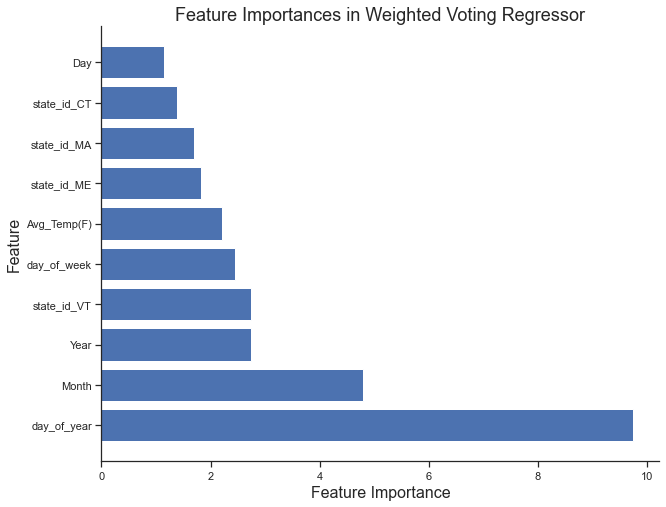

In [116]:
sns.set(rc={'figure.figsize':(10,8)})
sns.set_style("ticks")
fig, ax = plt.subplots()
plt.barh(feat_df['Feature'],
         feat_df['Feature Importance'])
plt.xlabel('Feature Importance', fontsize=16)
plt.ylabel('Feature', fontsize=16)
#ax.set_ylabel('Feature')
plt.title('Feature Importances in Weighted Voting Regressor', fontsize=18)
sns.despine()
plt.show()